# **DEM - Churn model**
### *ADVANCED ANALYTICS AI APPLICATIONS IN DIGITAL EXPERIENCE BUSINESS*

> #### **Purpose**

The purpose of this thesis is to identify patterns of churn and growth in the Digital Experience product usage data of Dynatrace. This could be patterns of technologies used, evolution of maturity of its adoption in customer based, etc. For this, various machine learning techniques will be explored to find the most appropriate method.



Keys: 

    - DT Account Key
    - SFDC Account ID
    - BAS Account ID


Account Attributes:

    - Deployment Type
    - Vertical
    - ARR Band
    - Geolocation
    - Country
    - Number of Employees


Churn Signals:

    - Usage (DEM Units)
        - Web, Mobile, Session Replay, Synthetic
    - # Apps -> Mobile + Web
    - Average Cost Control
    - # Synthetic Tests
    - # HTTP Checks


### Imports

In [828]:
import numpy as np
import pandas as pd
import math

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

from lightgbm import LGBMClassifier
import lightgbm as lgb
from catboost import CatBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
import xgboost as xgb
from sklearn.calibration import CalibratedClassifierCV
from sksurv.tree import SurvivalTree

from sklearn import metrics
from sklearn.metrics import (accuracy_score, average_precision_score, classification_report, confusion_matrix, 
                             ConfusionMatrixDisplay, f1_score, mean_absolute_error, mean_squared_error, 
                             precision_recall_curve, precision_score, r2_score, recall_score, roc_auc_score)

import snowflake.connector

from lifelines import KaplanMeierFitter, CoxPHFitter
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [829]:
from sksurv.ensemble import RandomSurvivalForest, GradientBoostingSurvivalAnalysis
from sentence_transformers import SentenceTransformer

## CONNECT SNOWFLAKE TO PYTHON

### QUERY

#### Usage

In [830]:
# SQL Query:

consumption_sql_query = '''
WITH main_dem_consumption AS (
	SELECT DATE_TRUNC('month', D.FULL_DATE)::date AS CONSUMPTION_DATE
	, da.DT_ACCOUNT_KEY
	, da.CUSTOMER_KEY
	, c.CUSTOMER_UUID
	, da.BAS_ACCOUNT_ID
	, NVL(SUM(CASE
		WHEN du.BAS_ID =-10 THEN fu.CONSUMPTION --DEM units web_sessions
	    WHEN du.BAS_ID IN (-21,-84) THEN fu.CONSUMPTION * 0.25 --RUM Web Sessions, WEB_SESSIONS
	END), 0) AS RUM__NOSR__WEB_DEM_TOTAL
	, NVL(SUM(CASE
		WHEN du.BAS_ID = -12 THEN fu.CONSUMPTION --DEM units mobile_sessions
		WHEN du.BAS_ID IN (-23,-85) THEN fu.CONSUMPTION * 0.25 --RUM Mobile Sessions, --MOBILE_SESSIONS
	END),0) AS RUM__NOSR__MOBILE_DEM_TOTAL
	, NVL(SUM(CASE
		WHEN du.BAS_ID IN (-10,-12) THEN fu.CONSUMPTION --DEM units mobile_sessions
		WHEN du.BAS_ID IN (-21,-84,-23,-85) THEN fu.CONSUMPTION * 0.25 --RUM Mobile Sessions, --MOBILE_SESSIONS
	END),0) AS RUM__NOSR_DEM_TOTAL
	, NVL(SUM(CASE WHEN du.BAS_ID IN (-13,-24,-87) THEN fu.CONSUMPTION * 0.75 END),0) AS RUM__SESSION_REPLAY__MOBILE_DEM_TOTAL --DEM units mobile_session_replays, RUM Mobile Session Replays, MOBILE_SESSION_REPLAYS
	, NVL(SUM(CASE WHEN du.BAS_ID IN (-11,-22,-86) THEN fu.CONSUMPTION * 0.75 END), 0) AS RUM__SESSION_REPLAY__WEB_DEM_TOTAL --DEM_units_web_session_replays, RUM Web Session Replays, WEB_SESSION_REPLAYS
	, NVL(SUM(CASE WHEN du.BAS_ID IN (-11,-22,-13,-24,-86,-87) THEN fu.CONSUMPTION * 0.75 END),0) as RUM__SESSION_REPLAY_DEM_TOTAL
	, NVL(SUM(CASE
		WHEN du.BAS_ID IN (-16,-27) THEN fu.CONSUMPTION_CONVERTED  --DEM units session_properties, RUM Session_Properties
		WHEN du.BAS_ID IN (-66) THEN fu.CONSUMPTION * 0.01 --USER_SESSION_PROPERTIES
	END),0) AS RUM__SESSION_PROPERTIES_DEM_TOTAL
	, NVL(SUM(CASE
		WHEN du.BAS_ID IN(-15,-26,-14,-25,-17,-28,-67)
		--DEM_units_browser_monitors, Synthetic Browser MONITORS, DEM_units_http_monitors, Synthetic HTTP MONITORS, DEM_units_external_checks
		--Synthetic external MONITORS, SYNTHETIC_MONITORING_BROWSER
			THEN fu.CONSUMPTION_CONVERTED
		WHEN du.BAS_ID IN(-68,-69) THEN fu.CONSUMPTION * 0.1 --SYNTHETIC_MONITORING_THIRD_PARTY, SYNTHETIC_MONITORING_HTTP
	END), 0) AS SYNTHETICS_DEM_TOTAL
	, NVL(SUM(CASE WHEN du.BAS_ID IN (-15,-26,-67) THEN fu.CONSUMPTION_CONVERTED END), 0) AS SYNTHETICS__BROWSER_MONITORS_DEM_TOTAL --DEM_units_browser_monitors, Synthetic Browser MONITORS,  SYNTHETIC_MONITORING_BROWSER
	, NVL(SUM(CASE
		WHEN du.bas_id IN (-14,-25) THEN fu.CONSUMPTION_CONVERTED --DEM_units_http_monitors, Synthetic HTTP MONITORS,
		WHEN du.BAS_ID IN (-69) THEN fu.CONSUMPTION * 0.1 --SYNTHETIC_MONITORING_THIRD_PARTY, SYNTHETIC_MONITORING_HTTP
	END), 0) AS SYNTHETICS__HTTP_MONITORS_DEM_TOTAL
	, NVL(SUM(CASE
		WHEN du.bas_id IN (-17,-28) THEN fu.CONSUMPTION_CONVERTED --  DEM_units_external_checks, Synthetic external MONITORS
		WHEN du.BAS_ID IN (-68) THEN fu.CONSUMPTION * 0.1 --SYNTHETIC_MONITORING_THIRD_PARTY, SYNTHETIC_MONITORING_HTTP
	END), 0) AS SYNTHETICS__EXTERNAL_CHECKS_DEM_TOTAL
	, NVL(SUM(CASE
		WHEN du.BAS_ID IN (-10,-12) THEN fu.CONSUMPTION --DEM units mobile_sessions
		WHEN du.BAS_ID IN (-21,-84,-23,-85) THEN fu.CONSUMPTION * 0.25 --RUM Mobile Sessions, --MOBILE_SESSIONS
		WHEN du.BAS_ID IN (-11,-22,-13,-24,-86,-87) THEN fu.CONSUMPTION * 0.75
		WHEN du.BAS_ID IN (-66) THEN fu.CONSUMPTION * 0.01 --USER_SESSION_PROPERTIES
		WHEN du.BAS_ID IN (-16,-27,-15,-26,-14,-25,-17,-28,-67) THEN fu.CONSUMPTION_CONVERTED
		WHEN du.BAS_ID IN (-68,-69) THEN fu.CONSUMPTION * 0.1
	END),0) AS DEM_DEM_TOTAL
	, NVL(SUM(CASE
		WHEN du.BAS_ID IN (-10,-12) THEN fu.CONSUMPTION --DEM units mobile_sessions
		WHEN du.BAS_ID IN (-21,-84,-23,-85) THEN fu.CONSUMPTION * 0.25 --RUM Mobile Sessions, --MOBILE_SESSIONS
		WHEN du.BAS_ID IN (-16,-27) THEN fu.CONSUMPTION_CONVERTED  --DEM units session_properties, RUM Session_Properties
		WHEN du.BAS_ID IN (-66) THEN fu.CONSUMPTION * 0.01 --USER_SESSION_PROPERTIES
		WHEN du.BAS_ID IN (-11,-22,-13,-24,-86,-87) THEN fu.CONSUMPTION * 0.75
	END),0) AS RUM_DEM_TOTAL
	, NVL(SUM(CASE
		WHEN du.BAS_ID =-10 THEN fu.CONSUMPTION --DEM units web_sessions
	    WHEN du.BAS_ID IN (-21,-84) THEN fu.CONSUMPTION * 0.25 --RUM Web Sessions, WEB_SESSIONS
	    WHEN du.BAS_ID IN (-11,-22,-86) THEN fu.CONSUMPTION * 0.75
	END), 0) AS WEB_DEM_TOTAL
	, NVL(SUM(CASE
		WHEN du.BAS_ID = -12 THEN fu.CONSUMPTION --DEM units mobile_sessions
		WHEN du.BAS_ID IN (-23,-85) THEN fu.CONSUMPTION * 0.25 --RUM Mobile Sessions, --MOBILE_SESSIONS
		WHEN du.BAS_ID IN (-13,-24,-87) THEN fu.CONSUMPTION * 0.75
	END),0) AS MOBILE_DEM_TOTAL
	--, RUM__NOSR_DEM_TOTAL+RUM__SESSION_PROPERTIES_DEM_TOTAL+SYNTHETICS_DEM_TOTAL+RUM__SESSION_REPLAY_DEM_TOTAL AS DEM_DEM_TOTAL
	--, RUM__NOSR_DEM_TOTAL+RUM__SESSION_PROPERTIES_DEM_TOTAL+RUM__SESSION_REPLAY_DEM_TOTAL AS RUM_DEM_TOTAL
	--, RUM__NOSR__WEB_DEM_TOTAL+RUM__SESSION_REPLAY__WEB_DEM_TOTAL AS WEB_DEM_TOTAL
	--, RUM__NOSR__MOBILE_DEM_TOTAL+RUM__SESSION_REPLAY__MOBILE_DEM_TOTAL AS MOBILE_DEM_TOTAL
	-- it contain extenral checks due TO MANAGE DATA limitation. (we could provode for SAAS if needed)
	FROM PROD_DB.BI_FULL.FACT_UNIFIED_CONSUMPTION fu
	INNER JOIN PROD_DB.BI_FULL.DIM_DT_ACCOUNT_CURRENT_ATTRIBUTES da ON fu.DT_ACCOUNT_KEY = da.DT_ACCOUNT_KEY
	INNER JOIN PROD_DB.BI_FULL.DIM_DATE d ON fu.DATE_KEY = D.DATE_KEY
	INNER JOIN PROD_DB.BI_FULL.DIM_USAGE_TYPE du ON fu.USAGE_TYPE_KEY = du.USAGE_TYPE_KEY
	LEFT JOIN PROD_DB.BI_FULL.DIM_CUSTOMER c ON da.CUSTOMER_KEY = c.CUSTOMER_KEY
	WHERE 1=1
		AND d.DATE_KEY >= EXTRACT(YEAR FROM DATEADD(month, -42, GETDATE())) * 10000 + EXTRACT(MONTH FROM DATEADD(month,-42, GETDATE()))*100+1
		AND du.BAS_ID IN (
			-10 --DEM units web_sessions
			, -11 --DEM_units_web_session_replays
			, -12 --DEM units mobile_sessions
			, -13 --DEM units mobile_session_replays
			, -14 --DEM_units_http_monitors
			, -15 --DEM_units_browser_monitors
			, -16 --DEM units session_properties
			, -17 --DEM_units_external_checks
			, -21 --RUM Web Sessions
			, -22 --RUM Web Session Replays
			, -23 --RUM Mobile Sessions
			, -24 --RUM Mobile Session Replays
			, -25 --Synthetic HTTP monitors
			, -26 --Synthetic Browser monitors
			, -27 --RUM Session_Properties
			, -28 --Synthetic external MONITORS
			, -64 --USER_SESSIONS --
			, -65 --USER_SESSION_REPLAYS --
			, -66 --USER_SESSION_PROPERTIES
			, -67 --SYNTHETIC_MONITORING_BROWSER
			, -68 --SYNTHETIC_MONITORING_THIRD_PARTY
			, -69 --SYNTHETIC_MONITORING_HTTP
			, -84 --WEB_SESSIONS
			, -85 --MOBILE_SESSIONS
			, -86 --WEB_SESSION_REPLAYS
			, -87 --MOBILE_SESSION_REPLAYS
		)
	AND fu.IS_PAID = TRUE
	GROUP BY 1,2,3, 4, 5
), DEMC AS (
	SELECT mc.CONSUMPTION_DATE
	, DATEADD(YEAR, 1, mc.CONSUMPTION_DATE) AS TECH_DATE
	, mc.CUSTOMER_KEY AS SFDC_ACCOUNT_KEY
	, mc.DT_ACCOUNT_KEY
	, mc.CUSTOMER_UUID
	, mc.BAS_ACCOUNT_ID
	, mc.RUM__NOSR__WEB_DEM_TOTAL AS RUM__NOSR__WEB_DEM_TOTAL
	, mc.RUM__NOSR__MOBILE_DEM_TOTAL AS RUM__NOSR__MOBILE_DEM_TOTAL
	, mc.RUM__NOSR_DEM_TOTAL AS RUM__NOSR_DEM_TOTAL
	, mc.RUM__SESSION_PROPERTIES_DEM_TOTAL AS RUM__SESSION_PROPERTIES_DEM_TOTAL
	, mc.RUM__SESSION_REPLAY__MOBILE_DEM_TOTAL AS RUM__SESSION_REPLAY__MOBILE_DEM_TOTAL
	, mc.RUM__SESSION_REPLAY__WEB_DEM_TOTAL AS RUM__SESSION_REPLAY__WEB_DEM_TOTAL
	, mc.RUM__SESSION_REPLAY_DEM_TOTAL AS RUM__SESSION_REPLAY_DEM_TOTAL
	, mc.SYNTHETICS_DEM_TOTAL AS SYNTHETICS_DEM_TOTAL
	, mc.SYNTHETICS__BROWSER_MONITORS_DEM_TOTAL AS SYNTHETICS__BROWSER_MONITORS_DEM_TOTAL
	, mc.SYNTHETICS__HTTP_MONITORS_DEM_TOTAL AS SYNTHETICS__HTTP_MONITORS_DEM_TOTAL
	, mc.SYNTHETICS__EXTERNAL_CHECKS_DEM_TOTAL AS SYNTHETICS__EXTERNAL_CHECKS_DEM_TOTAL
	, mc.DEM_DEM_TOTAL AS DEM_DEM_TOTAL
	, mc.RUM_DEM_TOTAL AS RUM_DEM_TOTAL
	, mc.WEB_DEM_TOTAL AS WEB_DEM_TOTAL
	, mc.MOBILE_DEM_TOTAL AS MOBILE_DEM_TOTAL
	--, DATE(FIRST_DATE_DEM_DT_ACCOUNT) AS FIRST_DATE_DEM_DT_ACCOUNT
	--, CASE WHEN mc.CONSUMPTION_DATE = fcd.FIRST_YEAR_QUARTER_DEM_DT_ACCOUNT THEN TRUE ELSE FALSE END AS IS_FIRST_QUARTER_DEM_DT_ACCOUNT
	--, DATE(FIRST_DATE_DEM_SFDC_ACCOUNT) AS FIRST_DATE_DEM_SFDC_ACCOUNT
	--, CASE WHEN mc.CONSUMPTION_DATE = fca.FIRST_YEAR_QUARTER_DEM_SFDC_ACCOUNT THEN TRUE ELSE FALSE END AS IS_FIRST_QUARTER_DEM_SFDC_ACCOUNT
	FROM MAIN_DEM_CONSUMPTION mc
	--LEFT JOIN FIRST_DEM_CONSUMPTION_DT_ACCOUNT fcd ON mc.DT_ACCOUNT_KEY = fcd.DT_ACCOUNT_KEY
	--LEFT JOIN FIRST_DEM_CONSUMPTION_SFDC_ACCOUNT fca ON mc.CUSTOMER_KEY = fca.CUSTOMER_KEY
	GROUP BY 1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21
	ORDER BY 2,3,1 ASC
), DEMC_CALC AS (
	SELECT demc.CONSUMPTION_DATE
	, demc.SFDC_ACCOUNT_KEY
	, demc.DT_ACCOUNT_KEY
	, demc.CUSTOMER_UUID
	, demc.BAS_ACCOUNT_ID
	, demc.RUM__NOSR__WEB_DEM_TOTAL
	, demc.RUM__SESSION_REPLAY_DEM_TOTAL
	, ROUND(NVL(LAG(demc.RUM__SESSION_REPLAY_DEM_TOTAL) OVER (PARTITION BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY ORDER BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY, demc.CONSUMPTION_DATE ASC), 0), 3) AS RUM__SESSION_REPLAY_DEM_TOTAL_PREVIOUS_PERIOD
	, ROUND(demc.RUM__SESSION_REPLAY_DEM_TOTAL - RUM__SESSION_REPLAY_DEM_TOTAL_PREVIOUS_PERIOD, 3) AS RUM__SESSION_REPLAY_DEM_TOTAL_PREVIOUS_PERIOD_DIFF
	, ROUND(NVL(LAG(demc.RUM__SESSION_REPLAY_DEM_TOTAL, 2) OVER (PARTITION BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY ORDER BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY, demc.CONSUMPTION_DATE ASC), 0), 3) AS RUM__SESSION_REPLAY_DEM_TOTAL_PREVIOUS_PERIOD_2
	, ROUND(RUM__SESSION_REPLAY_DEM_TOTAL_PREVIOUS_PERIOD - RUM__SESSION_REPLAY_DEM_TOTAL_PREVIOUS_PERIOD_2, 3) AS RUM__SESSION_REPLAY_DEM_TOTAL_PREVIOUS_PERIOD_2_DIFF
	, ROUND(NVL(demcp.RUM__SESSION_REPLAY_DEM_TOTAL, 0), 3) AS RUM__SESSION_REPLAY_DEM_TOTAL_PREV_YEAR_PERIOD
	, ROUND(NVL(LAG(RUM__SESSION_REPLAY_DEM_TOTAL_PREV_YEAR_PERIOD) OVER (PARTITION BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY ORDER BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY, demc.CONSUMPTION_DATE ASC), 0), 3) AS RUM__SESSION_REPLAY_DEM_TOTAL_PREV_YEAR_PERIOD_1
	, ROUND(RUM__SESSION_REPLAY_DEM_TOTAL_PREV_YEAR_PERIOD - RUM__SESSION_REPLAY_DEM_TOTAL_PREV_YEAR_PERIOD_1, 3) AS RUM__SESSION_REPLAY_DEM_TOTAL_PREV_YEAR_PERIOD_1_DIFF
	, ROUND(NVL(LAG(RUM__SESSION_REPLAY_DEM_TOTAL_PREV_YEAR_PERIOD, 2) OVER (PARTITION BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY ORDER BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY, demc.CONSUMPTION_DATE ASC), 0), 3) AS RUM__SESSION_REPLAY_DEM_TOTAL_PREV_YEAR_PERIOD_2
	, ROUND(RUM__SESSION_REPLAY_DEM_TOTAL_PREV_YEAR_PERIOD_1 - RUM__SESSION_REPLAY_DEM_TOTAL_PREV_YEAR_PERIOD_2, 3) AS RUM__SESSION_REPLAY_DEM_TOTAL_PREV_YEAR_PERIOD_2_DIFF
	, ROUND(demc.RUM__SESSION_REPLAY_DEM_TOTAL - NVL(demcp.RUM__SESSION_REPLAY_DEM_TOTAL, 0), 3) AS RUM__SESSION_REPLAY_DEM_TOTAL_YOY_PERIOD_DIFF
	, demc.SYNTHETICS_DEM_TOTAL
	, ROUND(NVL(LAG(demc.SYNTHETICS_DEM_TOTAL) OVER (PARTITION BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY ORDER BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY, demc.CONSUMPTION_DATE ASC), 0), 3) AS SYNTHETICS_DEM_TOTAL_PREVIOUS_PERIOD
	, ROUND(demc.SYNTHETICS_DEM_TOTAL - SYNTHETICS_DEM_TOTAL_PREVIOUS_PERIOD, 3) AS SYNTHETICS_DEM_TOTAL_PREVIOUS_PERIOD_DIFF
	, ROUND(NVL(LAG(demc.SYNTHETICS_DEM_TOTAL, 2) OVER (PARTITION BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY ORDER BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY, demc.CONSUMPTION_DATE ASC), 0), 3) AS SYNTHETICS_DEM_TOTAL_PREVIOUS_PERIOD_2
	, ROUND(SYNTHETICS_DEM_TOTAL_PREVIOUS_PERIOD - SYNTHETICS_DEM_TOTAL_PREVIOUS_PERIOD_2, 3) AS SYNTHETICS_DEM_TOTAL_PREVIOUS_PERIOD_2_DIFF
	, ROUND(NVL(demcp.SYNTHETICS_DEM_TOTAL, 0), 3) AS SYNTHETICS_DEM_TOTAL_PREV_YEAR_PERIOD
	, ROUND(NVL(LAG(SYNTHETICS_DEM_TOTAL_PREV_YEAR_PERIOD) OVER (PARTITION BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY ORDER BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY, demc.CONSUMPTION_DATE ASC), 0), 3) AS SYNTHETICS_DEM_TOTAL_PREV_YEAR_PERIOD_1
	, ROUND(SYNTHETICS_DEM_TOTAL_PREV_YEAR_PERIOD - SYNTHETICS_DEM_TOTAL_PREV_YEAR_PERIOD_1, 3) AS SYNTHETICS_DEM_TOTAL_PREV_YEAR_PERIOD_1_DIFF
	, ROUND(NVL(LAG(SYNTHETICS_DEM_TOTAL_PREV_YEAR_PERIOD, 2) OVER (PARTITION BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY ORDER BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY, demc.CONSUMPTION_DATE ASC), 0), 3) AS SYNTHETICS_DEM_TOTAL_PREV_YEAR_PERIOD_2
	, ROUND(SYNTHETICS_DEM_TOTAL_PREV_YEAR_PERIOD_1 - SYNTHETICS_DEM_TOTAL_PREV_YEAR_PERIOD_2, 3) AS SYNTHETICS_DEM_TOTAL_PREV_YEAR_PERIOD_2_DIFF
	, ROUND(demc.SYNTHETICS_DEM_TOTAL - NVL(demcp.SYNTHETICS_DEM_TOTAL, 0), 3) AS SYNTHETICS_DEM_TOTAL_YOY_PERIOD_DIFF
	, demc.DEM_DEM_TOTAL, 3
	, ROUND(NVL(LAG(demc.DEM_DEM_TOTAL) OVER (PARTITION BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY ORDER BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY, demc.CONSUMPTION_DATE ASC), 0), 3) AS DEM_DEM_TOTAL_PREVIOUS_PERIOD
	, ROUND(demc.DEM_DEM_TOTAL - DEM_DEM_TOTAL_PREVIOUS_PERIOD, 3) AS DEM_DEM_TOTAL_PREVIOUS_PERIOD_DIFF
	, ROUND(NVL(LAG(demc.DEM_DEM_TOTAL, 2) OVER (PARTITION BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY ORDER BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY, demc.CONSUMPTION_DATE ASC), 0), 3) AS DEM_DEM_TOTAL_PREVIOUS_PERIOD_2
	, ROUND(DEM_DEM_TOTAL_PREVIOUS_PERIOD - DEM_DEM_TOTAL_PREVIOUS_PERIOD_2, 3) AS DEM_DEM_TOTAL_PREVIOUS_PERIOD_2_DIFF
	, ROUND(NVL(demcp.DEM_DEM_TOTAL, 0), 3) AS DEM_DEM_TOTAL_PREV_YEAR_PERIOD
	, ROUND(NVL(LAG(DEM_DEM_TOTAL_PREV_YEAR_PERIOD) OVER (PARTITION BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY ORDER BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY, demc.CONSUMPTION_DATE ASC), 0), 3) AS DEM_DEM_TOTAL_PREV_YEAR_PERIOD_1
	, ROUND(DEM_DEM_TOTAL_PREV_YEAR_PERIOD - DEM_DEM_TOTAL_PREV_YEAR_PERIOD_1, 3) AS DEM_DEM_TOTAL_PREV_YEAR_PERIOD_1_DIFF
	, ROUND(NVL(LAG(DEM_DEM_TOTAL_PREV_YEAR_PERIOD, 2) OVER (PARTITION BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY ORDER BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY, demc.CONSUMPTION_DATE ASC), 0), 3) AS DEM_DEM_TOTAL_PREV_YEAR_PERIOD_2
	, ROUND(DEM_DEM_TOTAL_PREV_YEAR_PERIOD_1 - DEM_DEM_TOTAL_PREV_YEAR_PERIOD_2, 3) AS DEM_DEM_TOTAL_PREV_YEAR_PERIOD_2_DIFF
	, ROUND(demc.DEM_DEM_TOTAL - NVL(demcp.DEM_DEM_TOTAL, 0), 3) AS DEM_DEM_TOTAL_YOY_PERIOD_DIFF
	, demc.RUM_DEM_TOTAL
	, ROUND(NVL(LAG(demc.RUM_DEM_TOTAL) OVER (PARTITION BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY ORDER BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY, demc.CONSUMPTION_DATE ASC), 0), 3) AS RUM_DEM_TOTAL_PREVIOUS_PERIOD
	, ROUND(demc.RUM_DEM_TOTAL - RUM_DEM_TOTAL_PREVIOUS_PERIOD, 3) AS RUM_DEM_TOTAL_PREVIOUS_PERIOD_DIFF
	, ROUND(NVL(LAG(demc.RUM_DEM_TOTAL, 2) OVER (PARTITION BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY ORDER BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY, demc.CONSUMPTION_DATE ASC), 0), 3) AS RUM_DEM_TOTAL_PREVIOUS_PERIOD_2
	, ROUND(RUM_DEM_TOTAL_PREVIOUS_PERIOD - RUM_DEM_TOTAL_PREVIOUS_PERIOD_2, 3) AS RUM_DEM_TOTAL_PREVIOUS_PERIOD_2_DIFF
	, ROUND(NVL(demcp.RUM_DEM_TOTAL, 0), 3) AS RUM_DEM_TOTAL_PREV_YEAR_PERIOD
	, ROUND(NVL(LAG(RUM_DEM_TOTAL_PREV_YEAR_PERIOD) OVER (PARTITION BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY ORDER BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY, demc.CONSUMPTION_DATE ASC), 0), 3) AS RUM_DEM_TOTAL_PREV_YEAR_PERIOD_1
	, ROUND(RUM_DEM_TOTAL_PREV_YEAR_PERIOD - RUM_DEM_TOTAL_PREV_YEAR_PERIOD_1, 3) AS RUM_DEM_TOTAL_PREV_YEAR_PERIOD_1_DIFF
	, ROUND(NVL(LAG(RUM_DEM_TOTAL_PREV_YEAR_PERIOD, 2) OVER (PARTITION BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY ORDER BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY, demc.CONSUMPTION_DATE ASC), 0), 3) AS RUM_DEM_TOTAL_PREV_YEAR_PERIOD_2
	, ROUND(RUM_DEM_TOTAL_PREV_YEAR_PERIOD_1 - RUM_DEM_TOTAL_PREV_YEAR_PERIOD_2, 3) AS RUM_DEM_TOTAL_PREV_YEAR_PERIOD_2_DIFF
	, ROUND(demc.RUM_DEM_TOTAL - NVL(demcp.RUM_DEM_TOTAL, 0), 3) AS RUM_DEM_TOTAL_YOY_PERIOD_DIFF
	, demc.WEB_DEM_TOTAL, 3
	, ROUND(NVL(LAG(demc.WEB_DEM_TOTAL) OVER (PARTITION BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY ORDER BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY, demc.CONSUMPTION_DATE ASC), 0), 3) AS WEB_DEM_TOTAL_PREVIOUS_PERIOD
	, ROUND(demc.WEB_DEM_TOTAL - WEB_DEM_TOTAL_PREVIOUS_PERIOD, 3) AS WEB_DEM_TOTAL_PREVIOUS_PERIOD_DIFF
	, ROUND(NVL(LAG(demc.WEB_DEM_TOTAL, 2) OVER (PARTITION BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY ORDER BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY, demc.CONSUMPTION_DATE ASC), 0), 3) AS WEB_DEM_TOTAL_PREVIOUS_PERIOD_2
	, ROUND(WEB_DEM_TOTAL_PREVIOUS_PERIOD - WEB_DEM_TOTAL_PREVIOUS_PERIOD_2, 3) AS WEB_DEM_TOTAL_PREVIOUS_PERIOD_2_DIFF
	, ROUND(NVL(demcp.WEB_DEM_TOTAL, 0), 3) AS WEB_DEM_TOTAL_PREV_YEAR_PERIOD
	, ROUND(NVL(LAG(WEB_DEM_TOTAL_PREV_YEAR_PERIOD) OVER (PARTITION BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY ORDER BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY, demc.CONSUMPTION_DATE ASC), 0), 3) AS WEB_DEM_TOTAL_PREV_YEAR_PERIOD_1
	, ROUND(WEB_DEM_TOTAL_PREV_YEAR_PERIOD - WEB_DEM_TOTAL_PREV_YEAR_PERIOD_1, 3) AS WEB_DEM_TOTAL_PREV_YEAR_PERIOD_1_DIFF
	, ROUND(NVL(LAG(WEB_DEM_TOTAL_PREV_YEAR_PERIOD, 2) OVER (PARTITION BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY ORDER BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY, demc.CONSUMPTION_DATE ASC), 0), 3) AS WEB_DEM_TOTAL_PREV_YEAR_PERIOD_2
	, ROUND(WEB_DEM_TOTAL_PREV_YEAR_PERIOD_1 - WEB_DEM_TOTAL_PREV_YEAR_PERIOD_2 , 3)AS WEB_DEM_TOTAL_PREV_YEAR_PERIOD_2_DIFF
	, ROUND(demc.WEB_DEM_TOTAL - NVL(demcp.WEB_DEM_TOTAL, 0), 3) AS WEB_DEM_TOTAL_YOY_PERIOD_DIFF
	, demc.MOBILE_DEM_TOTAL
	, ROUND(NVL(LAG(demc.MOBILE_DEM_TOTAL) OVER (PARTITION BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY ORDER BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY, demc.CONSUMPTION_DATE ASC), 0), 3) AS MOBILE_DEM_TOTAL_PREVIOUS_PERIOD
	, ROUND(demc.MOBILE_DEM_TOTAL - MOBILE_DEM_TOTAL_PREVIOUS_PERIOD, 3) AS MOBILE_DEM_TOTAL_PREVIOUS_PERIOD_DIFF
	, ROUND(NVL(LAG(demc.MOBILE_DEM_TOTAL, 2) OVER (PARTITION BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY ORDER BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY, demc.CONSUMPTION_DATE ASC), 0), 3) AS MOBILE_DEM_TOTAL_PREVIOUS_PERIOD_2
	, ROUND(MOBILE_DEM_TOTAL_PREVIOUS_PERIOD - MOBILE_DEM_TOTAL_PREVIOUS_PERIOD_2, 3) AS MOBILE_DEM_TOTAL_PREVIOUS_PERIOD_2_DIFF
	, ROUND(NVL(demcp.MOBILE_DEM_TOTAL, 0), 3) AS MOBILE_DEM_TOTAL_PREV_YEAR_PERIOD
	, ROUND(NVL(LAG(MOBILE_DEM_TOTAL_PREV_YEAR_PERIOD) OVER (PARTITION BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY ORDER BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY, demc.CONSUMPTION_DATE ASC), 0), 3) AS MOBILE_DEM_TOTAL_PREV_YEAR_PERIOD_1
	, ROUND(MOBILE_DEM_TOTAL_PREV_YEAR_PERIOD - MOBILE_DEM_TOTAL_PREV_YEAR_PERIOD_1, 3) AS MOBILE_DEM_TOTAL_PREV_YEAR_PERIOD_1_DIFF
	, ROUND(NVL(LAG(MOBILE_DEM_TOTAL_PREV_YEAR_PERIOD, 2) OVER (PARTITION BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY ORDER BY demc.SFDC_ACCOUNT_KEY, demc.DT_ACCOUNT_KEY, demc.CONSUMPTION_DATE ASC), 0), 3) AS MOBILE_DEM_TOTAL_PREV_YEAR_PERIOD_2
	, ROUND(MOBILE_DEM_TOTAL_PREV_YEAR_PERIOD_1 - MOBILE_DEM_TOTAL_PREV_YEAR_PERIOD_2, 3) AS MOBILE_DEM_TOTAL_PREV_YEAR_PERIOD_2_DIFF
	, ROUND(demc.MOBILE_DEM_TOTAL - NVL(demcp.MOBILE_DEM_TOTAL, 0), 3) AS MOBILE_DEM_TOTAL_YOY_PERIOD_DIFF
	FROM DEMC demc
	LEFT JOIN DEMC demcp
		ON demc.DT_ACCOUNT_KEY = demcp.DT_ACCOUNT_KEY
		AND demc.SFDC_ACCOUNT_KEY = demcp.SFDC_ACCOUNT_KEY
		AND demc.CONSUMPTION_DATE = demcp.TECH_DATE
	WHERE 1=1
	--AND demc.CONSUMPTION_DATE = '2023-04-01'

), APPS_CAPTURE_RATES AS (
SELECT rc.CONFIG_DATE
	, rc.CONFIG_DATE_NUMERIC
	, rc.DT_ACCOUNT_KEY
	, MAX(CR_SESSION_REPLAY_ENABLED) AS SESSION_REPLAY_ENABLED
	, NVL(COUNT(DISTINCT CASE WHEN rc.APPLICATION_LIKE_TYPE IN ('Web') THEN rc.APPLICATION_KEY END), 0) AS APPS_WEB
	, NVL(COUNT(DISTINCT CASE WHEN rc.APPLICATION_LIKE_TYPE IN ('Mobile') THEN rc.APPLICATION_KEY END), 0) AS APPS_MOBILE
	, NVL(COUNT(DISTINCT rc.APPLICATION_KEY), 0) AS APPS_ALL
	, NVL(MAX(rc.SESSION_REPLAY_COST_CONTROL_PERCENTAGE), 0) AS APPS_ALL__SR_COST_CONTROL_MAX
	, NVL(AVG(CASE WHEN rc.APPLICATION_LIKE_TYPE IN ('Web') THEN rc.SESSION_REPLAY_COST_CONTROL_PERCENTAGE END), 0) AS APPS_WEB__SR_COST_CONTROL_AVG
	, NVL(AVG(CASE WHEN rc.APPLICATION_LIKE_TYPE IN ('Mobile') THEN rc.SESSION_REPLAY_COST_CONTROL_PERCENTAGE END), 0) AS APPS_MOBILE__SR_COST_CONTROL_AVG
	, NVL(AVG(rc.SESSION_REPLAY_COST_CONTROL_PERCENTAGE), 0) AS APPS_ALL__SR_COST_CONTROL_AVG
	FROM (
		SELECT DATE_TRUNC('month', uem."TIMESTAMP")::date AS CONFIG_DATE
		, D.DATE_KEY AS CONFIG_DATE_NUMERIC
		, env.DT_ACCOUNT_KEY
		, uem.UEM_ENABLED
		, CASE
			WHEN uem.SESSION_REPLAY_ENABLED = TRUE THEN 1
			WHEN uem.SESSION_REPLAY_ENABLED = FALSE THEN 0
			ELSE -1
		END AS CR_SESSION_REPLAY_ENABLED
		, uem.COST_CONTROL_PERCENTAGE
		, uem.SESSION_REPLAY_COST_CONTROL_PERCENTAGE
		, app.APPLICATION_KEY
		, app.APPLICATION_LIKE_TYPE
		FROM PROD_DB.RAW_CLEAN.CDH_UEM_CONFIG_HISTORY uem
		INNER JOIN PROD_DB.REPORTS_FULL.CDH_ENVIRONMENT_RAW env ON uem.CLUSTER_UUID = env.CLUSTER_UUID AND uem.TENANT_UUID = env.ENVIRONMENT_UUID
		INNER JOIN PROD_DB.BI_FULL.DIM_APPLICATION app ON env.ENVIRONMENT_KEY  = app.ENVIRONMENT_KEY AND uem.APPLICATION_ID  = app.APPLICATION_UUID
		INNER JOIN PROD_DB.BI_FULL.DIM_DATE d ON DATE_TRUNC('month', uem."TIMESTAMP")::date = D.FULL_DATE
		WHERE 1=1
			AND d.DATE_KEY >= EXTRACT(YEAR FROM DATEADD(month, -42, GETDATE())) * 10000 + EXTRACT(MONTH FROM DATEADD(month,-42, GETDATE()))*100+1
		GROUP BY 1,2,3,4,5,6,7,8,9--,10,11
	) rc
	GROUP BY 1,2,3

),SYNTHETIC_MONITOR_HISTORY AS (
	SELECT DATE(DATE_TRUNC('month', C."TIMESTAMP")) AS SNAPSHOT_DATE
	, E.DT_ACCOUNT_KEY
	, cus.CUSTOMER_KEY
 	, COUNT(DISTINCT CASE WHEN C.ENTITY_ID LIKE '%SYNTHETIC_TEST%' THEN C.ENTITY_ID END) AS SYNTHETIC_TESTS
 	, COUNT(DISTINCT CASE WHEN C.ENTITY_ID LIKE '%HTTP_CHECK%' THEN C.ENTITY_ID END) AS HTTP_CHECK

	FROM PROD_DB.RAW_CLEAN.CDH_SYNTHETIC_MONITOR_HISTORY C
	INNER JOIN PROD_DB.REPORTS_FULL.CDH_ENVIRONMENT_RAW E
		ON C.TENANT_UUID = E.ENVIRONMENT_UUID
		AND C.CLUSTER_UUID = E.CLUSTER_UUID
	LEFT JOIN PROD_DB.BI_FULL.DIM_CUSTOMER cus ON E.CUSTOMER_ID = cus.CUSTOMER_UUID
	WHERE 1=1
		AND E.CDH_ENVIRONMENT_IS_PAYING = 'TRUE'
		AND E.CDH_ENVIRONMENT_IS_INTERNAL = 'FALSE'
		AND C."TYPE" IN ('BROWSER', 'HTTP', 'EXTERNAL','CLASSIC')
	GROUP BY 1,2,3
)
SELECT dc.CONSUMPTION_DATE AS "Consumption Date (Monthly)"
, dc.DT_ACCOUNT_KEY AS "DT Account Key"
, dc.CUSTOMER_UUID AS "SFDC Account ID"
, dc.BAS_ACCOUNT_ID AS "BAS Account ID"

--, ROUND(cr.APPS_ALL,3) AS "All Apps"
--, ROUND(cr.APPS_ALL__SR_COST_CONTROL_AVG,3) AS "All apps - Avg Cost Control"
--, ROUND(cr.APPS_WEB ,3)AS "Web Apps"
--, ROUND(cr.APPS_WEB__SR_COST_CONTROL_AVG,3) AS "Web apps - Avg Cost Control"
--, ROUND(cr.APPS_MOBILE,3) AS "Mobile Apps"
--, ROUND(cr.APPS_MOBILE__SR_COST_CONTROL_AVG,3) AS "Mobile apps - Avg Cost Control"
--, ROUND(cr.SESSION_REPLAY_ENABLED,3) AS "Is Session Replay Enabeld"

, ss.SYNTHETIC_TESTS
, ss.HTTP_CHECK

, ROUND(dc.DEM_DEM_TOTAL, 3) AS "DEM Units - DEM Total (Monthly)"
, DEM_DEM_TOTAL_PREVIOUS_PERIOD AS "DEM Units - DEM Total (Monthly - Previous Month)"
, DEM_DEM_TOTAL_PREVIOUS_PERIOD_2 AS "DEM Units - DEM Total (Monthly - Previous 2 Month)"
, DEM_DEM_TOTAL_PREVIOUS_PERIOD_DIFF AS "DEM Units - DEM Total (Monthly - Previous Month Difference)"
, DEM_DEM_TOTAL_PREV_YEAR_PERIOD AS "DEM Units - DEM Total (Monthly - Previous Year)"
, DEM_DEM_TOTAL_PREV_YEAR_PERIOD_1_DIFF AS "DEM Units - DEM Total (Monthly - Previous Year Difference)"

, ROUND(dc.RUM__SESSION_REPLAY_DEM_TOTAL, 3) AS "DEM Units - Session Replay Total (Monthly)"
, RUM__SESSION_REPLAY_DEM_TOTAL_PREVIOUS_PERIOD AS "DEM Units - Session Replay Total (Monthly - Previous Month)"
, RUM__SESSION_REPLAY_DEM_TOTAL_PREVIOUS_PERIOD_2 AS "DEM Units - Session Replay Total (Monthly - Previous 2 Month)"
, RUM__SESSION_REPLAY_DEM_TOTAL_PREVIOUS_PERIOD_DIFF AS "DEM Units - Session Replay Total (Monthly - Previous Month Difference)"
, RUM__SESSION_REPLAY_DEM_TOTAL_PREV_YEAR_PERIOD AS "DEM Units - Session Replay Total (Monthly - Previous Year)"
, RUM__SESSION_REPLAY_DEM_TOTAL_PREV_YEAR_PERIOD_1_DIFF AS "DEM Units - Session Replay Total (Monthly - Previous Year Difference)"

, ROUND(dc.SYNTHETICS_DEM_TOTAL, 3) AS "DEM Units - Synthetics Total (Monthly)"
, SYNTHETICS_DEM_TOTAL_PREVIOUS_PERIOD AS "DEM Units - Synthetics Total (Monthly - Previous Month)"
, SYNTHETICS_DEM_TOTAL_PREVIOUS_PERIOD_2 AS "DEM Units - Synthetics Total (Monthly - Previous 2 Month)"
, SYNTHETICS_DEM_TOTAL_PREVIOUS_PERIOD_DIFF AS "DEM Units - Synthetics Total (Monthly - Previous Month Difference)"
, SYNTHETICS_DEM_TOTAL_PREV_YEAR_PERIOD AS "DEM Units - Synthetics Total (Monthly - Previous Year)"
, SYNTHETICS_DEM_TOTAL_PREV_YEAR_PERIOD_1_DIFF AS "DEM Units - Synthetics Total (Monthly - Previous Year Difference)"

, ROUND(dc.WEB_DEM_TOTAL,3) AS "DEM Units - Web Total (Monthly)"
, WEB_DEM_TOTAL_PREVIOUS_PERIOD AS "DEM Units - Web Total (Monthly - Previous Month)"
, WEB_DEM_TOTAL_PREVIOUS_PERIOD_2 AS "DEM Units - Web Total (Monthly - Previous 2 Month)"
, WEB_DEM_TOTAL_PREVIOUS_PERIOD_DIFF AS "DEM Units - Web Total (Monthly - Previous Month Difference)"
, WEB_DEM_TOTAL_PREV_YEAR_PERIOD AS "DEM Units - Web Total (Monthly - Previous Year)"
, WEB_DEM_TOTAL_PREV_YEAR_PERIOD_1_DIFF AS "DEM Units - Web Total (Monthly - Previous Year Difference)"

, ROUND(dc.MOBILE_DEM_TOTAL, 3) AS "DEM Units - Mobile Total (Monthly)"
, MOBILE_DEM_TOTAL_PREVIOUS_PERIOD AS "DEM Units - Mobile Total (Monthly - Previous Month)"
, MOBILE_DEM_TOTAL_PREVIOUS_PERIOD_2 AS "DEM Units - Mobile Total (Monthly - Previous 2 Month)"
, MOBILE_DEM_TOTAL_PREVIOUS_PERIOD_DIFF AS "DEM Units - Mobile Total (Monthly - Previous Month Difference)"
, MOBILE_DEM_TOTAL_PREV_YEAR_PERIOD AS "DEM Units - Mobile Total (Monthly - Previous Year)"
, MOBILE_DEM_TOTAL_PREV_YEAR_PERIOD_1_DIFF AS "DEM Units - Mobile Total (Monthly - Previous Year Difference)"


FROM DEMC_CALC dc
INNER JOIN PROD_DB.BI_FULL.DIM_DATE dd ON dc.CONSUMPTION_DATE = dd.FULL_DATE
LEFT JOIN APPS_CAPTURE_RATES cr ON dc.CONSUMPTION_DATE = cr.CONFIG_DATE AND dc.DT_ACCOUNT_KEY = cr.DT_ACCOUNT_KEY
LEFT JOIN SYNTHETIC_MONITOR_HISTORY ss ON dc.CONSUMPTION_DATE = ss.SNAPSHOT_DATE AND dc.DT_ACCOUNT_KEY = ss.DT_ACCOUNT_KEY
LEFT JOIN BI_FULL.FACT_APPLICATION_COMPETITOR_FRAMEWORKS frame ON dc.CONSUMPTION_DATE = frame.CAPTURED_AT AND dc.DT_ACCOUNT_KEY = frame.DT_ACCOUNT_KEY
GROUP BY 1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34, 35, 36--, 37, 38, 39, 40, 41, 42, 43
ORDER BY 1
'''


#### Customer Information

In [831]:

customer_atrributes_sql_query = '''
SELECT dt.DT_ACCOUNT_KEY AS c_dt_account_key
, dt.BAS_ACCOUNT_ID AS c_bas_account_id
, dt.ACCOUNT_COMPANY_NAME AS c_dt_company_name
, dt.IS_PAYING AS c_dt_is_paying
, CASE
	WHEN da.IS_MANAGED = TRUE THEN 'Managed'
	WHEN da.IS_MANAGED = FALSE THEN 'SaaS'
END AS c_dt_is_managed
, da.IS_INTERNAL AS c_dt_is_internal
, DATE(da.CONVERT_TO_PAID_AT) AS c_dt_convert_to_paid_date
, c.CUSTOMER_KEY AS c_customer_key
, c.CUSTOMER_UUID AS c_sfdc_account_id
, c.CUSTOMER_NAME AS c_sfdc_account_name
, c.GLOBAL_NAME AS c_sfdc_global_name
, c.CUSTOMER_TYPE AS c_sfdc_customer_type
, c.CURRENT_STATUS AS c_sfdc_account_status
, CASE
WHEN NVL(sac.ANNUAL_REVENUE , 0)=0 THEN '-1 - Unknown'
	WHEN sac.ANNUAL_REVENUE >=1 AND sac.ANNUAL_REVENUE < 2000000 THEN '0 - Very Small (<$2M)'
	WHEN sac.ANNUAL_REVENUE >=2000000 AND sac.ANNUAL_REVENUE < 10000000 THEN '1 - Small ($2M-$10M)'
	WHEN sac.ANNUAL_REVENUE >=10000000 AND sac.ANNUAL_REVENUE < 50000000 THEN '2 - Medium ($10M-$50M)'
	WHEN sac.ANNUAL_REVENUE >=50000000 AND sac.ANNUAL_REVENUE < 10000000000 THEN '3 - Large ($50M-$10B)'
	WHEN sac.ANNUAL_REVENUE >=10000000000 AND sac.ANNUAL_REVENUE < 1000000000000 THEN '4 - Massive ($10B-$1T)'
	WHEN sac.ANNUAL_REVENUE >=1000000000000 THEN '5 - Behemoth (>$1T)'
END AS c_sfdc_annual_revenue
, CASE
	WHEN NVL(sac.NUMBER_EMPLOYEES, 0)=0 THEN '-1 - Unknown'
	WHEN sac.NUMBER_EMPLOYEES >=1 AND sac.NUMBER_EMPLOYEES < 100 THEN '0 - Very Small (<100)'
	WHEN sac.NUMBER_EMPLOYEES >=100 AND sac.NUMBER_EMPLOYEES < 1000 THEN '1 - Small (100-1,000)'
	WHEN sac.NUMBER_EMPLOYEES >=1000 AND sac.NUMBER_EMPLOYEES < 10000 THEN '2 - Medium (1,000-100,00)'
	WHEN sac.NUMBER_EMPLOYEES >=10000 AND sac.NUMBER_EMPLOYEES < 100000 THEN '3 - Large (10,000-100,000)'
	WHEN sac.NUMBER_EMPLOYEES >=100000 AND sac.NUMBER_EMPLOYEES < 1000000 THEN '4 - Massive (100,000-1,000,000)'
	WHEN sac.NUMBER_EMPLOYEES >=10000000 THEN '5 - Behemoth (>1,000,000)'
END AS c_sfdc_number_of_employees
, c.GEOGRAPHY AS c_sfdc_geo
, c.COUNTRY as c_sfdc_country
, COALESCE(c.VERTICAL, 'N/A') AS c_sfdc_vertical
, c.PRODUCT_SPECIALIST_EMAIL AS c_email_product_spec
, c.PRIMARY_CSM_EMAIL AS c_email_primary_csm
, c.DT1_PREMIUM_CSM_EMAIL AS c_email_dt1_premium_csm
, c.OWNER_EMAIL AS c_email_account_exec
, c.ARR_BAND AS c_arr_band
FROM PROD_DB.BI_FULL.DIM_DT_ACCOUNT dt
LEFT JOIN PROD_DB.BI_FULL.DIM_DT_ACCOUNT_CURRENT_ATTRIBUTES da ON dt.DT_ACCOUNT_KEY = da.DT_ACCOUNT_KEY
LEFT JOIN PROD_DB.BI_FULL.DIM_CUSTOMER c ON dt.CUSTOMER_KEY = c.CUSTOMER_KEY
LEFT JOIN PROD_DB.RAW_CLEAN.SFDC_ACCOUNT sac ON c.CUSTOMER_UUID = sac.ID
--LEFT JOIN PROD_DB.BI.FACT_UNIFIED_CONSUMPTION fu ON dt.DT_ACCOUNT_KEY  = fu.DT_ACCOUNT_KEY
WHERE 1=1
	--AND fu.IS_PAID = TRUE
	AND da.IS_INTERNAL = FALSE
GROUP BY 1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
HAVING c.CUSTOMER_NAME IS NOT NULL -- FILTER TO customers associated WITH a SalesForce Account
'''



additional_attributes_sql_quey = '''
SELECT cus.CUSTOMER_KEY AS SFDC_ACCOUNT_KEY
, ooo.ACCOUNT_ID AS SFDC_ACCOUNT_ID
, ops.CONTRACT_VALID_DATE AS CONTRACT_VALID_DATE
, SFDC_ACCOUNT_KEY||CONTRACT_VALID_DATE AS SFDC_ATTRS_ACCOUNT_DATE_KEY
, ooo.REPEAT_TYPE AS SFDC_CUSTOMER_REPEAT_TYPE
, ooo."TYPE" AS SFDC_OPPORTUNITY_TYPE
, pr.LICENSE_MODEL AS SFDC_LICENSE_MODEL
, DATE(ooo.CONTRACT_START) AS CONTRACT_START
, DATE(ooo.CONTRACT_END) AS CONTRACT_END
, MAX(CASE WHEN pr.PRODUCT_FAMILY IN ('Dynatrace Platform Subscription') THEN 1 ELSE 0 END) AS DPS_SUBSCRIPTION
, MAX(CASE WHEN pr.PRODUCT_FAMILY IN ('Dynatrace DEM') AND pr.PRODUCT_CATEGORY = 'Insights' THEN TRUE ELSE FALSE END) AS INSIGHTS_SERVICES
FROM (
	SELECT opp.ID AS ID
	, ddd.CONTRACT_VALID_DATE AS CONTRACT_VALID_DATE
	, LAST_DAY(ddd.CONTRACT_VALID_DATE, 'month') AS DATE_MONTH_END
	FROM (
		SELECT ID
		FROM PROD_DB.RAW_CLEAN.SFDC_OPPORTUNITY
		WHERE 1=1
			AND "TYPE" NOT IN ('Swap')
			AND IS_WON = TRUE
		GROUP BY 1
	) opp
	CROSS JOIN (
		SELECT DATE_TRUNC('month', dd.FULL_DATE) AS CONTRACT_VALID_DATE
		FROM PROD_DB.BI_FULL.DIM_DATE dd
		WHERE 1=1
			AND FULL_DATE >= '2021-01-01'
			AND FULL_DATE <= CURRENT_DATE
		GROUP BY 1
	) ddd
) ops
INNER JOIN PROD_DB.RAW_CLEAN.SFDC_OPPORTUNITY ooo
	ON ops.ID = ooo.ID
	AND ooo.CONTRACT_START <= ops.DATE_MONTH_END
	AND ooo.CONTRACT_END >= ops.CONTRACT_VALID_DATE
INNER JOIN PROD_DB.RAW_CLEAN.SFDC_OPPORTUNITY_PRODUCT pr ON ooo.ID = pr.OPPORTUNITY_ID
INNER JOIN PROD_DB.BI_FULL.DIM_CUSTOMER cus ON ooo.ACCOUNT_ID = cus.CUSTOMER_UUID
WHERE 1=1
GROUP BY 1,2,3,4,5,6,7,8,9
'''


#### Apps & Capture rates

In [832]:

app = '''
WITH app_config AS (
	SELECT da.CUSTOMER_KEY AS SFDC_ACCOUNT_KEY
	, da.DT_ACCOUNT_KEY
	, COALESCE(ba.IDM_UUID, bma.ACCOUNT_UUID) AS BAS_ACCOUNT_UUID
	, uch.TENANT_UUID
	, uch.CLUSTER_UUID
	, DATE_TRUNC('month', uch.TIMESTAMP)::date AS CONFIG_DATE
	, MAX(uch.UEM_ENABLED) AS UEM_ENABLED
	, MAX(uch.SESSION_REPLAY_ENABLED) AS SESSION_REPLAY_ENABLED
	, NVL(AVG(uch.SESSION_REPLAY_COST_CONTROL_PERCENTAGE), 0) AS COST_CONTROL_PERCANTAGE_SESSION_REPLAY
	, NVL(COUNT(DISTINCT CASE WHEN uch.SESSION_REPLAY_ENABLED = 1 THEN uch.APPLICATION_ID END), 0 ) AS APPS_SESSION_REPLAY
	, NVL(COUNT(DISTINCT CASE WHEN uch.APPLICATION_ID LIKE '%MOBILE%' THEN uch.APPLICATION_ID END), 0 ) AS APPS_MOBILE
	, NVL(COUNT(DISTINCT CASE WHEN uch.APPLICATION_ID NOT LIKE '%MOBILE%' THEN uch.APPLICATION_ID END),0 )  AS WEB_APPS
	, NVL(AVG(CASE WHEN uch.APPLICATION_ID LIKE '%MOBILE%' THEN uch.COST_CONTROL_PERCENTAGE END),0 ) AS COST_CONTROL_PERCENTAGE_APPS_MOBILE
	, NVL(AVG(CASE WHEN uch.APPLICATION_ID NOT LIKE '%MOBILE%' THEN uch.COST_CONTROL_PERCENTAGE END),0 ) AS COST_CONTROL_PERCENTAGE_WEB_APPS

	FROM PROD_DB.RAW_CLEAN.CDH_UEM_CONFIG_HISTORY uch
	LEFT JOIN PROD_DB.RAW_CLEAN.MC_MANAGED_CLUSTER mmc
		ON uch.CLUSTER_TYPE = 'MANAGED'
		AND uch.CLUSTER_UUID = mmc.CLUSTER_UUID
	LEFT JOIN PROD_DB.RAW_CLEAN.MC_ACCOUNT bma
		ON mmc.ACCOUNT_UUID = bma.ACCOUNT_UUID
	LEFT JOIN PROD_DB.RAW_CLEAN.BAS_TENANT bt
		ON uch.CLUSTER_TYPE = 'SAAS'
		AND uch.CLUSTER_UUID = bt.CLUSTER_ID
		AND uch.TENANT_UUID = bt.TENANT_UUID
	LEFT JOIN PROD_DB.RAW_CLEAN.BAS_ACCOUNT ba
		ON bt.ACCOUNT_ID = ba.ID
	LEFT JOIN PROD_DB.BI_FULL.DIM_DT_ACCOUNT_CURRENT_ATTRIBUTES da ON
		COALESCE(bma.ACCOUNT_UUID, ba.IDM_UUID) = da.DT_ACCOUNT_UUID
		AND da.BAS_ACCOUNT_ID IS NOT NULL
	WHERE 1=1
		AND uch."TIMESTAMP" >= DATEADD(MONTH, -42, DATE_TRUNC('month', CURRENT_DATE()))
		AND uch."TIMESTAMP" < CURRENT_DATE()
		AND COALESCE(ba.IS_INTERNAL, bma.INTERNAL) = 0
	GROUP BY 1,2,3,4,5,6

), app_usage_raw AS (
	SELECT DATE_TRUNC('month', fab.CAPTURED_AT)::date AS CAPTURED_AT
	, dda.CUSTOMER_KEY AS SFDC_ACCOUNT_KEY
	, fab.DATE_KEY
	, fab.DT_ACCOUNT_KEY
	, dda.DT_ACCOUNT_UUID
	, dc.CLUSTER_UUID
	, de.ENVIRONMENT_UUID

	, NVL(COUNT(DISTINCT CASE WHEN da.APPLICATION_UUID LIKE '%MOBILE%' THEN da.APPLICATION_UUID END),0 ) AS APPS_MOBILE
	, NVL(COUNT(DISTINCT CASE WHEN da.APPLICATION_UUID NOT LIKE '%MOBILE%' THEN da.APPLICATION_UUID END),0 ) AS WEB_APPS
	, NVL(SUM(CASE WHEN fab.METRIC_ID = 'builtin:billing.apps.web.sessionsWithoutReplayByApplication' THEN fab.VALUE END),0 ) AS RUM_SESSIONS_WEB
	, NVL(SUM(CASE WHEN fab.METRIC_ID = 'builtin:billing.apps.mobile.sessionsWithoutReplayByApplication' THEN fab.VALUE END),0 ) AS RUM_SESSIONS_MOBILE
	, NVL(SUM(CASE WHEN fab.METRIC_ID = 'builtin:billing.apps.web.sessionsWithReplayByApplication'
	                OR fab.METRIC_ID = 'builtin:billing.apps.mobile.sessionsWithReplayByApplication' THEN fab.VALUE END),0 ) AS SESSIONS_SESSION_REPLAY

	FROM PROD_DB.BI_FULL.FACT_APPLICATION_BILLING fab
	INNER JOIN PROD_DB.BI_FULL.DIM_DT_ACCOUNT dda USING (DT_ACCOUNT_KEY)
	INNER JOIN PROD_DB.BI_FULL.DIM_CLUSTER dc USING (CLUSTER_KEY)
	INNER JOIN PROD_DB.BI_FULL.DIM_ENVIRONMENT de USING (ENVIRONMENT_KEY)
	INNER JOIN PROD_DB.BI_FULL.DIM_APPLICATION da USING (APPLICATION_KEY)
	WHERE 1=1
		AND fab.METRIC_ID IN ('builtin:billing.apps.web.sessionsWithoutReplayByApplication','builtin:billing.apps.web.sessionsWithReplayByApplication', 'builtin:billing.apps.mobile.sessionsWithoutReplayByApplication','builtin:billing.apps.mobile.sessionsWithReplayByApplication')
		AND fab.IS_BILLED = 1
		AND fab.CAPTURED_AT >= DATEADD(MONTH, -42, DATE_TRUNC(MONTH, CURRENT_DATE()))
		AND fab.CAPTURED_AT < CURRENT_DATE()
	GROUP BY 1,2,3,4,5,6,7
)
SELECT DISTINCT ac.DT_ACCOUNT_KEY
, ac.BAS_ACCOUNT_UUID
, ac.TENANT_UUID
, ac.CLUSTER_UUID
, ac.CONFIG_DATE AS RATES_DATE
, ac.APPS_MOBILE
, ac.COST_CONTROL_PERCENTAGE_APPS_MOBILE
, au.RUM_SESSIONS_MOBILE
, ac.WEB_APPS
, ac.COST_CONTROL_PERCENTAGE_WEB_APPS
, au.RUM_SESSIONS_WEB
, ac.UEM_ENABLED
, ac.SESSION_REPLAY_ENABLED
, ac.APPS_SESSION_REPLAY
, ac.COST_CONTROL_PERCANTAGE_SESSION_REPLAY
, au.SESSIONS_SESSION_REPLAY

FROM app_config ac
LEFT JOIN PROD_DB.BI_FULL.DIM_DATE dd
	ON ac.CONFIG_DATE = dd.FULL_DATE
LEFT JOIN app_usage_raw au
	ON ac.DT_ACCOUNT_KEY = au.DT_ACCOUNT_KEY
	AND ac.CLUSTER_UUID = au.CLUSTER_UUID
	AND ac.TENANT_UUID  = au.ENVIRONMENT_UUID
	AND ac.CONFIG_DATE  = au.CAPTURED_AT
WHERE 1=1
ORDER BY BAS_ACCOUNT_UUID, CLUSTER_UUID, TENANT_UUID, RATES_DATE DESC


'''

#### Framework

In [833]:

framework = '''

WITH PERIODS AS (
	SELECT DATE_KEY
	, FULL_DATE
	FROM PROD_DB.BI_FULL.DIM_DATE
	WHERE 1=1
		--AND DAY_OF_MONTH = 1
		AND FULL_DATE >= DATE_TRUNC(MONTH, DATEADD(MONTH, -42, CURRENT_DATE()))
		AND FULL_DATE < DATE_TRUNC(MONTH, CURRENT_DATE())
), TENANTS AS (
    SELECT de.ENVIRONMENT_UUID AS t_TENANT_UUID
    , dc.CLUSTER_UUID AS t_CLUSTER_UUID
    , de.DT_ACCOUNT_KEY AS t_DT_ACCOUNT_KEY
    , de.ENVIRONMENT_KEY AS t_TENANT_KEY
    , de.CLUSTER_KEY AS t_CLUSTER_KEY
    , DATE(dea.VALID_FROM) AS t_VALID_FROM_date
    , IFF(dea.PAYING = TRUE, 1, 0) AS t_is_paying_tenant
    , IFF(dea.INTERNAL = TRUE, 1, 0) AS t_is_internal_tenant
    FROM BI_FULL.DIM_ENVIRONMENT de
    INNER JOIN BI_FULL.DIM_ENVIRONMENT_ATTRIBUTES dea
    	ON de.ENVIRONMENT_KEY = dea.ENVIRONMENT_KEY
    LEFT JOIN BI_FULL.DIM_CLUSTER dc
        ON de.CLUSTER_KEY = dc.CLUSTER_KEY
    WHERE dea.VALID_TO IS NULL -- active tenants
    GROUP BY 1,2,3,4,5,6,7,8
)
SELECT DATE(DATE_TRUNC(MONTH, pe.FULL_DATE)) AS date_month
--, ac.SFDC_ACCOUNT_ID
, ac.BAS_ACCOUNT_ID
, ac.DT_ACCOUNT_KEY
, COUNT( DISTINCT cm.FRAMEWORK) as FRAMEWORK

FROM BI_FULL.FACT_APPLICATION_COMPETITOR_FRAMEWORKS cm
LEFT JOIN PERIODS pe
	ON cm.DATE_KEY = pe.DATE_KEY
LEFT JOIN PROD_DB.BI_FULL.DIM_DT_ACCOUNT_CURRENT_ATTRIBUTES ac
	ON cm.DT_ACCOUNT_KEY = ac.DT_ACCOUNT_KEY
LEFT JOIN PROD_DB.BI_FULL.DIM_APPLICATION ap
	ON cm.APPLICATION_KEY = ap.APPLICATION_KEY
LEFT JOIN TENANTS tn
	ON cm.ENVIRONMENT_KEY = tn.t_TENANT_KEY
WHERE 1=1
	AND DATE_TRUNC(MONTH, cm.CAPTURED_AT) >= DATE_TRUNC(MONTH, DATEADD(MONTH, -42, CURRENT_DATE()))
GROUP BY 1,2,3

'''


### CREATE CONNECTOR

In order to make a project fully connected,  we will connect to Dynatrace's database snowflake via a connector so we have daily access to the data.

--> Running Time: 2-6 minutes

In [834]:

ctx = snowflake.connector.connect(
    user='MARTINA.TARRES',
    authenticator='externalbrowser',
    account='proddynatracedigitalbusinessdw.us-east-1'
)

cs = ctx.cursor()
try:
    cs.execute("SELECT current_version()")
    one_row = cs.fetchone()
    print(one_row[0])

    cs.execute("USE WAREHOUSE PROD_USERS_XS_WH")
    cs.execute("USE DATABASE PROD_DB")
    cs.execute("USE SCHEMA BI_FULL")
    dff = pd.read_sql_query(consumption_sql_query, ctx)
    ci = pd.read_sql_query(customer_atrributes_sql_query, ctx)
    aci = pd.read_sql_query(additional_attributes_sql_quey, ctx)
    apps = pd.read_sql_query(app, ctx)
    frame= pd.read_sql_query(framework, ctx)

finally:
    cs.close()
ctx.close()

Initiating login request with your identity provider. A browser window should have opened for you to complete the login. If you can't see it, check existing browser windows, or your OS settings. Press CTRL+C to abort and try again...
Going to open: https://login.microsoftonline.com/70ebe3a3-5b30-435d-9d67-7716d74ca190/saml2?SAMLRequest=rZPBbuIwEIZfJfKekzghQLGAioLYpYJdVCiH3px4CN46NvU4TXn7mlCk7qE97S1yvrG%2Fmd8e3r5VKngFi9LoEUkiSgLQhRFSlyPyuJ2HNyRAx7XgymgYkRMguR0PkVfqyCa1O%2BgHeKkBXeA30sjaHyNSW80MR4lM8wqQuYJtJqslSyPKjtY4UxhFPpV8X8ERwTpveC0RKL3ewbkji%2BOmaaKmExlbximlNKaD2FNn5MeVf%2FM9fcEnMc3OvCc8vv5wu5P6MoLvtPILhOzXdrsO1382WxJMrqpTo7GuwG7AvsoCHh%2BWFwH0Bn4CQpw0d5YXIGQpHVd5jVIDomiiGkPg6MIkQm2aveLPUJjqWDt%2FWOS%2F4j2IWJlS%2BnksZiNyfJbClX8hu9%2FL5S6f1Pw%2BH5zyQzd92t5tdjCYJi9d08zL7OZnvloVJNhdA0%2FPgS8Qa1joc8zOL9E0C2kvTNJt0mMZZd2biGbZEwlmPmbprdvKay%2BtR1TJwho0e2e08m20ln0KOXR4J%2BzmHRpmna4IB6LXD%2Fv9pCf6WcGTAY3P4afkcqFYK2LH%2F2lMw%2Fjzph9X9rdPcTFbGyWLUzA3tuLu65CTKGlXpAj3Lcqg4lJNhLBewYetlGmmFrjzL8

8.21.3


C:\Users\martina.tarres\AppData\Local\Temp\ipykernel_25572\934338069.py:16: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  dff = pd.read_sql_query(consumption_sql_query, ctx)
C:\Users\martina.tarres\AppData\Local\Temp\ipykernel_25572\934338069.py:17: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  ci = pd.read_sql_query(customer_atrributes_sql_query, ctx)
C:\Users\martina.tarres\AppData\Local\Temp\ipykernel_25572\934338069.py:18: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  aci = pd.read_sql_query(additional_attributes_sql_qu

In [835]:
dataframe = dff.copy()
ca = apps.copy()
fm = frame.copy()
customer_info = ci.copy()
additional_customer_info = aci.copy()

### DATA PREPARATION

APPS AND CAPTURE RATES

In [836]:
ca['RATES_DATE'] = pd.to_datetime(ca['RATES_DATE'])

ca.rename(columns={'DT_ACCOUNT_KEY': 'DT Account Key'}, inplace=True)
ca.rename(columns={'RATES_DATE': 'Consumption Date (Monthly)'}, inplace=True)

df_apps =  ca.groupby(['DT Account Key', 'Consumption Date (Monthly)']).agg({
   'APPS_MOBILE': 'sum',
   'COST_CONTROL_PERCENTAGE_APPS_MOBILE': 'mean',
   'RUM_SESSIONS_MOBILE': 'sum',
   'WEB_APPS': 'sum',
   'COST_CONTROL_PERCENTAGE_WEB_APPS': 'mean',
   'RUM_SESSIONS_WEB': 'sum',
   'UEM_ENABLED': 'last',
   'SESSION_REPLAY_ENABLED': 'last',
   'APPS_SESSION_REPLAY': 'sum',
   'COST_CONTROL_PERCANTAGE_SESSION_REPLAY': 'mean',
   'SESSIONS_SESSION_REPLAY': 'sum'

 }).reset_index()

MERGE APPS WITH USAGE

In [837]:
dataframe['Consumption Date (Monthly)'] = pd.to_datetime(dataframe['Consumption Date (Monthly)'])

df = pd.merge(dataframe, df_apps, on=['DT Account Key', 'Consumption Date (Monthly)'], how='left')

MERGE WITH COMPETITORS FRAMEWORKS

In [838]:
fm.rename(columns={'DT_ACCOUNT_KEY': 'DT Account Key'}, inplace=True)
fm.rename(columns={'DATE_MONTH': 'Consumption Date (Monthly)'}, inplace=True)

fm['Consumption Date (Monthly)'] = pd.to_datetime(fm['Consumption Date (Monthly)'])

df = pd.merge(df, fm, on=['DT Account Key', 'Consumption Date (Monthly)'], how='left')
df.drop(columns='BAS_ACCOUNT_ID', inplace=True)

In [839]:
columns = ['C_DT_ACCOUNT_KEY','C_SFDC_ACCOUNT_ID', 'C_DT_IS_MANAGED', 'C_SFDC_GEO', 'C_SFDC_COUNTRY','C_SFDC_VERTICAL', 'C_ARR_BAND']

customer_info = customer_info[columns]
customer_info.rename(columns= {'C_SFDC_ACCOUNT_ID': 'SFDC Account ID', 'C_DT_ACCOUNT_KEY': 'DT Account Key', 'C_DT_IS_MANAGED': 'Deployment Type', 'C_SFDC_GEO': 'Geolocation', 'C_SFDC_COUNTRY':'Country', 'C_SFDC_VERTICAL': 'Vertical', 'C_ARR_BAND':'ARR Band'}, inplace=True)

customer_info = customer_info[(customer_info['ARR Band'] != 0) | (customer_info['Country'] != 0) | (customer_info['ARR Band'].isnull())]

Drop NULL values for SFDC Account ID and Convert DT Account into string in order to concatenate them

In [840]:
df = df.dropna(subset=['SFDC Account ID'])
df['DT Account Key'] = df['DT Account Key'].astype(str)

In [841]:
# Create a new dataframe: 
df_grouped = df.groupby(['SFDC Account ID', 'Consumption Date (Monthly)']).agg({

    'APPS_MOBILE': 'sum', 
    'COST_CONTROL_PERCENTAGE_APPS_MOBILE':'mean',
    'RUM_SESSIONS_MOBILE':'sum', 
    'WEB_APPS':'sum', 
    'COST_CONTROL_PERCENTAGE_WEB_APPS':'mean',
    'RUM_SESSIONS_WEB':'sum', 
    'UEM_ENABLED':'last', 
    'SESSION_REPLAY_ENABLED':'last',
    'APPS_SESSION_REPLAY': 'sum',
    'COST_CONTROL_PERCANTAGE_SESSION_REPLAY':'mean', 
    'SESSIONS_SESSION_REPLAY':'sum',
  
    'SYNTHETIC_TESTS': 'sum',
    'HTTP_CHECK': 'sum',
    'FRAMEWORK': 'sum',
    
    'DEM Units - DEM Total (Monthly)': 'last',
    'DEM Units - DEM Total (Monthly - Previous Month)': 'last',
    'DEM Units - Session Replay Total (Monthly)': 'last',
    'DEM Units - Session Replay Total (Monthly - Previous Month)': 'last',
    'DEM Units - Synthetics Total (Monthly)': 'last',
    'DEM Units - Synthetics Total (Monthly - Previous Month)': 'last',
    'DEM Units - Web Total (Monthly)': 'last',
    'DEM Units - Web Total (Monthly - Previous Month)': 'last',
    'DEM Units - Mobile Total (Monthly)': 'last',
    'DEM Units - Mobile Total (Monthly - Previous Month)': 'last',
}).reset_index()

df_grouped.rename(columns={'DT Account Key': 'Concatenated DT Account Key'}, inplace=True)
df_grouped = df_grouped.sort_values(by=['SFDC Account ID', 'Consumption Date (Monthly)'])


FILL NULL VALUES WITH ZERO:

In [842]:
df_grouped = df_grouped.fillna(0)

ROUND TO THE NEAREST DECIMALS, so it matches other reports in Digital Experiene Solution

In [843]:
def normal_round(n):
    if n - math.floor(n) < 0.5:
        return math.floor(n)
    else:
        return math.ceil(n)

df_grouped_rounded = df_grouped.select_dtypes(include=[np.number]).applymap(normal_round)

df_grouped_rounded = pd.concat([df_grouped.select_dtypes(exclude=[np.number]), df_grouped_rounded], axis=1)


C:\Users\martina.tarres\AppData\Local\Temp\ipykernel_25572\3844225644.py:7: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_grouped_rounded = df_grouped.select_dtypes(include=[np.number]).applymap(normal_round)


In [844]:
df_grouped = df_grouped_rounded.copy()

#### Month-over-Month grow metric for usage

In [845]:
def format_mom(value):
    if pd.notna(value) and not np.isinf(value):
        return '{:.3f}%'.format(value)
    else:
        return value


def calculate_mom(df, column_name):
    return ((df[f"{column_name} (Monthly)"] - df[f"{column_name} (Monthly - Previous Month)"]) /
            df[f"{column_name} (Monthly - Previous Month)"] * 100)

columns_to_process = [
    "DEM Units - DEM Total",
    "DEM Units - Web Total",
    "DEM Units - Mobile Total",
    "DEM Units - Session Replay Total",
    "DEM Units - Synthetics Total"
]

for column in columns_to_process:
    df_grouped[f'MoM {column.split(" - ")[-1]}'] = calculate_mom(df_grouped, column)


df_grouped = df_grouped.sort_values(by=['SFDC Account ID', 'Consumption Date (Monthly)'])
df_grouped.reset_index(drop=True, inplace=True)

#### Retention Months metric

As there are Customers with gaps in their usage (months with no usage) we are going to add a Date as Number column in order to make it easy to compute retentions months.

In [846]:
df_grouped['Consumption Date (Monthly)'] = pd.to_datetime(df_grouped['Consumption Date (Monthly)'])

df_grouped['Date as Number'] = (df_grouped['Consumption Date (Monthly)'].dt.year * 100) + df_grouped['Consumption Date (Monthly)'].dt.month
df_grouped['Date as Number'] = df_grouped['Date as Number'].rank(method='dense').astype(int)


FLAG FOR USAGE

Mark as True if a Customer presents usage for a particular month, otherwise set to False 

In [847]:
df_grouped['Has DEM'] = df_grouped['DEM Units - DEM Total (Monthly)'].apply(lambda x: 0 if x == 0 else 1)
df_grouped['Has Web'] = df_grouped['DEM Units - Web Total (Monthly)'].apply(lambda x: 0 if x == 0 else 1)
df_grouped['Has Mobile'] = df_grouped['DEM Units - Mobile Total (Monthly)'].apply(lambda x: 0 if x == 0 else 1)
df_grouped['Has SR'] = df_grouped['DEM Units - Session Replay Total (Monthly)'].apply(lambda x: 0 if x == 0 else 1)
df_grouped['Has SY'] = df_grouped['DEM Units - Synthetics Total (Monthly)'].apply(lambda x: 0 if x == 0 else 1)

RETENTION MONTHS FORMULA

In [848]:
def calculate_consecutive_months(group, capability_column):
    consecutive_months = []
    count = 0
    prev_month = None
    for _, row in group.iterrows():
        if prev_month is not None and row['Date as Number'] != prev_month + 1:
            count = 0  

        if row[capability_column]:
            count += 1
        else:
            count = 0
        consecutive_months.append(count)
        prev_month = row['Date as Number']
    return consecutive_months

capabilities = ['Has Web', 'Has Mobile', 'Has SR', 'Has SY', 'Has DEM']
for capability in capabilities:
    consecutive_months = []
    for _, group in df_grouped.groupby('SFDC Account ID'):
        consecutive_months.extend(calculate_consecutive_months(group, capability))
    df_grouped[f'Retention Months {capability}'] = consecutive_months 


In [849]:
for capability in capabilities:
    df_grouped[f'Previous Retention Months {capability}'] = df_grouped.groupby('SFDC Account ID')[f'Retention Months {capability}'].shift(1).fillna(0).astype(int)


In [850]:
max_date = df_grouped['Date as Number'].max()
print(max_date)

43


### LOST ACCOUNT FUNCTION:

Lost accounts are only going to be based on usage, not contract information.

An account is considered to be lost if it satisfies any of the above conditions:

- **Flagged with No Usage:**

    The account has zero usage flagged during the current month.


- **Previous Month's Usage with Current Month's Inactivity:**

    The account had usage in the previous month but has no activity in the current month.
    Last Recorded Data is Not Current Date:


- **The last register of data is not the current date**

    The last recorded data for the account does not correspond to the current date being analyzed.


--> running time 3-6 minutes

In [851]:
def create_lost_account_column(group, capability):
    lost_account = []
    prev_month_capability = None

    group = group.sort_values('Date as Number')

    for idx, row in group.iterrows():
        current_date = row['Date as Number']
        current_capability = row[capability]

        # Find next month data:
        next_month_data = group[group['Date as Number'] == current_date + 1]
        next_month_capability = next_month_data[capability].iloc[0] if not next_month_data.empty else None

        # Check previous month data:
        prev_month_data = group[group['Date as Number'] == current_date - 1]
        prev_month_capability = prev_month_data[capability].iloc[0] if not prev_month_data.empty else None

        if current_date == max_date and current_capability == 1:
            lost_account.append(False)
        
        elif current_date != max_date and current_capability == 1 and next_month_capability == None:
            lost_account.append(True)
        
        elif (
            prev_month_capability == 1 and
            current_capability == 0 and
            current_date != max_date
        ):
            lost_account.append(True)
            
        elif (
            prev_month_capability == 1 and
            current_capability == 1 and
            next_month_capability is None and
            current_date != max_date
        ):
            lost_account.append(True)
        else:
            lost_account.append(False)

        prev_month_capability = current_capability

    return lost_account

capabilities = ['Has DEM', 'Has Web', 'Has Mobile', 'Has SR', 'Has SY']
lost_accounts = {capability: [] for capability in capabilities}

for capability in capabilities:
    for _, group in df_grouped.groupby('SFDC Account ID'):
        lost_accounts[capability].extend(create_lost_account_column(group, capability))

for capability in capabilities:
    df_grouped[f'Lost Account {capability}'] = lost_accounts[capability]


##### CORRECTIONS

The previous function identifies lost accounts. Occasionally, due to gaps in the data cause by not conseuctive months of usage, an account may appear lost in the previous month because there are no further records of the data. Hence, the account will be set to Lost Account while having Has Capability set to True. In those cases, we will manually insert a row containing the data for the next month to ensure continuity of the data. 

In [852]:
df_grouped_M = df_grouped.copy()
df_grouped_W = df_grouped.copy()
df_grouped_DEM = df_grouped.copy()
df_grouped_SY = df_grouped.copy()
df_grouped_SR = df_grouped.copy()

In [853]:
new_df = pd.DataFrame(columns=df_grouped_M.columns)

for _, group_df in df_grouped_M.groupby('SFDC Account ID'):
    filtered_df = group_df[(group_df['Lost Account Has Mobile'] == True) & (group_df['Has Mobile'] == 1)]
    new_rows = []

    for index, row in filtered_df.iterrows():
        next_month_date = row['Consumption Date (Monthly)'] + pd.offsets.MonthBegin(1)
        
        new_row = row.copy()
        new_row['Consumption Date (Monthly)'] = next_month_date
        new_row['Lost Account Has Mobile'] = True  
        new_row['Has Mobile'] = 0
        new_row['Retention Months Has Mobile'] = 0
        new_row['Previous Retention Months Has Mobile'] = row['Retention Months Has Mobile']
        new_row['DEM Units - Mobile Total (Monthly)'] = 0
        new_row['RUM_SESSIONS_MOBILE'] = 0

        new_rows.append(new_row)
        
        df_grouped_M.at[index, 'Lost Account Has Mobile'] = False
    
    new_df = pd.concat([new_df, pd.DataFrame(new_rows)], ignore_index=True)

df_grouped_M = pd.concat([df_grouped_M, new_df], ignore_index=True)
df_grouped_M.sort_values(by=['SFDC Account ID', 'Consumption Date (Monthly)'], inplace=True)

C:\Users\martina.tarres\AppData\Local\Temp\ipykernel_25572\2084056918.py:23: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  new_df = pd.concat([new_df, pd.DataFrame(new_rows)], ignore_index=True)


In [854]:
new_df = pd.DataFrame(columns=df_grouped_W.columns)

for _, group_df in df_grouped_W.groupby('SFDC Account ID'):
    filtered_df = group_df[(group_df['Lost Account Has Web'] == True) & (group_df['Has Web'] == 1)]
    new_rows = []

    for index, row in filtered_df.iterrows():
        next_month_date = row['Consumption Date (Monthly)'] + pd.offsets.MonthBegin(1)
        
        new_row = row.copy()
        new_row['Consumption Date (Monthly)'] = next_month_date
        new_row['Lost Account Has Web'] = True  
        new_row['Has Web'] = 0
        new_row['Retention Months Has Web'] = 0
        new_row['Previous Retention Months Has Web'] = row['Retention Months Has Web']
        new_row['DEM Units - Web Total (Monthly)'] = 0
        new_row['RUM_SESSIONS_WEB'] = 0
        new_rows.append(new_row)
        
        df_grouped_W.at[index, 'Lost Account Has Web'] = False
    
    new_df = pd.concat([new_df, pd.DataFrame(new_rows)], ignore_index=True)

df_grouped_W = pd.concat([df_grouped_W, new_df], ignore_index=True)
df_grouped_W.sort_values(by=['SFDC Account ID', 'Consumption Date (Monthly)'], inplace=True)

C:\Users\martina.tarres\AppData\Local\Temp\ipykernel_25572\2985843595.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  new_df = pd.concat([new_df, pd.DataFrame(new_rows)], ignore_index=True)


In [855]:
new_df = pd.DataFrame(columns=df_grouped_SR.columns)

for _, group_df in df_grouped_SR.groupby('SFDC Account ID'):
    filtered_df = group_df[(group_df['Lost Account Has SR'] == True) & (group_df['Has SR'] == 1)]
    new_rows = []

    for index, row in filtered_df.iterrows():
        next_month_date = row['Consumption Date (Monthly)'] + pd.offsets.MonthBegin(1)
        
        new_row = row.copy()
        new_row['Consumption Date (Monthly)'] = next_month_date
        new_row['Lost Account Has SR'] = True  
        new_row['Has SR'] = 0
        new_row['Retention Months Has SR'] = 0
        new_row['Previous Retention Months Has SR'] = row['Retention Months Has SR']
        new_row['DEM Units - Session Replay Total (Monthly)'] = 0
        new_row['SESSIONS_SESSION_REPLAY'] = 0
        new_rows.append(new_row)
        
        df_grouped_SR.at[index, 'Lost Account Has SR'] = False
        
    new_df = pd.concat([new_df, pd.DataFrame(new_rows)], ignore_index=True)

df_grouped_SR = pd.concat([df_grouped_SR, new_df], ignore_index=True)
df_grouped_SR.sort_values(by=['SFDC Account ID', 'Consumption Date (Monthly)'], inplace=True)

C:\Users\martina.tarres\AppData\Local\Temp\ipykernel_25572\969052343.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  new_df = pd.concat([new_df, pd.DataFrame(new_rows)], ignore_index=True)


In [856]:
new_df = pd.DataFrame(columns=df_grouped_SY.columns)

for _, group_df in df_grouped_SY.groupby('SFDC Account ID'):
    filtered_df = group_df[(group_df['Lost Account Has SY'] == True) & (group_df['Has SY'] == 1)]
    new_rows = []

    for index, row in filtered_df.iterrows():
        next_month_date = row['Consumption Date (Monthly)'] + pd.offsets.MonthBegin(1)
        
        new_row = row.copy()
        new_row['Consumption Date (Monthly)'] = next_month_date
        new_row['Lost Account Has SY'] = True  
        new_row['Has SY'] = 0
        new_row['Retention Months Has SY'] = 0
        new_row['Previous Retention Months SY Web'] = row['Retention Months Has SY']
        new_row['DEM Units - Synthetics Total (Monthly)'] = 0
        new_rows.append(new_row)
        
        df_grouped_SY.at[index, 'Lost Account Has SY'] = False
           
    new_df = pd.concat([new_df, pd.DataFrame(new_rows)], ignore_index=True)

df_grouped_SY = pd.concat([df_grouped_SY, new_df], ignore_index=True)
df_grouped_SY.sort_values(by=['SFDC Account ID', 'Consumption Date (Monthly)'], inplace=True)

C:\Users\martina.tarres\AppData\Local\Temp\ipykernel_25572\1720768624.py:21: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  new_df = pd.concat([new_df, pd.DataFrame(new_rows)], ignore_index=True)


In [857]:
new_df = pd.DataFrame(columns=df_grouped_DEM.columns)

for _, group_df in df_grouped_DEM.groupby('SFDC Account ID'):
    filtered_df = group_df[(group_df['Lost Account Has DEM'] == True) & (group_df['Has DEM'] == 1)]
    new_rows = []

    for index, row in filtered_df.iterrows():
        next_month_date = row['Consumption Date (Monthly)'] + pd.offsets.MonthBegin(1)
        
        new_row = row.copy()
        new_row['Consumption Date (Monthly)'] = next_month_date
        new_row['Lost Account Has DEM'] = True  
        new_row['Has DEM'] = 0
        new_row['Retention Months Has DEM'] = 0
        new_row['Previous Retention Months Has DEM'] = row['Retention Months Has DEM']
        new_row['DEM Units - DEM Total (Monthly)'] = 0
        new_row['RUM_SESSIONS_WEB'] = 0
        new_row['RUM_SESSIONS_MOBILE'] = 0
        new_row['HTTP_CHECK'] = 0
        new_row['SYNTHETIC_TESTS'] = 0
        new_rows.append(new_row)
        
        df_grouped_DEM.at[index, 'Lost Account Has DEM'] = False
           
    new_df = pd.concat([new_df, pd.DataFrame(new_rows)], ignore_index=True)

df_grouped_DEM = pd.concat([df_grouped_DEM, new_df], ignore_index=True)
df_grouped_DEM.sort_values(by=['SFDC Account ID', 'Consumption Date (Monthly)'], inplace=True)

C:\Users\martina.tarres\AppData\Local\Temp\ipykernel_25572\1940588618.py:25: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  new_df = pd.concat([new_df, pd.DataFrame(new_rows)], ignore_index=True)


### EDA:

Let us visualize the number of Lost Accounts by Date over the last years:

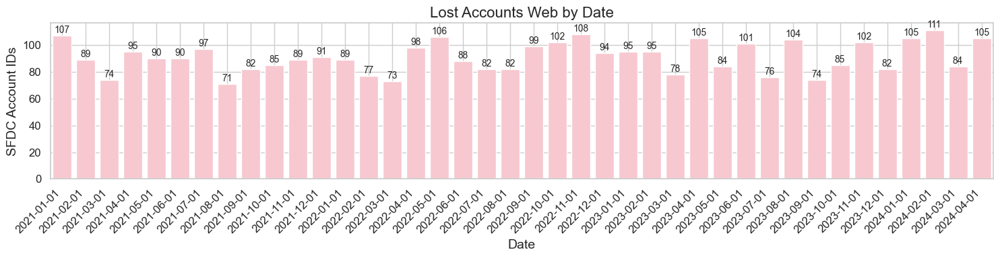

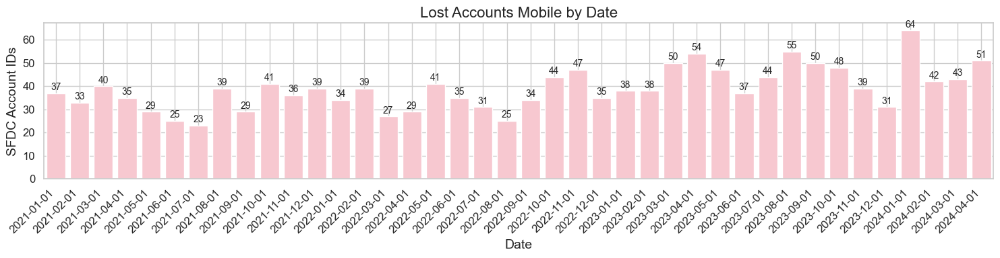

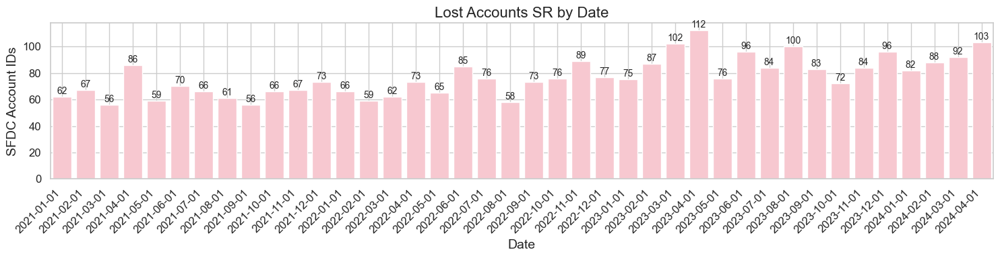

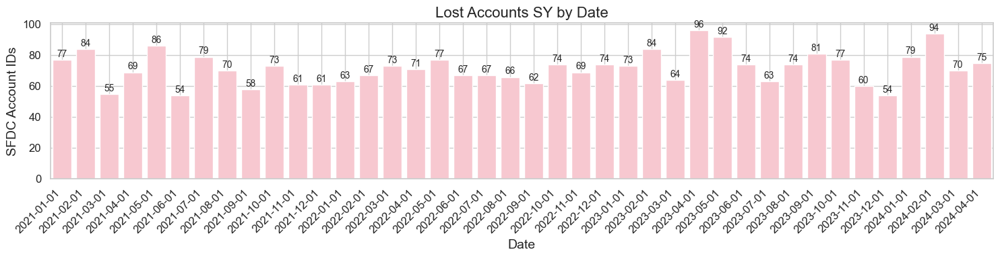

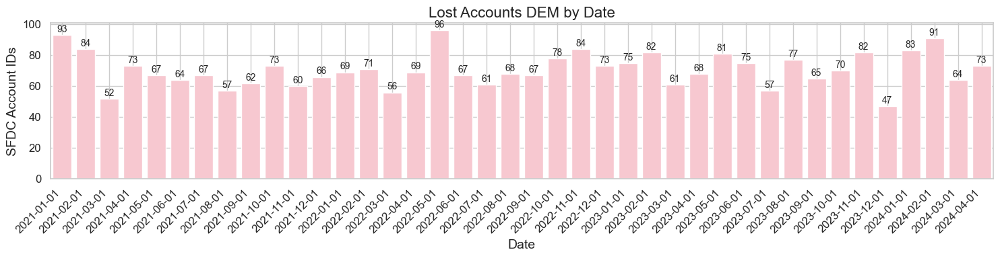

In [858]:
lost_accounts_df = df_grouped_W[(df_grouped_W['Lost Account Has Web'] == 1) & (df_grouped_W['Consumption Date (Monthly)'] != '2024-05-01') & (df_grouped_W['Consumption Date (Monthly)'] != '2024-06-01')]

counts_by_date = lost_accounts_df.groupby('Consumption Date (Monthly)')['SFDC Account ID'].nunique().reset_index()

# Set seaborn style
sns.set(style="whitegrid")

# Plotting
plt.figure(figsize=(15, 4))
sns.barplot(data=counts_by_date, x='Consumption Date (Monthly)', y='SFDC Account ID', color='pink')
plt.title('Lost Accounts Web by Date', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('SFDC Account IDs', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True)

# Add counts as text on top of the bars
for index, value in counts_by_date.iterrows():
    plt.text(index, value['SFDC Account ID'] + 0.5, str(value['SFDC Account ID']), ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()



lost_accounts_df = df_grouped_M[(df_grouped_M['Lost Account Has Mobile'] == 1) & (df_grouped_M['Consumption Date (Monthly)'] != '2024-05-01') & (df_grouped_M['Consumption Date (Monthly)'] != '2024-06-01')]

counts_by_date = lost_accounts_df.groupby('Consumption Date (Monthly)')['SFDC Account ID'].nunique().reset_index()

# Set seaborn style
sns.set(style="whitegrid")

# Plotting
plt.figure(figsize=(15, 4))
sns.barplot(data=counts_by_date, x='Consumption Date (Monthly)', y='SFDC Account ID', color='pink')
plt.title('Lost Accounts Mobile by Date', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('SFDC Account IDs', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True)

# Add counts as text on top of the bars
for index, value in counts_by_date.iterrows():
    plt.text(index, value['SFDC Account ID'] + 0.5, str(value['SFDC Account ID']), ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()



lost_accounts_df = df_grouped_SR[(df_grouped_SR['Lost Account Has SR'] == 1) & (df_grouped_SR['Consumption Date (Monthly)'] != '2024-05-01') & (df_grouped_SR['Consumption Date (Monthly)'] != '2024-06-01')]

counts_by_date = lost_accounts_df.groupby('Consumption Date (Monthly)')['SFDC Account ID'].nunique().reset_index()

# Set seaborn style
sns.set(style="whitegrid")

# Plotting
plt.figure(figsize=(15, 4))
sns.barplot(data=counts_by_date, x='Consumption Date (Monthly)', y='SFDC Account ID', color='pink')
plt.title('Lost Accounts SR by Date', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('SFDC Account IDs', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True)

# Add counts as text on top of the bars
for index, value in counts_by_date.iterrows():
    plt.text(index, value['SFDC Account ID'] + 0.5, str(value['SFDC Account ID']), ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()



lost_accounts_df = df_grouped_SY[(df_grouped_SY['Lost Account Has SY'] == 1) & (df_grouped_SY['Consumption Date (Monthly)'] != '2024-05-01') & (df_grouped_SY['Consumption Date (Monthly)'] != '2024-06-01')]

counts_by_date = lost_accounts_df.groupby('Consumption Date (Monthly)')['SFDC Account ID'].nunique().reset_index()

# Set seaborn style
sns.set(style="whitegrid")

# Plotting
plt.figure(figsize=(15, 4))
sns.barplot(data=counts_by_date, x='Consumption Date (Monthly)', y='SFDC Account ID', color='pink')
plt.title('Lost Accounts SY by Date', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('SFDC Account IDs', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True)

# Add counts as text on top of the bars
for index, value in counts_by_date.iterrows():
    plt.text(index, value['SFDC Account ID'] + 0.5, str(value['SFDC Account ID']), ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()



lost_accounts_df = df_grouped_DEM[(df_grouped_DEM['Lost Account Has DEM'] == 1) & (df_grouped_DEM['Consumption Date (Monthly)'] != '2024-05-01') & (df_grouped_DEM['Consumption Date (Monthly)'] != '2024-06-01')]

counts_by_date = lost_accounts_df.groupby('Consumption Date (Monthly)')['SFDC Account ID'].nunique().reset_index()

# Set seaborn style
sns.set(style="whitegrid")

# Plotting
plt.figure(figsize=(15, 4))
sns.barplot(data=counts_by_date, x='Consumption Date (Monthly)', y='SFDC Account ID', color='pink')
plt.title('Lost Accounts DEM by Date', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('SFDC Account IDs', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True)

# Add counts as text on top of the bars
for index, value in counts_by_date.iterrows():
    plt.text(index, value['SFDC Account ID'] + 0.5, str(value['SFDC Account ID']), ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

In [859]:
df_grouped_M1 = df_grouped_M.copy()
df_grouped_W1 = df_grouped_W.copy()
df_grouped_DEM1 = df_grouped_DEM.copy()
df_grouped_SY1 = df_grouped_SY.copy()
df_grouped_SR1 = df_grouped_SR.copy()

In [860]:
df_grouped_M1 = df_grouped_M1[['SFDC Account ID', 'Consumption Date (Monthly)',  'DEM Units - Mobile Total (Monthly)', 'DEM Units - Mobile Total (Monthly - Previous Month)', 'MoM Mobile Total',  'Retention Months Has Mobile', 'Previous Retention Months Has Mobile', 'Lost Account Has Mobile']]
df_grouped_M1.fillna(0, inplace=True)
df_grouped_M1.replace([np.inf, -np.inf], 0, inplace=True)
df_grouped_M1['MoM Mobile Total'] = df_grouped_M1['MoM Mobile Total'].astype(float)
df_grouped_M1['MoM Mobile Total'] = df_grouped_M1['MoM Mobile Total'].round(3)

df_grouped_W1 = df_grouped_W1[['SFDC Account ID', 'Consumption Date (Monthly)',  'DEM Units - Web Total (Monthly)', 'DEM Units - Web Total (Monthly - Previous Month)', 'MoM Web Total',  'Retention Months Has Web', 'Previous Retention Months Has Web', 'Lost Account Has Web']]
df_grouped_W1.fillna(0, inplace=True)
df_grouped_W1.replace([np.inf, -np.inf], 0, inplace=True)
df_grouped_W1['MoM Web Total'] = df_grouped_W1['MoM Web Total'].astype(float)
df_grouped_W1['MoM Web Total'] = df_grouped_W1['MoM Web Total'].round(3)

df_grouped_SR1 = df_grouped_SR1[['SFDC Account ID', 'Consumption Date (Monthly)',  'DEM Units - Session Replay Total (Monthly)', 'DEM Units - Session Replay Total (Monthly - Previous Month)', 'MoM Session Replay Total',  'Retention Months Has SR', 'Previous Retention Months Has SR', 'Lost Account Has SR']]
df_grouped_SR1.fillna(0, inplace=True)
df_grouped_SR1.replace([np.inf, -np.inf], 0, inplace=True)
df_grouped_SR1['MoM Session Replay Total'] = df_grouped_SR1['MoM Session Replay Total'].astype(float)
df_grouped_SR1['MoM Session Replay Total'] = df_grouped_SR1['MoM Session Replay Total'].round(3)

df_grouped_SY1 = df_grouped_SY1[['SFDC Account ID', 'Consumption Date (Monthly)',  'DEM Units - Synthetics Total (Monthly)', 'DEM Units - Synthetics Total (Monthly - Previous Month)', 'MoM Synthetics Total',  'Retention Months Has SY', 'Previous Retention Months Has SY', 'Lost Account Has SY']]
df_grouped_SY1.fillna(0, inplace=True)
df_grouped_SY1.replace([np.inf, -np.inf], 0, inplace=True)
df_grouped_SY1['MoM Synthetics Total'] = df_grouped_SY1['MoM Synthetics Total'].astype(float)
df_grouped_SY1['MoM Synthetics Total'] = df_grouped_SY1['MoM Synthetics Total'].round(3)

df_grouped_DEM1 = df_grouped_DEM1[['SFDC Account ID', 'Consumption Date (Monthly)',  'DEM Units - DEM Total (Monthly)', 'DEM Units - DEM Total (Monthly - Previous Month)', 'MoM DEM Total',  'Retention Months Has DEM', 'Previous Retention Months Has DEM', 'Lost Account Has DEM']]
df_grouped_DEM1.fillna(0, inplace=True)
df_grouped_DEM1.replace([np.inf, -np.inf], 0, inplace=True)
df_grouped_DEM1['MoM DEM Total'] = df_grouped_DEM1['MoM DEM Total'].astype(float)
df_grouped_DEM1['MoM DEM Total'] = df_grouped_DEM1['MoM DEM Total'].round(3)


In [861]:
data = df_grouped_DEM1.merge(df_grouped_W1, on=['SFDC Account ID', 'Consumption Date (Monthly)'], how='outer')
data = data.merge(df_grouped_M1, on=['SFDC Account ID', 'Consumption Date (Monthly)'], how='outer')
data = data.merge(df_grouped_SR1, on=['SFDC Account ID', 'Consumption Date (Monthly)'], how='outer')
data = data.merge(df_grouped_SY1, on=['SFDC Account ID', 'Consumption Date (Monthly)'], how='outer')


In [862]:
data.to_csv('Lost\SFDCLostAccounts.csv', index=False)

In [863]:
#df_grouped_M1.to_csv('Lost\Mobile.csv',index=False)
#df_grouped_DEM1.to_csv('Lost\DEM.csv', index=False)
#df_grouped_W1.to_csv('Lost\Web.csv', index=False)
#df_grouped_SR1.to_csv('Lost\SR.csv', index=False)
#df_grouped_SY1.to_csv('Lost\SY.csv', index=False)

### COMBINE WITH GLOBAL CUSTOMER ATTRIBUTES:

In [864]:
df_DEM = pd.merge(df_grouped_DEM, customer_info, on=['SFDC Account ID'], how='left')
df_DEM.drop(columns='DT Account Key', inplace=True)
df_DEM.drop_duplicates(inplace=True)

df_M = pd.merge(df_grouped_M, customer_info, on=['SFDC Account ID'], how='left')
df_M.drop(columns='DT Account Key', inplace=True)

df_W = pd.merge(df_grouped_W, customer_info, on=['SFDC Account ID'], how='left')
df_W.drop(columns='DT Account Key', inplace=True)

df_SR = pd.merge(df_grouped_SR, customer_info, on=['SFDC Account ID'], how='left')
df_SR.drop(columns='DT Account Key', inplace=True)

df_SY = pd.merge(df_grouped_SY, customer_info, on=['SFDC Account ID'], how='left')
df_SY.drop(columns='DT Account Key', inplace=True)

In [865]:
def aggregate_capabilities(df, capability):
    capability_columns = {
        'DEM': ['Retention Months Has DEM', 'Previous Retention Months Has DEM', 'Lost Account Has DEM'],
        'Web': ['Retention Months Has Web', 'Previous Retention Months Has Web', 'Lost Account Has Web'],
        'Mobile': ['Retention Months Has Mobile', 'Previous Retention Months Has Mobile', 'Lost Account Has Mobile'],
        'SR': ['Retention Months Has SR', 'Previous Retention Months Has SR', 'Lost Account Has SR'],
        'SY': ['Retention Months Has SY', 'Previous Retention Months Has SY', 'Lost Account Has SY'],
    }
    
    capability_cols = capability_columns[capability]
    
    grouped_df = df.groupby(['SFDC Account ID', 'Consumption Date (Monthly)']).agg({
        'Date as Number': 'last',
        'Deployment Type': 'last',
        'Geolocation': 'last',
        'Country': 'last',
        'Vertical': 'last',
        'ARR Band': 'last',
        'APPS_MOBILE': 'sum',
        'COST_CONTROL_PERCENTAGE_APPS_MOBILE': 'mean',
        'RUM_SESSIONS_MOBILE': 'sum',
        'WEB_APPS': 'sum',
        'COST_CONTROL_PERCENTAGE_WEB_APPS': 'mean',
        'RUM_SESSIONS_WEB': 'sum',
        'UEM_ENABLED': 'last',
        'SESSION_REPLAY_ENABLED': 'last',
        'APPS_SESSION_REPLAY': 'sum',
        'COST_CONTROL_PERCANTAGE_SESSION_REPLAY': 'mean',
        'SESSIONS_SESSION_REPLAY': 'sum',
        'SYNTHETIC_TESTS': 'sum',
        'HTTP_CHECK': 'sum',
        'FRAMEWORK': 'sum',
        'DEM Units - DEM Total (Monthly)': 'last',
        'DEM Units - DEM Total (Monthly - Previous Month)': 'last',
        'DEM Units - Session Replay Total (Monthly)': 'last',
        'DEM Units - Session Replay Total (Monthly - Previous Month)': 'last',
        'DEM Units - Synthetics Total (Monthly)': 'last',
        'DEM Units - Synthetics Total (Monthly - Previous Month)': 'last',
        'DEM Units - Web Total (Monthly)': 'last',
        'DEM Units - Web Total (Monthly - Previous Month)': 'last',
        'DEM Units - Mobile Total (Monthly)': 'last',
        'DEM Units - Mobile Total (Monthly - Previous Month)': 'last',
        'Has DEM': 'last', 
        'Has Web': 'last', 
        'Has Mobile': 'last', 
        'Has SR': 'last', 
        'Has SY': 'last',
        **{col: 'last' for col in capability_cols}
    }).reset_index()
    
    grouped_df['Capability'] = capability
    return grouped_df


--> Running time: 2 minutes

In [866]:
df_DEM = aggregate_capabilities(df_DEM, 'DEM')
df_M = aggregate_capabilities(df_M, 'Mobile')
df_W = aggregate_capabilities(df_W, 'Web')
df_SR = aggregate_capabilities(df_SR, 'SR')
df_SY = aggregate_capabilities(df_SY, 'SY')

## ENCODE VARIABLES

Variables that we will encode:

    - Deployment Type
    - Vertical
    - Geolocation
    - Country
    - ARR Band 

DEPLOYMENT TYPE:

C:\Users\martina.tarres\AppData\Local\Temp\ipykernel_25572\1996405121.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Deployment Type', y='SFDC Account ID', data=deployment_count, palette=custom_palette)


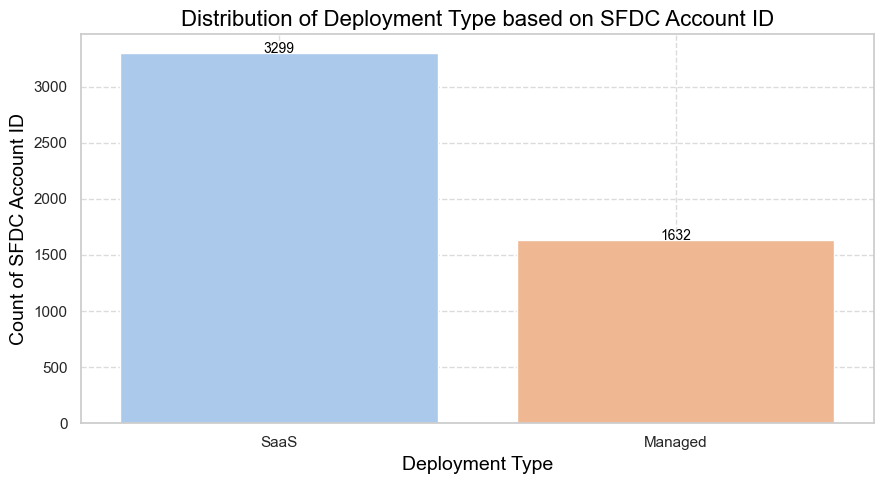

In [867]:
deployment_count = df_DEM.groupby('Deployment Type')['SFDC Account ID'].nunique().reset_index()
deployment_count = deployment_count.sort_values(by='SFDC Account ID', ascending=False)

custom_palette = sns.color_palette("pastel", n_colors=len(deployment_count))

plt.figure(figsize=(9, 5), facecolor='white')
ax = sns.barplot(x='Deployment Type', y='SFDC Account ID', data=deployment_count, palette=custom_palette)

for i, count in enumerate(deployment_count['SFDC Account ID']):
    ax.text(i, count + 1, str(count), ha='center', color='black', fontsize=10)

ax.grid(True, linestyle='--', alpha=0.7)

plt.title('Distribution of Deployment Type based on SFDC Account ID', color='black', fontsize=16) 
plt.xlabel('Deployment Type', color='black', fontsize=14)  
plt.ylabel('Count of SFDC Account ID', color='black', fontsize=14)  

plt.tight_layout()
plt.show()

GEOLOCATION:

C:\Users\martina.tarres\AppData\Local\Temp\ipykernel_25572\3898265233.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Geolocation', y='SFDC Account ID', data=geo_count, palette=custom_palette)


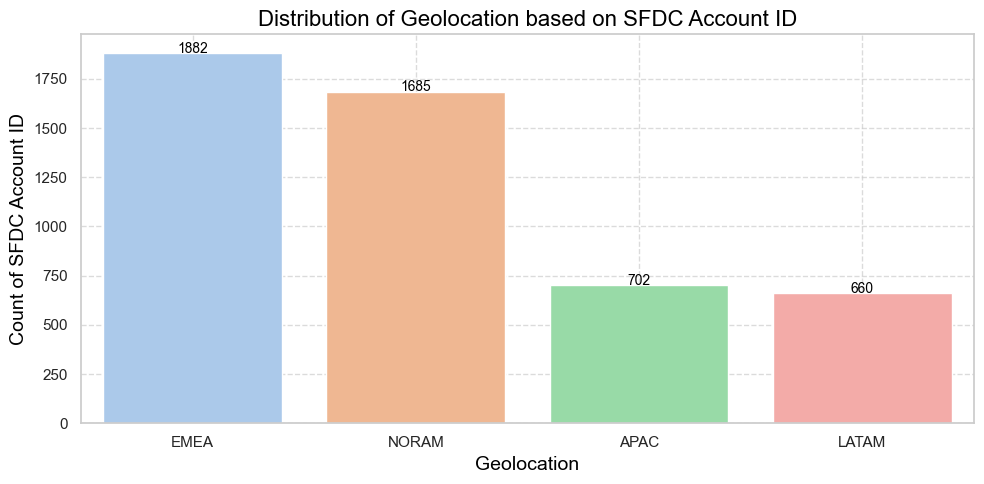

In [868]:
df_DEM = df_DEM[df_DEM['Geolocation'] != 0]
geo_count = df_DEM.groupby('Geolocation')['SFDC Account ID'].nunique().reset_index()
geo_count = geo_count.sort_values(by='SFDC Account ID', ascending=False)

custom_palette = sns.color_palette("pastel", n_colors=len(geo_count))


plt.figure(figsize=(10, 5), facecolor='white')
ax = sns.barplot(x='Geolocation', y='SFDC Account ID', data=geo_count, palette=custom_palette)

for i, count in enumerate(geo_count['SFDC Account ID']):
    ax.text(i, count + 1, str(count), ha='center', color='black', fontsize=10)

ax.grid(True, linestyle='--', alpha=0.7)

plt.title('Distribution of Geolocation based on SFDC Account ID', color='black', fontsize=16) 
plt.xlabel('Geolocation', color='black', fontsize=14)  
plt.ylabel('Count of SFDC Account ID', color='black', fontsize=14)  
plt.tight_layout()
plt.show()


ARR BAND

C:\Users\martina.tarres\AppData\Local\Temp\ipykernel_25572\4021302070.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='ARR Band', y='SFDC Account ID', data=ARR_count, palette=custom_palette)


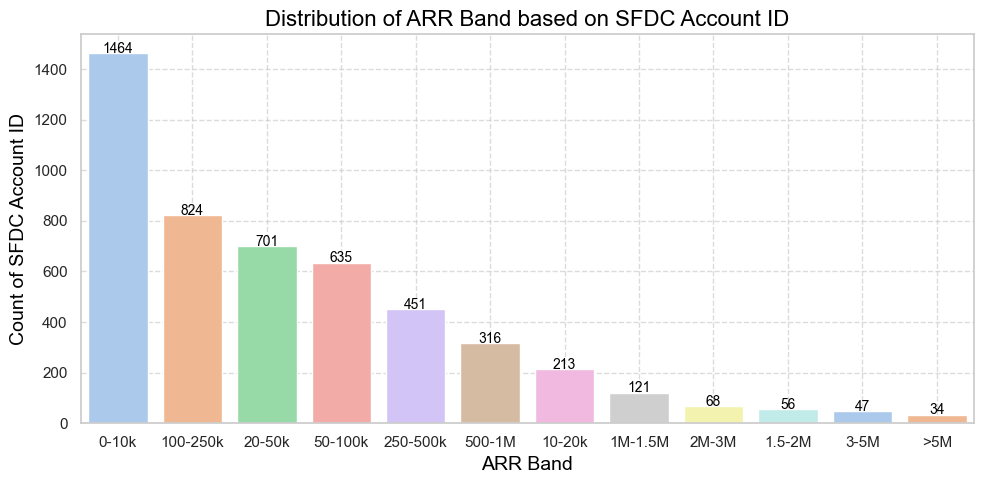

In [869]:
ARR_count = df_DEM.groupby('ARR Band')['SFDC Account ID'].nunique().reset_index()
ARR_count = ARR_count.sort_values(by='SFDC Account ID', ascending=False)

custom_palette = sns.color_palette("pastel", n_colors=len(ARR_count))

plt.figure(figsize=(10, 5), facecolor='white')
ax = sns.barplot(x='ARR Band', y='SFDC Account ID', data=ARR_count, palette=custom_palette)

for i, count in enumerate(ARR_count['SFDC Account ID']):
    ax.text(i, count + 1, str(count), ha='center', color='black', fontsize=10)

ax.grid(True, linestyle='--', alpha=0.7)

plt.title('Distribution of ARR Band based on SFDC Account ID', color='black', fontsize=16) 
plt.xlabel('ARR Band', color='black', fontsize=14)  
plt.ylabel('Count of SFDC Account ID', color='black', fontsize=14)  

plt.tight_layout()

# Show plot
plt.show()

df_DEM = df_DEM.dropna(subset=['ARR Band'])
df_W = df_W.dropna(subset=['ARR Band'])
df_M = df_M.dropna(subset=['ARR Band'])
df_SR = df_SR.dropna(subset=['ARR Band'])
df_SY = df_SY.dropna(subset=['ARR Band'])


VERTICAL

C:\Users\martina.tarres\AppData\Local\Temp\ipykernel_25572\2797674399.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Vertical', y='SFDC Account ID', data=vertical_count, palette=custom_palette)


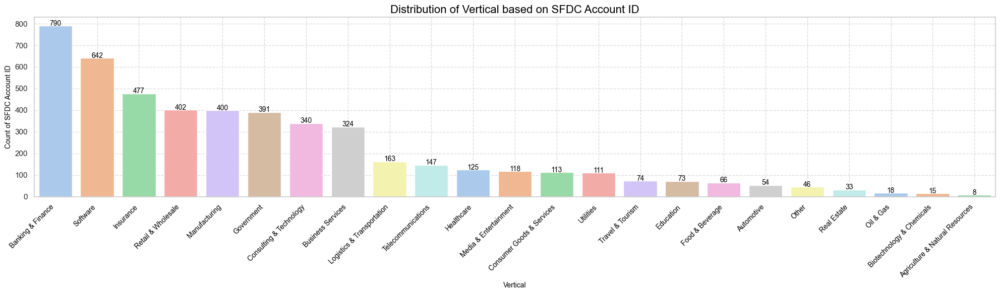

In [870]:
vertical_count = df_DEM.groupby('Vertical')['SFDC Account ID'].nunique().reset_index()
vertical_count = vertical_count.sort_values(by='SFDC Account ID', ascending=False)

custom_palette = sns.color_palette("pastel", n_colors=len(vertical_count))

plt.figure(figsize=(20, 6), facecolor='white')
ax = sns.barplot(x='Vertical', y='SFDC Account ID', data=vertical_count, palette=custom_palette)

for i, count in enumerate(vertical_count['SFDC Account ID']):
    ax.text(i, count + 1, str(count), ha='center', color='black', fontsize=10)

ax.grid(True, linestyle='--', alpha=0.7)

plt.title('Distribution of Vertical based on SFDC Account ID', color='black', fontsize=16) 
plt.xlabel('Vertical', color='black', fontsize=10)  
plt.ylabel('Count of SFDC Account ID', color='black', fontsize=10)  
plt.xticks(rotation=45, ha='right', color='black', fontsize=10)

plt.tight_layout()
plt.show()

As there are a lot of different register for Vertical we are going to set up a treshold in order to reduce the number of entries and imporve the models performance:

In [871]:
vertical_counts = df_DEM.groupby('Vertical')['SFDC Account ID'].nunique()
verticals_to_replace = vertical_counts[vertical_counts < 100].index.tolist()

df_DEM['Vertical'] = df_DEM['Vertical'].apply(lambda x: 'Other' if x in verticals_to_replace else x)


C:\Users\martina.tarres\AppData\Local\Temp\ipykernel_25572\2902941040.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Vertical', y='SFDC Account ID', data=vertical_count, palette=custom_palette)


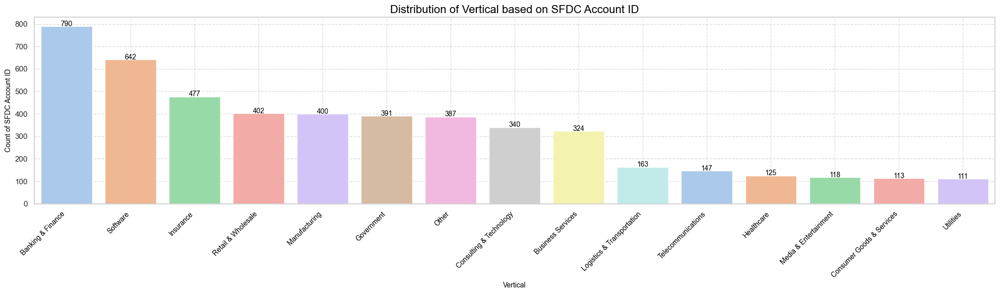

In [872]:
vertical_count = df_DEM.groupby('Vertical')['SFDC Account ID'].nunique().reset_index()
vertical_count = vertical_count.sort_values(by='SFDC Account ID', ascending=False)
custom_palette = sns.color_palette("pastel", n_colors=len(vertical_count))

plt.figure(figsize=(20, 6), facecolor='white')
ax = sns.barplot(x='Vertical', y='SFDC Account ID', data=vertical_count, palette=custom_palette)

for i, count in enumerate(vertical_count['SFDC Account ID']):
    ax.text(i, count + 1, str(count), ha='center', color='black', fontsize=10)

ax.grid(True, linestyle='--', alpha=0.7)

plt.title('Distribution of Vertical based on SFDC Account ID', color='black', fontsize=16) 
plt.xlabel('Vertical', color='black', fontsize=10)  
plt.ylabel('Count of SFDC Account ID', color='black', fontsize=10)  
plt.xticks(rotation=45, ha='right', color='black', fontsize=10)

plt.tight_layout()
plt.show()

COUNTRY

We will do the same for Country: set up a treshold of 100

In [873]:
country_count = df_DEM.groupby('Country')['SFDC Account ID'].nunique()

country_to_replace = country_count[country_count < 90].index.tolist()

df_DEM['Country'] = df_DEM['Country'].apply(lambda x: 'Other' if x in country_to_replace else x)


C:\Users\martina.tarres\AppData\Local\Temp\ipykernel_25572\960523552.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Country', y='SFDC Account ID', data=country_count, palette=custom_palette)


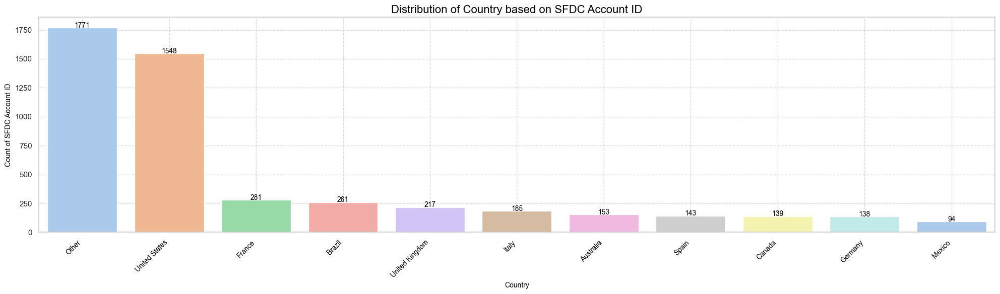

In [874]:
country_count = df_DEM.groupby('Country')['SFDC Account ID'].nunique().reset_index()
country_count = country_count.sort_values(by='SFDC Account ID', ascending=False)

custom_palette = sns.color_palette("pastel", n_colors=len(country_count))

plt.figure(figsize=(20, 6), facecolor='white')
ax = sns.barplot(x='Country', y='SFDC Account ID', data=country_count, palette=custom_palette)

for i, count in enumerate(country_count['SFDC Account ID']):
    ax.text(i, count + 1, str(count), ha='center', color='black', fontsize=10)

ax.grid(True, linestyle='--', alpha=0.7)

plt.title('Distribution of Country based on SFDC Account ID', color='black', fontsize=16) 
plt.xlabel('Country', color='black', fontsize=10)  
plt.ylabel('Count of SFDC Account ID', color='black', fontsize=10)  
plt.xticks(rotation=45, ha='right', color='black', fontsize=10)

plt.tight_layout()
plt.show()

Apply the same to the other dataframes:

In [875]:
def replace_verticals(df):
    vertical_counts = df.groupby('Vertical')['SFDC Account ID'].nunique()
    verticals_to_replace = vertical_counts[vertical_counts < 100].index.tolist()
    df['Vertical'] = df['Vertical'].apply(lambda x: 'Other' if x in verticals_to_replace else x)
    return df

df_W = replace_verticals(df_W)
df_M = replace_verticals(df_M)
df_SR = replace_verticals(df_SR)
df_SY = replace_verticals(df_SY)
df_DEM = replace_verticals(df_DEM)

In [876]:
def replace_country(df):
    country_counts = df.groupby('Country')['SFDC Account ID'].nunique()
    countrys_to_replace = country_counts[country_counts < 90].index.tolist()
    df['Country'] = df['Country'].apply(lambda x: 'Other' if x in countrys_to_replace else x)
    return df

df_W = replace_country(df_W)
df_M = replace_country(df_M)
df_SR = replace_country(df_SR)
df_SY = replace_country(df_SY)
df_DEM = replace_country(df_DEM)

### ONE HOT ENCODER:

Let us apply one hot encoder:

In [877]:
categorical = ['Deployment Type', 'Geolocation','Country', 'Vertical']

encoded_data_DEM = pd.get_dummies(df_DEM, columns=categorical)
encoded_data_W = pd.get_dummies(df_W, columns=categorical)
encoded_data_M = pd.get_dummies(df_M, columns=categorical)
encoded_data_SR = pd.get_dummies(df_SR, columns=categorical)
encoded_data_SY = pd.get_dummies(df_SY, columns=categorical)


In [878]:
arr_order = ['0-10k', '10-20k', '20-50k', '50-100k', '100-250k', '250-500k', '500-1M', '1M-1.5M', '1.5-2M', '2M-3M', '3-5M', '>5M']

label_encoder = LabelEncoder()
label_encoder.fit(arr_order)

encoded_data_DEM['ARR Band'] = label_encoder.transform(encoded_data_DEM['ARR Band'])
encoded_data_W['ARR Band'] = label_encoder.transform(encoded_data_W['ARR Band'])
encoded_data_M['ARR Band'] = label_encoder.transform(encoded_data_M['ARR Band'])
encoded_data_SR['ARR Band'] = label_encoder.transform(encoded_data_SR['ARR Band'])
encoded_data_SY['ARR Band'] = label_encoder.transform(encoded_data_SY['ARR Band'])


# DEM 

## MODEL 1 - TRADITIONAL MACHINE LEARNING:

#### DEM Churn Signals used:
- DEM Units Web (monthly)
- Web Apps 
- Sessions
- Competitor framework
- Deployment Type
- Vertical
- Geolocation
- Country
- ARR Band 

### 3 MONTHS WINDOW

--> Running time: 3 minutes

In [879]:
def create_window_df(df):
    window_df = []
    
    data = df.groupby('SFDC Account ID')

    for group_name, group_df in data:
        group_df = group_df.sort_values(by='Consumption Date (Monthly)')
        
        for idx in range(len(group_df) - 3):
            row_data = group_df.iloc[idx:idx+4]

            # DEM Units Web (monthly):
            usage_month_1, usage_month_2, usage_month_3, usage_month_4 = row_data['DEM Units - DEM Total (Monthly)']
            usage_mom_1_2 = round(((usage_month_2 - usage_month_1) / usage_month_1) * 100, 3) if usage_month_1 != 0 else 0
            usage_mom_1_3 = round(((usage_month_3 - usage_month_1) / usage_month_1) * 100, 3) if usage_month_1 != 0 else 0
            usage_mom_2_3 = round(((usage_month_3 - usage_month_2) / usage_month_2) * 100, 3) if usage_month_2 != 0 else 0

            ## Web Apps:
            Apps_month_1, Apps_month_2, Apps_month_3, Apps_month_4 = row_data['WEB_APPS']
            Apps_mom_1_2 = round(((Apps_month_2 - Apps_month_1) / Apps_month_1) * 100, 3) if Apps_month_1 != 0 else 0
            Apps_mom_1_3 = round(((Apps_month_3 - Apps_month_1) / Apps_month_1) * 100, 3) if Apps_month_1 != 0 else 0
            Apps_mom_2_3 = round(((Apps_month_3 - Apps_month_2) / Apps_month_2) * 100, 3) if Apps_month_2 != 0 else 0
    
            # Web Billed Sessions:
            se_month_1, se_month_2, se_month_3, se_month_4 = row_data['RUM_SESSIONS_WEB']
            se_mom_1_2 = round(((se_month_2 - se_month_1) / se_month_1) * 100, 3) if se_month_1 != 0 else 0
            se_mom_1_3 = round(((se_month_3 - se_month_1) / se_month_1) * 100, 3) if se_month_1 != 0 else 0
            se_mom_2_3 = round(((se_month_3 - se_month_2) / se_month_2) * 100, 3) if se_month_2 != 0 else 0
    
            ## Mobile Apps:
            M_Apps_month_1, M_Apps_month_2, M_Apps_month_3, M_Apps_month_4 = row_data['APPS_MOBILE']
            M_Apps_mom_1_2 = round(((M_Apps_month_2 - M_Apps_month_1) / M_Apps_month_1) * 100, 3) if M_Apps_month_1 != 0 else 0
            M_Apps_mom_1_3 = round(((M_Apps_month_3 - M_Apps_month_1) / M_Apps_month_1) * 100, 3) if M_Apps_month_1 != 0 else 0
            M_Apps_mom_2_3 = round(((M_Apps_month_3 - M_Apps_month_2) / M_Apps_month_2) * 100, 3) if M_Apps_month_2 != 0 else 0
    
            # Mobile Billed Sessions:
            M_se_month_1, M_se_month_2, M_se_month_3, M_se_month_4 = row_data['RUM_SESSIONS_MOBILE']
            M_se_mom_1_2 = round(((M_se_month_2 - M_se_month_1) / M_se_month_1) * 100, 3) if M_se_month_1 != 0 else 0
            M_se_mom_1_3 = round(((M_se_month_3 - M_se_month_1) / M_se_month_1) * 100, 3) if M_se_month_1 != 0 else 0
            M_se_mom_2_3 = round(((M_se_month_3 - M_se_month_2) / M_se_month_2) * 100, 3) if M_se_month_2 != 0 else 0

            # Synthetic Tests:
            M_st_month_1, M_st_month_2, M_st_month_3, M_st_month_4 = row_data['SYNTHETIC_TESTS']
            M_st_mom_1_2 = round(((M_st_month_2 - M_st_month_1) / M_st_month_1) * 100, 3) if M_st_month_1 != 0 else 0
            M_st_mom_1_3 = round(((M_st_month_3 - M_st_month_1) / M_st_month_1) * 100, 3) if M_st_month_1 != 0 else 0
            M_st_mom_2_3 = round(((M_st_month_3 - M_st_month_2) / M_st_month_2) * 100, 3) if M_st_month_2 != 0 else 0

            # HTTP Checks:
            M_http_month_1, M_http_month_2, M_http_month_3, M_http_month_4 = row_data['HTTP_CHECK']
            M_http_mom_1_2 = round(((M_http_month_2 - M_http_month_1) / M_http_month_1) * 100, 3) if M_http_month_1 != 0 else 0
            M_http_mom_1_3 = round(((M_http_month_3 - M_http_month_1) / M_http_month_1) * 100, 3) if M_http_month_1 != 0 else 0
            M_http_mom_2_3 = round(((M_http_month_3 - M_http_month_2) / M_http_month_2) * 100, 3) if M_http_month_2 != 0 else 0

            # Competitor framework:
            frame_month_1, frame_month_2, frame_month_3, frame_month_4 = row_data['FRAMEWORK']
            frame_mom_1_2 = round(((frame_month_2 - frame_month_1) / frame_month_1) * 100, 3) if frame_month_1 != 0 else 0
            frame_mom_1_3 = round(((frame_month_3 - frame_month_1) / frame_month_1) * 100, 3) if frame_month_1 != 0 else 0
            frame_mom_2_3 = round(((frame_month_3 - frame_month_2) / frame_month_2) * 100, 3) if frame_month_2 != 0 else 0
        
            web = row_data.iloc[3]['Has Web']
            mobile = row_data.iloc[3]['Has Mobile']
            sr = row_data.iloc[3]['Has SR']
            sy = row_data.iloc[3]['Has SY']
            month = row_data.iloc[3]['Consumption Date (Monthly)']
            target = row_data.iloc[3]['Lost Account Has DEM']
            number = row_data.iloc[3]['Date as Number']
            prev_retention = row_data.iloc[3]['Previous Retention Months Has DEM']
            
            # Extracting encoded columns dynamically
            encoded_cols = [col for col in row_data.columns if col.startswith(tuple(categorical))]
            encoded_data = row_data[encoded_cols].values.flatten()

            window_df.append({
                'SFDC Account ID': group_name,
                'Predicting Month': month,
                'Date as Number': number,
                'Previous Retention Months' : prev_retention,

                'Usage - Month 3': usage_month_3,
                'Usage - MoM(12)': usage_mom_1_2,
                'Usage - MoM(13)': usage_mom_1_3,
                'Usage - MoM(23)': usage_mom_2_3,
                
                'Web Apps - MoM(12)': Apps_mom_1_2,
                'Web Apps - MoM(13)': Apps_mom_1_3,
                'Web Apps - MoM(23)': Apps_mom_2_3,

                'Web Sessions - MoM(12)': se_mom_1_2,
                'Web Sessions - MoM(13)': se_mom_1_3,
                'Web Sessions - MoM(23)': se_mom_2_3,

                'Mobile Apps - MoM(12)': M_Apps_mom_1_2,
                'Mobile Apps - MoM(13)': M_Apps_mom_1_3,
                'Mobile Apps - MoM(23)': M_Apps_mom_2_3,

                'Mobile Sessions - MoM(12)': M_se_mom_1_2,
                'Mobile Sessions - MoM(13)': M_se_mom_1_3,
                'Mobile Sessions - MoM(23)': M_se_mom_2_3,

                'Framework - MoM(12)': frame_mom_1_2,
                'Framework - MoM(13)': frame_mom_1_3,
                'Framework - MoM(23)': frame_mom_2_3,

                'Tests- MoM(12)': M_st_mom_1_2,
                'Tests - MoM(13)': M_st_mom_1_3,
                'Tests - MoM(23)': M_st_mom_2_3,

                'HTTP - MoM(12)': M_http_mom_1_2,
                'HTTP - MoM(13)': M_http_mom_1_3,
                'HTTP - MoM(23)': M_http_mom_2_3,

                **{col: val for col, val in zip(encoded_cols, encoded_data)},

                'Has Web': web,
                'Has Mobile': mobile,
                'Has SR': sr,
                'Has SY': sy,
                'Target (lost customer)': target
            })
  
    return pd.DataFrame(window_df)

dem_df = create_window_df(encoded_data_DEM)
dem_df['Target (lost customer)'] = dem_df['Target (lost customer)'].astype(int)

### IMABLANCED DATASET:

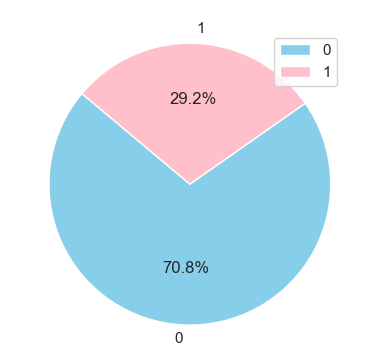

In [880]:
target_counts = dem_df.groupby('Target (lost customer)')['SFDC Account ID'].nunique()
colors = ['skyblue', 'pink']

plt.figure(figsize=(4, 4),  facecolor='none')
plt.title('Distribution of Churn based on SFDC Account ID', color='white')

plt.pie(target_counts, labels=target_counts.index, autopct='%1.1f%%', startangle=140, colors=colors)
plt.axis('equal')
plt.legend(loc='upper right')

# Show plot
plt.show()

We are going to use the last month for testing the model. Hence, let us remove the last completed month (March 2024 for now), and proceed to develop the model without this month. Later we will use it for testing, and compare its accuracy. 

In [881]:
train_val_filtered = dem_df[(dem_df['Date as Number'] != max_date) & (dem_df['Date as Number'] != (max_date -1)) & (dem_df['Date as Number'] != (max_date -2))]

In [882]:
cols = [i for i in train_val_filtered.columns if i not in ('Target (lost customer)', 'SFDC Account ID', 'Predicting Month')]

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(train_val_filtered[cols], train_val_filtered['Target (lost customer)'], test_size=0.2, random_state=1)

In [883]:
print(train_val_filtered['Predicting Month'].max())

2024-04-01 00:00:00


In [884]:
print("Lenght X_train:",len(X_train))
print("Length y_train:", len(y_train))
print("Lenght X_test:",len(X_test))
print("Length y_test:", len(y_test))

Lenght X_train: 84106
Length y_train: 84106
Lenght X_test: 21027
Length y_test: 21027


#### PLOT CONFUSSION MATIX AND DENSITY CHART

In [885]:
def train_model_and_performance_eval(logit, train_x, test_x, train_y, test_y, cols, cutoff=0.5):

    train_predictions = logit.predict(train_x)
    train_probabilities = logit.predict_proba(train_x)
    train_predictions = np.where(train_probabilities[:, 1] >= cutoff, 1, 0)

    test_predictions = logit.predict(test_x)
    test_probabilities = logit.predict_proba(test_x)
    test_predictions = np.where(test_probabilities[:, 1] >= cutoff, 1, 0)

    fig, ax = plt.subplots(figsize=(8, 6))

    colors = ['purple', 'green'] 

    for class_value, color in zip([0, 1], colors):
        class_test_probabilities = test_probabilities[test_y == class_value, 1]
        sns.kdeplot(data=class_test_probabilities, fill=True, ax=ax, color=color, label=f'Test - Class {class_value}')
    
    ax.axvline(x=cutoff, linestyle='--', color='black', label='Cutoff')
    ax.set_title('Probability Density (Both Classes)')
    ax.set_xlabel('Predicted Probability')
    ax.set_ylabel('Density')
    ax.legend()
    
    plt.tight_layout()
    plt.show()
    
    # Compute confusion matrix for testing
    cm_test = confusion_matrix(test_y, test_predictions)
    cm_percentage_test = cm_test / cm_test.sum(axis=1)[:, np.newaxis] * 100

    # Plot confusion matrix and confusion matrix percentage for testing
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues", xticklabels=["Negative", "Positive"], yticklabels=["Negative", "Positive"], ax=axes[0])
    axes[0].set_title('Test Confusion Matrix')
    axes[0].set_xlabel('Predicted')
    axes[0].set_ylabel('Actual')
    
    sns.heatmap(cm_percentage_test, annot=True, fmt=".2f", cmap="Blues", xticklabels=["Negative", "Positive"], yticklabels=["Negative", "Positive"], ax=axes[1])
    axes[1].set_title('Test Confusion Matrix (Percentage)')
    axes[1].set_xlabel('Predicted')
    axes[1].set_ylabel('Actual')
    
    plt.tight_layout()
    plt.show()
    
    # EVALUATION METRICS:
    precision_train = precision_score(train_y, train_predictions)
    precision_test = precision_score(test_y, test_predictions)
    recall_train = recall_score(train_y, train_predictions)
    recall_test = recall_score(test_y, test_predictions)
    accuracy_train = accuracy_score(train_y, train_predictions)
    accuracy_test = accuracy_score(test_y, test_predictions)
    f1_train = f1_score(train_y, train_predictions)
    f1_test = f1_score(test_y, test_predictions)
    
    print("Model Evaluation Metrics:\n")
    print("Metrics       | Training Set | Testing Set")
    print("---------------------------------------------")
    print(f"Precision     | {precision_train:.4f}       | {precision_test:.4f}")
    print(f"Recall        | {recall_train:.4f}       | {recall_test:.4f}")
    print(f"Accuracy      | {accuracy_train:.4f}       | {accuracy_test:.4f}")
    print(f"F1 Score      | {f1_train:.4f}       | {f1_test:.4f}")

### RANDOM FOREST CLASSIFIER

In [886]:
# MODEL TRAINING

rf = RandomForestClassifier(class_weight='balanced')
rf.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced')

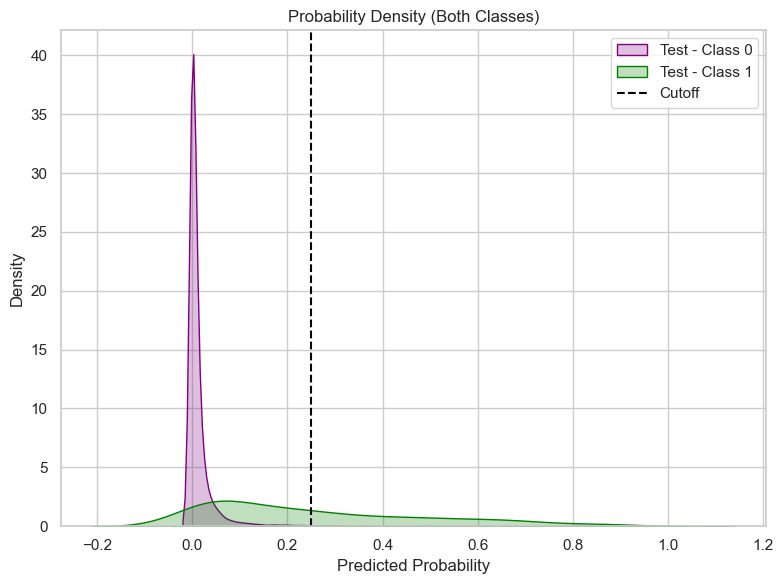

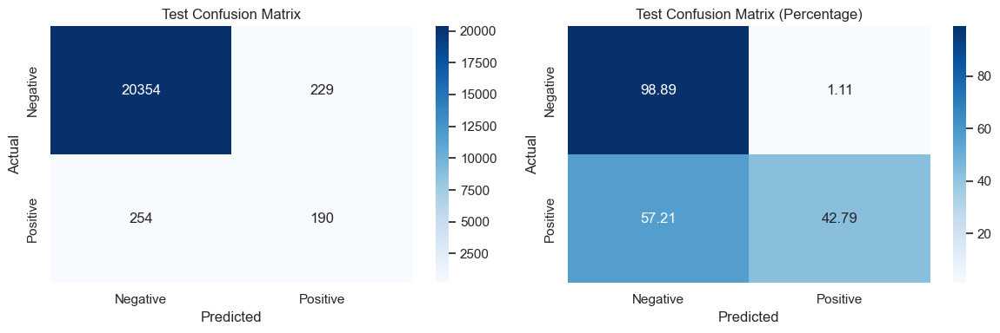

Model Evaluation Metrics:

Metrics       | Training Set | Testing Set
---------------------------------------------
Precision     | 0.9722       | 0.4535
Recall        | 1.0000       | 0.4279
Accuracy      | 0.9994       | 0.9770
F1 Score      | 0.9859       | 0.4403


In [887]:
train_model_and_performance_eval(rf, X_train, X_test, y_train, y_test, cols, cutoff=0.25)

### EXTREME GRADIENT BOOSTING:

In [888]:
# MODEL TRAINING
xgboost = xgb.XGBClassifier()
xgboost.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

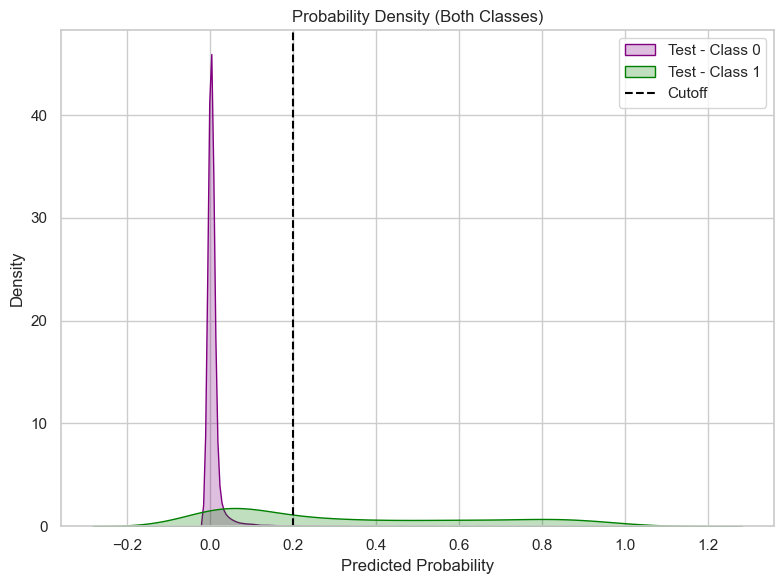

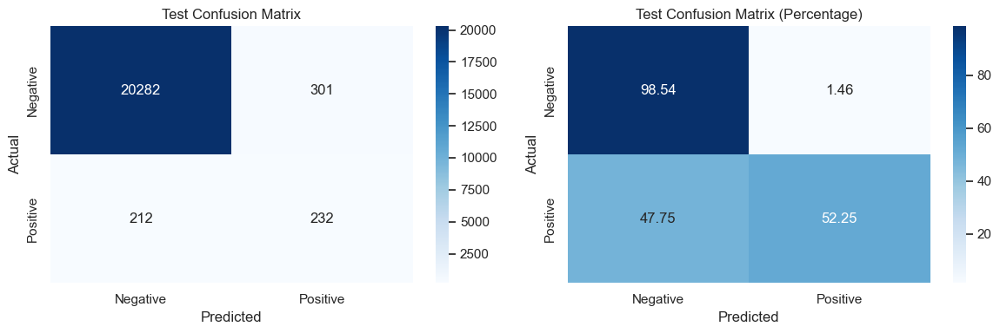

Model Evaluation Metrics:

Metrics       | Training Set | Testing Set
---------------------------------------------
Precision     | 0.7352       | 0.4353
Recall        | 0.8797       | 0.5225
Accuracy      | 0.9904       | 0.9756
F1 Score      | 0.8010       | 0.4749


In [889]:
train_model_and_performance_eval(xgboost, X_train, X_test, y_train, y_test, cols, cutoff=0.2)

### LIGHT GBM CLASSIFIER:

In [890]:
# MODEL TRAINING
lgbm = LGBMClassifier(class_weight='balanced')
lgbm.fit(X_train, y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1853, number of negative: 82253
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008781 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6199
[LightGBM] [Info] Number of data points in the train set: 84106, number of used features: 63
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000


LGBMClassifier(class_weight='balanced')

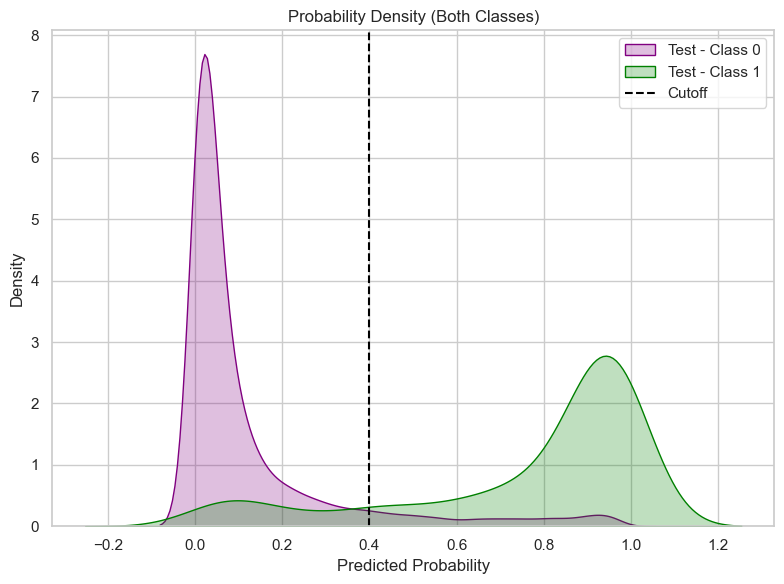

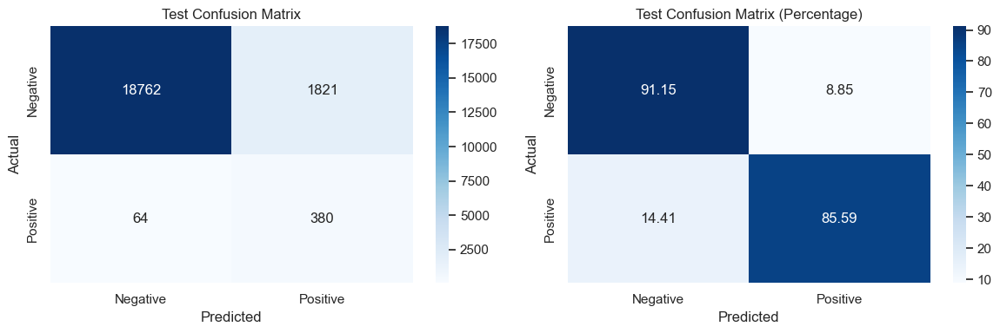

Model Evaluation Metrics:

Metrics       | Training Set | Testing Set
---------------------------------------------
Precision     | 0.2065       | 0.1726
Recall        | 0.9908       | 0.8559
Accuracy      | 0.9159       | 0.9104
F1 Score      | 0.3417       | 0.2873


In [891]:
train_model_and_performance_eval(lgbm, X_train, X_test, y_train, y_test, cols, cutoff=0.4)

Precision --> XGBoost classifier has the highest precision on the training and testing set, with 0.9982 and 0.9610 respectively.

Recall --> LightGBM classifier has the highest recall on both the training and testing sets, with 0.9970 and 0.9882 respectively.

Accuray --> Random Forest and XGBoost classifiers has the highest accuracy, with 0.9995 and 0.9978 respectively.

F1 score --> Random Forest has the highest F1 score, with 0.9897 and 0.9523 respectively.

Based on these metrics:

> LightGBM generally performs the best among the three classifiers

### PREDICTIONS

To rigorously test the accuracy of our model, we will use the most recent complete month of data (March 24) as our test set. Applying our trained model to this dataset, we will then compare the predicted values with the actual values to assess the model's performance. By examining the performance metrics derived from this evaluation, we can gain insights into what areas we can improve and test if the model performs well.

Let us then, use March to predict what will our custoemrs do in that month:

In [892]:
test_filtered_last = dem_df[dem_df['Date as Number'] == max_date -1][['SFDC Account ID', 'Predicting Month'] + cols]

In [893]:
test_filtered_DEM = dem_df[['SFDC Account ID', 'Predicting Month'] + cols]

In [894]:
predictions = lgbm.predict(test_filtered_last[cols])
probabilities = lgbm.predict_proba(test_filtered_last[cols])

predictions_binary = np.where(probabilities[:, 1] >= 0.34, 1, 0)

In [895]:
test_filtered_last['Prediction'] = predictions
test_filtered_last[' Binary Prediction'] = predictions_binary
test_filtered_last['Actual Value']  = dem_df[dem_df['Date as Number'] == max_date -1]['Target (lost customer)'] 
test_filtered_last['Probability of Churn'] = np.round(probabilities[:, 1], 4)
test_filtered_last['Probability of Survival'] = np.round(probabilities[:, 0], 4)

In [896]:
test_filtered_last.head()

,SFDC Account ID,Predicting Month,Date as Number,Previous Retention Months,Usage - Month 3,Usage - MoM(12),Usage - MoM(13),Usage - MoM(23),Web Apps - MoM(12),Web Apps - MoM(13),...,Vertical_Utilities,Has Web,Has Mobile,Has SR,Has SY,Prediction,Binary Prediction,Actual Value,Probability of Churn,Probability of Survival
38,00100000001VLvGAAW,2024-05-01,42,41,29300,837.141,914.192,8.222,92.308,184.615,...,False,1,0,0,0,0,1,0,0.4767,0.5233
66,00100000001VLvZAAW,2024-05-01,42,29,503729,17.058,94.296,65.982,21.053,10.655,...,False,1,0,0,1,0,0,0,0.0025,0.9975
98,00100000001VSZLAA4,2024-05-01,42,23,30686,-35.104,-33.089,3.105,14.773,11.080,...,False,1,0,1,0,0,0,0,0.0470,0.9530
138,00100000001XytIAAS,2024-05-01,42,41,883259,-1.563,2.610,4.240,9.052,6.527,...,False,1,0,0,1,0,1,0,0.4198,0.5802
178,00100000001Y6vqAAC,2024-05-01,42,41,3905818,-8.225,-6.715,1.645,0.000,0.000,...,False,0,0,0,1,0,0,0,0.0489,0.9511


In [897]:
y_test_march = dem_df[dem_df['Date as Number'] == max_date -1]['Target (lost customer)'] 

In [898]:
def evaluate_metrics_test(y_test, y_pred_test):

    cm = confusion_matrix(y_test, y_pred_test)
    cm_percentage = cm / cm.sum(axis=1)[:, np.newaxis] * 100
    
    # Plot confusion matrix and confusion matrix percentage
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Negative", "Positive"], yticklabels=["Negative", "Positive"], ax=axes[0])
    axes[0].set_title('Confusion Matrix')
    axes[0].set_xlabel('Predicted')
    axes[0].set_ylabel('Actual')
    
    sns.heatmap(cm_percentage, annot=True, fmt=".2f", cmap="Blues", xticklabels=["Negative", "Positive"], yticklabels=["Negative", "Positive"], ax=axes[1])
    axes[1].set_title('Confusion Matrix (Percentage)')
    axes[1].set_xlabel('Predicted')
    axes[1].set_ylabel('Actual')
    
    plt.tight_layout()
    plt.show()
    
   # EVALUATION METRICS:
    precision_test = precision_score(y_test, y_pred_test)
    recall_test = recall_score(y_test, y_pred_test)
    accuracy_test = accuracy_score(y_test, y_pred_test)
    f1_test = f1_score(y_test, y_pred_test)
    
    print("Metrics       | Testing Set")
    print("---------------------------------")
    print(f"Precision     | {precision_test:.4f}")
    print(f"Recall        | {recall_test:.4f}")
    print(f"Accuracy      | {accuracy_test:.4f}")
    print(f"F1 Score      | {f1_test:.4f}")


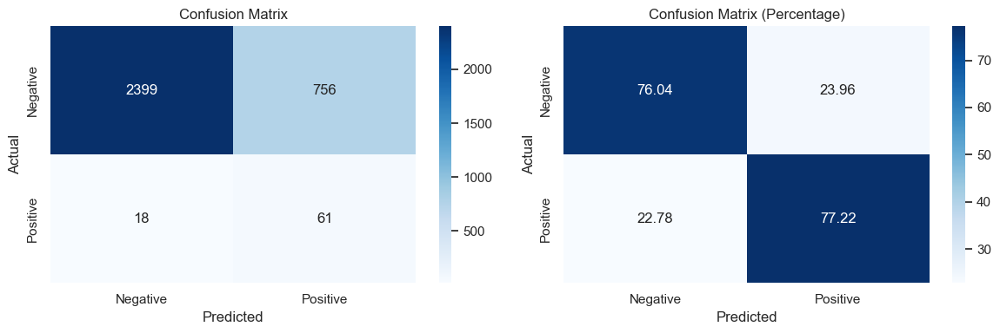

Metrics       | Testing Set
---------------------------------
Precision     | 0.0747
Recall        | 0.7722
Accuracy      | 0.7607
F1 Score      | 0.1362


In [899]:
evaluate_metrics_test(y_test_march, predictions)

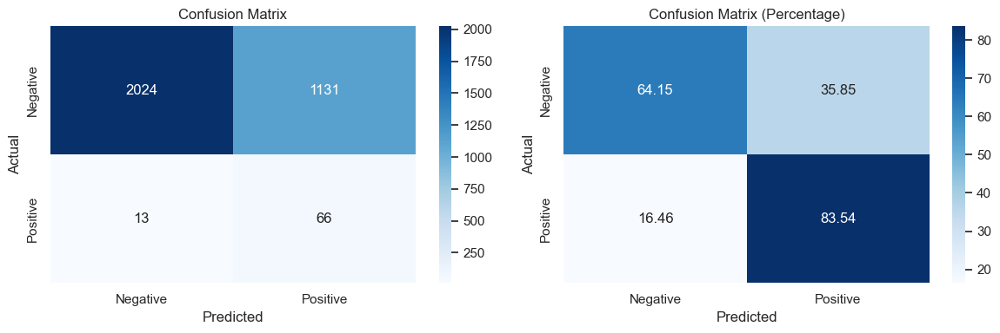

Metrics       | Testing Set
---------------------------------
Precision     | 0.0551
Recall        | 0.8354
Accuracy      | 0.6463
F1 Score      | 0.1034


In [900]:
evaluate_metrics_test(y_test_march, predictions_binary)

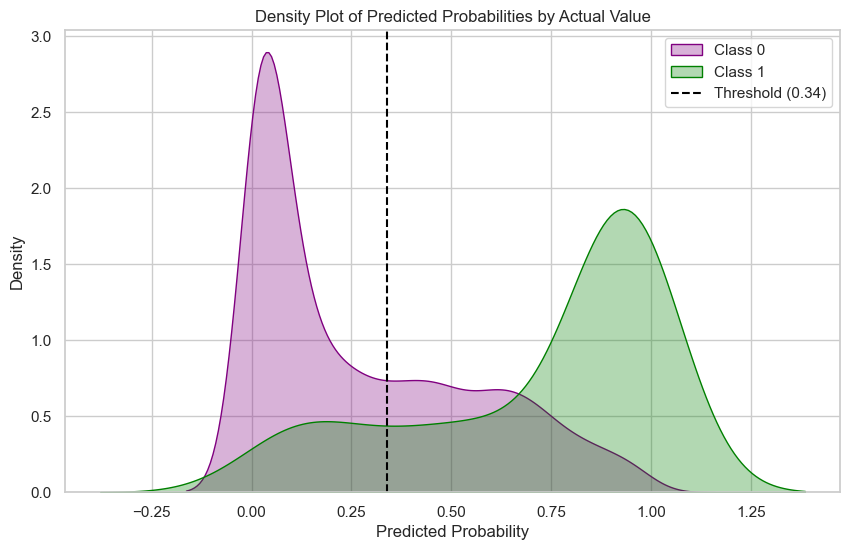

In [901]:
sns.set(style="whitegrid")
colors = ['purple', 'green']
threshold = 0.34
plt.figure(figsize=(10, 6))


for class_value, color in zip([0, 1], colors):
    sns.kdeplot(data=test_filtered_last[test_filtered_last["Actual Value"] == class_value], x="Probability of Churn",fill=True, common_norm=False, alpha=0.3, linewidth=1, color=color, label=f'Class {class_value}')

plt.axvline(x=threshold, linestyle='--', color='black', label=f'Threshold ({threshold})')

plt.title("Density Plot of Predicted Probabilities by Actual Value")
plt.xlabel("Predicted Probability")
plt.ylabel("Density")
plt.legend()

plt.show()


In [902]:
predictions = lgbm.predict(test_filtered_DEM[cols])
probabilities = lgbm.predict_proba(test_filtered_DEM[cols])

predictions_binary = np.where(probabilities[:, 1] >= 0.4, 1, 0)


test_filtered_DEM['Prediction'] = predictions
test_filtered_DEM['Binary Prediction'] = predictions_binary
test_filtered_DEM['Actual Value']  = dem_df['Target (lost customer)'] 
test_filtered_DEM['Probability of Churn'] = np.round(probabilities[:, 1], 4)
test_filtered_DEM['Probability of Survival'] = np.round(probabilities[:, 0], 4)

test_filtered_DEM = test_filtered_DEM.sort_values(by='Probability of Churn', ascending=False)
test_filtered_DEM = test_filtered_DEM[['SFDC Account ID', 'Predicting Month', 'Previous Retention Months', 'Usage - Month 3', 'Usage - MoM(12)', 'Usage - MoM(13)', 'Usage - MoM(23)', 'Prediction','Binary Prediction', 'Actual Value', 'Probability of Churn','Probability of Survival', 'Has Web', 'Has Mobile', 'Has SR', 'Has SY']]

In [903]:
test_filtered_DEM.head()

,SFDC Account ID,Predicting Month,Previous Retention Months,Usage - Month 3,Usage - MoM(12),Usage - MoM(13),Usage - MoM(23),Prediction,Binary Prediction,Actual Value,Probability of Churn,Probability of Survival,Has Web,Has Mobile,Has SR,Has SY
28986,0010g00001iVwvnAAC,2021-03-01,3,8310,48.574,-90.597,-93.671,1,1,1,0.9973,0.0027,1,0,0,1
87575,0017000000kuxqGAAQ,2021-03-01,3,190,4.209,-96.263,-96.414,1,1,1,0.9971,0.0029,1,0,0,0
35449,0010g00001miE20AAE,2021-03-01,3,8845,27.294,-76.743,-81.729,1,1,1,0.9969,0.0031,1,0,1,0
24411,0010g00001eIJSMAA4,2021-03-01,3,1296,-0.849,-98.595,-98.583,1,1,1,0.9969,0.0031,1,0,0,0
21860,0010g00001dJ1U3AAK,2021-03-01,3,2,-19.058,-99.999,-99.999,1,1,1,0.9969,0.0031,1,0,0,0


In [904]:
a = test_filtered_DEM[test_filtered_DEM['Predicting Month'] == '2024-06-01']
a

,SFDC Account ID,Predicting Month,Previous Retention Months,Usage - Month 3,Usage - MoM(12),Usage - MoM(13),Usage - MoM(23),Prediction,Binary Prediction,Actual Value,Probability of Churn,Probability of Survival,Has Web,Has Mobile,Has SR,Has SY
92849,0017000000o6emiAAA,2024-06-01,42,278,0.036,-95.029,-95.030,1,1,1,0.9956,0.0044,1,0,1,0
90292,0017000000kv1bUAAQ,2024-06-01,42,22615,12.093,-73.829,-76.652,1,1,1,0.9955,0.0045,1,0,0,1
10053,00100000003VF3QAAW,2024-06-01,42,11366,-1.148,-73.319,-73.009,1,1,1,0.9954,0.0046,1,0,1,0
111603,0017000001UqFO1AAN,2024-06-01,42,24221,-3.004,-62.498,-61.337,1,1,1,0.9952,0.0048,1,0,0,1
30004,0010g00001iWfwAAAS,2024-06-01,42,2,0.000,100.000,100.000,1,1,0,0.9947,0.0053,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27811,0010g00001hCePdAAK,2024-06-01,34,9915905,-4.150,5516.963,5760.187,0,0,0,0.0011,0.9989,0,1,0,1
54556,0017000000NP89KAAT,2024-06-01,36,12152088,4.455,5.354,0.861,0,0,0,0.0011,0.9989,1,1,1,1
6199,00100000001zX8EAAU,2024-06-01,4,0,-84.393,-100.000,-100.000,0,0,0,0.0010,0.9990,1,0,0,0
12595,00100000003YhEtAAK,2024-06-01,22,4914888,0.783,5.122,4.305,0,0,0,0.0009,0.9991,1,1,0,1


In [905]:
test_filtered_DEM.to_csv('Models/DEMTestFiltered.csv', index=False)

### PLOTS

In [906]:
y_pred_proba_xgb = xgboost.predict_proba(X_test)[::,1]
y_pred_proba_lgbm = lgbm.predict_proba(X_test)[::,1]
y_pred_proba_rf = rf.predict_proba(X_test)[::,1]

ROC CURVE

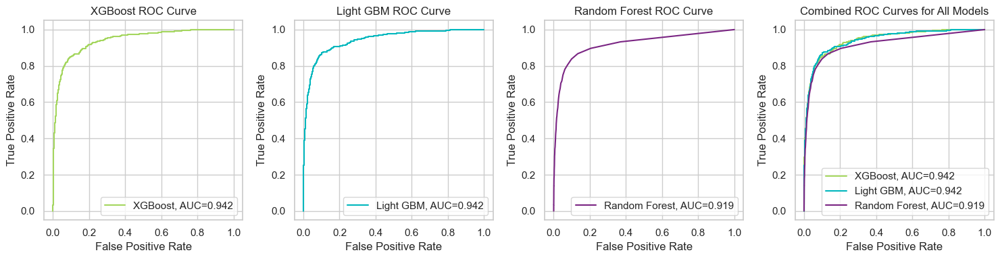

In [907]:
fpr_dt, tpr_dt, _ = metrics.roc_curve(y_test, y_pred_proba_xgb)
auc_dt = round(metrics.roc_auc_score(y_test, y_pred_proba_xgb), 3)

fpr_lgbm, tpr_lgbm, _ = metrics.roc_curve(y_test, y_pred_proba_lgbm)
auc_lgbm = round(metrics.roc_auc_score(y_test, y_pred_proba_lgbm), 3)

fpr_rf, tpr_rf, _ = metrics.roc_curve(y_test, y_pred_proba_rf)
auc_rf = round(metrics.roc_auc_score(y_test, y_pred_proba_rf), 3)

fig, axs = plt.subplots(1, 4, figsize=(15, 4))

# Decision Tree ROC curve
axs[0].plot(fpr_dt, tpr_dt, label=f'XGBoost, AUC={auc_dt}', color='#a4d65e')  
axs[0].set_xlabel('False Positive Rate')
axs[0].set_ylabel('True Positive Rate')
axs[0].set_title('XGBoost ROC Curve')
axs[0].legend()
axs[0].grid(True)

# Light GBM ROC curve
axs[1].plot(fpr_lgbm, tpr_lgbm, label=f'Light GBM, AUC={auc_lgbm}', color='#00b7bd') 
axs[1].set_xlabel('False Positive Rate')
axs[1].set_ylabel('True Positive Rate')
axs[1].set_title('Light GBM ROC Curve')
axs[1].legend()
axs[1].grid(True)

# Random Forest ROC curve
axs[2].plot(fpr_rf, tpr_rf, label=f'Random Forest, AUC={auc_rf}', color='#7a2583') 
axs[2].set_xlabel('False Positive Rate')
axs[2].set_ylabel('True Positive Rate')
axs[2].set_title('Random Forest ROC Curve')
axs[2].legend()
axs[2].grid(True)

# Combined ROC curve for all models
axs[3].plot(fpr_dt, tpr_dt, label=f'XGBoost, AUC={auc_dt}', color='#a4d65e')  
axs[3].plot(fpr_lgbm, tpr_lgbm, label=f'Light GBM, AUC={auc_lgbm}', color='#00b7bd') 
axs[3].plot(fpr_rf, tpr_rf, label=f'Random Forest, AUC={auc_rf}', color='#7a2583') 
axs[3].set_xlabel('False Positive Rate')
axs[3].set_ylabel('True Positive Rate')
axs[3].set_title('Combined ROC Curves for All Models')
axs[3].legend()
axs[3].grid(True)

plt.tight_layout()
plt.show()

FEATURE IMPORTANCE

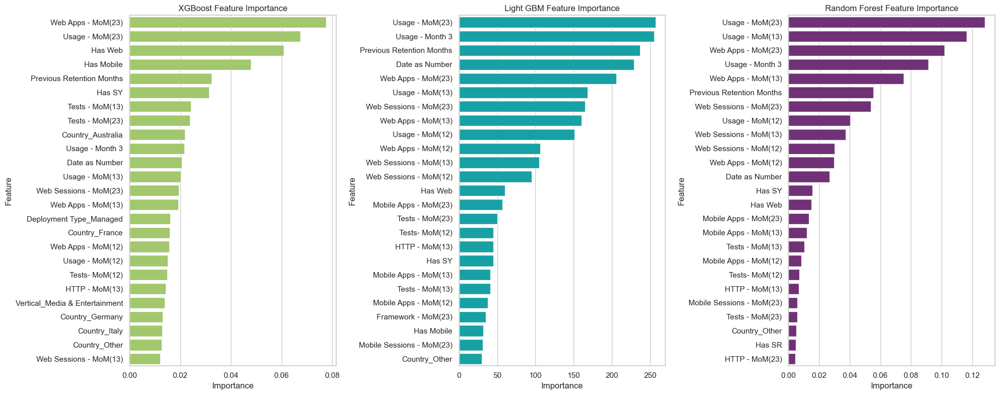

In [908]:
feature_importances_xgboost = pd.DataFrame({'Feature': cols, 'Importance': xgboost.feature_importances_})
feature_importances_xgboost = feature_importances_xgboost.sort_values(by='Importance', ascending=False).head(25)

feature_importances_lgbm = pd.DataFrame({'Feature': cols, 'Importance': lgbm.feature_importances_})
feature_importances_lgbm = feature_importances_lgbm.sort_values(by='Importance', ascending=False).head(25)

feature_importances_rf = pd.DataFrame({'Feature': cols, 'Importance': rf.feature_importances_})
feature_importances_rf = feature_importances_rf.sort_values(by='Importance', ascending=False).head(25)


fig, axs = plt.subplots(1, 3, figsize=(20, 8))

# Plot for Decision Tree
sns.barplot(data=feature_importances_xgboost, x='Importance', y='Feature', color='#a4d65e', ax=axs[0])
axs[0].set_title('XGBoost Feature Importance')
axs[0].set_xlabel('Importance')
axs[0].set_ylabel('Feature')

# Plot for Light GBM
sns.barplot(data=feature_importances_lgbm, x='Importance', y='Feature', color='#00b7bd', ax=axs[1])
axs[1].set_title('Light GBM Feature Importance')
axs[1].set_xlabel('Importance')
axs[1].set_ylabel('Feature')

# Plot for Random Forest
sns.barplot(data=feature_importances_rf, x='Importance', y='Feature', color='#7a2583', ax=axs[2])
axs[2].set_title('Random Forest Feature Importance')
axs[2].set_xlabel('Importance')
axs[2].set_ylabel('Feature')

plt.tight_layout()
plt.show()

PRECISSION-RECALL CURVE

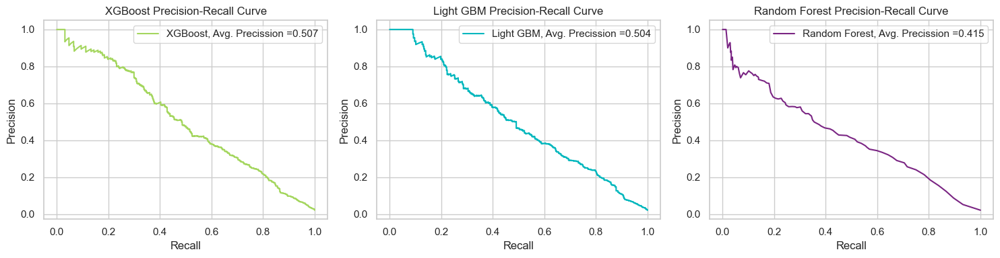

In [909]:
precision_dt, recall_dt, _ = precision_recall_curve(y_test, y_pred_proba_xgb)
average_precision_dt = round(average_precision_score(y_test, y_pred_proba_xgb),3)

precision_lgbm, recall_lgbm, _ = precision_recall_curve(y_test, y_pred_proba_lgbm)
average_precision_lgbm = round(average_precision_score(y_test, y_pred_proba_lgbm),3)

precision_rf, recall_rf, _ = precision_recall_curve(y_test, y_pred_proba_rf)
average_precision_rf = round(average_precision_score(y_test, y_pred_proba_rf),3)

fig, axs = plt.subplots(1, 3, figsize=(15, 4))

# Decision Tree Precision-Recall curve
axs[0].plot(recall_dt, precision_dt, label=f'XGBoost, Avg. Precission ={average_precision_dt}', color='#a4d65e')  
axs[0].set_xlabel('Recall')
axs[0].set_ylabel('Precision')
axs[0].set_title('XGBoost Precision-Recall Curve')
axs[0].legend()
axs[0].grid(True)

# Light GBM Precision-Recall curve
axs[1].plot(recall_lgbm, precision_lgbm, label=f'Light GBM, Avg. Precission ={average_precision_lgbm}', color='#00b7bd') 
axs[1].set_xlabel('Recall')
axs[1].set_ylabel('Precision')
axs[1].set_title('Light GBM Precision-Recall Curve')
axs[1].legend()
axs[1].grid(True)

# Random Forest Precision-Recall curve
axs[2].plot(recall_rf, precision_rf, label=f'Random Forest, Avg. Precission ={average_precision_rf}', color='#7a2583') 
axs[2].set_xlabel('Recall')
axs[2].set_ylabel('Precision')
axs[2].set_title('Random Forest Precision-Recall Curve')
axs[2].legend()
axs[2].grid(True)

plt.tight_layout()
plt.show()

### EXPLAINABILITY FOR LGBM

In [910]:
import shap
shap.initjs()

In [911]:
explainer = shap.Explainer(lgbm)
shap_values = explainer(X_test)

In [912]:
print("Shape of shap_values:", shap_values.shape)
print("Shape of X_test:", X_test.shape)

Shape of shap_values: (21027, 63)
Shape of X_test: (21027, 63)


Let us see which variables have an impact on our model's performance:

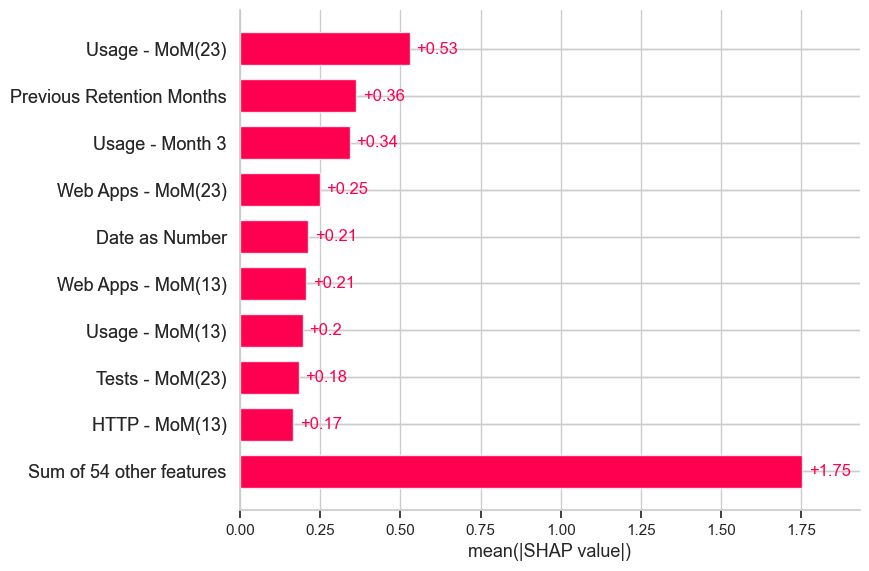

In [913]:
shap.plots.bar(shap_values)

As we can see *Retention Months* is the variable with highest impact in our model, significantly surpassing other variables. It is then followed by *Usage - MoM (2,3)*, representing the Month-over-Month change between Month 2 and Month 3. This is logical since Usage - MoM (2,3) reflects the usage pattern immediately preceding the determination of account status.

Let us plot a summary plot of the overall model:

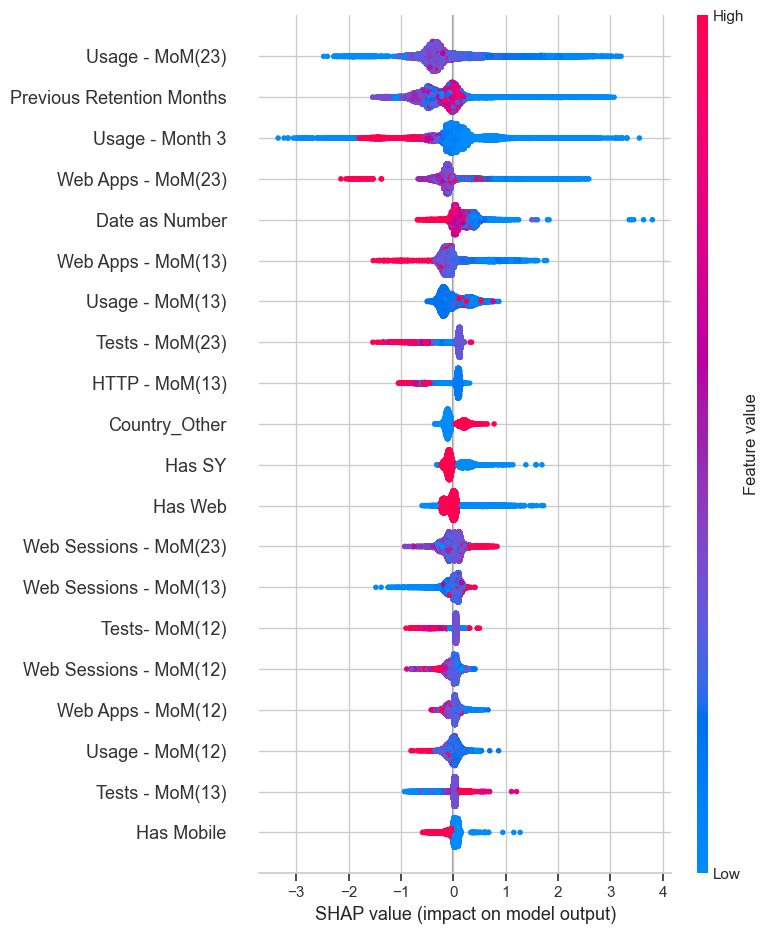

In [914]:
shap.summary_plot(shap_values, X_test)

Each point on the chart is one SHAP value for a prediction and feature. 

**Red** color means **higher** value of a feature. 

**Blue** means **lower** value of a feature. We can get the general sense of features’ directionality impact based on the distribution of the red and blue dots.

In the chart above, we can conclude the following insights:
- Higher value of *Retention Months* leads to lower probability of churn. On the other hand, a lower value of Retention Months is linked to a higher likelihood of churn, indicating challenges in retaining customers with shorter retention periods. This observation suggests that Dynatrace may face difficulties retaining customers with initial exposure to the product, but performs well in retaining longer-standing customers once they have become familiar and engaged.


Let us perform a deeper analysis by examining the impact separately for Churn and Non-Churn accounts

**Account that did not churn:**

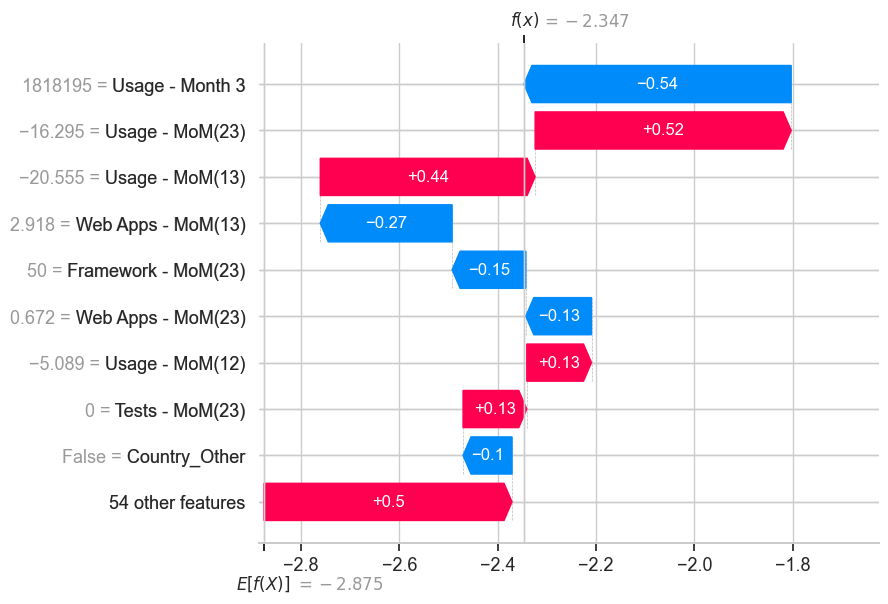

In [915]:
shap.plots.waterfall(shap_values[0])

**Churned Account:**

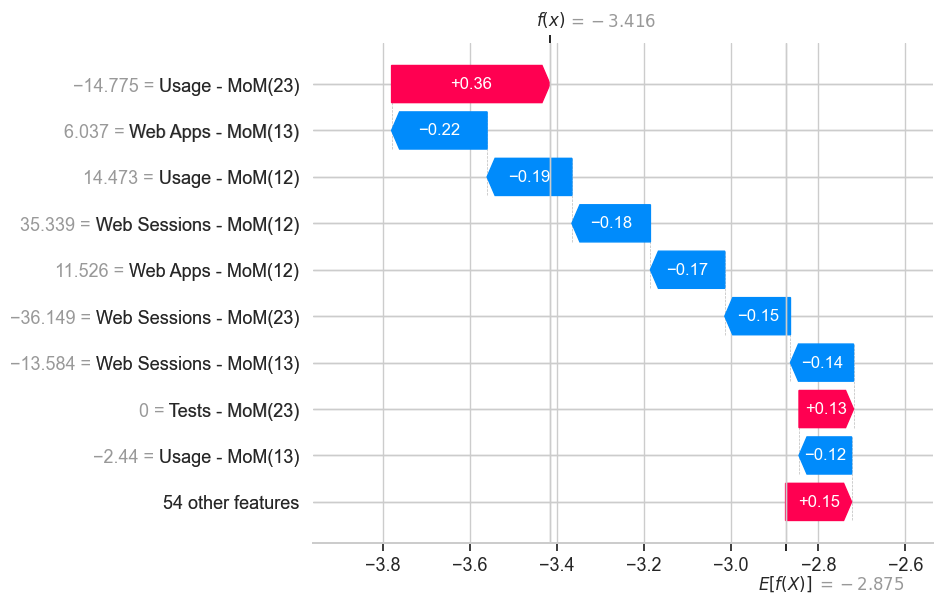

In [916]:
shap.plots.waterfall(shap_values[1])

## MODEL 2 - SURVIVAL ANALYSIS

- Time-to-event data: we are going to use the consecutive retention months before a customer churns.

- Event indicator: A binary column indicating whether the churn event has occurred (1) or not (0) for each customer.

In [917]:
df_DEM.fillna(0, inplace=True)
df_DEM.replace([np.inf, -np.inf], 0, inplace=True)
df_DEM = df_DEM[df_DEM['Date as Number'] != max_date - 1]

### **KALPLAN-MEIER SURVIVAL CUVE**

The Kaplan-Meier survival curve shows the estimated probability of customers not churning over time (in terms of retention months).

In [918]:
dff_ID = df_DEM.groupby('SFDC Account ID')

agg_retention_months = dff_ID['Previous Retention Months Has DEM'].last()
date = dff_ID['Consumption Date (Monthly)'].last()
churn_status = dff_ID['Lost Account Has DEM'].any()
vertical = dff_ID['Vertical'].last()
deployment = dff_ID['Deployment Type'].last()
arr = dff_ID['ARR Band'].last()
geolocation = dff_ID['Geolocation'].last()
country = dff_ID['Country'].last()
rum = dff_ID['UEM_ENABLED'].last()
se = dff_ID['SESSION_REPLAY_ENABLED'].last()
usage = dff_ID['DEM Units - DEM Total (Monthly)'].mean()
prev_usage = dff_ID['DEM Units - DEM Total (Monthly - Previous Month)'].mean()
apps = dff_ID['APPS_MOBILE'].mean() + dff_ID['WEB_APPS'].mean()
has_mob = dff_ID['Has Mobile'].last()
has_sr = dff_ID['Has SR'].last()
has_sy = dff_ID['Has SY'].last()
has_web = dff_ID['Has Web'].last()



kaplain_df = pd.DataFrame({
    'SFDC Account ID': agg_retention_months.index,
    'Previous Retention Months Has DEM': agg_retention_months.values,
    'Date': date.values,
    'Lost Account DEM': churn_status.values,
    'Vertical': vertical.values,
    'Deployment Type': deployment.values,
    'ARR Band': arr.values,
    'Geolocation': geolocation.values,
    'Country': country.values,
    'Avg Usage': usage.values,
    'Avg Prev Usage': prev_usage.values,
    'Avg Apps': apps.values,
    'RUM Enabled': rum.values,
    'SR Enabled': se.values,
    'Has Mobile': has_mob.values,
    'Has Web': has_web.values,
    'Has SR': has_sr.values,
    'Has SY': has_sy.values

})

DEM_embeding = kaplain_df.copy()

In [919]:
kaplain_df.head()

,SFDC Account ID,Previous Retention Months Has DEM,Date,Lost Account DEM,Vertical,Deployment Type,ARR Band,Geolocation,Country,Avg Usage,Avg Prev Usage,Avg Apps,RUM Enabled,SR Enabled,Has Mobile,Has Web,Has SR,Has SY
0,00100000001VLvGAAW,42,2024-06-01,False,Consulting & Technology,Managed,50-100k,NORAM,United States,4.145519e+04,4.133124e+04,213.428571,True,False,0,1,0,0
1,00100000001VLvZAAW,30,2024-06-01,False,Business Services,SaaS,250-500k,NORAM,United States,2.371900e+05,2.310105e+05,806.466667,True,False,0,1,0,1
2,00100000001VSZLAA4,24,2024-06-01,True,Manufacturing,Managed,100-250k,NORAM,United States,3.854432e+04,4.170915e+04,410.764706,True,False,0,1,1,0
3,00100000001XytIAAS,42,2024-06-01,False,Insurance,Managed,500-1M,NORAM,United States,6.492340e+05,6.414011e+05,4620.952381,True,False,0,1,0,1
4,00100000001Y6vqAAC,42,2024-06-01,False,Banking & Finance,SaaS,250-500k,NORAM,United States,5.631570e+06,5.608474e+06,8.547619,True,True,0,0,0,1


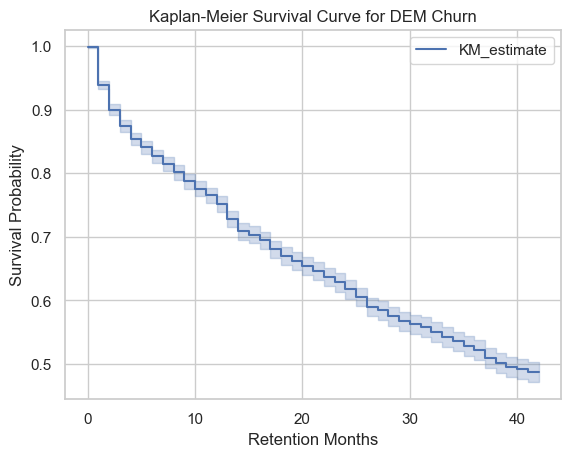

In [920]:
durations = kaplain_df['Previous Retention Months Has DEM']
event_observed = kaplain_df['Lost Account DEM']

kmf = KaplanMeierFitter()

kmf.fit(durations, event_observed)

kmf.plot()
plt.title('Kaplan-Meier Survival Curve for DEM Churn')
plt.xlabel('Retention Months')
plt.ylabel('Survival Probability')
plt.show()

Let us compute a confidence interval

In [921]:
ci = kmf.confidence_interval_survival_function_
ci.head()

,KM_estimate_lower_0.95,KM_estimate_upper_0.95
0.0,0.997022,0.999322
1.0,0.932320,0.945709
2.0,0.891285,0.908130
3.0,0.864869,0.883513
4.0,0.844061,0.863964


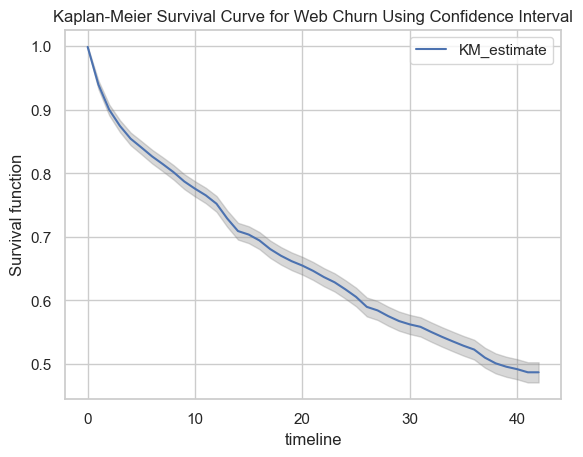

In [922]:
ts = ci.index
low, high = np.transpose(ci.values)

plt.fill_between(ts, low, high, color='gray', alpha=0.3)
kmf.survival_function_.plot(ax=plt.gca(), label='Deployment Type_SaaS')  # Adding label for SaaS
plt.title('Kaplan-Meier Survival Curve for Web Churn Using Confidence Interval')
plt.ylabel('Survival function')
plt.legend()


Let us now add additional attributes that will help us predict.

In [923]:
kaplain_df.head()

,SFDC Account ID,Previous Retention Months Has DEM,Date,Lost Account DEM,Vertical,Deployment Type,ARR Band,Geolocation,Country,Avg Usage,Avg Prev Usage,Avg Apps,RUM Enabled,SR Enabled,Has Mobile,Has Web,Has SR,Has SY
0,00100000001VLvGAAW,42,2024-06-01,False,Consulting & Technology,Managed,50-100k,NORAM,United States,4.145519e+04,4.133124e+04,213.428571,True,False,0,1,0,0
1,00100000001VLvZAAW,30,2024-06-01,False,Business Services,SaaS,250-500k,NORAM,United States,2.371900e+05,2.310105e+05,806.466667,True,False,0,1,0,1
2,00100000001VSZLAA4,24,2024-06-01,True,Manufacturing,Managed,100-250k,NORAM,United States,3.854432e+04,4.170915e+04,410.764706,True,False,0,1,1,0
3,00100000001XytIAAS,42,2024-06-01,False,Insurance,Managed,500-1M,NORAM,United States,6.492340e+05,6.414011e+05,4620.952381,True,False,0,1,0,1
4,00100000001Y6vqAAC,42,2024-06-01,False,Banking & Finance,SaaS,250-500k,NORAM,United States,5.631570e+06,5.608474e+06,8.547619,True,True,0,0,0,1


### **TRAINING MODELS USING SURVIVAL ANALYSIS:**

In [924]:
columns_to_encode = ['Deployment Type', 'Vertical', 'Country', 'Geolocation', 'ARR Band', 'RUM Enabled', 'SR Enabled']

label_encoder = LabelEncoder()


for column in columns_to_encode:
    kaplain_df[column] = label_encoder.fit_transform(kaplain_df[column].astype(str))

    original_values = label_encoder.classes_
    encoded_values = label_encoder.transform(original_values)
    

    print(f"\nConversions for {column}:")
    for original, encoded in zip(original_values, encoded_values):
        print(f"{original} = {encoded}")


Conversions for Deployment Type:
Managed = 0
SaaS = 1

Conversions for Vertical:
Banking & Finance = 0
Business Services = 1
Consulting & Technology = 2
Consumer Goods & Services = 3
Government = 4
Healthcare = 5
Insurance = 6
Logistics & Transportation = 7
Manufacturing = 8
Media & Entertainment = 9
Other = 10
Retail & Wholesale = 11
Software = 12
Telecommunications = 13
Utilities = 14

Conversions for Country:
Australia = 0
Brazil = 1
Canada = 2
France = 3
Germany = 4
Italy = 5
Mexico = 6
Other = 7
Spain = 8
United Kingdom = 9
United States = 10

Conversions for Geolocation:
0 = 0
APAC = 1
EMEA = 2
LATAM = 3
NORAM = 4

Conversions for ARR Band:
0-10k = 0
1.5-2M = 1
10-20k = 2
100-250k = 3
1M-1.5M = 4
20-50k = 5
250-500k = 6
2M-3M = 7
3-5M = 8
50-100k = 9
500-1M = 10
>5M = 11

Conversions for RUM Enabled:
0 = 0
False = 1
True = 2

Conversions for SR Enabled:
0 = 0
False = 1
True = 2


In [925]:
cols = [i for i in kaplain_df.columns if i not in ('Lost Account DEM', 'SFDC Account ID', ' Previous Retention Months Has DEM', 'Date')]

X_train, X_test, y_train, y_test = train_test_split(kaplain_df[cols], kaplain_df[['Lost Account DEM', 'Previous Retention Months Has DEM']], test_size=0.2, random_state=1)

In [926]:
print("Lenght X_train:",len(X_train))
print("Length y_train:", len(y_train))
print("Lenght X_test:",len(X_test))
print("Length y_test:", len(y_test))

Lenght X_train: 3941
Length y_train: 3941
Lenght X_test: 986
Length y_test: 986


In [927]:
event_indicator = (y_train['Lost Account DEM']).astype(bool)  
survival_times = y_train['Previous Retention Months Has DEM'].astype(int)  

event_field_name = 'event_indicator'  
time_field_name = 'survival_months'  

# Strucured array
y_structured = np.array(list(zip(event_indicator, survival_times)), 
                        dtype=[(event_field_name, bool), (time_field_name, float)])


#### RANDOM SURVIVAL FOREST:

In [928]:
rsf = RandomSurvivalForest(
    n_estimators=1000, min_samples_split=10, min_samples_leaf=15, n_jobs=-1, random_state=20
)
rsf.fit(X_train, y_structured)

RandomSurvivalForest(min_samples_leaf=15, min_samples_split=10,
                     n_estimators=1000, n_jobs=-1, random_state=20)

We can check how well the model performs by evaluating it on the test data:

In [929]:
event_indicator_test = (y_test['Lost Account DEM']).astype(bool)  
survival_times_test = y_test['Previous Retention Months Has DEM'].astype(int)  

event_field_name = 'event_indicator'  
time_field_name = 'survival_months'  

y_structured_test= np.array(list(zip(event_indicator_test, survival_times_test)), 
                        dtype=[(event_field_name, bool), (time_field_name, float)])

In [930]:
print('Score:', rsf.score(X_test, y_structured_test))

Score: 0.9150481498465555


Let us now select some customers of Abril 24, and apply a survival analysis on them:

In [931]:
data_abril = df_DEM[df_DEM['Consumption Date (Monthly)'] == '2024-04-01']

abril_sfdc_ids = data_abril['SFDC Account ID'].unique()

filtered_kaplain_df = kaplain_df[kaplain_df['SFDC Account ID'].isin(abril_sfdc_ids)]

X_testing = filtered_kaplain_df[cols]

In [932]:
surv_rf = rsf.predict_survival_function(X_testing, return_array=True)

#### GRADIENT BOOSTING SURVIVAL:

In [933]:
gboosts = GradientBoostingSurvivalAnalysis()
gboosts.fit(X_train, y_structured)

GradientBoostingSurvivalAnalysis()

In [934]:
print('Score:', gboosts.score(X_test, y_structured_test))

Score: 0.9820011287876116


In [935]:
surv_gboost = gboosts.predict_survival_function(X_testing, return_array=True)

#### SURVIVAL TREE:

In [936]:
st = SurvivalTree()
st.fit(X_train, y_structured)

SurvivalTree()

In [937]:
print('Score:', st.score(X_test, y_structured_test))

Score: 0.8727750537937846


In [938]:
surv_st = st.predict_survival_function(X_testing, return_array=True)

### PLOTS OF SURVIVAL CURVE 

In [939]:
sfdc_account_ids = filtered_kaplain_df['SFDC Account ID']
sfdc_account_ids_to_plot = '00100000003YiebAAC'

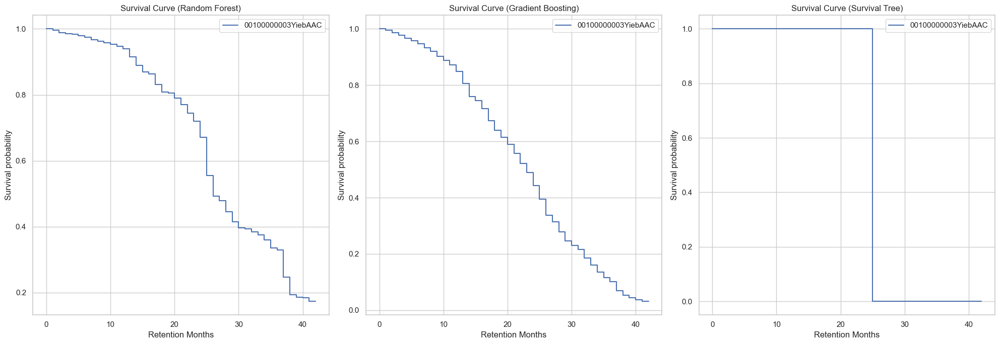

In [940]:
unique_times_rsf = rsf.unique_times_
unique_times_gb = gboosts.unique_times_
unique_times_st = st.unique_times_

fig, axes = plt.subplots(1, 3, figsize=(20, 7))  

# Random Forest
ax1 = axes[0]  
ax1.set_title('Survival Curve (Random Forest)')
ax1.set_ylabel("Survival probability")
ax1.set_xlabel("Retention Months")

for sfdc_account_id, s in zip(sfdc_account_ids, surv_rf):
    if sfdc_account_id in sfdc_account_ids_to_plot:
        ax1.step(unique_times_rsf, s, where="post", label=f"{sfdc_account_id}")

ax1.legend()
ax1.grid(True)

# Gradient Boosting
ax2 = axes[1] 
ax2.set_title('Survival Curve (Gradient Boosting)')
ax2.set_ylabel("Survival probability")
ax2.set_xlabel("Retention Months")

for sfdc_account_id, s in zip(sfdc_account_ids, surv_gboost):
    if sfdc_account_id in sfdc_account_ids_to_plot:
        ax2.step(unique_times_gb, s, where="post", label=f"{sfdc_account_id}")

ax2.legend()
ax2.grid(True)

# Survival Tree
ax3 = axes[2] 
ax3.set_title('Survival Curve (Survival Tree)')
ax3.set_ylabel("Survival probability")
ax3.set_xlabel("Retention Months")

for sfdc_account_id, s in zip(sfdc_account_ids, surv_st):
    if sfdc_account_id in sfdc_account_ids_to_plot:
        ax3.step(unique_times_st, s, where="post", label=f"{sfdc_account_id}")

ax3.legend()
ax3.grid(True)

# Displaying the plot
plt.tight_layout()
plt.show()


#### Survival Table:

Let's create a table with the survival probability for each model.

RANDOM FOREST SURVIVAL:

In [941]:
survival_table_rf = pd.DataFrame(index=rsf.unique_times_, columns=sfdc_account_ids)

for i, (sfdc_account_id, s) in enumerate(zip(sfdc_account_ids, surv_rf)):
    survival_table_rf[sfdc_account_id] = s


survival_table_transposed_rf = survival_table_rf.T.reset_index()
survival_table_transposed_rf.rename(columns={'index': 'SFDC Account ID'}, inplace=True)

In [942]:
survival_table_transposed_rf.head()

,SFDC Account ID,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,...,33.0,34.0,35.0,36.0,37.0,38.0,39.0,40.0,41.0,42.0
0,00100000001VLvGAAW,0.999886,0.997001,0.993536,0.988624,0.985685,0.981135,0.973099,0.968616,0.963311,...,0.793501,0.788668,0.783395,0.777020,0.769320,0.767937,0.765530,0.763250,0.761016,0.761016
1,00100000001VLvZAAW,1.000000,0.999739,0.999157,0.998919,0.997119,0.994649,0.994280,0.993147,0.992040,...,0.887784,0.880381,0.877199,0.866503,0.827846,0.817174,0.806157,0.790963,0.786274,0.786274
2,00100000001VSZLAA4,0.999906,0.997619,0.993935,0.990287,0.986255,0.981642,0.973319,0.969192,0.963828,...,0.536452,0.530279,0.519797,0.513569,0.505885,0.503680,0.501848,0.499739,0.498838,0.498838
3,00100000001XytIAAS,1.000000,0.999282,0.999001,0.998935,0.998929,0.998825,0.998349,0.998021,0.997330,...,0.964807,0.964348,0.963999,0.960962,0.957126,0.952595,0.950182,0.948538,0.947479,0.947479
4,00100000001Y6vqAAC,0.999825,0.996880,0.992883,0.991505,0.985468,0.984467,0.982497,0.979891,0.977258,...,0.885680,0.883124,0.880316,0.875590,0.867163,0.863545,0.860225,0.857452,0.856687,0.856687


In [943]:
survival_long_format = pd.melt(
    survival_table_transposed_rf,
    id_vars=['SFDC Account ID'],
    var_name='DEM - Retention Months',
    value_name='DEM- Probability of Survival'
)
survival_long_format.head()


,SFDC Account ID,DEM - Retention Months,DEM- Probability of Survival
0,00100000001VLvGAAW,0.0,0.999886
1,00100000001VLvZAAW,0.0,1.000000
2,00100000001VSZLAA4,0.0,0.999906
3,00100000001XytIAAS,0.0,1.000000
4,00100000001Y6vqAAC,0.0,0.999825


In [944]:
survival_long_format.to_csv('Survival/DEMSurvivalTable.csv', index=False)

GRADIENT BOOSING SURVIVAL:

In [945]:
survival_table_gb = pd.DataFrame(index=gboosts.unique_times_, columns=sfdc_account_ids)

for i, (sfdc_account_id, s) in enumerate(zip(sfdc_account_ids, surv_gboost)):
    survival_table_gb[sfdc_account_id] = s


survival_table_transposed_gb = survival_table_gb.T.reset_index()
survival_table_transposed_gb.rename(columns={'index': 'SFDC Account ID'}, inplace=True)

In [946]:
survival_table_transposed_gb.head()

,SFDC Account ID,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,...,33.0,34.0,35.0,36.0,37.0,38.0,39.0,40.0,41.0,42.0
0,00100000001VLvGAAW,0.999995,0.999769,0.999383,0.998938,0.998417,0.997956,0.997360,0.996708,0.996013,...,0.915881,0.908177,0.901708,0.895535,0.879402,0.868211,0.860711,0.853291,0.846733,0.846733
1,00100000001VLvZAAW,0.999978,0.998939,0.997169,0.995128,0.992747,0.990640,0.987925,0.984957,0.981807,...,0.667730,0.642304,0.621541,0.602223,0.553950,0.522282,0.501865,0.482285,0.465483,0.465483
2,00100000001VSZLAA4,0.999950,0.997570,0.993524,0.988870,0.983455,0.978678,0.972542,0.965859,0.958793,...,0.396284,0.362547,0.336247,0.312774,0.258265,0.225669,0.205959,0.188005,0.173330,0.173330
3,00100000001XytIAAS,0.999995,0.999769,0.999383,0.998938,0.998417,0.997956,0.997360,0.996708,0.996013,...,0.915881,0.908177,0.901708,0.895535,0.879402,0.868211,0.860711,0.853291,0.846733,0.846733
4,00100000001Y6vqAAC,0.999995,0.999769,0.999383,0.998938,0.998417,0.997956,0.997360,0.996708,0.996013,...,0.915881,0.908177,0.901708,0.895535,0.879402,0.868211,0.860711,0.853291,0.846733,0.846733


In [947]:
test_filtered_last.head()

,SFDC Account ID,Predicting Month,Date as Number,Previous Retention Months,Usage - Month 3,Usage - MoM(12),Usage - MoM(13),Usage - MoM(23),Web Apps - MoM(12),Web Apps - MoM(13),...,Vertical_Utilities,Has Web,Has Mobile,Has SR,Has SY,Prediction,Binary Prediction,Actual Value,Probability of Churn,Probability of Survival
38,00100000001VLvGAAW,2024-05-01,42,41,29300,837.141,914.192,8.222,92.308,184.615,...,False,1,0,0,0,0,1,0,0.4767,0.5233
66,00100000001VLvZAAW,2024-05-01,42,29,503729,17.058,94.296,65.982,21.053,10.655,...,False,1,0,0,1,0,0,0,0.0025,0.9975
98,00100000001VSZLAA4,2024-05-01,42,23,30686,-35.104,-33.089,3.105,14.773,11.080,...,False,1,0,1,0,0,0,0,0.0470,0.9530
138,00100000001XytIAAS,2024-05-01,42,41,883259,-1.563,2.610,4.240,9.052,6.527,...,False,1,0,0,1,0,1,0,0.4198,0.5802
178,00100000001Y6vqAAC,2024-05-01,42,41,3905818,-8.225,-6.715,1.645,0.000,0.000,...,False,0,0,0,1,0,0,0,0.0489,0.9511


In [948]:
survival_df = pd.DataFrame(columns=['SFDC Account ID', 'Predicting Month', 'Previous Retention Months', 'Prediction', 'Actual Value', 'Probability of Churn', 'Probability of Survival','Survival Probability RF', 'Survival Probability GB'])

for index, row in test_filtered_last.iterrows():
    sfdc_account_id = row['SFDC Account ID']
    month = row['Predicting Month']
    prev_retention_months = row['Previous Retention Months']
    predicted_value = row['Prediction']
    actual_value = row['Actual Value']
    churn_prob = row['Probability of Churn']
    surv_prob = row['Probability of Survival']
    
    if sfdc_account_id in survival_table_transposed_rf['SFDC Account ID'].values:
        survival_row_rf = survival_table_transposed_rf[survival_table_transposed_rf['SFDC Account ID'] == sfdc_account_id]
        try:
            survival_prob_rf = survival_row_rf.at[survival_row_rf.index[0], prev_retention_months]
        except KeyError:
            survival_prob_rf = 0

    if sfdc_account_id in survival_table_transposed_gb['SFDC Account ID'].values:
        survival_row_gb = survival_table_transposed_gb[survival_table_transposed_gb['SFDC Account ID'] == sfdc_account_id]
        try:
            survival_prob_gb = survival_row_gb.at[survival_row_gb.index[0], prev_retention_months]
        except KeyError:
            survival_prob_gb = 0

            

    survival_df = survival_df._append({'SFDC Account ID': sfdc_account_id,
                            'Predicting Month': month,
                            'Previous Retention Months': prev_retention_months,
                            'Actual Value': actual_value,
                            'Prediction': predicted_value,
                            'Probability of Churn': churn_prob,
                            'Probability of Survival': surv_prob,
                            'Survival Probability RF': survival_prob_rf,
                            'Survival Probability GB': survival_prob_gb}, ignore_index=True)

C:\Users\martina.tarres\AppData\Local\Temp\ipykernel_25572\576253458.py:28: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  survival_df = survival_df._append({'SFDC Account ID': sfdc_account_id,


CHANGE TRESHOLD TO FIND BEST PARAMETER

In [949]:
survival_df['Probability of Churn RF'] = 1 - survival_df['Survival Probability RF']
survival_df['Probability of Churn GB'] = 1 - survival_df['Survival Probability GB']
survival_df.head()

,SFDC Account ID,Predicting Month,Previous Retention Months,Prediction,Actual Value,Probability of Churn,Probability of Survival,Survival Probability RF,Survival Probability GB,Probability of Churn RF,Probability of Churn GB
0,00100000001VLvGAAW,2024-05-01,41,0,0,0.4767,0.5233,0.761016,0.846733,0.238984,0.153267
1,00100000001VLvZAAW,2024-05-01,29,0,0,0.0025,0.9975,0.913544,0.733147,0.086456,0.266853
2,00100000001VSZLAA4,2024-05-01,23,0,0,0.0470,0.9530,0.779094,0.696559,0.220906,0.303441
3,00100000001XytIAAS,2024-05-01,41,0,0,0.4198,0.5802,0.947479,0.846733,0.052521,0.153267
4,00100000001Y6vqAAC,2024-05-01,41,0,0,0.0489,0.9511,0.856687,0.846733,0.143313,0.153267


#### RANDOM FOREST:

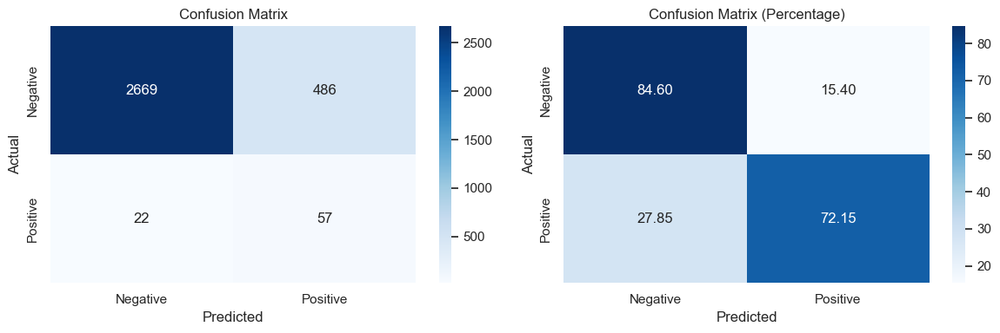

Metrics       | Testing Set
---------------------------------
Precision     | 0.1050
Recall        | 0.7215
Accuracy      | 0.8429
F1 Score      | 0.1833


In [950]:
threshold_rf = 0.27

survival_df['Prediction RF'] = np.where(survival_df['Probability of Churn RF'] >= threshold_rf, 1, 0)

true_labels = survival_df['Actual Value'].astype(int)
predicted_labels_rf = survival_df['Prediction RF'].astype(int)

evaluate_metrics_test(true_labels, predicted_labels_rf)


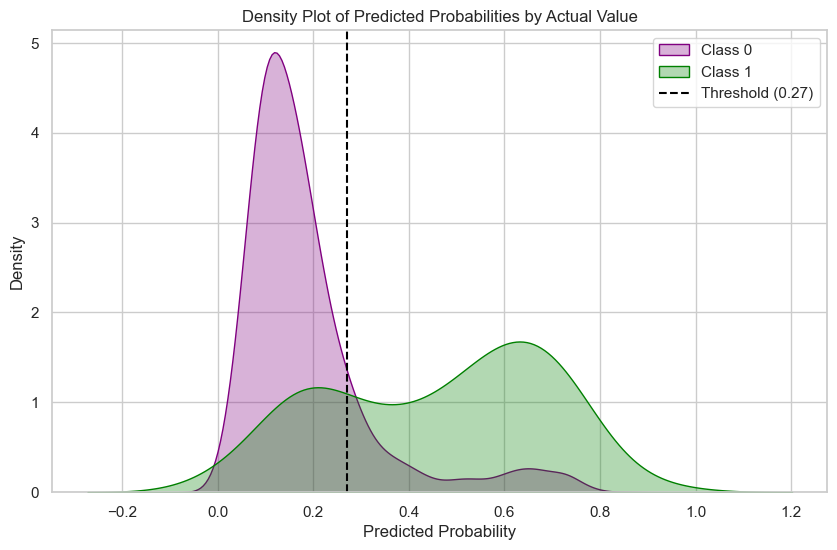

In [951]:
sns.set(style="whitegrid")
colors = ['purple', 'green']
plt.figure(figsize=(10, 6))

for class_value, color in zip([0, 1], colors):
    sns.kdeplot( data=survival_df[survival_df["Actual Value"] == class_value], x="Probability of Churn RF", fill=True, common_norm=False, alpha=0.3, linewidth=1, color=color, label=f'Class {class_value}')

plt.axvline(x=threshold_rf, linestyle='--', color='black', label=f'Threshold ({threshold_rf})')

plt.title("Density Plot of Predicted Probabilities by Actual Value")
plt.xlabel("Predicted Probability")
plt.ylabel("Density")
plt.legend()

plt.show()

#### GRADIENT BOOSTING:

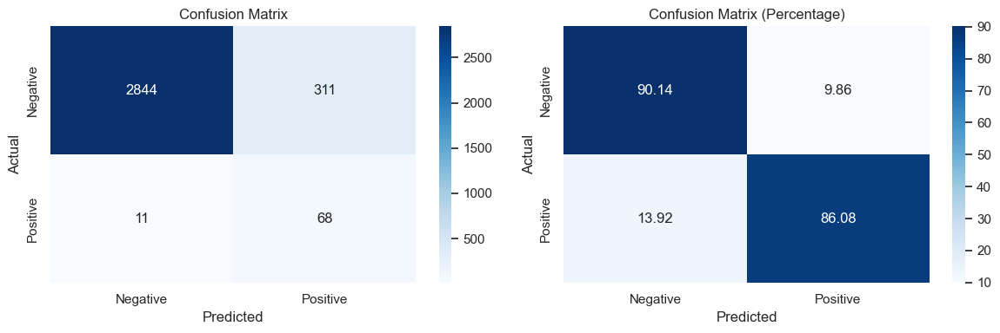

Metrics       | Testing Set
---------------------------------
Precision     | 0.1794
Recall        | 0.8608
Accuracy      | 0.9004
F1 Score      | 0.2969


In [952]:
threshold_gb = 0.31

survival_df['Prediction GB'] = np.where(survival_df['Probability of Churn GB'] >= threshold_gb, 1, 0)

predicted_labels_gb = survival_df['Prediction GB'].astype(int)

evaluate_metrics_test(true_labels, predicted_labels_gb)

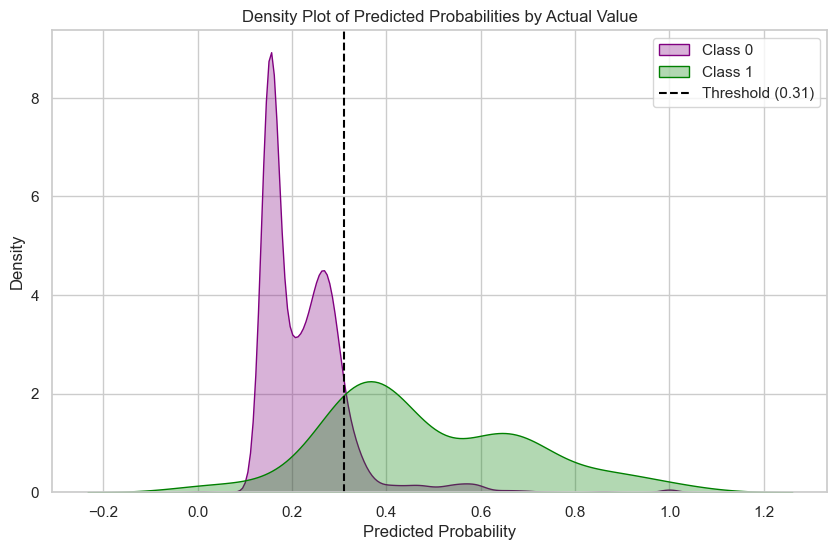

In [953]:
sns.set(style="whitegrid")
colors = ['purple', 'green']
threshold_gb = 0.31

plt.figure(figsize=(10, 6))

for class_value, color in zip([0, 1], colors):
    sns.kdeplot( data=survival_df[survival_df["Actual Value"] == class_value], x="Probability of Churn GB", fill=True, common_norm=False, alpha=0.3, linewidth=1, color=color, label=f'Class {class_value}')

plt.axvline(x=threshold_gb, linestyle='--', color='black', label=f'Threshold ({threshold_gb})')
plt.title("Density Plot of Predicted Probabilities by Actual Value")
plt.xlabel("Predicted Probability")
plt.ylabel("Density")
plt.legend()


plt.show()

## MODEL 3 - DEEP LEARNING WITH EMBEDING MODEL:

We will now use a embeding model, where we will transform text or attributes into a dense vector of a fixed size.

Sentence Transformers are models designed to convert sentences or texts into numerical representations (vectors or embeddings) in such a way that semantically similar texts have similar embeddings.

In [954]:
DEM_embeding.head()

,SFDC Account ID,Previous Retention Months Has DEM,Date,Lost Account DEM,Vertical,Deployment Type,ARR Band,Geolocation,Country,Avg Usage,Avg Prev Usage,Avg Apps,RUM Enabled,SR Enabled,Has Mobile,Has Web,Has SR,Has SY
0,00100000001VLvGAAW,42,2024-06-01,False,Consulting & Technology,Managed,50-100k,NORAM,United States,4.145519e+04,4.133124e+04,213.428571,True,False,0,1,0,0
1,00100000001VLvZAAW,30,2024-06-01,False,Business Services,SaaS,250-500k,NORAM,United States,2.371900e+05,2.310105e+05,806.466667,True,False,0,1,0,1
2,00100000001VSZLAA4,24,2024-06-01,True,Manufacturing,Managed,100-250k,NORAM,United States,3.854432e+04,4.170915e+04,410.764706,True,False,0,1,1,0
3,00100000001XytIAAS,42,2024-06-01,False,Insurance,Managed,500-1M,NORAM,United States,6.492340e+05,6.414011e+05,4620.952381,True,False,0,1,0,1
4,00100000001Y6vqAAC,42,2024-06-01,False,Banking & Finance,SaaS,250-500k,NORAM,United States,5.631570e+06,5.608474e+06,8.547619,True,True,0,0,0,1


Let us first convert our data into tokens, so the text is first split into smaller units called tokens:

In [955]:
def compile_text(x):
    text = f"""SFDC Account ID: {x['SFDC Account ID']}, Previous Retention Months Has DEM: {x['Previous Retention Months Has DEM']}, Vertical: {x['Vertical']}, Deployment Type: {x['Deployment Type']}, ARR Band: {x['ARR Band']}, Geolocation: {x['Geolocation']}, Country: {x['Country']}, Avg Usage: {x['Avg Usage']}, Avg Prev Usage: {x['Avg Prev Usage']}, Avg Apps: {x['Avg Apps']}, RUM Enabled: {x['RUM Enabled']}, SR Enabled: {x['SR Enabled']}, Has Mobile: {x['Has Mobile']}, Has Web: {x['Has Web']}, Has SR: {x['Has SR']}, Has SY: {x['Has SY']}"""
    return text


sentences = DEM_embeding.apply(lambda x: compile_text(x), axis=1).tolist()

Let us now encode each token into a numerical representation:

In [956]:
model = SentenceTransformer(r"sentence-transformers/paraphrase-MiniLM-L6-v2") 
output = model.encode(sentences=sentences, show_progress_bar=True, normalize_embeddings=True) 
df_embedding = pd.DataFrame(output) 
df_embedding

c:\Users\martina.tarres\AppData\Local\Programs\Python\Python39\lib\site-packages\huggingface_hub\file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


Batches:   0%|          | 0/154 [00:00<?, ?it/s]

,0,1,2,3,4,5,6,7,8,9,...,374,375,376,377,378,379,380,381,382,383
0,-0.032415,-0.016602,-0.019057,-0.019275,-0.040797,-0.023044,-0.045139,0.037131,0.022933,-0.008243,...,0.001499,-0.035636,0.016318,-0.021081,-0.010145,0.011280,-0.015394,-0.035857,-0.038326,0.014065
1,-0.034715,-0.043352,-0.045243,-0.039905,-0.055734,-0.002931,-0.038845,0.027986,0.036310,0.001547,...,0.019394,-0.046244,-0.007543,0.014329,0.013415,0.028267,-0.019136,-0.018740,-0.040134,0.002432
2,-0.027984,-0.031503,0.001991,-0.025869,-0.028972,-0.034850,-0.062343,0.039388,0.004701,0.013582,...,0.020971,-0.042995,0.007274,-0.000847,0.007306,0.024658,-0.013792,-0.047091,-0.026267,-0.002542
3,-0.018811,-0.032590,0.006150,-0.033352,0.003659,-0.009291,-0.054274,0.059942,0.028877,0.012923,...,-0.010680,-0.039849,0.002444,0.009700,0.002299,0.003241,-0.029768,-0.056107,-0.031699,0.020944
4,-0.024033,-0.027162,-0.037117,-0.015675,-0.031866,-0.010674,-0.067069,0.051264,0.031417,-0.004362,...,0.027867,-0.064242,0.003333,-0.011731,0.015503,-0.018340,-0.001707,-0.052941,-0.045290,-0.011284
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4922,0.007632,-0.008644,-0.025293,-0.059194,-0.015560,-0.033405,-0.052095,0.021825,0.048450,-0.016597,...,0.017404,-0.020939,0.014993,0.012278,0.025542,0.026309,-0.053327,-0.029264,-0.018754,-0.020676
4923,0.009288,-0.032878,-0.011209,-0.041594,-0.012553,-0.020278,-0.031298,0.043490,0.049713,-0.019546,...,0.018895,-0.049582,-0.004510,-0.018268,0.002455,0.009387,-0.042550,-0.018714,-0.031414,0.013610
4924,-0.043066,-0.017151,-0.015969,-0.015375,-0.021760,-0.018438,-0.081464,0.073702,0.019948,-0.015810,...,0.017534,-0.078789,0.009382,-0.031142,0.003876,-0.002882,-0.002779,-0.061770,-0.027091,-0.002610
4925,0.014653,-0.044277,-0.010804,-0.035453,-0.008555,-0.007647,-0.065163,0.029218,0.049867,-0.030056,...,0.023751,-0.055695,0.013861,0.006291,0.012301,0.023548,-0.046110,-0.008237,0.012005,-0.016326


Let us prepare the data:

In [957]:
X = df_embedding  
y = DEM_embeding['Lost Account DEM'] 

Split the data into train and test:

In [958]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Inicialize and train the model:

In [959]:
lgb_classifier = lgb.LGBMClassifier()
lgb_classifier.fit(X_train, y_train)
y_pred = lgb_classifier.predict(X_test)

[LightGBM] [Info] Number of positive: 1708, number of negative: 2233
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 97920
[LightGBM] [Info] Number of data points in the train set: 3941, number of used features: 384
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.433393 -> initscore=-0.268023
[LightGBM] [Info] Start training from score -0.268023


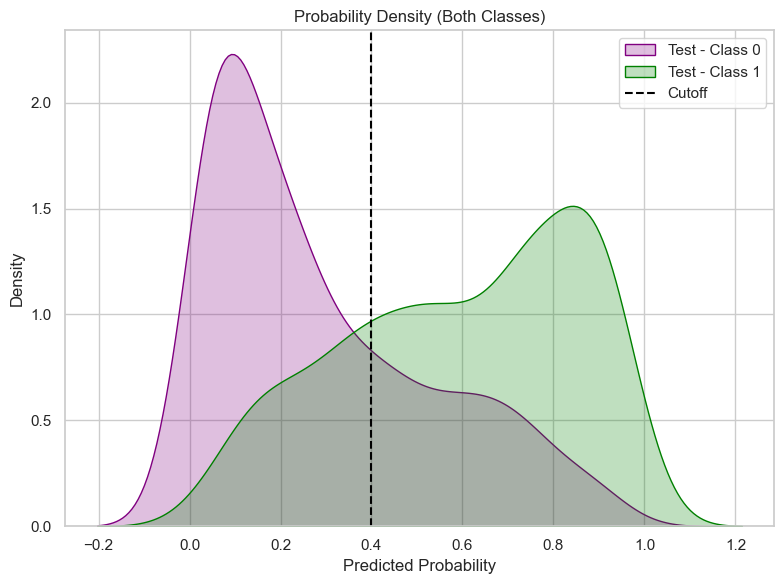

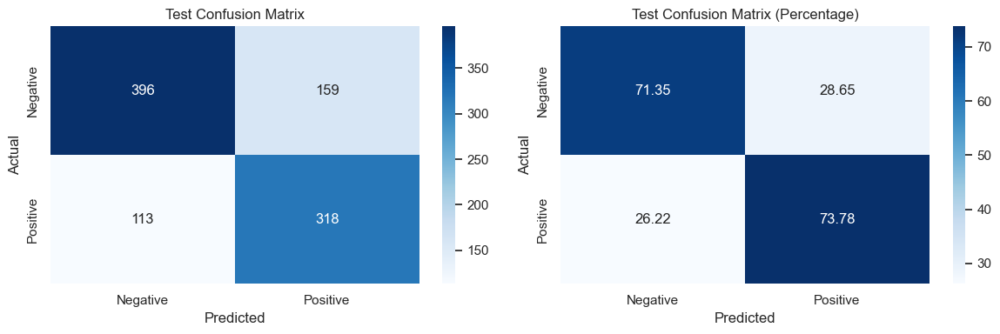

Model Evaluation Metrics:

Metrics       | Training Set | Testing Set
---------------------------------------------
Precision     | 0.9994       | 0.6667
Recall        | 1.0000       | 0.7378
Accuracy      | 0.9997       | 0.7241
F1 Score      | 0.9997       | 0.7004


In [960]:
train_model_and_performance_eval(lgb_classifier, X_train, X_test, y_train, y_test, X, cutoff=0.4)

# WEB

## MODEL 1 - TRADITIONAL MACHINE LEARNING

### 3 MONTHS WINDOW

-- Running time: 3 minutes

In [1003]:
def create_window_df(df):
    window_df = []
    
    data = df.groupby('SFDC Account ID')

    for group_name, group_df in data:
        group_df = group_df.sort_values(by='Consumption Date (Monthly)')
        
        for idx in range(len(group_df) - 3):
            row_data = group_df.iloc[idx:idx+4]

            # DEM Units Web (monthly):
            usage_month_1, usage_month_2, usage_month_3, usage_month_4 = row_data['DEM Units - Web Total (Monthly)']
            usage_mom_1_2 = round(((usage_month_2 - usage_month_1) / usage_month_1) * 100, 3) if usage_month_1 != 0 else 0
            usage_mom_1_3 = round(((usage_month_3 - usage_month_1) / usage_month_1) * 100, 3) if usage_month_1 != 0 else 0
            usage_mom_2_3 = round(((usage_month_3 - usage_month_2) / usage_month_2) * 100, 3) if usage_month_2 != 0 else 0

            ## Web Apps:
            Apps_month_1, Apps_month_2, Apps_month_3, Apps_month_4 = row_data['WEB_APPS']
            Apps_mom_1_2 = round(((Apps_month_2 - Apps_month_1) / Apps_month_1) * 100, 3) if Apps_month_1 != 0 else 0
            Apps_mom_1_3 = round(((Apps_month_3 - Apps_month_1) / Apps_month_1) * 100, 3) if Apps_month_1 != 0 else 0
            Apps_mom_2_3 = round(((Apps_month_3 - Apps_month_2) / Apps_month_2) * 100, 3) if Apps_month_2 != 0 else 0
    
            # Web Billed Sessions:
            se_month_1, se_month_2, se_month_3, se_month_4 = row_data['RUM_SESSIONS_WEB']
            se_mom_1_2 = round(((se_month_2 - se_month_1) / se_month_1) * 100, 3) if se_month_1 != 0 else 0
            se_mom_1_3 = round(((se_month_3 - se_month_1) / se_month_1) * 100, 3) if se_month_1 != 0 else 0
            se_mom_2_3 = round(((se_month_3 - se_month_2) / se_month_2) * 100, 3) if se_month_2 != 0 else 0
    
             # Competitor framework:
            frame_month_1, frame_month_2, frame_month_3, frame_month_4 = row_data['FRAMEWORK']
            frame_mom_1_2 = round(((frame_month_2 - frame_month_1) / frame_month_1) * 100, 3) if frame_month_1 != 0 else 0
            frame_mom_1_3 = round(((frame_month_3 - frame_month_1) / frame_month_1) * 100, 3) if frame_month_1 != 0 else 0
            frame_mom_2_3 = round(((frame_month_3 - frame_month_2) / frame_month_2) * 100, 3) if frame_month_2 != 0 else 0
    
            mobile = row_data.iloc[3]['Has Mobile']
            sr = row_data.iloc[3]['Has SR']
            sy = row_data.iloc[3]['Has SY']
            month = row_data.iloc[3]['Consumption Date (Monthly)']
            target = row_data.iloc[3]['Lost Account Has Web']
            number = row_data.iloc[3]['Date as Number']
            prev_retention = row_data.iloc[3]['Previous Retention Months Has Web']

            # Extracting encoded columns dynamically
            encoded_cols = [col for col in row_data.columns if col.startswith(tuple(categorical))]
            encoded_data = row_data[encoded_cols].values.flatten()

            window_df.append({
                'SFDC Account ID': group_name,
                'Predicting Month': month,
                'Date as Number': number,
                'Previous Retention Months' : prev_retention,

                'Usage - Month 3': usage_month_3,
                'Usage - MoM(12)': usage_mom_1_2,
                'Usage - MoM(13)': usage_mom_1_3,
                'Usage - MoM(23)': usage_mom_2_3,
                
                #'Web Apps - MoM(12)': Apps_mom_1_2,
                #'Web Apps - MoM(13)': Apps_mom_1_3,
                'Web Apps - MoM(23)': Apps_mom_2_3,

                #'Web Sessions - MoM(12)': se_mom_1_2,
                #'Web Sessions - MoM(13)': se_mom_1_3,
                'Web Sessions - MoM(23)': se_mom_2_3,

                #'Framework - MoM(12)': frame_mom_1_2,
                #'Framework - MoM(13)': frame_mom_1_3,
                'Framework - MoM(23)': frame_mom_2_3,

                **{col: val for col, val in zip(encoded_cols, encoded_data)},
                
                'Has Mobile': mobile,
                'Has SR': sr,
                'Has SY': sy,
                'Target (lost customer)': target
            })
    
    return pd.DataFrame(window_df)

web_df = create_window_df(encoded_data_W)
web_df['Target (lost customer)'] = web_df['Target (lost customer)'].astype(int)

We are going to use the last month for testing the model. Hence, let us remove the last completed month (March 2024 for now), and proceed to develop the model without this month. Later we will use it for testing, and compare its accuracy. 

In [1004]:
train_val_filtered = web_df[(web_df['Date as Number'] != max_date) & (web_df['Date as Number'] != (max_date -2)) &  (web_df['Date as Number'] != (max_date -1))]

In [1005]:
train_val_filtered

,SFDC Account ID,Predicting Month,Date as Number,Previous Retention Months,Usage - Month 3,Usage - MoM(12),Usage - MoM(13),Usage - MoM(23),Web Apps - MoM(23),Web Sessions - MoM(23),...,Vertical_Media & Entertainment,Vertical_Other,Vertical_Retail & Wholesale,Vertical_Software,Vertical_Telecommunications,Vertical_Utilities,Has Mobile,Has SR,Has SY,Target (lost customer)
0,00100000001VLvGAAW,2021-03-01,4,3,50012,-7.101,-7.323,-0.239,-22.835,-5.942,...,False,False,False,False,False,False,0,0,0,0
1,00100000001VLvGAAW,2021-04-01,5,4,55523,-0.239,10.754,11.019,19.388,10.639,...,False,False,False,False,False,False,0,0,0,0
2,00100000001VLvGAAW,2021-05-01,6,5,62774,11.019,25.518,13.059,25.641,18.881,...,False,False,False,False,False,False,0,0,0,0
3,00100000001VLvGAAW,2021-06-01,7,6,55492,13.059,-0.056,-11.600,7.483,-11.826,...,False,False,False,False,False,False,0,0,0,0
4,00100000001VLvGAAW,2021-07-01,8,7,53799,-11.600,-14.297,-3.051,-5.696,-3.855,...,False,False,False,False,False,False,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114261,001Rj000008cInMIAU,2023-11-01,36,35,101595,1.135,-4.161,-5.237,3.260,-12.237,...,False,False,True,False,False,False,0,1,1,0
114262,001Rj000008cInMIAU,2023-12-01,37,36,78573,-5.237,-26.710,-22.661,-13.164,-20.496,...,False,False,True,False,False,False,0,1,1,0
114263,001Rj000008cInMIAU,2024-01-01,38,37,54757,-22.661,-46.103,-30.311,4.200,-25.796,...,False,False,True,False,False,False,0,1,1,0
114264,001Rj000008cInMIAU,2024-02-01,39,38,89668,-30.311,14.121,63.756,7.016,40.533,...,False,False,True,False,False,False,0,1,1,0


In [1006]:
cols = [i for i in train_val_filtered.columns if i not in ('Target (lost customer)', 'SFDC Account ID', 'Predicting Month')]

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(train_val_filtered[cols], train_val_filtered['Target (lost customer)'], test_size=0.2, random_state=1)

In [1007]:
print("Lenght X_train:",len(X_train))
print("Length y_train:", len(y_train))
print("Lenght X_test:",len(X_test))
print("Length y_test:", len(y_test))

Lenght X_train: 83739
Length y_train: 83739
Lenght X_test: 20935
Length y_test: 20935


### RANDOM FOREST CLASSIFIER

In [1008]:
# MODEL TRAINING

rf = RandomForestClassifier(class_weight='balanced')
rf.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced')

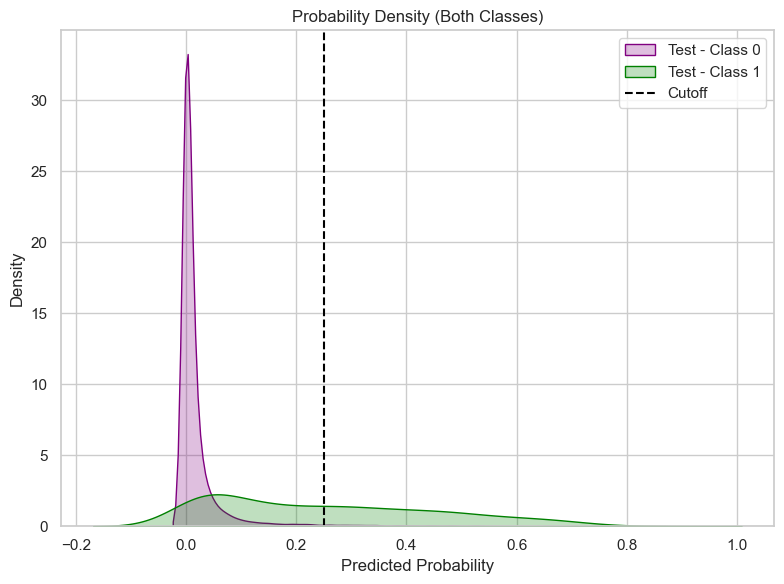

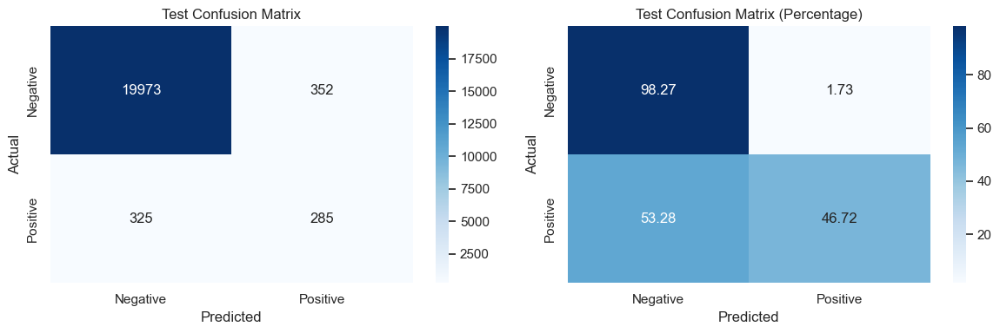

Model Evaluation Metrics:

Metrics       | Training Set | Testing Set
---------------------------------------------
Precision     | 0.9810       | 0.4474
Recall        | 1.0000       | 0.4672
Accuracy      | 0.9994       | 0.9677
F1 Score      | 0.9904       | 0.4571


In [1009]:
train_model_and_performance_eval(rf, X_train, X_test, y_train, y_test, cols, cutoff=0.25)

### EXTREME GRADIENT BOOSTING:

In [1010]:
# MODEL TRAINING
xgboost = xgb.XGBClassifier()
xgboost.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

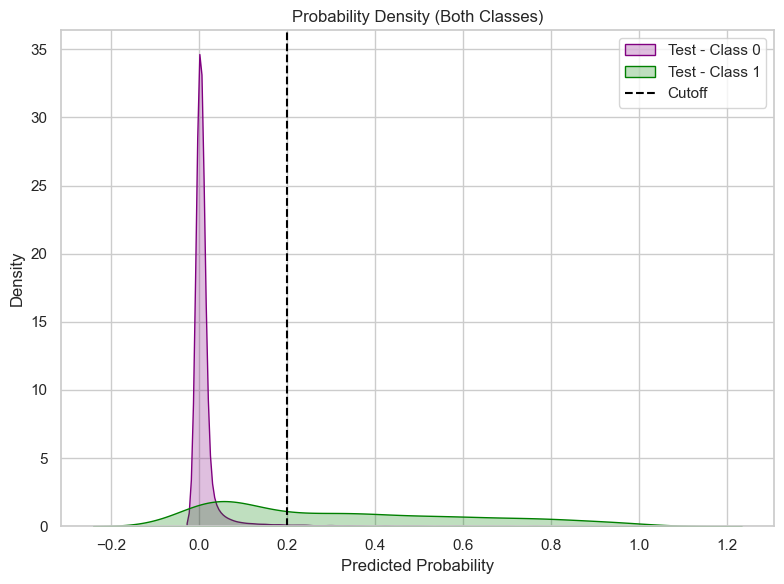

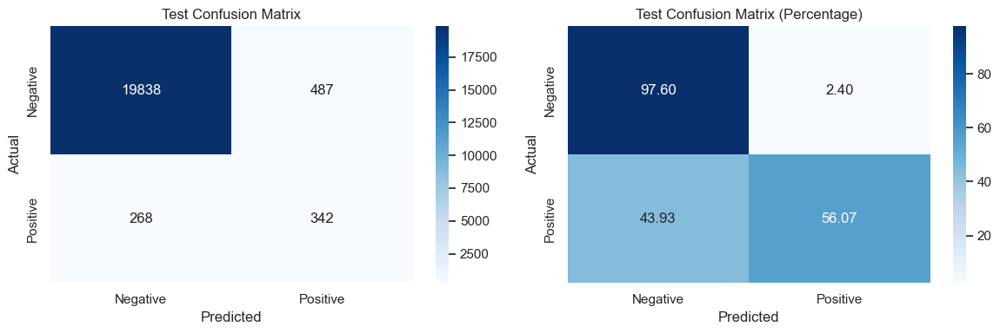

Model Evaluation Metrics:

Metrics       | Training Set | Testing Set
---------------------------------------------
Precision     | 0.6026       | 0.4125
Recall        | 0.8552       | 0.5607
Accuracy      | 0.9795       | 0.9639
F1 Score      | 0.7070       | 0.4753


In [1011]:
train_model_and_performance_eval(xgboost, X_train, X_test, y_train, y_test, cols, cutoff=0.2)

### LIGHT GBM CLASSIFIER:

In [1012]:
# MODEL TRAINING
lgbm = LGBMClassifier(class_weight='balanced')
lgbm.fit(X_train, y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2424, number of negative: 81315
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004399 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1829
[LightGBM] [Info] Number of data points in the train set: 83739, number of used features: 44
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000


LGBMClassifier(class_weight='balanced')

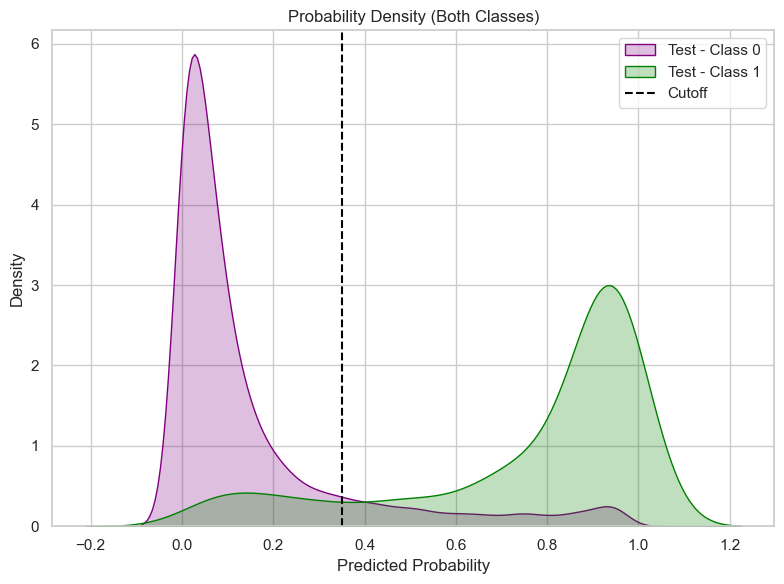

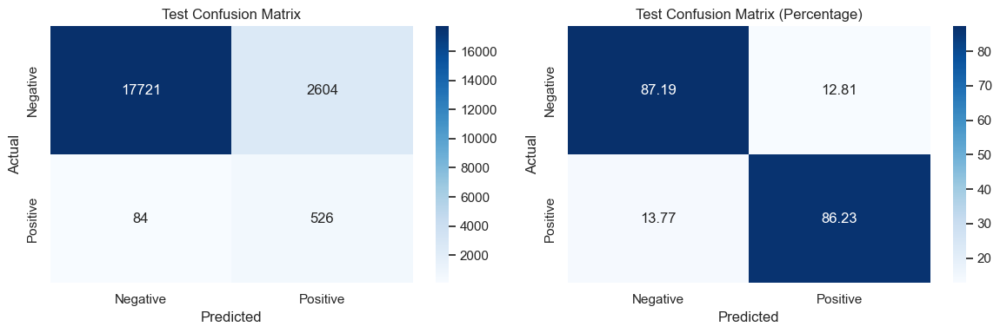

Model Evaluation Metrics:

Metrics       | Training Set | Testing Set
---------------------------------------------
Precision     | 0.1934       | 0.1681
Recall        | 0.9901       | 0.8623
Accuracy      | 0.8802       | 0.8716
F1 Score      | 0.3236       | 0.2813


In [1013]:
train_model_and_performance_eval(lgbm, X_train, X_test, y_train, y_test, cols, cutoff=0.35)

Precision --> XGBoost classifier has the highest precision on the training and testing set, with 0.9982 and 0.9610 respectively.

Recall --> LightGBM classifier has the highest recall on both the training and testing sets, with 0.9970 and 0.9882 respectively.

Accuray --> Random Forest and XGBoost classifiers has the highest accuracy, with 0.9995 and 0.9978 respectively.

F1 score --> Random Forest has the highest F1 score, with 0.9897 and 0.9523 respectively.

Based on these metrics:

> LightGBM generally performs the best among the three classifiers

### PREDICTIONS

To rigorously test the accuracy of our model, we will use the most recent complete month of data (March 24) as our test set. Applying our trained model to this dataset, we will then compare the predicted values with the actual values to assess the model's performance. By examining the performance metrics derived from this evaluation, we can gain insights into what areas we can improve and test if the model performs well.

Let us then, use March to predict what will our custoemrs do in that month:

In [1014]:
test_filtered_last = web_df[web_df['Date as Number'] == max_date -2][['SFDC Account ID', 'Predicting Month'] + cols]

In [1015]:
test_filtered_web = web_df[['SFDC Account ID', 'Predicting Month'] + cols]

In [1016]:
predictions = lgbm.predict(test_filtered_last[cols])
probabilities = lgbm.predict_proba(test_filtered_last[cols])

predictions_binary = np.where(probabilities[:, 1] >= 0.3, 1, 0)

In [1017]:
test_filtered_last['Prediction'] = predictions
test_filtered_last['Binary Prediction'] = predictions_binary
test_filtered_last['Actual Value']  = web_df[web_df['Date as Number'] == max_date -2]['Target (lost customer)'] 
test_filtered_last['Probability of Churn'] = np.round(probabilities[:, 1], 4)
test_filtered_last['Probability of Survival'] = np.round(probabilities[:, 0], 4)

In [1018]:
test_filtered_last.head()

,SFDC Account ID,Predicting Month,Date as Number,Previous Retention Months,Usage - Month 3,Usage - MoM(12),Usage - MoM(13),Usage - MoM(23),Web Apps - MoM(23),Web Sessions - MoM(23),...,Vertical_Telecommunications,Vertical_Utilities,Has Mobile,Has SR,Has SY,Prediction,Binary Prediction,Actual Value,Probability of Churn,Probability of Survival
37,00100000001VLvGAAW,2024-04-01,41,40,27074,-91.131,-16.854,837.465,92.308,529.379,...,False,False,0,0,0,0,0,0,0.1550,0.8450
65,00100000001VLvZAAW,2024-04-01,41,28,172,6.599,-12.690,-18.095,21.053,8.914,...,False,False,0,0,1,0,0,0,0.1451,0.8549
97,00100000001VSZLAA4,2024-04-01,41,22,29762,-14.184,-44.309,-35.104,14.773,-52.198,...,False,False,0,1,0,0,0,0,0.0475,0.9525
137,00100000001XytIAAS,2024-04-01,41,40,783619,-6.184,-7.974,-1.907,9.052,2.535,...,False,False,0,0,1,0,0,0,0.0592,0.9408
177,00100000001Y6vqAAC,2024-04-01,41,0,0,0.000,0.000,0.000,0.000,0.000,...,False,False,0,0,1,0,0,0,0.0009,0.9991


In [1019]:
y_test_march = web_df[web_df['Date as Number'] == max_date -2]['Target (lost customer)'] 

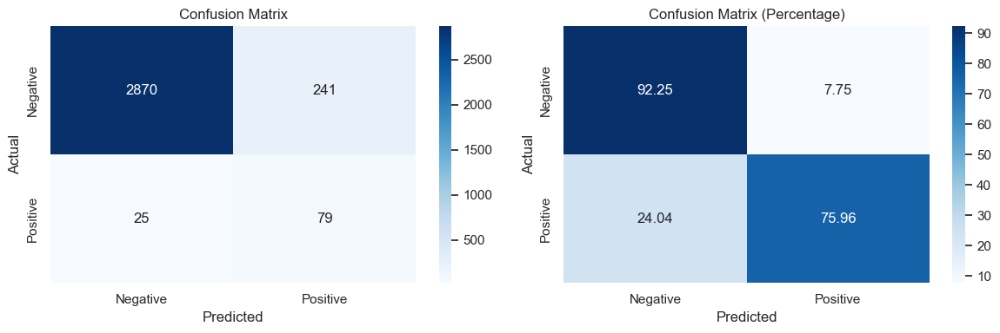

Metrics       | Testing Set
---------------------------------
Precision     | 0.2469
Recall        | 0.7596
Accuracy      | 0.9173
F1 Score      | 0.3726


In [1020]:
evaluate_metrics_test(y_test_march, predictions)

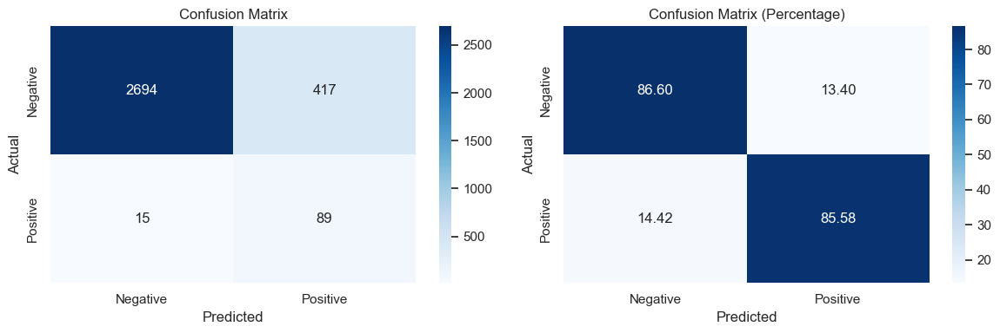

Metrics       | Testing Set
---------------------------------
Precision     | 0.1759
Recall        | 0.8558
Accuracy      | 0.8656
F1 Score      | 0.2918


In [1021]:
evaluate_metrics_test(y_test_march, predictions_binary)

In [1022]:
predictions = lgbm.predict(test_filtered_web[cols])
probabilities = lgbm.predict_proba(test_filtered_web[cols])

predictions_binary = np.where(probabilities[:, 1] >= 0.34, 1, 0)


test_filtered_web['Prediction'] = predictions
test_filtered_web['Binary Prediction'] = predictions_binary
test_filtered_web['Actual Value']  = web_df['Target (lost customer)'] 
test_filtered_web['Probability of Churn'] = np.round(probabilities[:, 1], 4)
test_filtered_web['Probability of Survival'] = np.round(probabilities[:, 0], 4)

test_filtered_web = test_filtered_web.sort_values(by='Probability of Churn', ascending=False)
test_filtered_web = test_filtered_web[['SFDC Account ID', 'Predicting Month', 'Previous Retention Months', 'Usage - Month 3', 'Usage - MoM(12)', 'Usage - MoM(13)', 'Usage - MoM(23)', 'Prediction','Binary Prediction', 'Actual Value', 'Probability of Churn','Probability of Survival', 'Has Mobile', 'Has SR', 'Has SY']]

In [1023]:
test_filtered_web.head()

,SFDC Account ID,Predicting Month,Previous Retention Months,Usage - Month 3,Usage - MoM(12),Usage - MoM(13),Usage - MoM(23),Prediction,Binary Prediction,Actual Value,Probability of Churn,Probability of Survival,Has Mobile,Has SR,Has SY
21779,0010g00001dJ1U3AAK,2021-03-01,3,2,-19.254,-99.999,-99.999,1,1,1,0.9959,0.0041,0,0,0
87203,0017000000kuxqGAAQ,2021-03-01,3,190,4.209,-96.263,-96.414,1,1,1,0.9957,0.0043,0,0,0
25793,0010g00001fsro1AAA,2021-03-01,3,1,3.837,-99.959,-99.961,1,1,1,0.9957,0.0043,0,0,0
24313,0010g00001eIJSMAA4,2021-03-01,3,1296,-0.849,-98.595,-98.583,1,1,1,0.9956,0.0044,0,0,0
17076,0010g00001YuvqyAAB,2021-03-01,3,15964,-22.174,-94.110,-92.432,1,1,1,0.9956,0.0044,0,0,0


In [1024]:
test_filtered_web.to_csv('Models/WEBTestFiltered.csv', index=False)

### PLOTS

In [1025]:
y_pred_proba_xgb = xgboost.predict_proba(X_test)[::,1]
y_pred_proba_lgbm = lgbm.predict_proba(X_test)[::,1]
y_pred_proba_rf = rf.predict_proba(X_test)[::,1]

ROC CURVE

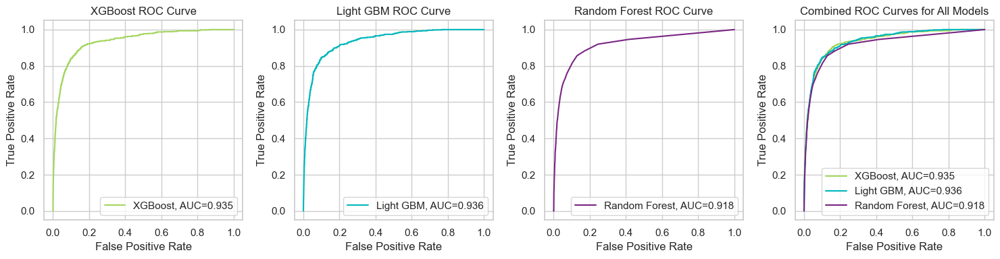

In [1026]:
fpr_dt, tpr_dt, _ = metrics.roc_curve(y_test, y_pred_proba_xgb)
auc_dt = round(metrics.roc_auc_score(y_test, y_pred_proba_xgb), 3)

fpr_lgbm, tpr_lgbm, _ = metrics.roc_curve(y_test, y_pred_proba_lgbm)
auc_lgbm = round(metrics.roc_auc_score(y_test, y_pred_proba_lgbm), 3)

fpr_rf, tpr_rf, _ = metrics.roc_curve(y_test, y_pred_proba_rf)
auc_rf = round(metrics.roc_auc_score(y_test, y_pred_proba_rf), 3)

fig, axs = plt.subplots(1, 4, figsize=(15, 4))

# Decision Tree ROC curve
axs[0].plot(fpr_dt, tpr_dt, label=f'XGBoost, AUC={auc_dt}', color='#a4d65e')  
axs[0].set_xlabel('False Positive Rate')
axs[0].set_ylabel('True Positive Rate')
axs[0].set_title('XGBoost ROC Curve')
axs[0].legend()
axs[0].grid(True)

# Light GBM ROC curve
axs[1].plot(fpr_lgbm, tpr_lgbm, label=f'Light GBM, AUC={auc_lgbm}', color='#00b7bd') 
axs[1].set_xlabel('False Positive Rate')
axs[1].set_ylabel('True Positive Rate')
axs[1].set_title('Light GBM ROC Curve')
axs[1].legend()
axs[1].grid(True)

# Random Forest ROC curve
axs[2].plot(fpr_rf, tpr_rf, label=f'Random Forest, AUC={auc_rf}', color='#7a2583') 
axs[2].set_xlabel('False Positive Rate')
axs[2].set_ylabel('True Positive Rate')
axs[2].set_title('Random Forest ROC Curve')
axs[2].legend()
axs[2].grid(True)

# Combined ROC curve for all models
axs[3].plot(fpr_dt, tpr_dt, label=f'XGBoost, AUC={auc_dt}', color='#a4d65e')  
axs[3].plot(fpr_lgbm, tpr_lgbm, label=f'Light GBM, AUC={auc_lgbm}', color='#00b7bd') 
axs[3].plot(fpr_rf, tpr_rf, label=f'Random Forest, AUC={auc_rf}', color='#7a2583') 
axs[3].set_xlabel('False Positive Rate')
axs[3].set_ylabel('True Positive Rate')
axs[3].set_title('Combined ROC Curves for All Models')
axs[3].legend()
axs[3].grid(True)

plt.tight_layout()
plt.show()

FEATURE IMPORTANCE

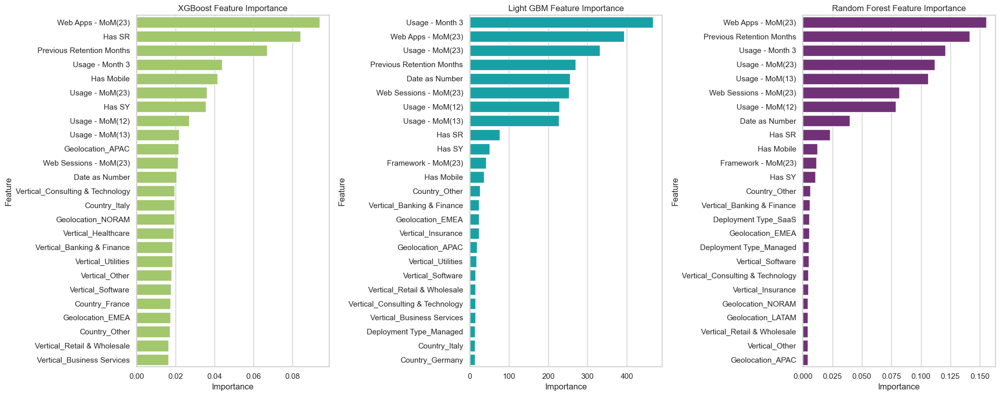

In [1027]:
feature_importances_xgboost = pd.DataFrame({'Feature': cols, 'Importance': xgboost.feature_importances_})
feature_importances_xgboost = feature_importances_xgboost.sort_values(by='Importance', ascending=False).head(25)

feature_importances_lgbm = pd.DataFrame({'Feature': cols, 'Importance': lgbm.feature_importances_})
feature_importances_lgbm = feature_importances_lgbm.sort_values(by='Importance', ascending=False).head(25)

feature_importances_rf = pd.DataFrame({'Feature': cols, 'Importance': rf.feature_importances_})
feature_importances_rf = feature_importances_rf.sort_values(by='Importance', ascending=False).head(25)


fig, axs = plt.subplots(1, 3, figsize=(20, 8))

# Plot for Decision Tree
sns.barplot(data=feature_importances_xgboost, x='Importance', y='Feature', color='#a4d65e', ax=axs[0])
axs[0].set_title('XGBoost Feature Importance')
axs[0].set_xlabel('Importance')
axs[0].set_ylabel('Feature')

# Plot for Light GBM
sns.barplot(data=feature_importances_lgbm, x='Importance', y='Feature', color='#00b7bd', ax=axs[1])
axs[1].set_title('Light GBM Feature Importance')
axs[1].set_xlabel('Importance')
axs[1].set_ylabel('Feature')

# Plot for Random Forest
sns.barplot(data=feature_importances_rf, x='Importance', y='Feature', color='#7a2583', ax=axs[2])
axs[2].set_title('Random Forest Feature Importance')
axs[2].set_xlabel('Importance')
axs[2].set_ylabel('Feature')

plt.tight_layout()
plt.show()

PRECISSION-RECALL CURVE

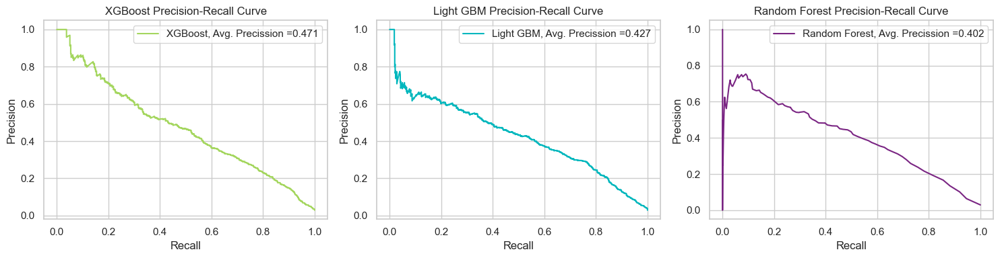

In [1028]:
precision_dt, recall_dt, _ = precision_recall_curve(y_test, y_pred_proba_xgb)
average_precision_dt = round(average_precision_score(y_test, y_pred_proba_xgb),3)

precision_lgbm, recall_lgbm, _ = precision_recall_curve(y_test, y_pred_proba_lgbm)
average_precision_lgbm = round(average_precision_score(y_test, y_pred_proba_lgbm),3)

precision_rf, recall_rf, _ = precision_recall_curve(y_test, y_pred_proba_rf)
average_precision_rf = round(average_precision_score(y_test, y_pred_proba_rf),3)

fig, axs = plt.subplots(1, 3, figsize=(15, 4))

# Decision Tree Precision-Recall curve
axs[0].plot(recall_dt, precision_dt, label=f'XGBoost, Avg. Precission ={average_precision_dt}', color='#a4d65e')  
axs[0].set_xlabel('Recall')
axs[0].set_ylabel('Precision')
axs[0].set_title('XGBoost Precision-Recall Curve')
axs[0].legend()
axs[0].grid(True)

# Light GBM Precision-Recall curve
axs[1].plot(recall_lgbm, precision_lgbm, label=f'Light GBM, Avg. Precission ={average_precision_lgbm}', color='#00b7bd') 
axs[1].set_xlabel('Recall')
axs[1].set_ylabel('Precision')
axs[1].set_title('Light GBM Precision-Recall Curve')
axs[1].legend()
axs[1].grid(True)

# Random Forest Precision-Recall curve
axs[2].plot(recall_rf, precision_rf, label=f'Random Forest, Avg. Precission ={average_precision_rf}', color='#7a2583') 
axs[2].set_xlabel('Recall')
axs[2].set_ylabel('Precision')
axs[2].set_title('Random Forest Precision-Recall Curve')
axs[2].legend()
axs[2].grid(True)

plt.tight_layout()
plt.show()

### EXPLAINABILITY FOR LGBM

In [1029]:
import shap
shap.initjs()

In [1030]:
explainer = shap.Explainer(lgbm)
shap_values = explainer(X_test)

In [1031]:
print("Shape of shap_values:", shap_values.shape)
print("Shape of X_test:", X_test.shape)

Shape of shap_values: (20935, 44)
Shape of X_test: (20935, 44)


Let us see which variables have an impact on our model's performance:

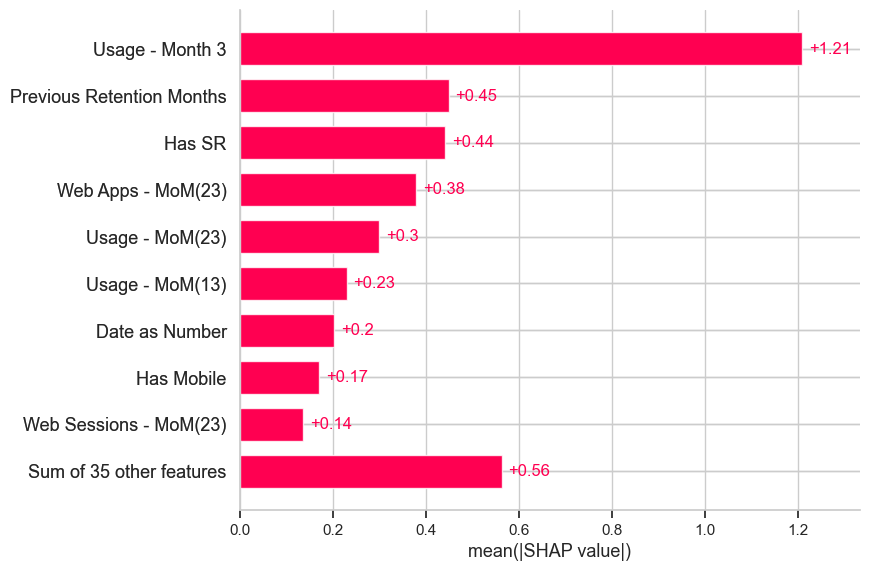

In [1032]:
shap.plots.bar(shap_values)

As we can see *Retention Months* is the variable with highest impact in our model, significantly surpassing other variables. It is then followed by *Usage - MoM (2,3)*, representing the Month-over-Month change between Month 2 and Month 3. This is logical since Usage - MoM (2,3) reflects the usage pattern immediately preceding the determination of account status.

Let us plot a summary plot of the overall model:

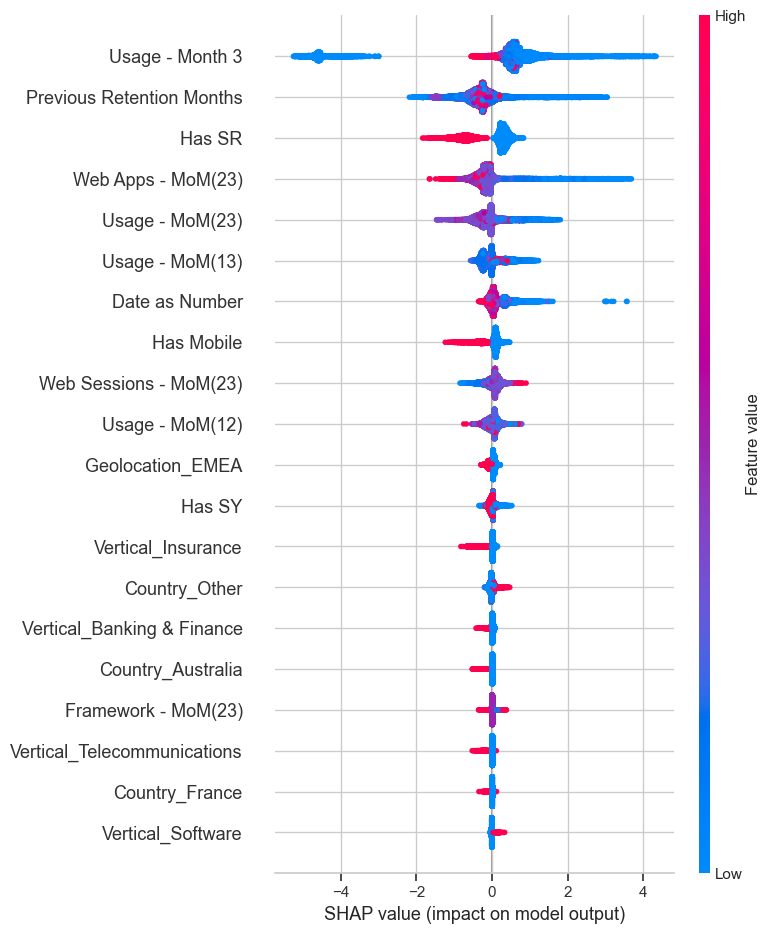

In [1033]:
shap.summary_plot(shap_values, X_test)

Each point on the chart is one SHAP value for a prediction and feature. 

**Red** color means **higher** value of a feature. 

**Blue** means **lower** value of a feature. We can get the general sense of features’ directionality impact based on the distribution of the red and blue dots.

In the chart above, we can conclude the following insights:
- Higher value of *Retention Months* leads to lower probability of churn. On the other hand, a lower value of Retention Months is linked to a higher likelihood of churn, indicating challenges in retaining customers with shorter retention periods. This observation suggests that Dynatrace may face difficulties retaining customers with initial exposure to the product, but performs well in retaining longer-standing customers once they have become familiar and engaged.


Let us perform a deeper analysis by examining the impact separately for Churn and Non-Churn accounts

**Account that did not churn:**

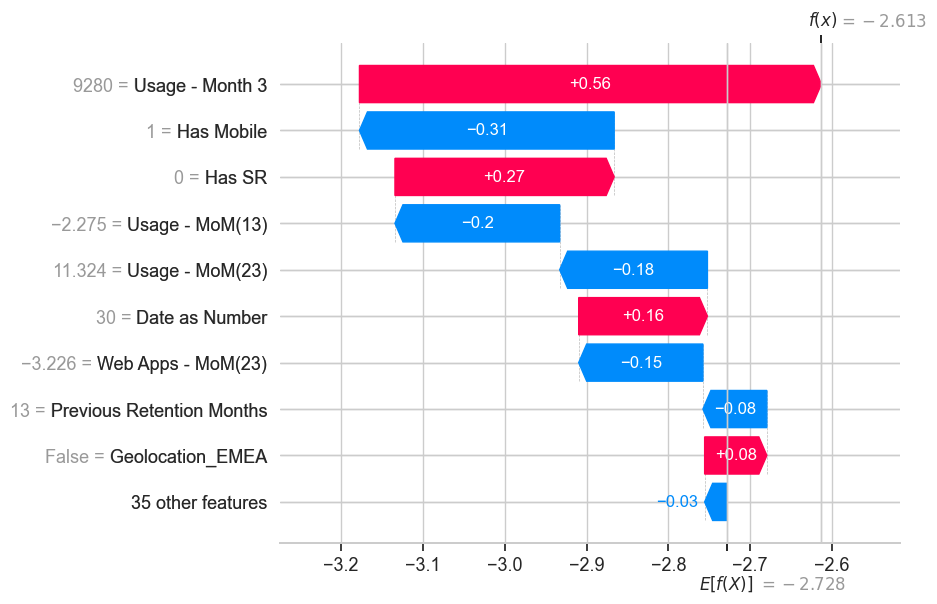

In [1034]:
shap.plots.waterfall(shap_values[0])

**Churned Account:**

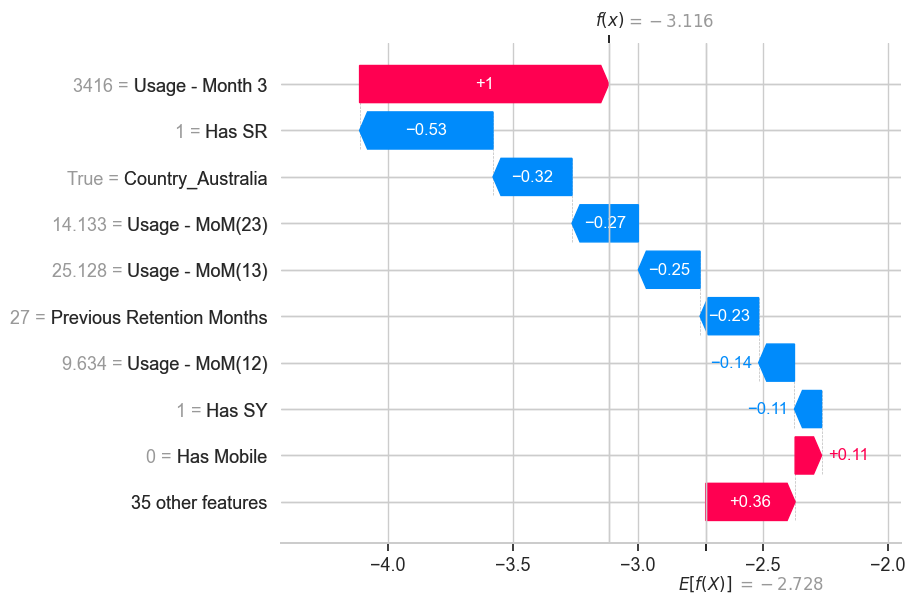

In [1035]:
shap.plots.waterfall(shap_values[1])

## MODEL 2 - SURVIVAL ANALYSIS

- Time-to-event data: we are going to use the consecutive retention months before a customer churns.

- Event indicator: A binary column indicating whether the churn event has occurred (1) or not (0) for each customer.

In [1036]:
df_W.fillna(0, inplace=True)
df_W.replace([np.inf, -np.inf], 0, inplace=True)
df_W = df_W[df_W['Date as Number'] != max_date]

### **KALPLAN-MEIER SURVIVAL CUVE**

The Kaplan-Meier survival curve shows the estimated probability of customers not churning over time (in terms of retention months).

In [1037]:
dff_ID = df_W.groupby('SFDC Account ID')


agg_retention_months = dff_ID['Previous Retention Months Has Web'].last()
date = dff_ID['Consumption Date (Monthly)'].last()
churn_status = dff_ID['Lost Account Has Web'].any()
vertical = dff_ID['Vertical'].last()
deployment = dff_ID['Deployment Type'].last()
arr = dff_ID['ARR Band'].last()
geolocation = dff_ID['Geolocation'].last()
country = dff_ID['Country'].last()
rum = dff_ID['UEM_ENABLED'].last()
se = dff_ID['SESSION_REPLAY_ENABLED'].last()
usage = dff_ID['DEM Units - Web Total (Monthly)'].mean()
prev_usage = dff_ID['DEM Units - Web Total (Monthly - Previous Month)'].mean()
apps = dff_ID['APPS_MOBILE'].mean() + dff_ID['WEB_APPS'].mean()
has_mob = dff_ID['Has Mobile'].last()
has_sr = dff_ID['Has SR'].last()
has_sy = dff_ID['Has SY'].last()



kaplain_df = pd.DataFrame({
    'SFDC Account ID': agg_retention_months.index,
    'Previous Retention Months Has Web': agg_retention_months.values,
    'Date': date.values,
    'Lost Account Web': churn_status.values,
    'Vertical': vertical.values,
    'Deployment Type': deployment.values,
    'ARR Band': arr.values,
    'Geolocation': geolocation.values,
    'Country': country.values,
    'Avg Usage': usage.values,
    'Avg Prev Usage': prev_usage.values,
    'Avg Apps': apps.values,
    'RUM Enabled': rum.values,
    'SR Enabled': se.values,
    'Has Mobile': has_mob.values,
    'Has SR': has_sr.values,
    'Has SY': has_sy.values

})

Web_embeding = kaplain_df.copy()


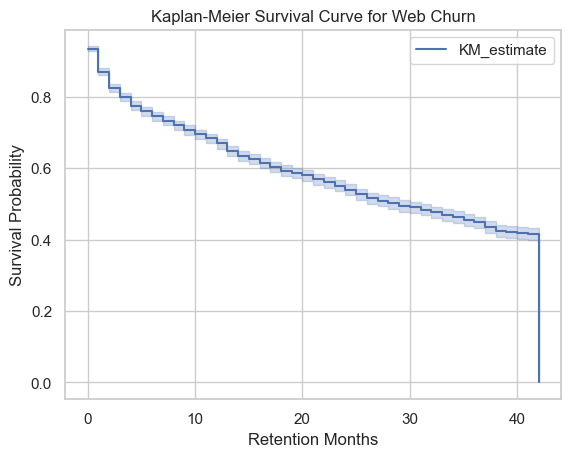

In [1038]:
durations = kaplain_df['Previous Retention Months Has Web']
event_observed = kaplain_df['Lost Account Web']

kmf = KaplanMeierFitter()

kmf.fit(durations, event_observed)

kmf.plot()
plt.title('Kaplan-Meier Survival Curve for Web Churn')
plt.xlabel('Retention Months')
plt.ylabel('Survival Probability')
plt.show()

Let us compute a confidence interval

In [1039]:
ci = kmf.confidence_interval_survival_function_
ci.head()

,KM_estimate_lower_0.95,KM_estimate_upper_0.95
0.0,0.927081,0.940941
1.0,0.860598,0.879796
2.0,0.813444,0.835364
3.0,0.786864,0.810072
4.0,0.763091,0.787332


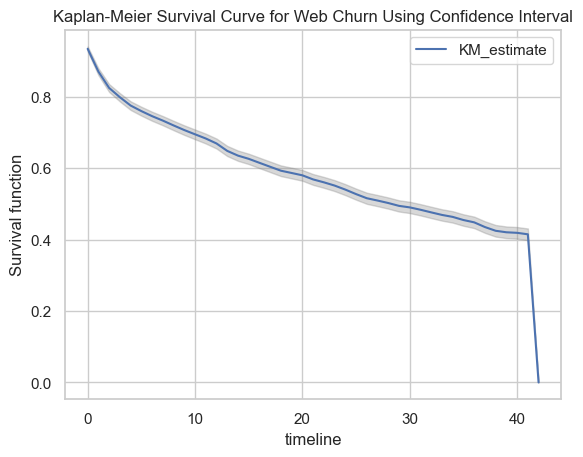

In [1040]:
ts = ci.index
low, high = np.transpose(ci.values)

plt.fill_between(ts, low, high, color='gray', alpha=0.3)
kmf.survival_function_.plot(ax=plt.gca(), label='Deployment Type_SaaS')  # Adding label for SaaS
plt.title('Kaplan-Meier Survival Curve for Web Churn Using Confidence Interval')
plt.ylabel('Survival function')
plt.legend()


Let us now add additional attributes that will help us predict.

In [1041]:
kaplain_df.head()

,SFDC Account ID,Previous Retention Months Has Web,Date,Lost Account Web,Vertical,Deployment Type,ARR Band,Geolocation,Country,Avg Usage,Avg Prev Usage,Avg Apps,RUM Enabled,SR Enabled,Has Mobile,Has SR,Has SY
0,00100000001VLvGAAW,41,2024-05-01,False,Consulting & Technology,SaaS,50-100k,NORAM,United States,42027.047619,41298.809524,4084.095238,True,False,0,0,0
1,00100000001VLvZAAW,29,2024-05-01,False,Business Services,SaaS,250-500k,NORAM,United States,246.900000,242.633333,822.866667,True,False,0,0,1
2,00100000001VSZLAA4,23,2024-05-01,True,Manufacturing,Managed,100-250k,NORAM,United States,39315.176471,41258.764706,637.323529,True,False,0,1,0
3,00100000001XytIAAS,41,2024-05-01,False,Insurance,Managed,500-1M,NORAM,United States,589718.880952,570809.333333,51927.333333,True,False,0,0,1
4,00100000001Y6vqAAC,0,2024-05-01,False,Banking & Finance,SaaS,250-500k,NORAM,United States,0.000000,0.000000,17.095238,True,True,0,0,1


### **TRAINING MODELS USING SURVIVAL ANALYSIS:**

In [1042]:
columns_to_encode = ['Deployment Type', 'Vertical', 'Country', 'Geolocation', 'ARR Band', 'RUM Enabled', 'SR Enabled']

label_encoder = LabelEncoder()


for column in columns_to_encode:
    kaplain_df[column] = label_encoder.fit_transform(kaplain_df[column].astype(str))

    original_values = label_encoder.classes_
    encoded_values = label_encoder.transform(original_values)
    

    print(f"\nConversions for {column}:")
    for original, encoded in zip(original_values, encoded_values):
        print(f"{original} = {encoded}")


Conversions for Deployment Type:
Managed = 0
SaaS = 1

Conversions for Vertical:
Banking & Finance = 0
Business Services = 1
Consulting & Technology = 2
Consumer Goods & Services = 3
Government = 4
Healthcare = 5
Insurance = 6
Logistics & Transportation = 7
Manufacturing = 8
Media & Entertainment = 9
Other = 10
Retail & Wholesale = 11
Software = 12
Telecommunications = 13
Utilities = 14

Conversions for Country:
Australia = 0
Brazil = 1
Canada = 2
France = 3
Germany = 4
Italy = 5
Mexico = 6
Other = 7
Spain = 8
United Kingdom = 9
United States = 10

Conversions for Geolocation:
0 = 0
APAC = 1
EMEA = 2
LATAM = 3
NORAM = 4

Conversions for ARR Band:
0-10k = 0
1.5-2M = 1
10-20k = 2
100-250k = 3
1M-1.5M = 4
20-50k = 5
250-500k = 6
2M-3M = 7
3-5M = 8
50-100k = 9
500-1M = 10
>5M = 11

Conversions for RUM Enabled:
0 = 0
False = 1
True = 2

Conversions for SR Enabled:
0 = 0
False = 1
True = 2


In [1043]:
cols = [i for i in kaplain_df.columns if i not in ('Lost Account Web', 'SFDC Account ID', ' Previous Retention Months Has Web', 'Date')]

X_train, X_test, y_train, y_test = train_test_split(kaplain_df[cols], kaplain_df[['Lost Account Web', 'Previous Retention Months Has Web']], test_size=0.2, random_state=1)

In [1044]:
print("Lenght X_train:",len(X_train))
print("Length y_train:", len(y_train))
print("Lenght X_test:",len(X_test))
print("Length y_test:", len(y_test))

Lenght X_train: 3936
Length y_train: 3936
Lenght X_test: 985
Length y_test: 985


In [1045]:
event_indicator = (y_train['Lost Account Web']).astype(bool)  
survival_times = y_train['Previous Retention Months Has Web'].astype(int)  

event_field_name = 'event_indicator'  
time_field_name = 'survival_months'  

# Strucured array
y_structured = np.array(list(zip(event_indicator, survival_times)), 
                        dtype=[(event_field_name, bool), (time_field_name, float)])


#### RANDOM SURVIVAL FOREST:

In [1046]:
rsf = RandomSurvivalForest(
    n_estimators=1000, min_samples_split=10, min_samples_leaf=15, n_jobs=-1, random_state=20
)
rsf.fit(X_train, y_structured)

RandomSurvivalForest(min_samples_leaf=15, min_samples_split=10,
                     n_estimators=1000, n_jobs=-1, random_state=20)

We can check how well the model performs by evaluating it on the test data:

In [1047]:
event_indicator_test = (y_test['Lost Account Web']).astype(bool)  
survival_times_test = y_test['Previous Retention Months Has Web'].astype(int)  

event_field_name = 'event_indicator'  
time_field_name = 'survival_months'  

y_structured_test= np.array(list(zip(event_indicator_test, survival_times_test)), 
                        dtype=[(event_field_name, bool), (time_field_name, float)])

In [1048]:
print('Score:', rsf.score(X_test, y_structured_test))

Score: 0.901968106543224


Let us now select some customers of Abril 24, and apply a survival analysis on them:

In [1049]:
data_abril = df_W[df_W['Consumption Date (Monthly)'] == '2024-04-01']

abril_sfdc_ids = data_abril['SFDC Account ID'].unique()

filtered_kaplain_df = kaplain_df[kaplain_df['SFDC Account ID'].isin(abril_sfdc_ids)]

X_testing = filtered_kaplain_df[cols]

In [1050]:
surv_rf = rsf.predict_survival_function(X_testing, return_array=True)

#### GRADIENT BOOSTING SURVIVAL:

In [1051]:
gboosts = GradientBoostingSurvivalAnalysis()
gboosts.fit(X_train, y_structured)

GradientBoostingSurvivalAnalysis()

In [1052]:
print('Score:', gboosts.score(X_test, y_structured_test))

Score: 0.9843952777274525


In [1053]:
surv_gboost = gboosts.predict_survival_function(X_testing, return_array=True)

#### SURVIVAL TREE:

In [1054]:
st = SurvivalTree()
st.fit(X_train, y_structured)

SurvivalTree()

In [1055]:
print('Score:', st.score(X_test, y_structured_test))

Score: 0.8774712252692605


In [1056]:
surv_st = st.predict_survival_function(X_testing, return_array=True)

### PLOTS OF SURVIVAL CURVE 

In [1057]:
sfdc_account_ids = filtered_kaplain_df['SFDC Account ID']
sfdc_account_ids_to_plot = '00100000001VSZLAA4'

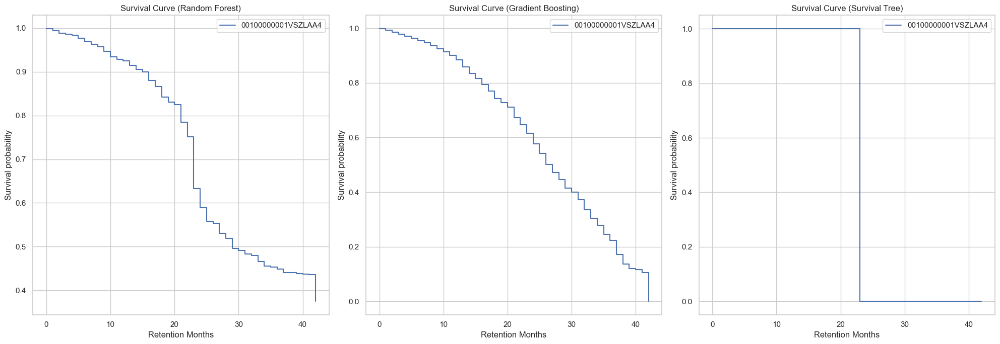

In [1058]:
unique_times_rsf = rsf.unique_times_
unique_times_gb = gboosts.unique_times_
unique_times_st = st.unique_times_

fig, axes = plt.subplots(1, 3, figsize=(20, 7))  

# Random Forest
ax1 = axes[0]  
ax1.set_title('Survival Curve (Random Forest)')
ax1.set_ylabel("Survival probability")
ax1.set_xlabel("Retention Months")

for sfdc_account_id, s in zip(sfdc_account_ids, surv_rf):
    if sfdc_account_id in sfdc_account_ids_to_plot:
        ax1.step(unique_times_rsf, s, where="post", label=f"{sfdc_account_id}")

ax1.legend()
ax1.grid(True)

# Gradient Boosting
ax2 = axes[1] 
ax2.set_title('Survival Curve (Gradient Boosting)')
ax2.set_ylabel("Survival probability")
ax2.set_xlabel("Retention Months")

for sfdc_account_id, s in zip(sfdc_account_ids, surv_gboost):
    if sfdc_account_id in sfdc_account_ids_to_plot:
        ax2.step(unique_times_gb, s, where="post", label=f"{sfdc_account_id}")

ax2.legend()
ax2.grid(True)

# Survival Tree
ax3 = axes[2] 
ax3.set_title('Survival Curve (Survival Tree)')
ax3.set_ylabel("Survival probability")
ax3.set_xlabel("Retention Months")

for sfdc_account_id, s in zip(sfdc_account_ids, surv_st):
    if sfdc_account_id in sfdc_account_ids_to_plot:
        ax3.step(unique_times_st, s, where="post", label=f"{sfdc_account_id}")

ax3.legend()
ax3.grid(True)

# Displaying the plot
plt.tight_layout()
plt.show()


#### Survival Table:

Let's create a table with the survival probability for each model.

RANDOM FOREST SURVIVAL:

In [1059]:
survival_table_rf = pd.DataFrame(index=rsf.unique_times_, columns=sfdc_account_ids)

for i, (sfdc_account_id, s) in enumerate(zip(sfdc_account_ids, surv_rf)):
    survival_table_rf[sfdc_account_id] = s


survival_table_transposed_rf = survival_table_rf.T.reset_index()
survival_table_transposed_rf.rename(columns={'index': 'SFDC Account ID'}, inplace=True)

In [1060]:
survival_table_transposed_rf.head()

,SFDC Account ID,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,...,33.0,34.0,35.0,36.0,37.0,38.0,39.0,40.0,41.0,42.0
0,00100000001VLvGAAW,0.996535,0.993033,0.991528,0.989608,0.987528,0.984427,0.978536,0.975438,0.972448,...,0.818960,0.810040,0.802950,0.801760,0.786037,0.781839,0.775238,0.771929,0.769048,0.708805
1,00100000001VLvZAAW,0.971747,0.957263,0.949181,0.932665,0.919834,0.914050,0.903163,0.882247,0.871041,...,0.595886,0.592067,0.578527,0.560998,0.547735,0.540464,0.536697,0.532441,0.530309,0.501897
2,00100000001VSZLAA4,0.998015,0.994557,0.988597,0.986036,0.983106,0.976741,0.968741,0.963185,0.957709,...,0.466500,0.455810,0.453508,0.448422,0.441172,0.440129,0.438541,0.437502,0.436139,0.374905
3,00100000001XytIAAS,0.995331,0.994317,0.994062,0.993069,0.990553,0.988664,0.988171,0.987560,0.985105,...,0.930690,0.926568,0.925179,0.919734,0.914055,0.906555,0.904736,0.900952,0.900686,0.844489
4,00100000001Y6vqAAC,0.936755,0.726411,0.684627,0.674287,0.669054,0.667198,0.666530,0.663912,0.663307,...,0.654976,0.654976,0.654214,0.653070,0.653070,0.653070,0.653070,0.653070,0.652989,0.652989


In [1061]:
survival_long_format_web = pd.melt(
    survival_table_transposed_rf,
    id_vars=['SFDC Account ID'],
    var_name='Web - Retention Months',
    value_name='Web- Probability of Survival'
)
survival_long_format_web.head()


,SFDC Account ID,Web - Retention Months,Web- Probability of Survival
0,00100000001VLvGAAW,0.0,0.996535
1,00100000001VLvZAAW,0.0,0.971747
2,00100000001VSZLAA4,0.0,0.998015
3,00100000001XytIAAS,0.0,0.995331
4,00100000001Y6vqAAC,0.0,0.936755


In [1062]:
survival_long_format_web.to_csv('Survival/WebSurvivalTable.csv', index=False)

GRADIENT BOOSING SURVIVAL:

In [1063]:
survival_table_gb = pd.DataFrame(index=gboosts.unique_times_, columns=sfdc_account_ids)

for i, (sfdc_account_id, s) in enumerate(zip(sfdc_account_ids, surv_gboost)):
    survival_table_gb[sfdc_account_id] = s


survival_table_transposed_gb = survival_table_gb.T.reset_index()
survival_table_transposed_gb.rename(columns={'index': 'SFDC Account ID'}, inplace=True)

In [1064]:
survival_table_transposed_gb.head()

,SFDC Account ID,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,...,33.0,34.0,35.0,36.0,37.0,38.0,39.0,40.0,41.0,42.0
0,00100000001VLvGAAW,0.999807,0.999396,0.998806,0.998205,0.997462,0.996778,0.996075,0.995384,0.994409,...,0.902964,0.896343,0.886598,0.879061,0.859859,0.843582,0.834196,0.831409,0.824575,3.767772e-01
1,00100000001VLvZAAW,0.998925,0.996633,0.993355,0.990023,0.985919,0.982150,0.978291,0.974513,0.969194,...,0.565730,0.542966,0.510834,0.487065,0.430585,0.387024,0.363597,0.356870,0.340806,4.307788e-03
2,00100000001VSZLAA4,0.997755,0.992975,0.986162,0.979261,0.970795,0.963055,0.955164,0.947470,0.936693,...,0.304047,0.279036,0.245634,0.222352,0.171855,0.137514,0.120690,0.116070,0.105418,1.136215e-05
3,00100000001XytIAAS,0.999807,0.999396,0.998806,0.998205,0.997462,0.996778,0.996075,0.995384,0.994409,...,0.902964,0.896343,0.886598,0.879061,0.859859,0.843582,0.834196,0.831409,0.824575,3.767772e-01
4,00100000001Y6vqAAC,0.995400,0.985640,0.971815,0.957914,0.941001,0.925672,0.910179,0.895200,0.874435,...,0.086930,0.072893,0.056115,0.045746,0.026966,0.017068,0.013059,0.012054,0.009894,7.169764e-11


In [1065]:
test_filtered_last.head()

,SFDC Account ID,Predicting Month,Date as Number,Previous Retention Months,Usage - Month 3,Usage - MoM(12),Usage - MoM(13),Usage - MoM(23),Web Apps - MoM(23),Web Sessions - MoM(23),...,Vertical_Telecommunications,Vertical_Utilities,Has Mobile,Has SR,Has SY,Prediction,Binary Prediction,Actual Value,Probability of Churn,Probability of Survival
37,00100000001VLvGAAW,2024-04-01,41,40,27074,-91.131,-16.854,837.465,92.308,529.379,...,False,False,0,0,0,0,0,0,0.1550,0.8450
65,00100000001VLvZAAW,2024-04-01,41,28,172,6.599,-12.690,-18.095,21.053,8.914,...,False,False,0,0,1,0,0,0,0.1451,0.8549
97,00100000001VSZLAA4,2024-04-01,41,22,29762,-14.184,-44.309,-35.104,14.773,-52.198,...,False,False,0,1,0,0,0,0,0.0475,0.9525
137,00100000001XytIAAS,2024-04-01,41,40,783619,-6.184,-7.974,-1.907,9.052,2.535,...,False,False,0,0,1,0,0,0,0.0592,0.9408
177,00100000001Y6vqAAC,2024-04-01,41,0,0,0.000,0.000,0.000,0.000,0.000,...,False,False,0,0,1,0,0,0,0.0009,0.9991


In [1066]:
survival_df = pd.DataFrame(columns=['SFDC Account ID', 'Predicting Month', 'Previous Retention Months', 'Prediction', 'Actual Value', 'Probability of Churn', 'Probability of Survival','Survival Probability RF', 'Survival Probability GB'])

for index, row in test_filtered_last.iterrows():
    sfdc_account_id = row['SFDC Account ID']
    month = row['Predicting Month']
    prev_retention_months = row['Previous Retention Months']
    predicted_value = row['Prediction']
    actual_value = row['Actual Value']
    churn_prob = row['Probability of Churn']
    surv_prob = row['Probability of Survival']
    
    if sfdc_account_id in survival_table_transposed_rf['SFDC Account ID'].values:
        survival_row_rf = survival_table_transposed_rf[survival_table_transposed_rf['SFDC Account ID'] == sfdc_account_id]
        try:
            survival_prob_rf = survival_row_rf.at[survival_row_rf.index[0], prev_retention_months]
        except KeyError:
            survival_prob_rf = 0

    if sfdc_account_id in survival_table_transposed_gb['SFDC Account ID'].values:
        survival_row_gb = survival_table_transposed_gb[survival_table_transposed_gb['SFDC Account ID'] == sfdc_account_id]
        try:
            survival_prob_gb = survival_row_gb.at[survival_row_gb.index[0], prev_retention_months]
        except KeyError:
            survival_prob_gb = 0

            

    survival_df = survival_df._append({'SFDC Account ID': sfdc_account_id,
                            'Predicting Month': month,
                            'Previous Retention Months': prev_retention_months,
                            'Actual Value': actual_value,
                            'Prediction': predicted_value,
                            'Probability of Churn': churn_prob,
                            'Probability of Survival': surv_prob,
                            'Survival Probability RF': survival_prob_rf,
                            'Survival Probability GB': survival_prob_gb}, ignore_index=True)

C:\Users\martina.tarres\AppData\Local\Temp\ipykernel_25572\576253458.py:28: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  survival_df = survival_df._append({'SFDC Account ID': sfdc_account_id,


CHANGE TRESHOLD TO FIND BEST PARAMETER

In [1067]:
survival_df['Probability of Churn RF'] = 1 - survival_df['Survival Probability RF']
survival_df['Probability of Churn GB'] = 1 - survival_df['Survival Probability GB']
survival_df.head()

,SFDC Account ID,Predicting Month,Previous Retention Months,Prediction,Actual Value,Probability of Churn,Probability of Survival,Survival Probability RF,Survival Probability GB,Probability of Churn RF,Probability of Churn GB
0,00100000001VLvGAAW,2024-04-01,40,0,0,0.1550,0.8450,0.771929,0.831409,0.228071,0.168591
1,00100000001VLvZAAW,2024-04-01,28,0,0,0.1451,0.8549,0.666775,0.679624,0.333225,0.320376
2,00100000001VSZLAA4,2024-04-01,22,0,0,0.0475,0.9525,0.751312,0.647507,0.248688,0.352493
3,00100000001XytIAAS,2024-04-01,40,0,0,0.0592,0.9408,0.900952,0.831409,0.099048,0.168591
4,00100000001Y6vqAAC,2024-04-01,0,0,0,0.0009,0.9991,0.936755,0.995400,0.063245,0.004600


#### RANDOM FOREST:

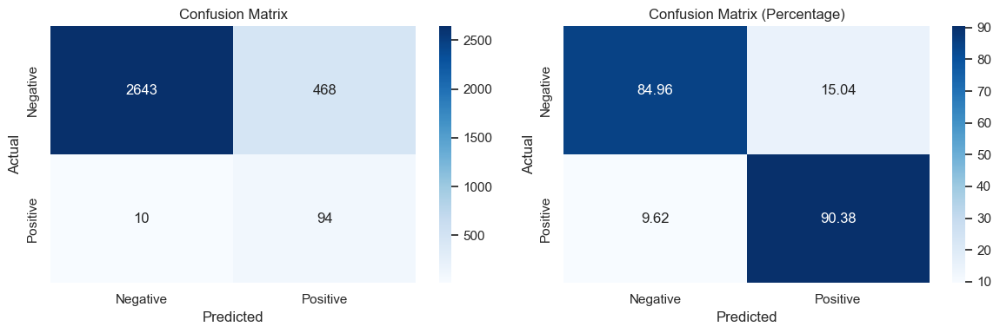

Metrics       | Testing Set
---------------------------------
Precision     | 0.1673
Recall        | 0.9038
Accuracy      | 0.8513
F1 Score      | 0.2823


In [1068]:
threshold_rf = 0.35

survival_df['Prediction RF'] = np.where(survival_df['Probability of Churn RF'] >= threshold_rf, 1, 0)

true_labels = survival_df['Actual Value'].astype(int)
predicted_labels_rf = survival_df['Prediction RF'].astype(int)

evaluate_metrics_test(true_labels, predicted_labels_rf)


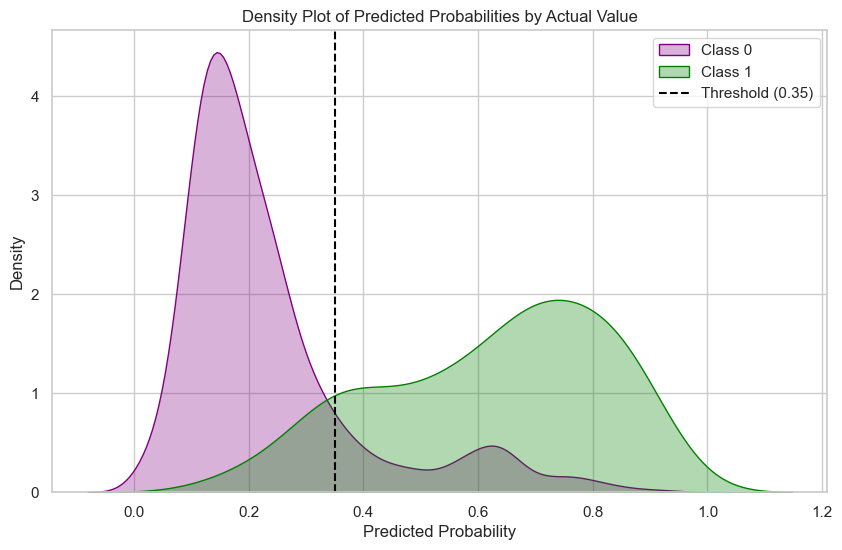

In [1069]:
sns.set(style="whitegrid")
colors = ['purple', 'green']
plt.figure(figsize=(10, 6))

for class_value, color in zip([0, 1], colors):
    sns.kdeplot( data=survival_df[survival_df["Actual Value"] == class_value], x="Probability of Churn RF", fill=True, common_norm=False, alpha=0.3, linewidth=1, color=color, label=f'Class {class_value}')

plt.axvline(x=threshold_rf, linestyle='--', color='black', label=f'Threshold ({threshold_rf})')

plt.title("Density Plot of Predicted Probabilities by Actual Value")
plt.xlabel("Predicted Probability")
plt.ylabel("Density")
plt.legend()

plt.show()

#### GRADIENT BOOSTING:

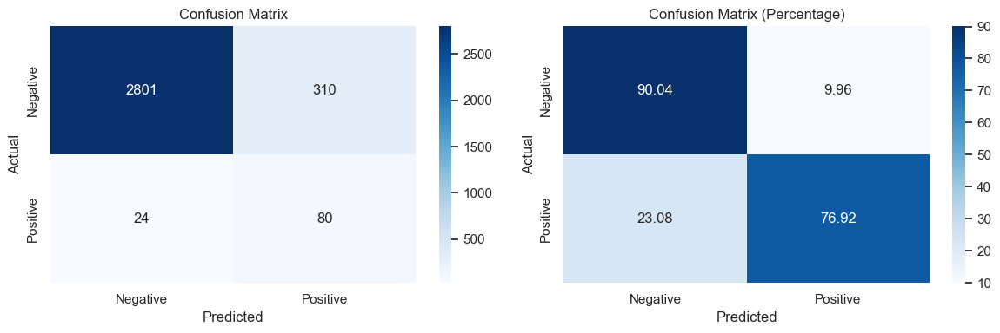

Metrics       | Testing Set
---------------------------------
Precision     | 0.2051
Recall        | 0.7692
Accuracy      | 0.8961
F1 Score      | 0.3239


In [1070]:
threshold_gb = 0.4

survival_df['Prediction GB'] = np.where(survival_df['Probability of Churn GB'] >= threshold_gb, 1, 0)

predicted_labels_gb = survival_df['Prediction GB'].astype(int)

evaluate_metrics_test(true_labels, predicted_labels_gb)

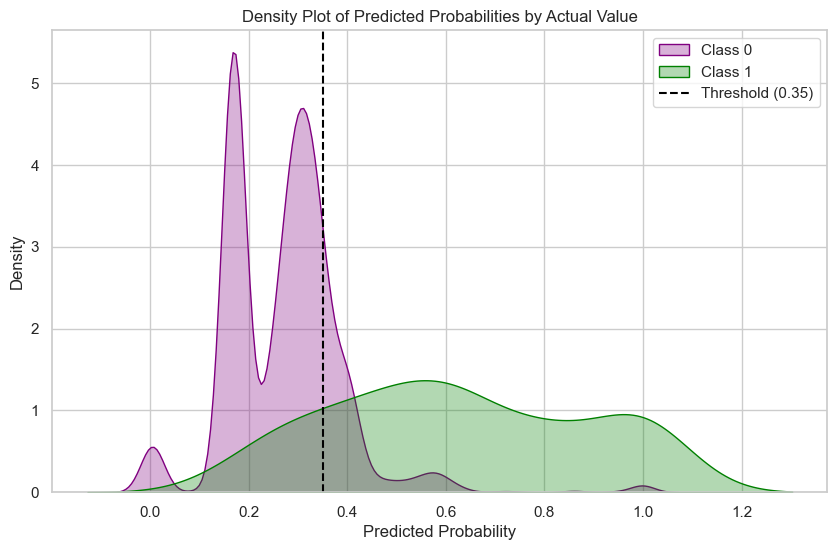

In [1071]:
sns.set(style="whitegrid")
colors = ['purple', 'green']
plt.figure(figsize=(10, 6))

for class_value, color in zip([0, 1], colors):
    sns.kdeplot( data=survival_df[survival_df["Actual Value"] == class_value], x="Probability of Churn GB", fill=True, common_norm=False, alpha=0.3, linewidth=1, color=color, label=f'Class {class_value}')

plt.axvline(x=threshold_rf, linestyle='--', color='black', label=f'Threshold ({threshold_rf})')

plt.title("Density Plot of Predicted Probabilities by Actual Value")
plt.xlabel("Predicted Probability")
plt.ylabel("Density")
plt.legend()

plt.show()

In [1072]:
a = survival_df[survival_df['SFDC Account ID'] == '00100000001VSZLAA4']
a

,SFDC Account ID,Predicting Month,Previous Retention Months,Prediction,Actual Value,Probability of Churn,Probability of Survival,Survival Probability RF,Survival Probability GB,Probability of Churn RF,Probability of Churn GB,Prediction RF,Prediction GB
2,00100000001VSZLAA4,2024-04-01,22,0,0,0.0475,0.9525,0.751312,0.647507,0.248688,0.352493,0,0


## MODEL 3 - DEEP LEARNING WITH EMBEDING MODEL

We will now use a embeding model, where we will transform text or attributes into a dense vector of a fixed size.

Sentence Transformers are models designed to convert sentences or texts into numerical representations (vectors or embeddings) in such a way that semantically similar texts have similar embeddings.

In [1073]:
Web_embeding.head()

,SFDC Account ID,Previous Retention Months Has Web,Date,Lost Account Web,Vertical,Deployment Type,ARR Band,Geolocation,Country,Avg Usage,Avg Prev Usage,Avg Apps,RUM Enabled,SR Enabled,Has Mobile,Has SR,Has SY
0,00100000001VLvGAAW,41,2024-05-01,False,Consulting & Technology,SaaS,50-100k,NORAM,United States,42027.047619,41298.809524,4084.095238,True,False,0,0,0
1,00100000001VLvZAAW,29,2024-05-01,False,Business Services,SaaS,250-500k,NORAM,United States,246.900000,242.633333,822.866667,True,False,0,0,1
2,00100000001VSZLAA4,23,2024-05-01,True,Manufacturing,Managed,100-250k,NORAM,United States,39315.176471,41258.764706,637.323529,True,False,0,1,0
3,00100000001XytIAAS,41,2024-05-01,False,Insurance,Managed,500-1M,NORAM,United States,589718.880952,570809.333333,51927.333333,True,False,0,0,1
4,00100000001Y6vqAAC,0,2024-05-01,False,Banking & Finance,SaaS,250-500k,NORAM,United States,0.000000,0.000000,17.095238,True,True,0,0,1


Let us first convert our data into tokens, so the text is first split into smaller units called tokens:

In [1074]:
def compile_text(x):
    text = f"""SFDC Account ID: {x['SFDC Account ID']}, Previous Retention Months Has Web: {x['Previous Retention Months Has Web']}, Vertical: {x['Vertical']}, Deployment Type: {x['Deployment Type']}, ARR Band: {x['ARR Band']}, Geolocation: {x['Geolocation']}, Country: {x['Country']}, Avg Usage: {x['Avg Usage']}, Avg Prev Usage: {x['Avg Prev Usage']}, Avg Apps: {x['Avg Apps']}, RUM Enabled: {x['RUM Enabled']}, SR Enabled: {x['SR Enabled']}, Has Mobile: {x['Has Mobile']}, Has SR: {x['Has SR']}, Has SY: {x['Has SY']}"""
    return text


sentences = Web_embeding.apply(lambda x: compile_text(x), axis=1).tolist()

Let us now encode each token into a numerical representation:

In [1075]:
model = SentenceTransformer(r"sentence-transformers/paraphrase-MiniLM-L6-v2") 
output = model.encode(sentences=sentences, show_progress_bar=True, normalize_embeddings=True) 
df_embedding = pd.DataFrame(output) 
df_embedding

c:\Users\martina.tarres\AppData\Local\Programs\Python\Python39\lib\site-packages\huggingface_hub\file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


Batches:   0%|          | 0/154 [00:00<?, ?it/s]

,0,1,2,3,4,5,6,7,8,9,...,374,375,376,377,378,379,380,381,382,383
0,-0.028651,-0.021409,-0.033171,-0.018301,-0.038171,-0.009519,-0.049935,0.044171,0.027377,-0.001003,...,0.012142,-0.051090,0.011871,-0.013331,-0.007738,0.002640,-0.010845,-0.041198,-0.051651,0.037142
1,-0.014295,-0.030630,-0.055156,-0.040106,-0.055069,0.007798,-0.033058,0.033430,0.040007,0.009085,...,0.009545,-0.034963,-0.003450,0.005357,0.021243,0.024544,-0.013371,-0.014556,-0.024096,-0.004294
2,-0.029836,-0.023115,0.004255,-0.028010,-0.024800,-0.034022,-0.058632,0.038021,-0.001552,0.015952,...,0.019052,-0.056339,0.005925,-0.001096,0.006515,0.024524,-0.023381,-0.041418,-0.025200,-0.004112
3,-0.028214,-0.023891,0.000030,-0.029467,-0.006290,-0.006143,-0.055177,0.061642,0.030258,0.010678,...,0.000273,-0.042651,0.014829,0.003044,0.010282,0.016498,-0.017170,-0.067321,-0.019213,0.017420
4,-0.023794,-0.029778,-0.024373,-0.027876,-0.022331,-0.006991,-0.053419,0.054240,0.032242,-0.004091,...,0.031911,-0.046806,-0.006524,-0.011190,0.028205,-0.022518,-0.027083,-0.033161,-0.010940,-0.010466
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4916,0.003014,-0.027291,-0.013767,-0.052004,-0.016696,-0.028936,-0.061122,0.022187,0.032237,-0.007706,...,0.022417,-0.021069,0.017330,-0.013924,0.024361,0.026215,-0.056234,-0.028596,0.002973,-0.002279
4917,0.006107,-0.015531,-0.012096,-0.057521,-0.014959,-0.040346,-0.062053,0.029100,0.035099,-0.015644,...,0.022811,-0.022468,0.011572,0.012334,0.028907,0.026253,-0.063555,-0.024608,-0.009537,-0.014910
4918,0.014061,-0.034434,-0.009653,-0.038369,0.001058,-0.021829,-0.038673,0.042478,0.050339,-0.013122,...,0.026635,-0.041197,-0.001454,-0.020099,0.012705,0.012796,-0.044607,-0.023079,-0.029502,0.019158
4919,-0.037589,-0.020546,-0.007734,-0.009313,-0.014677,-0.019435,-0.080311,0.075132,0.020299,-0.005865,...,0.005552,-0.080333,0.007448,-0.026289,0.005233,-0.014603,-0.009919,-0.058455,-0.024966,0.005356


Let us prepare the data:

In [1076]:
X = df_embedding  
y = Web_embeding['Lost Account Web'] 

Split the data into train and test:

In [1077]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Inicialize and train the model:

In [1078]:
lgb_classifier = lgb.LGBMClassifier()
lgb_classifier.fit(X_train, y_train)
y_pred = lgb_classifier.predict(X_test)

[LightGBM] [Info] Number of positive: 1867, number of negative: 2069
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 97920
[LightGBM] [Info] Number of data points in the train set: 3936, number of used features: 384
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.474339 -> initscore=-0.102733
[LightGBM] [Info] Start training from score -0.102733


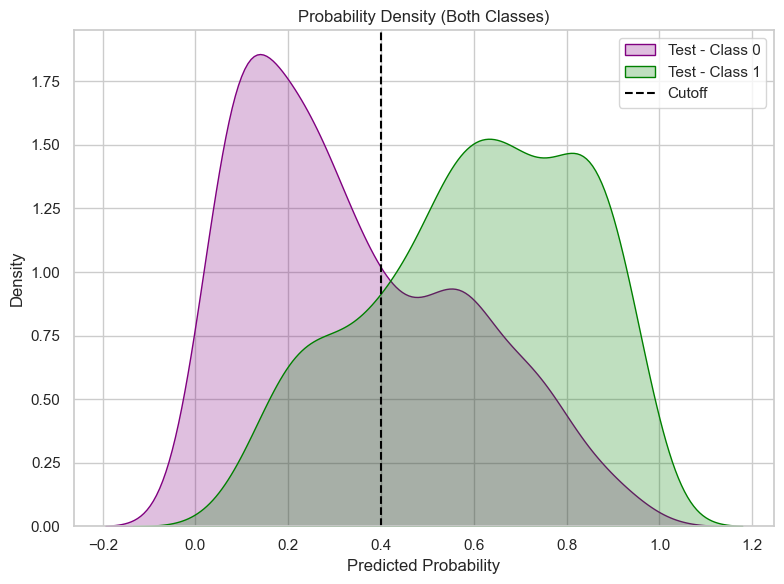

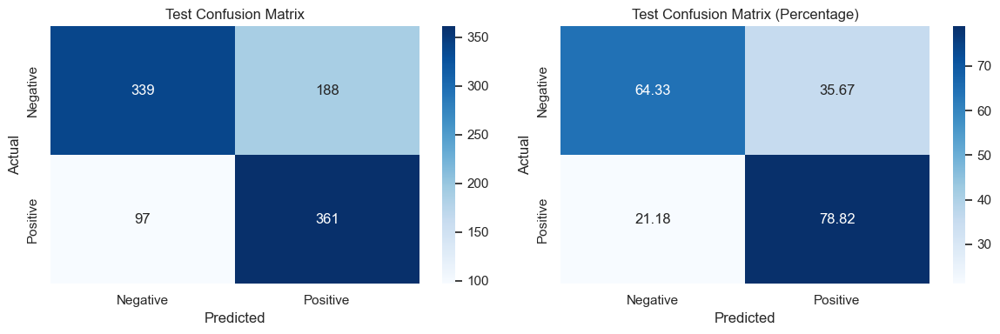

Model Evaluation Metrics:

Metrics       | Training Set | Testing Set
---------------------------------------------
Precision     | 0.9989       | 0.6576
Recall        | 1.0000       | 0.7882
Accuracy      | 0.9995       | 0.7107
F1 Score      | 0.9995       | 0.7170


In [1079]:
train_model_and_performance_eval(lgb_classifier, X_train, X_test, y_train, y_test, X, cutoff=0.4)

# MOBILE

## 3 MONTHS WINDOW

In [1080]:
def create_window_df(df):
    window_df = []
    
    data = df.groupby('SFDC Account ID')

    for group_name, group_df in data:
        group_df = group_df.sort_values(by='Consumption Date (Monthly)')
        
        for idx in range(len(group_df) - 3):
            row_data = group_df.iloc[idx:idx+4]

            # DEM Units Mobile (monthly):
            usage_month_1, usage_month_2, usage_month_3, usage_month_4 = row_data['DEM Units - Mobile Total (Monthly)']
            usage_mom_1_2 = round(((usage_month_2 - usage_month_1) / usage_month_1) * 100, 3) if usage_month_1 != 0 else 0
            usage_mom_1_3 = round(((usage_month_3 - usage_month_1) / usage_month_1) * 100, 3) if usage_month_1 != 0 else 0
            usage_mom_2_3 = round(((usage_month_3 - usage_month_2) / usage_month_2) * 100, 3) if usage_month_2 != 0 else 0

            ## Mobile Apps:
            Apps_month_1, Apps_month_2, Apps_month_3, Apps_month_4 = row_data['APPS_MOBILE']
            Apps_mom_1_2 = round(((Apps_month_2 - Apps_month_1) / Apps_month_1) * 100, 3) if Apps_month_1 != 0 else 0
            Apps_mom_1_3 = round(((Apps_month_3 - Apps_month_1) / Apps_month_1) * 100, 3) if Apps_month_1 != 0 else 0
            Apps_mom_2_3 = round(((Apps_month_3 - Apps_month_2) / Apps_month_2) * 100, 3) if Apps_month_2 != 0 else 0
    
            # Mobile Billed Sessions:
            se_month_1, se_month_2, se_month_3, se_month_4 = row_data['RUM_SESSIONS_MOBILE']
            se_mom_1_2 = round(((se_month_2 - se_month_1) / se_month_1) * 100, 3) if se_month_1 != 0 else 0
            se_mom_1_3 = round(((se_month_3 - se_month_1) / se_month_1) * 100, 3) if se_month_1 != 0 else 0
            se_mom_2_3 = round(((se_month_3 - se_month_2) / se_month_2) * 100, 3) if se_month_2 != 0 else 0
    
             # Competitor framework:
            frame_month_1, frame_month_2, frame_month_3, frame_month_4 = row_data['FRAMEWORK']
            frame_mom_1_2 = round(((frame_month_2 - frame_month_1) / frame_month_1) * 100, 3) if frame_month_1 != 0 else 0
            frame_mom_1_3 = round(((frame_month_3 - frame_month_1) / frame_month_1) * 100, 3) if frame_month_1 != 0 else 0
            frame_mom_2_3 = round(((frame_month_3 - frame_month_2) / frame_month_2) * 100, 3) if frame_month_2 != 0 else 0
    
            web = row_data.iloc[3]['Has Web']
            sr = row_data.iloc[3]['Has SR']
            sy = row_data.iloc[3]['Has SY']
            month = row_data.iloc[3]['Consumption Date (Monthly)']
            target = row_data.iloc[3]['Lost Account Has Mobile']
            number = row_data.iloc[3]['Date as Number']
            prev_retention = row_data.iloc[3]['Previous Retention Months Has Mobile']

            # Extracting encoded columns dynamically
            encoded_cols = [col for col in row_data.columns if col.startswith(tuple(categorical))]
            encoded_data = row_data[encoded_cols].values.flatten()

            window_df.append({
                'SFDC Account ID': group_name,
                'Predicting Month': month,
                'Date as Number': number,
                'Previous Retention Months' : prev_retention,

                'Usage - Month 3': usage_month_3,
                'Usage - MoM(12)': usage_mom_1_2,
                'Usage - MoM(13)': usage_mom_1_3,
                'Usage - MoM(23)': usage_mom_2_3,
                
                'Web Apps - MoM(12)': Apps_mom_1_2,
                'Web Apps - MoM(13)': Apps_mom_1_3,
                'Web Apps - MoM(23)': Apps_mom_2_3,

                'Web Sessions - MoM(12)': se_mom_1_2,
                'Web Sessions - MoM(13)': se_mom_1_3,
                'Web Sessions - MoM(23)': se_mom_2_3,

                'Framework - MoM(12)': frame_mom_1_2,
                'Framework - MoM(13)': frame_mom_1_3,
                'Framework - MoM(23)': frame_mom_2_3,

                **{col: val for col, val in zip(encoded_cols, encoded_data)},
                
                'Has Web': web,
                'Has SR': sr,
                'Has SY': sy,
                'Target (lost customer)': target
            })
    
    return pd.DataFrame(window_df)

mobile_df = create_window_df(encoded_data_M)
mobile_df['Target (lost customer)'] = mobile_df['Target (lost customer)'].astype(int)

## PYCARET

We are going to use the last month for testing the model. Hence, let us remove the last completed month (March 2024 for now), and proceed to develop the model without this month. Later we will use it for testing, and compare its accuracy. 

In [1081]:
train_val_filtered = mobile_df[(mobile_df['Date as Number'] != max_date) & (mobile_df['Date as Number'] != (max_date -1))  & (mobile_df['Date as Number'] != (max_date -2))]

In [1082]:
cols = [i for i in train_val_filtered.columns if i not in ('Target (lost customer)', 'SFDC Account ID', 'Predicting Month')]

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(train_val_filtered[cols], train_val_filtered['Target (lost customer)'], test_size=0.2, random_state=1)

In [1083]:
print("Lenght X_train:",len(X_train))
print("Length y_train:", len(y_train))
print("Lenght X_test:",len(X_test))
print("Length y_test:", len(y_test))

Lenght X_train: 82411
Length y_train: 82411
Lenght X_test: 20603
Length y_test: 20603


### RANDOM FOREST CLASSIFIER

In [1084]:
# MODEL TRAINING

rf = RandomForestClassifier(class_weight='balanced')
rf.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced')

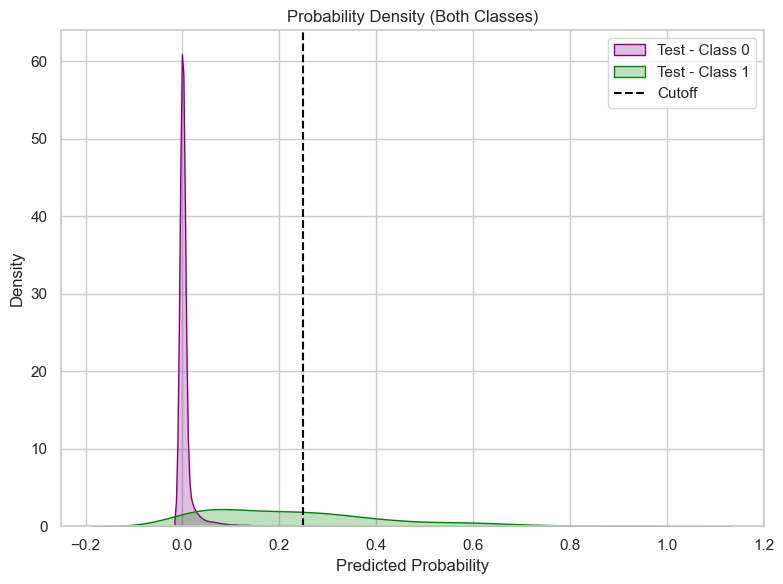

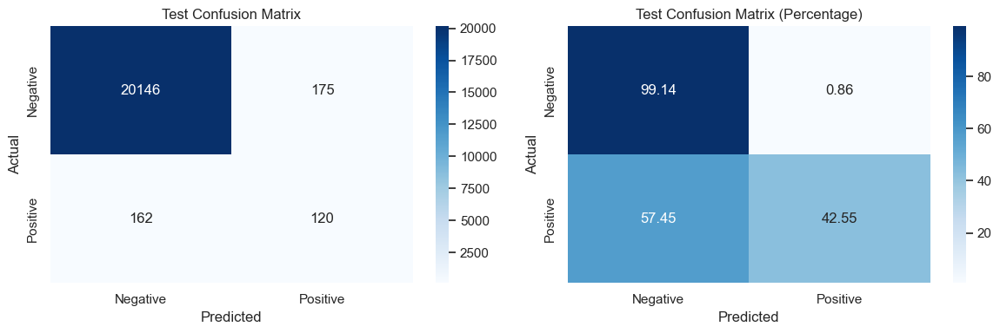

Model Evaluation Metrics:

Metrics       | Training Set | Testing Set
---------------------------------------------
Precision     | 0.9913       | 0.4068
Recall        | 1.0000       | 0.4255
Accuracy      | 0.9999       | 0.9836
F1 Score      | 0.9956       | 0.4159


In [1085]:
train_model_and_performance_eval(rf, X_train, X_test, y_train, y_test, cols, cutoff=0.25)

### EXTREME GRADIENT BOOSTING:

In [1086]:
# MODEL TRAINING
xgboost = xgb.XGBClassifier()
xgboost.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

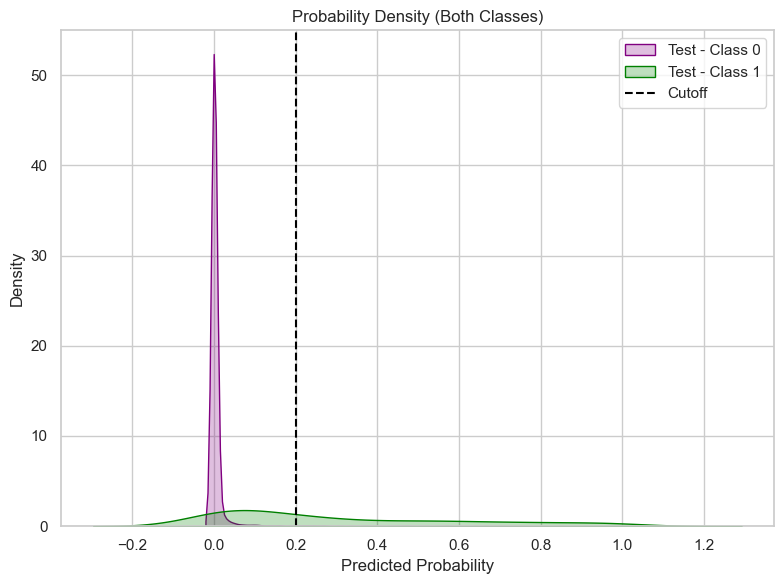

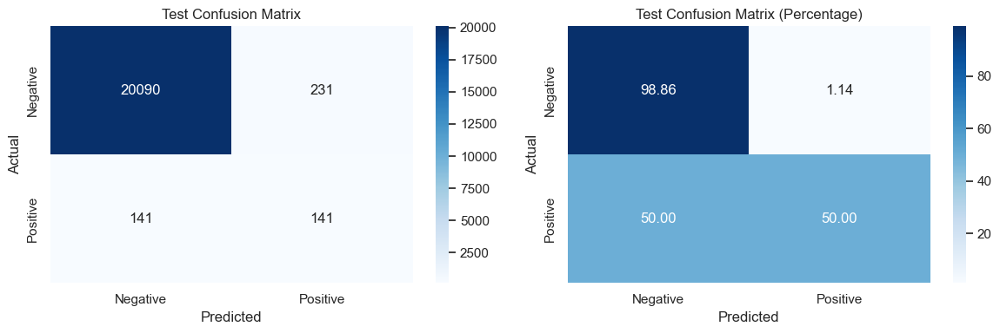

Model Evaluation Metrics:

Metrics       | Training Set | Testing Set
---------------------------------------------
Precision     | 0.7918       | 0.3790
Recall        | 0.9656       | 0.5000
Accuracy      | 0.9960       | 0.9819
F1 Score      | 0.8701       | 0.4312


In [1087]:
train_model_and_performance_eval(xgboost, X_train, X_test, y_train, y_test, cols, cutoff=0.2)

### LIGHT GBM CLASSIFIER:

In [1088]:
# MODEL TRAINING
lgbm = LGBMClassifier(class_weight='balanced')
lgbm.fit(X_train, y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1134, number of negative: 81277
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021982 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3150
[LightGBM] [Info] Number of data points in the train set: 82411, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000


LGBMClassifier(class_weight='balanced')

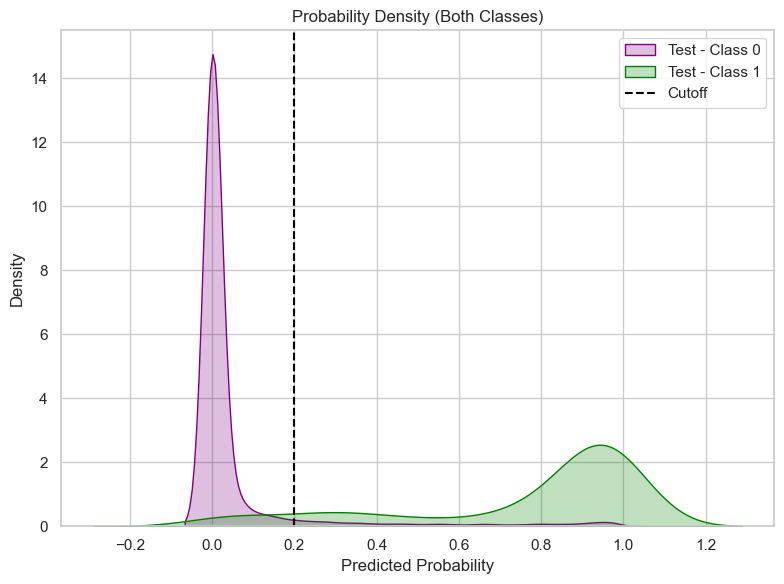

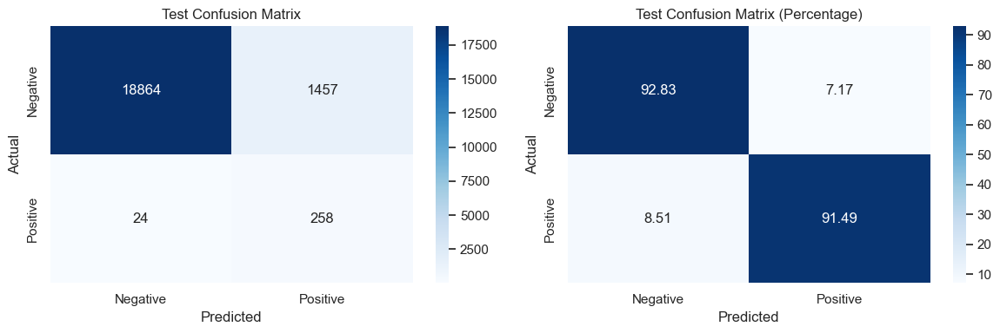

Model Evaluation Metrics:

Metrics       | Training Set | Testing Set
---------------------------------------------
Precision     | 0.1683       | 0.1504
Recall        | 1.0000       | 0.9149
Accuracy      | 0.9320       | 0.9281
F1 Score      | 0.2882       | 0.2584


In [1089]:
train_model_and_performance_eval(lgbm, X_train, X_test, y_train, y_test, cols, cutoff=0.2)

Precision --> XGBoost classifier has the highest precision on the training and testing set, with 0.9982 and 0.9610 respectively.

Recall --> LightGBM classifier has the highest recall on both the training and testing sets, with 0.9970 and 0.9882 respectively.

Accuray --> Random Forest and XGBoost classifiers has the highest accuracy, with 0.9995 and 0.9978 respectively.

F1 score --> Random Forest has the highest F1 score, with 0.9897 and 0.9523 respectively.

Based on these metrics:

> LightGBM generally performs the best among the three classifiers

## PREDICTIONS

To rigorously test the accuracy of our model, we will use the most recent complete month of data (March 24) as our test set. Applying our trained model to this dataset, we will then compare the predicted values with the actual values to assess the model's performance. By examining the performance metrics derived from this evaluation, we can gain insights into what areas we can improve and test if the model performs well.

Let us then, use March to predict what will our custoemrs do in that month:

In [1090]:
test_filtered_last = mobile_df[mobile_df['Date as Number'] == max_date -2][['SFDC Account ID', 'Predicting Month'] + cols]

In [1091]:
test_filtered_mobile = mobile_df[['SFDC Account ID', 'Predicting Month'] + cols]

In [1092]:
predictions = lgbm.predict(test_filtered_last[cols])
probabilities = lgbm.predict_proba(test_filtered_last[cols])

predictions_binary = np.where(probabilities[:, 1] >= 0.3, 1, 0)

In [1093]:
test_filtered_last['Prediction'] = predictions
test_filtered_last['Binary Prediction'] = predictions_binary
test_filtered_last['Actual Value']  = mobile_df[mobile_df['Date as Number'] == max_date -2]['Target (lost customer)'] 
test_filtered_last['Probability of Churn'] = np.round(probabilities[:, 1], 4)
test_filtered_last['Probability of Survival'] = np.round(probabilities[:, 0], 4)

In [1094]:
test_filtered_last.head()

,SFDC Account ID,Predicting Month,Date as Number,Previous Retention Months,Usage - Month 3,Usage - MoM(12),Usage - MoM(13),Usage - MoM(23),Web Apps - MoM(12),Web Apps - MoM(13),...,Vertical_Telecommunications,Vertical_Utilities,Has Web,Has SR,Has SY,Prediction,Binary Prediction,Actual Value,Probability of Churn,Probability of Survival
37,00100000001VLvGAAW,2024-04-01,41,0,0,0.0,0.0,0.0,0.0,0.0,...,False,False,1,0,0,0,0,0,0.0001,0.9999
65,00100000001VLvZAAW,2024-04-01,41,0,0,0.0,0.0,0.0,0.0,0.0,...,False,False,1,0,1,0,0,0,0.0001,0.9999
94,00100000001VSZLAA4,2024-04-01,41,0,0,0.0,0.0,0.0,0.0,0.0,...,False,False,1,1,0,0,0,0,0.0001,0.9999
134,00100000001XytIAAS,2024-04-01,41,0,0,0.0,0.0,0.0,0.0,0.0,...,False,False,1,0,1,0,0,0,0.0001,0.9999
174,00100000001Y6vqAAC,2024-04-01,41,0,0,0.0,0.0,0.0,0.0,0.0,...,False,False,0,0,1,0,0,0,0.0001,0.9999


In [1095]:
y_test_march = mobile_df[mobile_df['Date as Number'] == max_date -2]['Target (lost customer)'] 

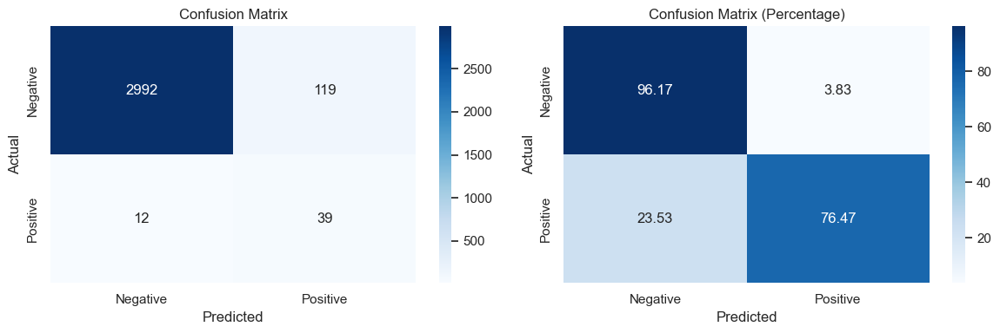

Metrics       | Testing Set
---------------------------------
Precision     | 0.2468
Recall        | 0.7647
Accuracy      | 0.9586
F1 Score      | 0.3732


In [1096]:
evaluate_metrics_test(y_test_march, predictions)

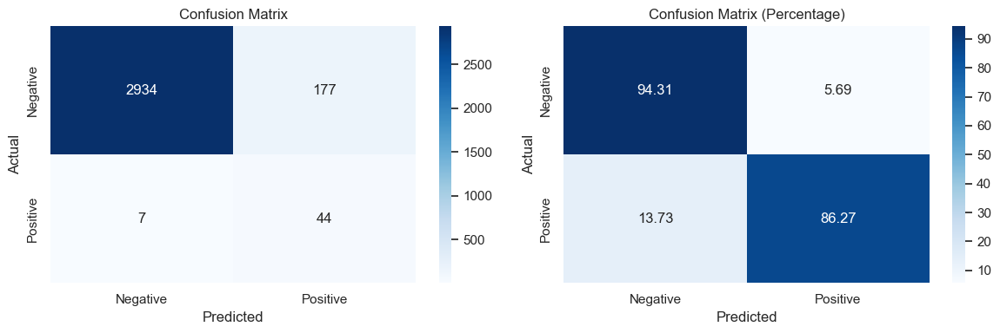

Metrics       | Testing Set
---------------------------------
Precision     | 0.1991
Recall        | 0.8627
Accuracy      | 0.9418
F1 Score      | 0.3235


In [1097]:
evaluate_metrics_test(y_test_march, predictions_binary)

In [1098]:
predictions = lgbm.predict(test_filtered_mobile[cols])
probabilities = lgbm.predict_proba(test_filtered_mobile[cols])

predictions_binary = np.where(probabilities[:, 1] >= 0.34, 1, 0)


test_filtered_mobile['Prediction'] = predictions
test_filtered_mobile['Binary Prediction'] = predictions_binary
test_filtered_mobile['Actual Value']  = mobile_df['Target (lost customer)'] 
test_filtered_mobile['Probability of Churn'] = np.round(probabilities[:, 1], 4)
test_filtered_mobile['Probability of Survival'] = np.round(probabilities[:, 0], 4)

test_filtered_mobile = test_filtered_mobile.sort_values(by='Probability of Churn', ascending=False)
test_filtered_mobile = test_filtered_mobile[['SFDC Account ID', 'Predicting Month', 'Previous Retention Months', 'Usage - Month 3', 'Usage - MoM(12)', 'Usage - MoM(13)', 'Usage - MoM(23)', 'Prediction','Binary Prediction', 'Actual Value', 'Probability of Churn','Probability of Survival', 'Has Web', 'Has SR', 'Has SY']]

In [1099]:
test_filtered_mobile.head()

,SFDC Account ID,Predicting Month,Previous Retention Months,Usage - Month 3,Usage - MoM(12),Usage - MoM(13),Usage - MoM(23),Prediction,Binary Prediction,Actual Value,Probability of Churn,Probability of Survival,Has Web,Has SR,Has SY
76121,0017000000b32yuAAA,2021-07-01,1,4007621,0.0,0.0,0.000,1,1,1,0.9970,0.0030,0,0,1
2921,00100000001gBpYAAU,2022-09-01,2,54581712,0.0,0.0,-0.873,1,1,1,0.9959,0.0041,0,0,1
922,00100000001g8sGAAQ,2023-09-01,1,20547,0.0,0.0,0.000,1,1,1,0.9955,0.0045,0,0,1
94637,0017000000rcGrXAAU,2022-05-01,1,1038372,0.0,0.0,0.000,1,1,1,0.9955,0.0045,0,0,1
2933,00100000001gBpYAAU,2023-09-01,1,62233652,0.0,0.0,0.000,1,1,1,0.9954,0.0046,0,0,1


In [1100]:
test_filtered_mobile.to_csv('Models/MOBILETestFiltered.csv', index=False)

## PLOTS

In [1101]:
y_pred_proba_xgb = xgboost.predict_proba(X_test)[::,1]
y_pred_proba_lgbm = lgbm.predict_proba(X_test)[::,1]
y_pred_proba_rf = rf.predict_proba(X_test)[::,1]

ROC CURVE

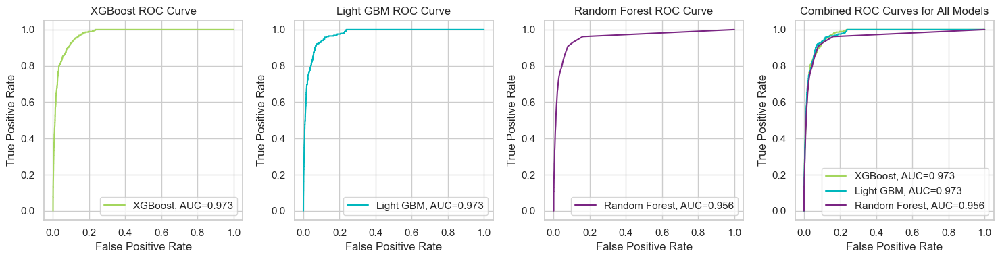

In [1102]:
fpr_dt, tpr_dt, _ = metrics.roc_curve(y_test, y_pred_proba_xgb)
auc_dt = round(metrics.roc_auc_score(y_test, y_pred_proba_xgb), 3)

fpr_lgbm, tpr_lgbm, _ = metrics.roc_curve(y_test, y_pred_proba_lgbm)
auc_lgbm = round(metrics.roc_auc_score(y_test, y_pred_proba_lgbm), 3)

fpr_rf, tpr_rf, _ = metrics.roc_curve(y_test, y_pred_proba_rf)
auc_rf = round(metrics.roc_auc_score(y_test, y_pred_proba_rf), 3)

fig, axs = plt.subplots(1, 4, figsize=(15, 4))

# Decision Tree ROC curve
axs[0].plot(fpr_dt, tpr_dt, label=f'XGBoost, AUC={auc_dt}', color='#a4d65e')  
axs[0].set_xlabel('False Positive Rate')
axs[0].set_ylabel('True Positive Rate')
axs[0].set_title('XGBoost ROC Curve')
axs[0].legend()
axs[0].grid(True)

# Light GBM ROC curve
axs[1].plot(fpr_lgbm, tpr_lgbm, label=f'Light GBM, AUC={auc_lgbm}', color='#00b7bd') 
axs[1].set_xlabel('False Positive Rate')
axs[1].set_ylabel('True Positive Rate')
axs[1].set_title('Light GBM ROC Curve')
axs[1].legend()
axs[1].grid(True)

# Random Forest ROC curve
axs[2].plot(fpr_rf, tpr_rf, label=f'Random Forest, AUC={auc_rf}', color='#7a2583') 
axs[2].set_xlabel('False Positive Rate')
axs[2].set_ylabel('True Positive Rate')
axs[2].set_title('Random Forest ROC Curve')
axs[2].legend()
axs[2].grid(True)

# Combined ROC curve for all models
axs[3].plot(fpr_dt, tpr_dt, label=f'XGBoost, AUC={auc_dt}', color='#a4d65e')  
axs[3].plot(fpr_lgbm, tpr_lgbm, label=f'Light GBM, AUC={auc_lgbm}', color='#00b7bd') 
axs[3].plot(fpr_rf, tpr_rf, label=f'Random Forest, AUC={auc_rf}', color='#7a2583') 
axs[3].set_xlabel('False Positive Rate')
axs[3].set_ylabel('True Positive Rate')
axs[3].set_title('Combined ROC Curves for All Models')
axs[3].legend()
axs[3].grid(True)

plt.tight_layout()
plt.show()

FEATURE IMPORTANCE

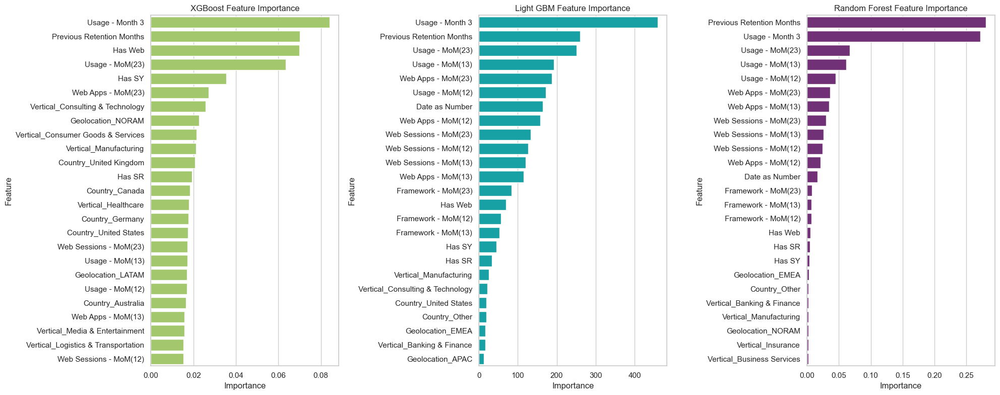

In [1103]:
feature_importances_xgboost = pd.DataFrame({'Feature': cols, 'Importance': xgboost.feature_importances_})
feature_importances_xgboost = feature_importances_xgboost.sort_values(by='Importance', ascending=False).head(25)

feature_importances_lgbm = pd.DataFrame({'Feature': cols, 'Importance': lgbm.feature_importances_})
feature_importances_lgbm = feature_importances_lgbm.sort_values(by='Importance', ascending=False).head(25)

feature_importances_rf = pd.DataFrame({'Feature': cols, 'Importance': rf.feature_importances_})
feature_importances_rf = feature_importances_rf.sort_values(by='Importance', ascending=False).head(25)


fig, axs = plt.subplots(1, 3, figsize=(20, 8))

# Plot for Decision Tree
sns.barplot(data=feature_importances_xgboost, x='Importance', y='Feature', color='#a4d65e', ax=axs[0])
axs[0].set_title('XGBoost Feature Importance')
axs[0].set_xlabel('Importance')
axs[0].set_ylabel('Feature')

# Plot for Light GBM
sns.barplot(data=feature_importances_lgbm, x='Importance', y='Feature', color='#00b7bd', ax=axs[1])
axs[1].set_title('Light GBM Feature Importance')
axs[1].set_xlabel('Importance')
axs[1].set_ylabel('Feature')

# Plot for Random Forest
sns.barplot(data=feature_importances_rf, x='Importance', y='Feature', color='#7a2583', ax=axs[2])
axs[2].set_title('Random Forest Feature Importance')
axs[2].set_xlabel('Importance')
axs[2].set_ylabel('Feature')

plt.tight_layout()
plt.show()

PRECISSION-RECALL CURVE

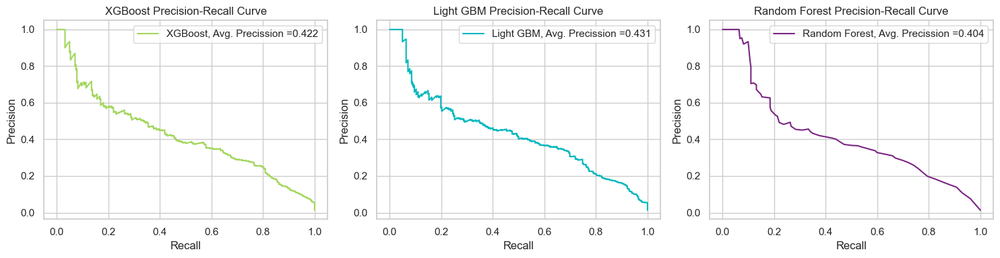

In [1104]:
precision_dt, recall_dt, _ = precision_recall_curve(y_test, y_pred_proba_xgb)
average_precision_dt = round(average_precision_score(y_test, y_pred_proba_xgb),3)

precision_lgbm, recall_lgbm, _ = precision_recall_curve(y_test, y_pred_proba_lgbm)
average_precision_lgbm = round(average_precision_score(y_test, y_pred_proba_lgbm),3)

precision_rf, recall_rf, _ = precision_recall_curve(y_test, y_pred_proba_rf)
average_precision_rf = round(average_precision_score(y_test, y_pred_proba_rf),3)

fig, axs = plt.subplots(1, 3, figsize=(15, 4))

# Decision Tree Precision-Recall curve
axs[0].plot(recall_dt, precision_dt, label=f'XGBoost, Avg. Precission ={average_precision_dt}', color='#a4d65e')  
axs[0].set_xlabel('Recall')
axs[0].set_ylabel('Precision')
axs[0].set_title('XGBoost Precision-Recall Curve')
axs[0].legend()
axs[0].grid(True)

# Light GBM Precision-Recall curve
axs[1].plot(recall_lgbm, precision_lgbm, label=f'Light GBM, Avg. Precission ={average_precision_lgbm}', color='#00b7bd') 
axs[1].set_xlabel('Recall')
axs[1].set_ylabel('Precision')
axs[1].set_title('Light GBM Precision-Recall Curve')
axs[1].legend()
axs[1].grid(True)

# Random Forest Precision-Recall curve
axs[2].plot(recall_rf, precision_rf, label=f'Random Forest, Avg. Precission ={average_precision_rf}', color='#7a2583') 
axs[2].set_xlabel('Recall')
axs[2].set_ylabel('Precision')
axs[2].set_title('Random Forest Precision-Recall Curve')
axs[2].legend()
axs[2].grid(True)

plt.tight_layout()
plt.show()

## EXPLAINABILITY FOR LGBM

In [1105]:
import shap
shap.initjs()

In [1106]:
explainer = shap.Explainer(lgbm)
shap_values = explainer(X_test)

In [1107]:
print("Shape of shap_values:", shap_values.shape)
print("Shape of X_test:", X_test.shape)

Shape of shap_values: (20603, 50)
Shape of X_test: (20603, 50)


Let us see which variables have an impact on our model's performance:

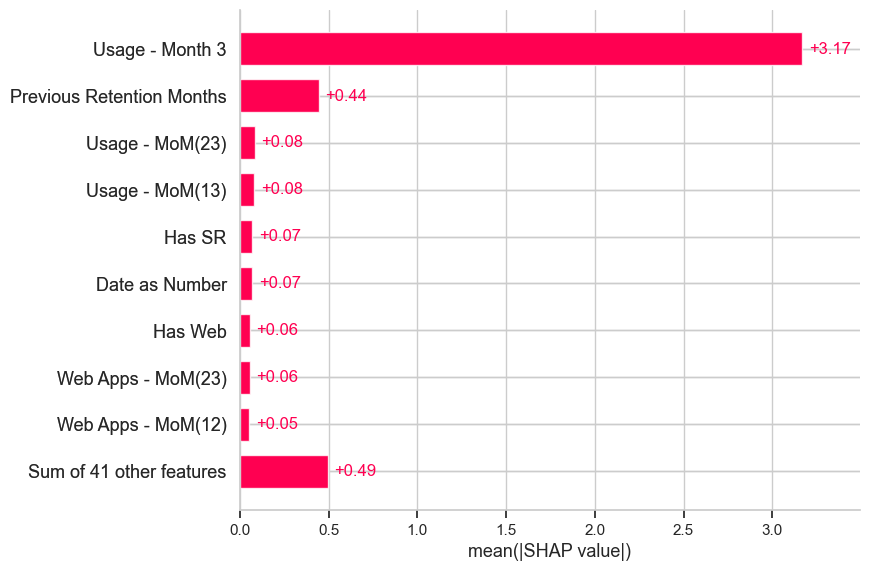

In [1108]:
shap.plots.bar(shap_values)

As we can see *Retention Months* is the variable with highest impact in our model, significantly surpassing other variables. It is then followed by *Usage - MoM (2,3)*, representing the Month-over-Month change between Month 2 and Month 3. This is logical since Usage - MoM (2,3) reflects the usage pattern immediately preceding the determination of account status.

Let us plot a summary plot of the overall model:

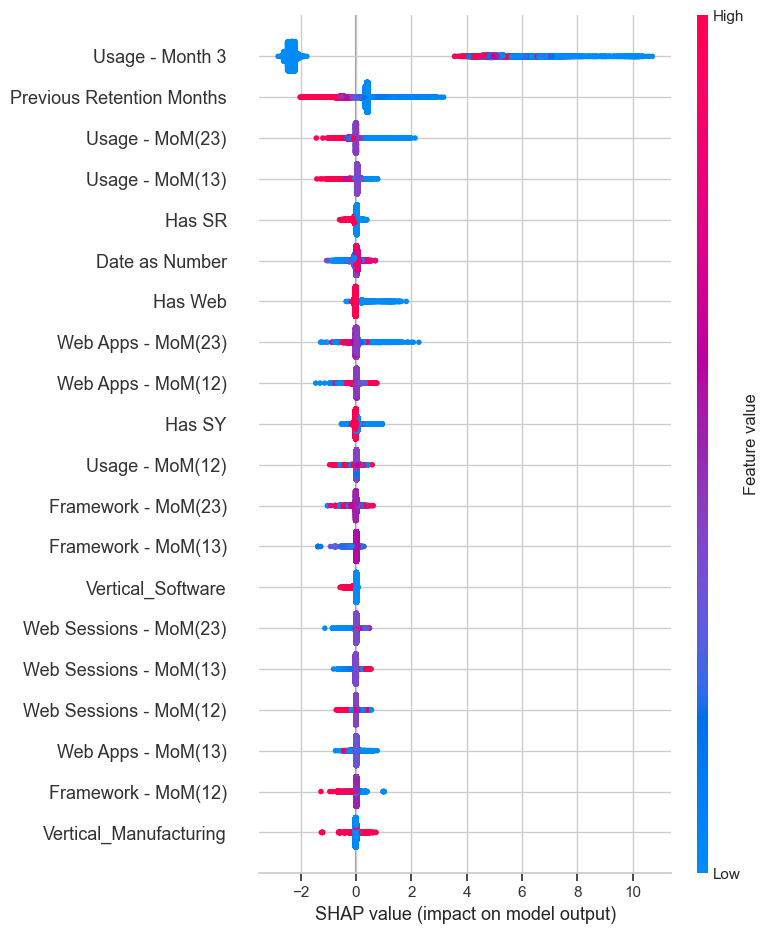

In [1109]:
shap.summary_plot(shap_values, X_test)

Each point on the chart is one SHAP value for a prediction and feature. 

**Red** color means **higher** value of a feature. 

**Blue** means **lower** value of a feature. We can get the general sense of features’ directionality impact based on the distribution of the red and blue dots.

In the chart above, we can conclude the following insights:
- Higher value of *Retention Months* leads to lower probability of churn. On the other hand, a lower value of Retention Months is linked to a higher likelihood of churn, indicating challenges in retaining customers with shorter retention periods. This observation suggests that Dynatrace may face difficulties retaining customers with initial exposure to the product, but performs well in retaining longer-standing customers once they have become familiar and engaged.


Let us perform a deeper analysis by examining the impact separately for Churn and Non-Churn accounts

**Account that did not churn:**

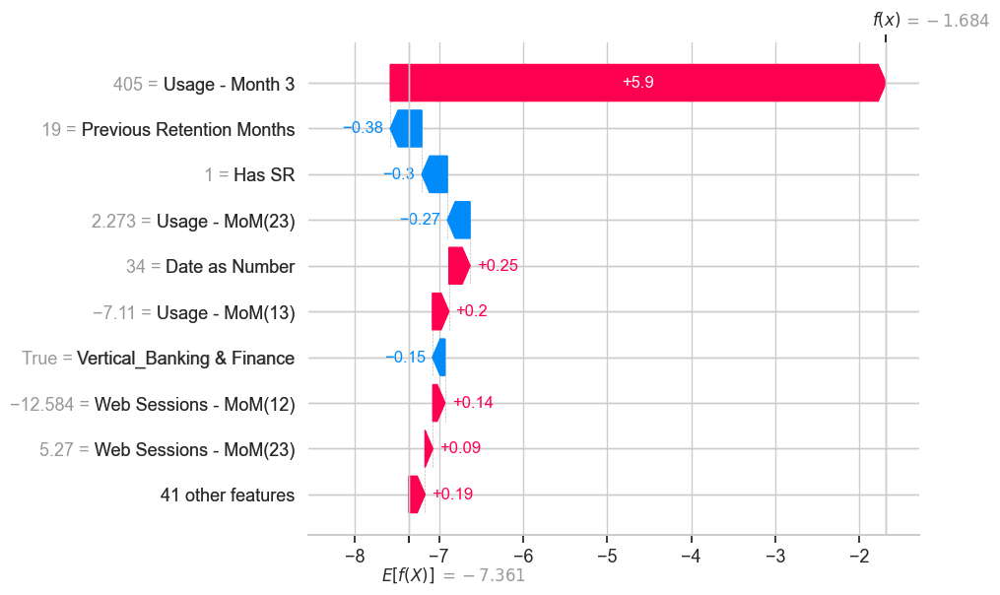

In [1110]:
shap.plots.waterfall(shap_values[0])

**Churned Account:**

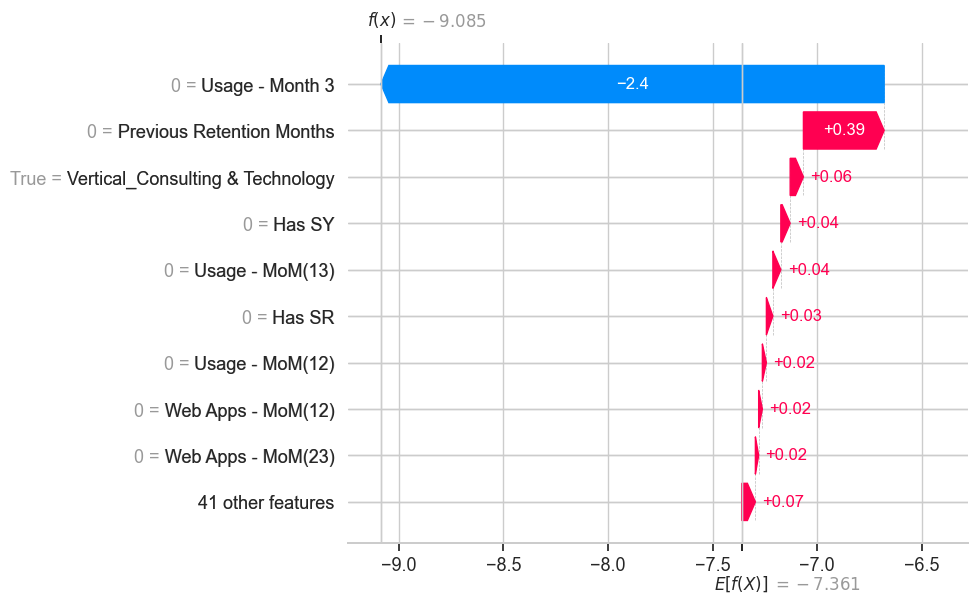

In [1111]:
shap.plots.waterfall(shap_values[1])

## SURVIVAL ANALYSIS

- Time-to-event data: we are going to use the consecutive retention months before a customer churns.

- Event indicator: A binary column indicating whether the churn event has occurred (1) or not (0) for each customer.

In [1112]:
df_M.fillna(0, inplace=True)
df_M.replace([np.inf, -np.inf], 0, inplace=True)
df_M = df_M[df_M['Date as Number'] != max_date]

### **KALPLAN-MEIER SURVIVAL CUVE**

The Kaplan-Meier survival curve shows the estimated probability of customers not churning over time (in terms of retention months).

In [1113]:
dff_ID = df_M.groupby('SFDC Account ID')

agg_retention_months = dff_ID['Previous Retention Months Has Mobile'].last()
date = dff_ID['Consumption Date (Monthly)'].last()
churn_status = dff_ID['Lost Account Has Mobile'].any()
vertical = dff_ID['Vertical'].last()
deployment = dff_ID['Deployment Type'].last()
arr = dff_ID['ARR Band'].last()
geolocation = dff_ID['Geolocation'].last()
country = dff_ID['Country'].last()
rum = dff_ID['UEM_ENABLED'].last()
se = dff_ID['SESSION_REPLAY_ENABLED'].last()
usage = dff_ID['DEM Units - Mobile Total (Monthly)'].mean()
prev_usage = dff_ID['DEM Units - Mobile Total (Monthly - Previous Month)'].mean()
apps = dff_ID['APPS_MOBILE'].mean() + dff_ID['WEB_APPS'].mean()
has_mob = dff_ID['Has Web'].last()
has_sr = dff_ID['Has SR'].last()
has_sy = dff_ID['Has SY'].last()



kaplain_df = pd.DataFrame({
    'SFDC Account ID': agg_retention_months.index,
    'Previous Retention Months Has Mobile': agg_retention_months.values,
    'Date': date.values,
    'Lost Account Mobile': churn_status.values,
    'Vertical': vertical.values,
    'Deployment Type': deployment.values,
    'ARR Band': arr.values,
    'Geolocation': geolocation.values,
    'Country': country.values,
    'Avg Usage': usage.values,
    'Avg Prev Usage': prev_usage.values,
    'Avg Apps': apps.values,
    'RUM Enabled': rum.values,
    'SR Enabled': se.values,
    'Has Web': has_mob.values,
    'Has SR': has_sr.values,
    'Has SY': has_sy.values

})

Mobile_embeding = kaplain_df.copy()

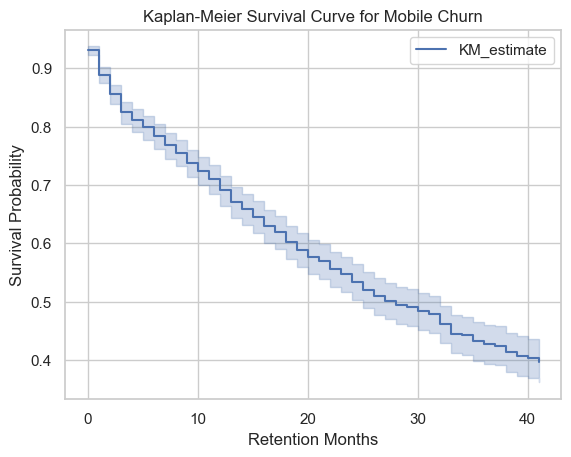

In [1114]:
durations = kaplain_df['Previous Retention Months Has Mobile']
event_observed = kaplain_df['Lost Account Mobile']

kmf = KaplanMeierFitter()

kmf.fit(durations, event_observed)

kmf.plot()
plt.title('Kaplan-Meier Survival Curve for Mobile Churn')
plt.xlabel('Retention Months')
plt.ylabel('Survival Probability')
plt.show()

Let us compute a confidence interval

In [1115]:
ci = kmf.confidence_interval_survival_function_
ci.head()

,KM_estimate_lower_0.95,KM_estimate_upper_0.95
0.0,0.923037,0.937268
1.0,0.874550,0.901227
2.0,0.838147,0.871129
3.0,0.804517,0.842232
4.0,0.790920,0.830341


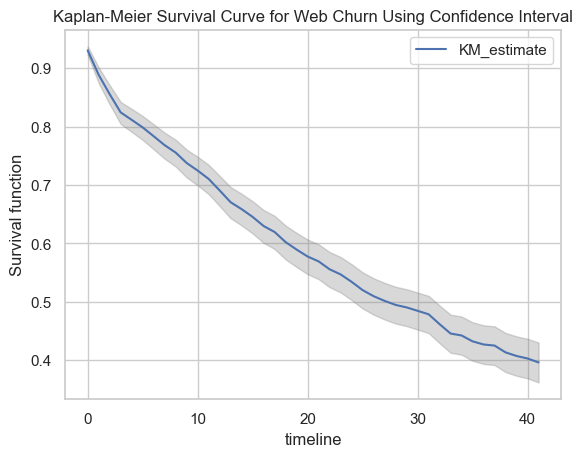

In [1116]:
ts = ci.index
low, high = np.transpose(ci.values)

plt.fill_between(ts, low, high, color='gray', alpha=0.3)
kmf.survival_function_.plot(ax=plt.gca(), label='Deployment Type_SaaS')  # Adding label for SaaS
plt.title('Kaplan-Meier Survival Curve for Web Churn Using Confidence Interval')
plt.ylabel('Survival function')
plt.legend()


Let us now add additional attributes that will help us predict.

In [1117]:
kaplain_df.head()

,SFDC Account ID,Previous Retention Months Has Mobile,Date,Lost Account Mobile,Vertical,Deployment Type,ARR Band,Geolocation,Country,Avg Usage,Avg Prev Usage,Avg Apps,RUM Enabled,SR Enabled,Has Web,Has SR,Has SY
0,00100000001VLvGAAW,0,2024-05-01,False,Consulting & Technology,SaaS,50-100k,NORAM,United States,0.000000,0.000000,4084.095238,True,False,1,0,0
1,00100000001VLvZAAW,0,2024-05-01,True,Business Services,SaaS,250-500k,NORAM,United States,0.066667,0.066667,822.866667,True,False,1,0,1
2,00100000001VSZLAA4,0,2024-05-01,False,Manufacturing,Managed,100-250k,NORAM,United States,0.000000,0.000000,673.838710,True,False,1,1,0
3,00100000001XytIAAS,0,2024-05-01,False,Insurance,Managed,500-1M,NORAM,United States,0.000000,0.000000,51927.333333,True,False,1,0,1
4,00100000001Y6vqAAC,0,2024-05-01,False,Banking & Finance,SaaS,250-500k,NORAM,United States,0.000000,0.000000,17.095238,True,True,0,0,1


### **TRAINING MODELS USING SURVIVAL ANALYSIS:**

In [1118]:
columns_to_encode = ['Deployment Type', 'Vertical', 'Country', 'Geolocation', 'ARR Band', 'RUM Enabled', 'SR Enabled']

label_encoder = LabelEncoder()


for column in columns_to_encode:
    kaplain_df[column] = label_encoder.fit_transform(kaplain_df[column].astype(str))

    original_values = label_encoder.classes_
    encoded_values = label_encoder.transform(original_values)
    

    print(f"\nConversions for {column}:")
    for original, encoded in zip(original_values, encoded_values):
        print(f"{original} = {encoded}")


Conversions for Deployment Type:
Managed = 0
SaaS = 1

Conversions for Vertical:
Banking & Finance = 0
Business Services = 1
Consulting & Technology = 2
Consumer Goods & Services = 3
Government = 4
Healthcare = 5
Insurance = 6
Logistics & Transportation = 7
Manufacturing = 8
Media & Entertainment = 9
Other = 10
Retail & Wholesale = 11
Software = 12
Telecommunications = 13
Utilities = 14

Conversions for Country:
Australia = 0
Brazil = 1
Canada = 2
France = 3
Germany = 4
Italy = 5
Mexico = 6
Other = 7
Spain = 8
United Kingdom = 9
United States = 10

Conversions for Geolocation:
0 = 0
APAC = 1
EMEA = 2
LATAM = 3
NORAM = 4

Conversions for ARR Band:
0-10k = 0
1.5-2M = 1
10-20k = 2
100-250k = 3
1M-1.5M = 4
20-50k = 5
250-500k = 6
2M-3M = 7
3-5M = 8
50-100k = 9
500-1M = 10
>5M = 11

Conversions for RUM Enabled:
0 = 0
False = 1
True = 2

Conversions for SR Enabled:
0 = 0
False = 1
True = 2


In [1119]:
cols = [i for i in kaplain_df.columns if i not in ('Lost Account Mobile', 'SFDC Account ID', ' Previous Retention Months Has Mobile', 'Date')]

X_train, X_test, y_train, y_test = train_test_split(kaplain_df[cols], kaplain_df[['Lost Account Mobile', 'Previous Retention Months Has Mobile']], test_size=0.2, random_state=1)

In [1120]:
print("Lenght X_train:",len(X_train))
print("Length y_train:", len(y_train))
print("Lenght X_test:",len(X_test))
print("Length y_test:", len(y_test))

Lenght X_train: 3936
Length y_train: 3936
Lenght X_test: 985
Length y_test: 985


In [1121]:
event_indicator = (y_train['Lost Account Mobile']).astype(bool)  
survival_times = y_train['Previous Retention Months Has Mobile'].astype(int)  

event_field_name = 'event_indicator'  
time_field_name = 'survival_months'  

# Strucured array
y_structured = np.array(list(zip(event_indicator, survival_times)), 
                        dtype=[(event_field_name, bool), (time_field_name, float)])


#### RANDOM SURVIVAL FOREST:

In [1122]:
rsf = RandomSurvivalForest(
    n_estimators=1000, min_samples_split=10, min_samples_leaf=15, n_jobs=-1, random_state=20
)
rsf.fit(X_train, y_structured)

RandomSurvivalForest(min_samples_leaf=15, min_samples_split=10,
                     n_estimators=1000, n_jobs=-1, random_state=20)

We can check how well the model performs by evaluating it on the test data:

In [1123]:
event_indicator_test = (y_test['Lost Account Mobile']).astype(bool)  
survival_times_test = y_test['Previous Retention Months Has Mobile'].astype(int)  

event_field_name = 'event_indicator'  
time_field_name = 'survival_months'  

y_structured_test= np.array(list(zip(event_indicator_test, survival_times_test)), 
                        dtype=[(event_field_name, bool), (time_field_name, float)])

In [1124]:
print('Score:', rsf.score(X_test, y_structured_test))

Score: 0.9677028969064367


Let us now select some customers of Abril 24, and apply a survival analysis on them:

In [1125]:
data_abril = df_W[df_W['Consumption Date (Monthly)'] == '2024-04-01']

abril_sfdc_ids = data_abril['SFDC Account ID'].unique()

filtered_kaplain_df = kaplain_df[kaplain_df['SFDC Account ID'].isin(abril_sfdc_ids)]

X_testing = filtered_kaplain_df[cols]

In [1126]:
surv_rf = rsf.predict_survival_function(X_testing, return_array=True)

#### GRADIENT BOOSTING SURVIVAL:

In [1127]:
gboosts = GradientBoostingSurvivalAnalysis()
gboosts.fit(X_train, y_structured)

GradientBoostingSurvivalAnalysis()

In [1128]:
print('Score:', gboosts.score(X_test, y_structured_test))

Score: 0.9964954743715806


In [1129]:
surv_gboost = gboosts.predict_survival_function(X_testing, return_array=True)

#### SURVIVAL TREE:

In [1130]:
st = SurvivalTree()
st.fit(X_train, y_structured)

SurvivalTree()

In [1131]:
print('Score:', st.score(X_test, y_structured_test))

Score: 0.9650808057887704


In [1132]:
surv_st = st.predict_survival_function(X_testing, return_array=True)

### PLOTS OF SURVIVAL CURVE 

In [1133]:
sfdc_account_ids = filtered_kaplain_df['SFDC Account ID']
sfdc_account_ids_to_plot = '00100000001VSZLAA4'

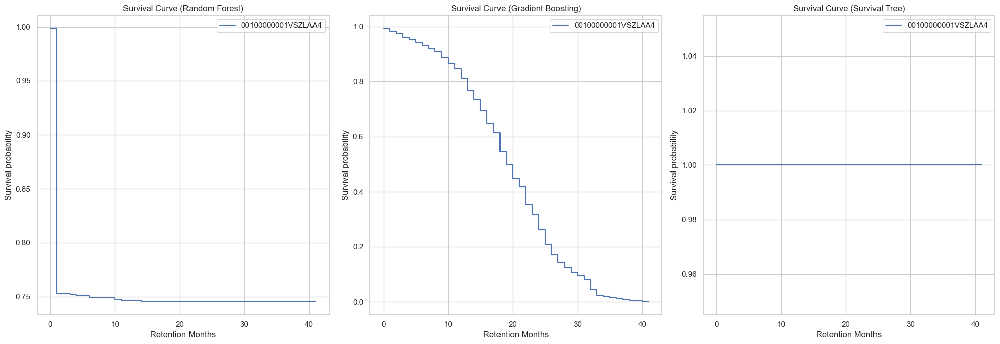

In [1134]:
unique_times_rsf = rsf.unique_times_
unique_times_gb = gboosts.unique_times_
unique_times_st = st.unique_times_

fig, axes = plt.subplots(1, 3, figsize=(20, 7))  

# Random Forest
ax1 = axes[0]  
ax1.set_title('Survival Curve (Random Forest)')
ax1.set_ylabel("Survival probability")
ax1.set_xlabel("Retention Months")

for sfdc_account_id, s in zip(sfdc_account_ids, surv_rf):
    if sfdc_account_id in sfdc_account_ids_to_plot:
        ax1.step(unique_times_rsf, s, where="post", label=f"{sfdc_account_id}")

ax1.legend()
ax1.grid(True)

# Gradient Boosting
ax2 = axes[1] 
ax2.set_title('Survival Curve (Gradient Boosting)')
ax2.set_ylabel("Survival probability")
ax2.set_xlabel("Retention Months")

for sfdc_account_id, s in zip(sfdc_account_ids, surv_gboost):
    if sfdc_account_id in sfdc_account_ids_to_plot:
        ax2.step(unique_times_gb, s, where="post", label=f"{sfdc_account_id}")

ax2.legend()
ax2.grid(True)

# Survival Tree
ax3 = axes[2] 
ax3.set_title('Survival Curve (Survival Tree)')
ax3.set_ylabel("Survival probability")
ax3.set_xlabel("Retention Months")

for sfdc_account_id, s in zip(sfdc_account_ids, surv_st):
    if sfdc_account_id in sfdc_account_ids_to_plot:
        ax3.step(unique_times_st, s, where="post", label=f"{sfdc_account_id}")

ax3.legend()
ax3.grid(True)

# Displaying the plot
plt.tight_layout()
plt.show()


#### Survival Table:

Let's create a table with the survival probability for each model.

RANDOM FOREST SURVIVAL:

In [1135]:
survival_table_rf = pd.DataFrame(index=rsf.unique_times_, columns=sfdc_account_ids)

for i, (sfdc_account_id, s) in enumerate(zip(sfdc_account_ids, surv_rf)):
    survival_table_rf[sfdc_account_id] = s


survival_table_transposed_rf = survival_table_rf.T.reset_index()
survival_table_transposed_rf.rename(columns={'index': 'SFDC Account ID'}, inplace=True)

In [1136]:
survival_table_transposed_rf.head()

,SFDC Account ID,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,...,32.0,33.0,34.0,35.0,36.0,37.0,38.0,39.0,40.0,41.0
0,00100000001VLvGAAW,0.996856,0.807332,0.806204,0.804128,0.801759,0.801584,0.800398,0.800398,0.800273,...,0.794856,0.794700,0.794700,0.794700,0.794700,0.794700,0.794700,0.794700,0.794700,0.794700
1,00100000001VLvZAAW,0.256204,0.201374,0.189317,0.171967,0.164585,0.158741,0.158057,0.149021,0.148614,...,0.120813,0.120535,0.120535,0.120201,0.120080,0.120080,0.119951,0.119848,0.119848,0.116961
2,00100000001VSZLAA4,0.998241,0.752757,0.752606,0.751834,0.751221,0.750960,0.749332,0.749132,0.748906,...,0.745680,0.745680,0.745680,0.745680,0.745680,0.745680,0.745680,0.745680,0.745680,0.745680
3,00100000001XytIAAS,0.992087,0.794499,0.792283,0.788304,0.786783,0.786020,0.785633,0.784998,0.784883,...,0.779219,0.779219,0.779219,0.779219,0.779219,0.779219,0.779219,0.779219,0.779219,0.779219
4,00100000001Y6vqAAC,0.996418,0.809075,0.805635,0.804917,0.800144,0.799999,0.799999,0.799276,0.799094,...,0.782912,0.782622,0.782622,0.782622,0.782622,0.782622,0.782622,0.782622,0.781859,0.781859


In [1137]:
survival_long_format_mobile = pd.melt(
    survival_table_transposed_rf,
    id_vars=['SFDC Account ID'],
    var_name='Mobile - Retention Months',
    value_name='Mobile- Probability of Survival'
)
survival_long_format_mobile.head()

,SFDC Account ID,Mobile - Retention Months,Mobile- Probability of Survival
0,00100000001VLvGAAW,0.0,0.996856
1,00100000001VLvZAAW,0.0,0.256204
2,00100000001VSZLAA4,0.0,0.998241
3,00100000001XytIAAS,0.0,0.992087
4,00100000001Y6vqAAC,0.0,0.996418


In [1138]:
survival_long_format_mobile.to_csv('Survival/MobileSurvivalTable.csv', index=False)

GRADIENT BOOSING SURVIVAL:

In [1139]:
survival_table_gb = pd.DataFrame(index=gboosts.unique_times_, columns=sfdc_account_ids)

for i, (sfdc_account_id, s) in enumerate(zip(sfdc_account_ids, surv_gboost)):
    survival_table_gb[sfdc_account_id] = s


survival_table_transposed_gb = survival_table_gb.T.reset_index()
survival_table_transposed_gb.rename(columns={'index': 'SFDC Account ID'}, inplace=True)

In [1140]:
survival_table_transposed_gb.head()

,SFDC Account ID,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,...,32.0,33.0,34.0,35.0,36.0,37.0,38.0,39.0,40.0,41.0
0,00100000001VLvGAAW,0.991569,0.983875,0.975655,0.960619,0.951719,0.943092,0.931395,0.918985,0.908704,...,4.379152e-02,2.452139e-02,2.046867e-02,1.388180e-02,1.106442e-02,9.752225e-03,4.864795e-03,2.953173e-03,2.444884e-03,1.632717e-03
1,00100000001VLvZAAW,0.460282,0.225414,0.104491,0.025173,0.010727,0.004657,0.001484,0.000434,0.000155,...,3.116244e-125,2.593801e-148,1.675311e-155,5.876969e-171,5.505690e-180,5.206063e-185,1.088666e-212,1.482678e-232,4.503490e-240,3.839546e-256
2,00100000001VSZLAA4,0.991569,0.983875,0.975655,0.960619,0.951719,0.943092,0.931395,0.918985,0.908704,...,4.379152e-02,2.452139e-02,2.046867e-02,1.388180e-02,1.106442e-02,9.752225e-03,4.864795e-03,2.953173e-03,2.444884e-03,1.632717e-03
3,00100000001XytIAAS,0.991569,0.983875,0.975655,0.960619,0.951719,0.943092,0.931395,0.918985,0.908704,...,4.379152e-02,2.452139e-02,2.046867e-02,1.388180e-02,1.106442e-02,9.752225e-03,4.864795e-03,2.953173e-03,2.444884e-03,1.632717e-03
4,00100000001Y6vqAAC,0.991569,0.983875,0.975655,0.960619,0.951719,0.943092,0.931395,0.918985,0.908704,...,4.379152e-02,2.452139e-02,2.046867e-02,1.388180e-02,1.106442e-02,9.752225e-03,4.864795e-03,2.953173e-03,2.444884e-03,1.632717e-03


In [1141]:
test_filtered_last.head()

,SFDC Account ID,Predicting Month,Date as Number,Previous Retention Months,Usage - Month 3,Usage - MoM(12),Usage - MoM(13),Usage - MoM(23),Web Apps - MoM(12),Web Apps - MoM(13),...,Vertical_Telecommunications,Vertical_Utilities,Has Web,Has SR,Has SY,Prediction,Binary Prediction,Actual Value,Probability of Churn,Probability of Survival
37,00100000001VLvGAAW,2024-04-01,41,0,0,0.0,0.0,0.0,0.0,0.0,...,False,False,1,0,0,0,0,0,0.0001,0.9999
65,00100000001VLvZAAW,2024-04-01,41,0,0,0.0,0.0,0.0,0.0,0.0,...,False,False,1,0,1,0,0,0,0.0001,0.9999
94,00100000001VSZLAA4,2024-04-01,41,0,0,0.0,0.0,0.0,0.0,0.0,...,False,False,1,1,0,0,0,0,0.0001,0.9999
134,00100000001XytIAAS,2024-04-01,41,0,0,0.0,0.0,0.0,0.0,0.0,...,False,False,1,0,1,0,0,0,0.0001,0.9999
174,00100000001Y6vqAAC,2024-04-01,41,0,0,0.0,0.0,0.0,0.0,0.0,...,False,False,0,0,1,0,0,0,0.0001,0.9999


In [1142]:
survival_df = pd.DataFrame(columns=['SFDC Account ID', 'Predicting Month', 'Previous Retention Months', 'Prediction', 'Actual Value', 'Probability of Churn', 'Probability of Survival','Survival Probability RF', 'Survival Probability GB'])

for index, row in test_filtered_last.iterrows():
    sfdc_account_id = row['SFDC Account ID']
    month = row['Predicting Month']
    prev_retention_months = row['Previous Retention Months']
    predicted_value = row['Prediction']
    actual_value = row['Actual Value']
    churn_prob = row['Probability of Churn']
    surv_prob = row['Probability of Survival']
    
    if sfdc_account_id in survival_table_transposed_rf['SFDC Account ID'].values:
        survival_row_rf = survival_table_transposed_rf[survival_table_transposed_rf['SFDC Account ID'] == sfdc_account_id]
        try:
            survival_prob_rf = survival_row_rf.at[survival_row_rf.index[0], prev_retention_months]
        except KeyError:
            survival_prob_rf = 0

    if sfdc_account_id in survival_table_transposed_gb['SFDC Account ID'].values:
        survival_row_gb = survival_table_transposed_gb[survival_table_transposed_gb['SFDC Account ID'] == sfdc_account_id]
        try:
            survival_prob_gb = survival_row_gb.at[survival_row_gb.index[0], prev_retention_months]
        except KeyError:
            survival_prob_gb = 0

            

    survival_df = survival_df._append({'SFDC Account ID': sfdc_account_id,
                            'Predicting Month': month,
                            'Previous Retention Months': prev_retention_months,
                            'Actual Value': actual_value,
                            'Prediction': predicted_value,
                            'Probability of Churn': churn_prob,
                            'Probability of Survival': surv_prob,
                            'Survival Probability RF': survival_prob_rf,
                            'Survival Probability GB': survival_prob_gb}, ignore_index=True)

C:\Users\martina.tarres\AppData\Local\Temp\ipykernel_25572\576253458.py:28: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  survival_df = survival_df._append({'SFDC Account ID': sfdc_account_id,


CHANGE TRESHOLD TO FIND BEST PARAMETER

In [1143]:
survival_df['Probability of Churn RF'] = 1 - survival_df['Survival Probability RF']
survival_df['Probability of Churn GB'] = 1 - survival_df['Survival Probability GB']
survival_df.head()

,SFDC Account ID,Predicting Month,Previous Retention Months,Prediction,Actual Value,Probability of Churn,Probability of Survival,Survival Probability RF,Survival Probability GB,Probability of Churn RF,Probability of Churn GB
0,00100000001VLvGAAW,2024-04-01,0,0,0,0.0001,0.9999,0.996856,0.991569,0.003144,0.008431
1,00100000001VLvZAAW,2024-04-01,0,0,0,0.0001,0.9999,0.256204,0.460282,0.743796,0.539718
2,00100000001VSZLAA4,2024-04-01,0,0,0,0.0001,0.9999,0.998241,0.991569,0.001759,0.008431
3,00100000001XytIAAS,2024-04-01,0,0,0,0.0001,0.9999,0.992087,0.991569,0.007913,0.008431
4,00100000001Y6vqAAC,2024-04-01,0,0,0,0.0001,0.9999,0.996418,0.991569,0.003582,0.008431


#### RANDOM FOREST:

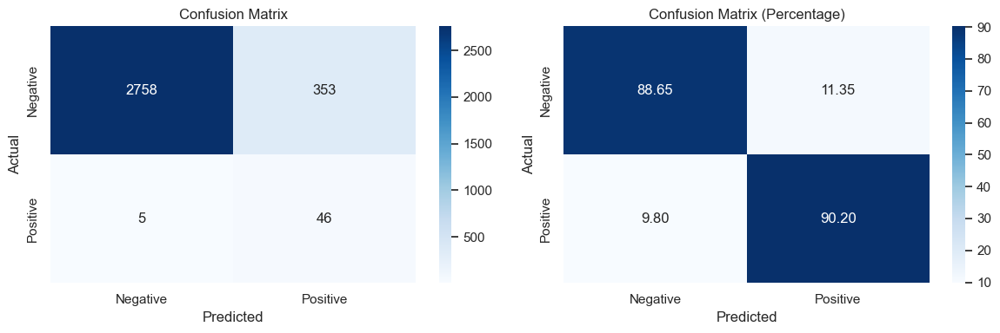

Metrics       | Testing Set
---------------------------------
Precision     | 0.1153
Recall        | 0.9020
Accuracy      | 0.8868
F1 Score      | 0.2044


In [1144]:
threshold_rf = 0.4

survival_df['Prediction RF'] = np.where(survival_df['Probability of Churn RF'] >= threshold_rf, 1, 0)

true_labels = survival_df['Actual Value'].astype(int)
predicted_labels_rf = survival_df['Prediction RF'].astype(int)

evaluate_metrics_test(true_labels, predicted_labels_rf)


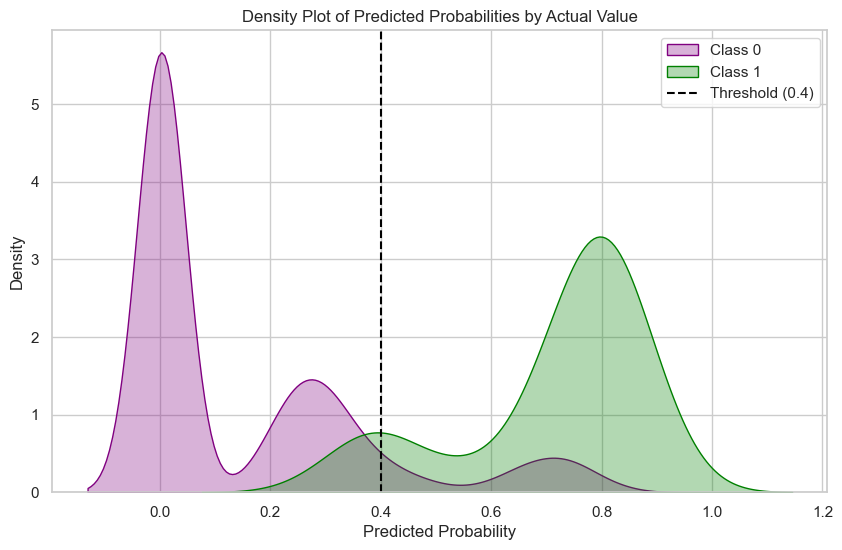

In [1145]:
sns.set(style="whitegrid")
colors = ['purple', 'green']
plt.figure(figsize=(10, 6))

for class_value, color in zip([0, 1], colors):
    sns.kdeplot( data=survival_df[survival_df["Actual Value"] == class_value], x="Probability of Churn RF", fill=True, common_norm=False, alpha=0.3, linewidth=1, color=color, label=f'Class {class_value}')

plt.axvline(x=threshold_rf, linestyle='--', color='black', label=f'Threshold ({threshold_rf})')

plt.title("Density Plot of Predicted Probabilities by Actual Value")
plt.xlabel("Predicted Probability")
plt.ylabel("Density")
plt.legend()

plt.show()

#### GRADIENT BOOSTING:

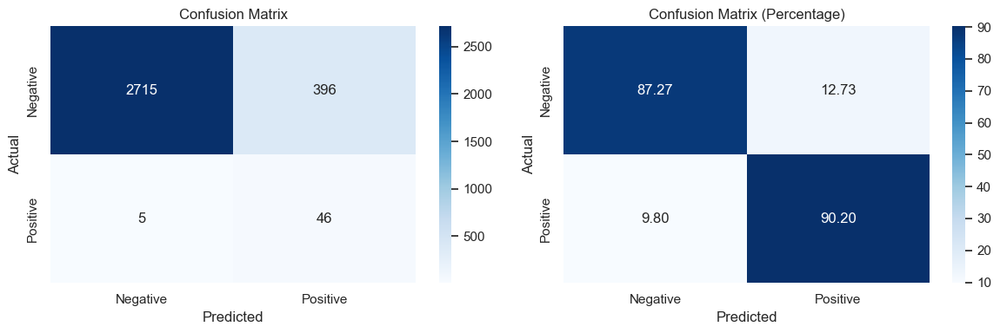

Metrics       | Testing Set
---------------------------------
Precision     | 0.1041
Recall        | 0.9020
Accuracy      | 0.8732
F1 Score      | 0.1866


In [1146]:
threshold_gb = 0.4

survival_df['Prediction GB'] = np.where(survival_df['Probability of Churn GB'] >= threshold_gb, 1, 0)

predicted_labels_gb = survival_df['Prediction GB'].astype(int)

evaluate_metrics_test(true_labels, predicted_labels_gb)

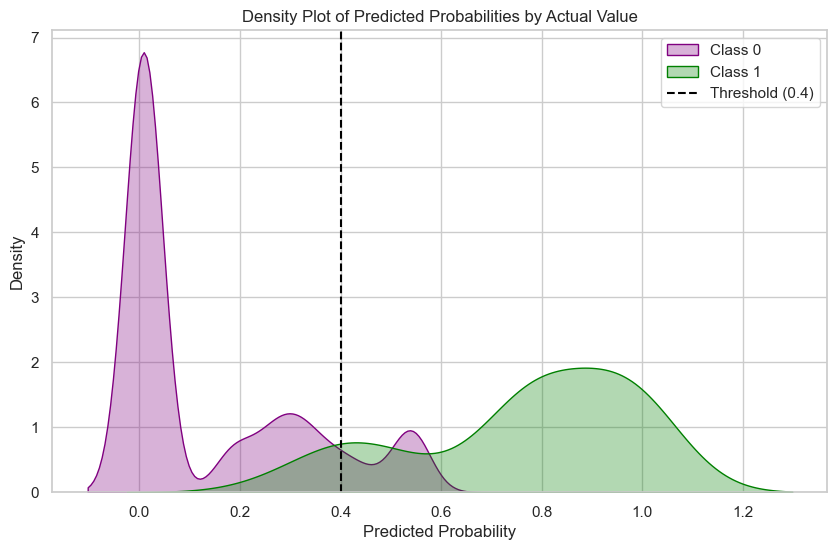

In [1147]:
sns.set(style="whitegrid")
colors = ['purple', 'green']
plt.figure(figsize=(10, 6))

for class_value, color in zip([0, 1], colors):
    sns.kdeplot( data=survival_df[survival_df["Actual Value"] == class_value], x="Probability of Churn GB", fill=True, common_norm=False, alpha=0.3, linewidth=1, color=color, label=f'Class {class_value}')

plt.axvline(x=threshold_rf, linestyle='--', color='black', label=f'Threshold ({threshold_rf})')

plt.title("Density Plot of Predicted Probabilities by Actual Value")
plt.xlabel("Predicted Probability")
plt.ylabel("Density")
plt.legend()

plt.show()

In [1148]:
a = survival_df[survival_df['SFDC Account ID'] == '00100000001VSZLAA4']
a

,SFDC Account ID,Predicting Month,Previous Retention Months,Prediction,Actual Value,Probability of Churn,Probability of Survival,Survival Probability RF,Survival Probability GB,Probability of Churn RF,Probability of Churn GB,Prediction RF,Prediction GB
2,00100000001VSZLAA4,2024-04-01,0,0,0,0.0001,0.9999,0.998241,0.991569,0.001759,0.008431,0,0


## EMBEDING MODEL

We will now use a embeding model, where we will transform text or attributes into a dense vector of a fixed size.

Sentence Transformers are models designed to convert sentences or texts into numerical representations (vectors or embeddings) in such a way that semantically similar texts have similar embeddings.

In [1149]:
Mobile_embeding.head()

,SFDC Account ID,Previous Retention Months Has Mobile,Date,Lost Account Mobile,Vertical,Deployment Type,ARR Band,Geolocation,Country,Avg Usage,Avg Prev Usage,Avg Apps,RUM Enabled,SR Enabled,Has Web,Has SR,Has SY
0,00100000001VLvGAAW,0,2024-05-01,False,Consulting & Technology,SaaS,50-100k,NORAM,United States,0.000000,0.000000,4084.095238,True,False,1,0,0
1,00100000001VLvZAAW,0,2024-05-01,True,Business Services,SaaS,250-500k,NORAM,United States,0.066667,0.066667,822.866667,True,False,1,0,1
2,00100000001VSZLAA4,0,2024-05-01,False,Manufacturing,Managed,100-250k,NORAM,United States,0.000000,0.000000,673.838710,True,False,1,1,0
3,00100000001XytIAAS,0,2024-05-01,False,Insurance,Managed,500-1M,NORAM,United States,0.000000,0.000000,51927.333333,True,False,1,0,1
4,00100000001Y6vqAAC,0,2024-05-01,False,Banking & Finance,SaaS,250-500k,NORAM,United States,0.000000,0.000000,17.095238,True,True,0,0,1


Let us first convert our data into tokens, so the text is first split into smaller units called tokens:

In [1150]:
def compile_text(x):
    text = f"""SFDC Account ID: {x['SFDC Account ID']}, Previous Retention Months Has Mobile: {x['Previous Retention Months Has Mobile']}, Vertical: {x['Vertical']}, Deployment Type: {x['Deployment Type']}, ARR Band: {x['ARR Band']}, Geolocation: {x['Geolocation']}, Country: {x['Country']}, Avg Usage: {x['Avg Usage']}, Avg Prev Usage: {x['Avg Prev Usage']}, Avg Apps: {x['Avg Apps']}, RUM Enabled: {x['RUM Enabled']}, SR Enabled: {x['SR Enabled']}, Has Web: {x['Has Web']}, Has SR: {x['Has SR']}, Has SY: {x['Has SY']}"""
    return text


sentences = Mobile_embeding.apply(lambda x: compile_text(x), axis=1).tolist()

Let us now encode each token into a numerical representation:

In [1151]:
model = SentenceTransformer(r"sentence-transformers/paraphrase-MiniLM-L6-v2") 
output = model.encode(sentences=sentences, show_progress_bar=True, normalize_embeddings=True) 
df_embedding = pd.DataFrame(output) 
df_embedding

c:\Users\martina.tarres\AppData\Local\Programs\Python\Python39\lib\site-packages\huggingface_hub\file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


Batches:   0%|          | 0/154 [00:00<?, ?it/s]

,0,1,2,3,4,5,6,7,8,9,...,374,375,376,377,378,379,380,381,382,383
0,-0.019392,-0.032360,-0.024395,-0.029901,-0.031990,-0.014480,-0.046030,0.044376,0.042629,-0.008644,...,0.001758,-0.035745,0.011603,0.000870,0.006460,-0.000642,-0.033089,-0.017148,-0.025775,0.021354
1,-0.027367,-0.016954,-0.054151,-0.024316,-0.049485,0.008600,-0.039453,0.042858,0.021627,0.001351,...,0.034419,-0.042060,0.003069,-0.000850,0.008376,0.029054,-0.015944,-0.019397,-0.040449,0.024618
2,-0.010042,-0.026867,-0.000149,-0.033425,-0.027046,-0.043144,-0.040520,0.036093,0.013391,0.009849,...,0.010011,-0.047284,0.008082,-0.003248,0.017364,0.009518,-0.047059,-0.014983,-0.019318,0.008648
3,0.001988,-0.015663,-0.000908,-0.046911,0.000917,-0.008827,-0.038569,0.056087,0.047185,-0.003303,...,-0.007052,-0.033224,0.003650,-0.004195,0.022288,-0.000135,-0.040168,-0.029706,-0.002431,0.010761
4,-0.023750,-0.027752,-0.029445,-0.026244,-0.023094,-0.010530,-0.047116,0.056107,0.036064,-0.004058,...,0.029582,-0.047257,-0.005551,-0.010365,0.027265,-0.024618,-0.030673,-0.028650,-0.012581,-0.007488
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4916,0.008004,-0.018733,-0.017469,-0.051726,-0.015492,-0.035661,-0.049705,0.027562,0.035954,-0.012395,...,0.017107,-0.018782,0.018590,-0.017244,0.021515,0.022000,-0.055727,-0.014661,0.002457,0.002567
4917,0.005929,-0.011077,-0.014880,-0.057372,-0.015004,-0.044859,-0.052437,0.034062,0.037241,-0.019014,...,0.019679,-0.027043,0.011851,0.013768,0.025710,0.019423,-0.068196,-0.018913,-0.012990,-0.010915
4918,0.030885,-0.028764,-0.015048,-0.045311,-0.002653,-0.018581,-0.027418,0.048636,0.061082,-0.017109,...,0.023286,-0.037839,0.000012,-0.019534,0.011662,-0.005014,-0.056383,-0.010886,-0.026280,0.014876
4919,-0.020104,-0.021905,-0.011024,-0.026176,-0.010012,-0.019679,-0.051631,0.073525,0.041951,-0.008243,...,0.002371,-0.069703,0.002402,-0.018161,0.016795,-0.012240,-0.032974,-0.032577,-0.014158,-0.000827


Let us prepare the data:

In [1152]:
X = df_embedding  
y = Mobile_embeding['Lost Account Mobile'] 

Split the data into train and test:

In [1153]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Inicialize and train the model:

In [1154]:
lgb_classifier = lgb.LGBMClassifier()
lgb_classifier.fit(X_train, y_train)
y_pred = lgb_classifier.predict(X_test)

[LightGBM] [Info] Number of positive: 670, number of negative: 3266
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010677 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 97920
[LightGBM] [Info] Number of data points in the train set: 3936, number of used features: 384
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.170224 -> initscore=-1.584044
[LightGBM] [Info] Start training from score -1.584044


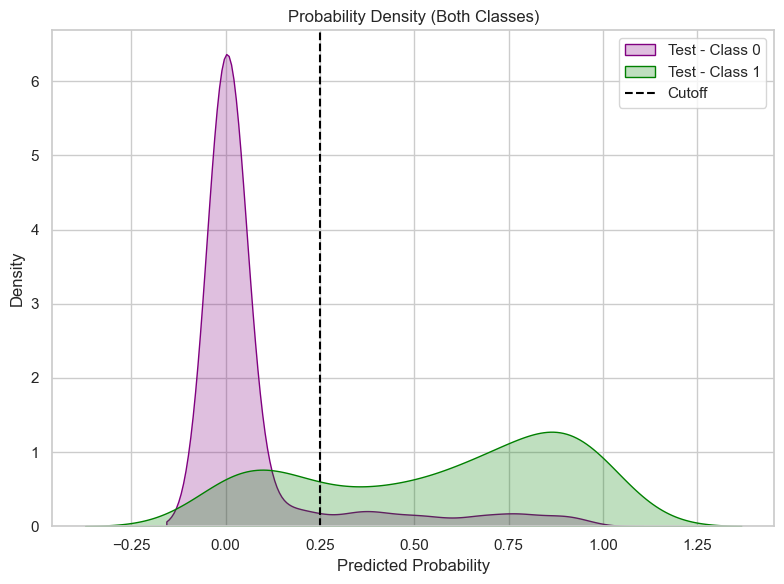

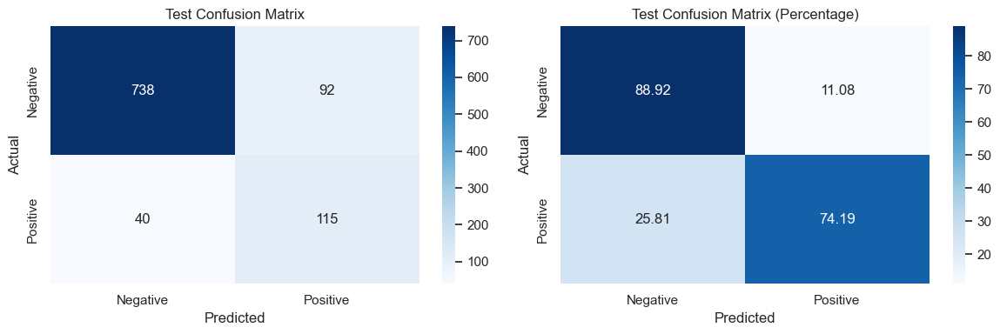

Model Evaluation Metrics:

Metrics       | Training Set | Testing Set
---------------------------------------------
Precision     | 1.0000       | 0.5556
Recall        | 1.0000       | 0.7419
Accuracy      | 1.0000       | 0.8660
F1 Score      | 1.0000       | 0.6354


In [1155]:
train_model_and_performance_eval(lgb_classifier, X_train, X_test, y_train, y_test, X, cutoff=0.25)

# SESSION REPLAY

## 3 MONTHS WINDOW

In [1156]:
def create_window_df(df):
    window_df = []
    
    data = df.groupby('SFDC Account ID')

    for group_name, group_df in data:
        group_df = group_df.sort_values(by='Consumption Date (Monthly)')
        
        for idx in range(len(group_df) - 3):
            row_data = group_df.iloc[idx:idx+4]

            # DEM Units Session Replay (monthly):
            usage_month_1, usage_month_2, usage_month_3, usage_month_4 = row_data['DEM Units - Session Replay Total (Monthly)']
            usage_mom_1_2 = round(((usage_month_2 - usage_month_1) / usage_month_1) * 100, 3) if usage_month_1 != 0 else 0
            usage_mom_1_3 = round(((usage_month_3 - usage_month_1) / usage_month_1) * 100, 3) if usage_month_1 != 0 else 0
            usage_mom_2_3 = round(((usage_month_3 - usage_month_2) / usage_month_2) * 100, 3) if usage_month_2 != 0 else 0

            ## Session Replay Apps:
            Apps_month_1, Apps_month_2, Apps_month_3, Apps_month_4 = row_data['APPS_SESSION_REPLAY']
            Apps_mom_1_2 = round(((Apps_month_2 - Apps_month_1) / Apps_month_1) * 100, 3) if Apps_month_1 != 0 else 0
            Apps_mom_1_3 = round(((Apps_month_3 - Apps_month_1) / Apps_month_1) * 100, 3) if Apps_month_1 != 0 else 0
            Apps_mom_2_3 = round(((Apps_month_3 - Apps_month_2) / Apps_month_2) * 100, 3) if Apps_month_2 != 0 else 0
    
            # Session Replay Billed Sessions:
            se_month_1, se_month_2, se_month_3, se_month_4 = row_data['SESSIONS_SESSION_REPLAY']
            se_mom_1_2 = round(((se_month_2 - se_month_1) / se_month_1) * 100, 3) if se_month_1 != 0 else 0
            se_mom_1_3 = round(((se_month_3 - se_month_1) / se_month_1) * 100, 3) if se_month_1 != 0 else 0
            se_mom_2_3 = round(((se_month_3 - se_month_2) / se_month_2) * 100, 3) if se_month_2 != 0 else 0
    
             # Competitor framework:
            frame_month_1, frame_month_2, frame_month_3, frame_month_4 = row_data['FRAMEWORK']
            frame_mom_1_2 = round(((frame_month_2 - frame_month_1) / frame_month_1) * 100, 3) if frame_month_1 != 0 else 0
            frame_mom_1_3 = round(((frame_month_3 - frame_month_1) / frame_month_1) * 100, 3) if frame_month_1 != 0 else 0
            frame_mom_2_3 = round(((frame_month_3 - frame_month_2) / frame_month_2) * 100, 3) if frame_month_2 != 0 else 0
    
            web = row_data.iloc[3]['Has Web']
            sr = row_data.iloc[3]['Has Mobile']
            sy = row_data.iloc[3]['Has SY']
            month = row_data.iloc[3]['Consumption Date (Monthly)']
            target = row_data.iloc[3]['Lost Account Has SR']
            number = row_data.iloc[3]['Date as Number']
            prev_retention = row_data.iloc[3]['Previous Retention Months Has SR']

            # Extracting encoded columns dynamically
            encoded_cols = [col for col in row_data.columns if col.startswith(tuple(categorical))]
            encoded_data = row_data[encoded_cols].values.flatten()

            window_df.append({
                'SFDC Account ID': group_name,
                'Predicting Month': month,
                'Date as Number': number,
                'Previous Retention Months' : prev_retention,

                'Usage - Month 3': usage_month_3,
                'Usage - MoM(12)': usage_mom_1_2,
                'Usage - MoM(13)': usage_mom_1_3,
                'Usage - MoM(23)': usage_mom_2_3,
                
                'SR Apps - MoM(12)': Apps_mom_1_2,
                'SR Apps - MoM(13)': Apps_mom_1_3,
                'SR Apps - MoM(23)': Apps_mom_2_3,

                'SR Sessions - MoM(12)': se_mom_1_2,
                'SR Sessions - MoM(13)': se_mom_1_3,
                'SR Sessions - MoM(23)': se_mom_2_3,

                'Framework - MoM(12)': frame_mom_1_2,
                'Framework - MoM(13)': frame_mom_1_3,
                'Framework - MoM(23)': frame_mom_2_3,

                **{col: val for col, val in zip(encoded_cols, encoded_data)},
                
                'Has Web': web,
                'Has Mobile': sr,
                'Has SY': sy,
                'Target (lost customer)': target
            })
    
    return pd.DataFrame(window_df)

sr_df = create_window_df(encoded_data_SR)
sr_df['Target (lost customer)'] = sr_df['Target (lost customer)'].astype(int)

## PYCARET

We are going to use the last month for testing the model. Hence, let us remove the last completed month (March 2024 for now), and proceed to develop the model without this month. Later we will use it for testing, and compare its accuracy. 

In [1157]:
train_val_filtered = sr_df[(sr_df['Date as Number'] != max_date) & (sr_df['Date as Number'] != (max_date -1))]

In [1158]:
cols = [i for i in train_val_filtered.columns if i not in ('Target (lost customer)', 'SFDC Account ID', 'Predicting Month')]

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(train_val_filtered[cols], train_val_filtered['Target (lost customer)'], test_size=0.2, random_state=1)

In [1159]:
print("Lenght X_train:",len(X_train))
print("Length y_train:", len(y_train))
print("Lenght X_test:",len(X_test))
print("Length y_test:", len(y_test))

Lenght X_train: 85046
Length y_train: 85046
Lenght X_test: 21262
Length y_test: 21262


### RANDOM FOREST CLASSIFIER

In [1160]:
# MODEL TRAINING

rf = RandomForestClassifier(class_weight='balanced')
rf.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced')

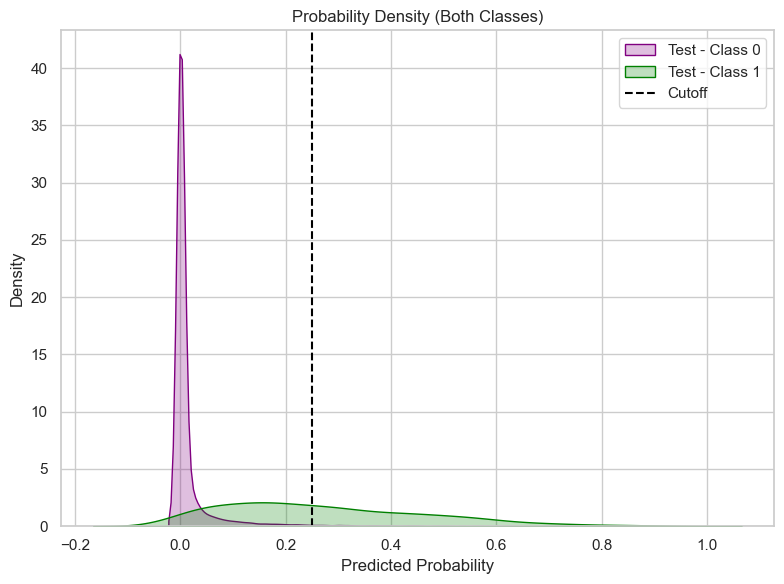

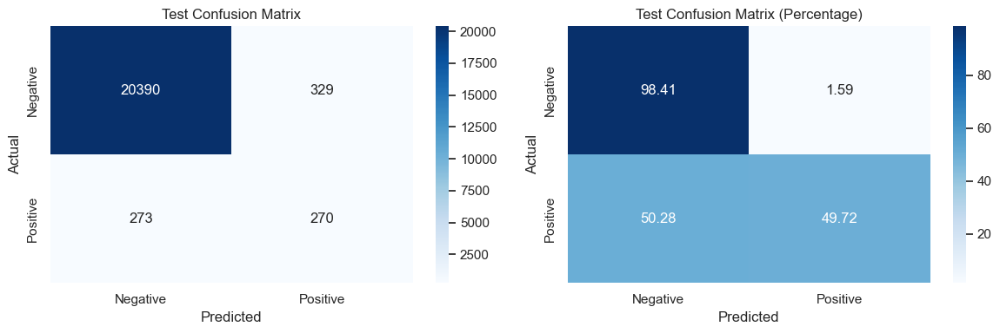

Model Evaluation Metrics:

Metrics       | Training Set | Testing Set
---------------------------------------------
Precision     | 0.9789       | 0.4508
Recall        | 1.0000       | 0.4972
Accuracy      | 0.9994       | 0.9717
F1 Score      | 0.9893       | 0.4729


In [1161]:
train_model_and_performance_eval(rf, X_train, X_test, y_train, y_test, cols, cutoff=0.25)

### EXTREME GRADIENT BOOSTING:

In [1162]:
# MODEL TRAINING
xgboost = xgb.XGBClassifier()
xgboost.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

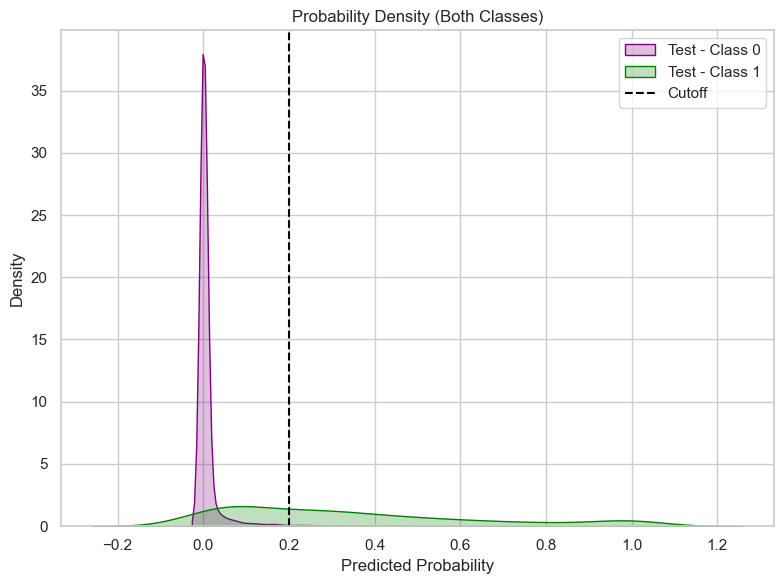

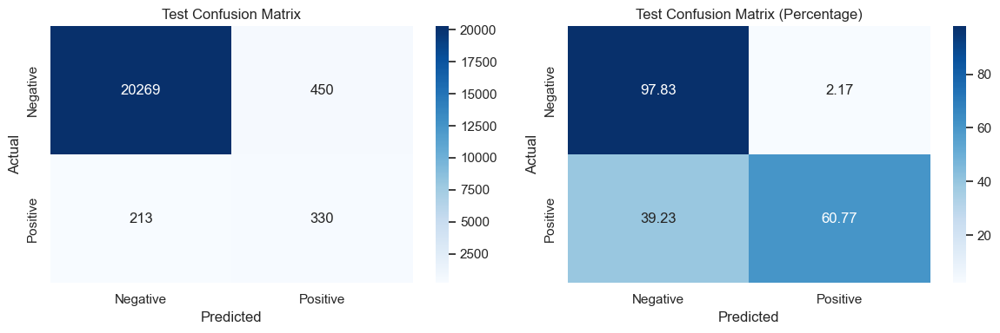

Model Evaluation Metrics:

Metrics       | Training Set | Testing Set
---------------------------------------------
Precision     | 0.6421       | 0.4231
Recall        | 0.9236       | 0.6077
Accuracy      | 0.9845       | 0.9688
F1 Score      | 0.7576       | 0.4989


In [1163]:
train_model_and_performance_eval(xgboost, X_train, X_test, y_train, y_test, cols, cutoff=0.2)

### LIGHT GBM CLASSIFIER:

In [1164]:
# MODEL TRAINING
lgbm = LGBMClassifier(class_weight='balanced')
lgbm.fit(X_train, y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2226, number of negative: 82820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025150 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3144
[LightGBM] [Info] Number of data points in the train set: 85046, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000


LGBMClassifier(class_weight='balanced')

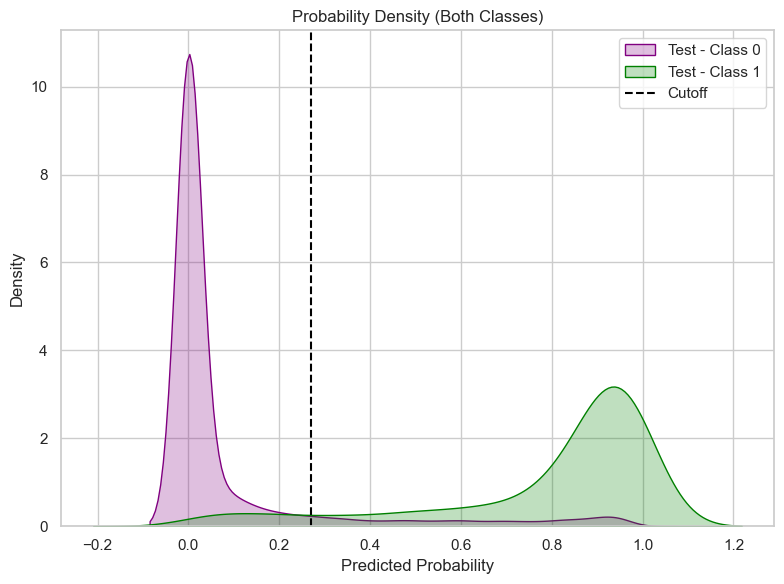

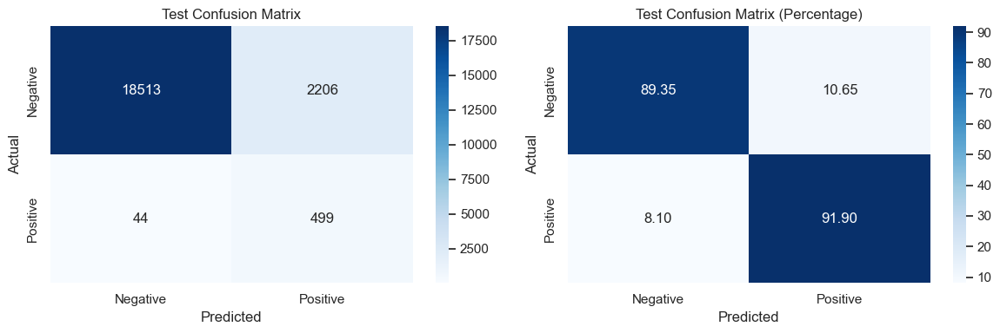

Model Evaluation Metrics:

Metrics       | Training Set | Testing Set
---------------------------------------------
Precision     | 0.2003       | 0.1845
Recall        | 1.0000       | 0.9190
Accuracy      | 0.8955       | 0.8942
F1 Score      | 0.3337       | 0.3073


In [1165]:
train_model_and_performance_eval(lgbm, X_train, X_test, y_train, y_test, cols, cutoff=0.27)

Precision --> XGBoost classifier has the highest precision on the training and testing set, with 0.9982 and 0.9610 respectively.

Recall --> LightGBM classifier has the highest recall on both the training and testing sets, with 0.9970 and 0.9882 respectively.

Accuray --> Random Forest and XGBoost classifiers has the highest accuracy, with 0.9995 and 0.9978 respectively.

F1 score --> Random Forest has the highest F1 score, with 0.9897 and 0.9523 respectively.

Based on these metrics:

> LightGBM generally performs the best among the three classifiers

## PREDICTIONS

To rigorously test the accuracy of our model, we will use the most recent complete month of data (March 24) as our test set. Applying our trained model to this dataset, we will then compare the predicted values with the actual values to assess the model's performance. By examining the performance metrics derived from this evaluation, we can gain insights into what areas we can improve and test if the model performs well.

Let us then, use March to predict what will our custoemrs do in that month:

In [1166]:
test_filtered_last = sr_df[sr_df['Date as Number'] == max_date -1][['SFDC Account ID', 'Predicting Month'] + cols]

In [1167]:
test_filtered_sr = sr_df[['SFDC Account ID', 'Predicting Month'] + cols]

In [1168]:
predictions = lgbm.predict(test_filtered_last[cols])
probabilities = lgbm.predict_proba(test_filtered_last[cols])

predictions_binary = np.where(probabilities[:, 1] >= 0.3, 1, 0)

In [1169]:
test_filtered_last['Prediction'] = predictions
test_filtered_last['Binary Prediction'] = predictions_binary
test_filtered_last['Actual Value']  = sr_df[sr_df['Date as Number'] == max_date -1]['Target (lost customer)'] 
test_filtered_last['Probability of Churn'] = np.round(probabilities[:, 1], 4)
test_filtered_last['Probability of Survival'] = np.round(probabilities[:, 0], 4)

In [1170]:
y_test_march = sr_df[sr_df['Date as Number'] == max_date -1]['Target (lost customer)'] 

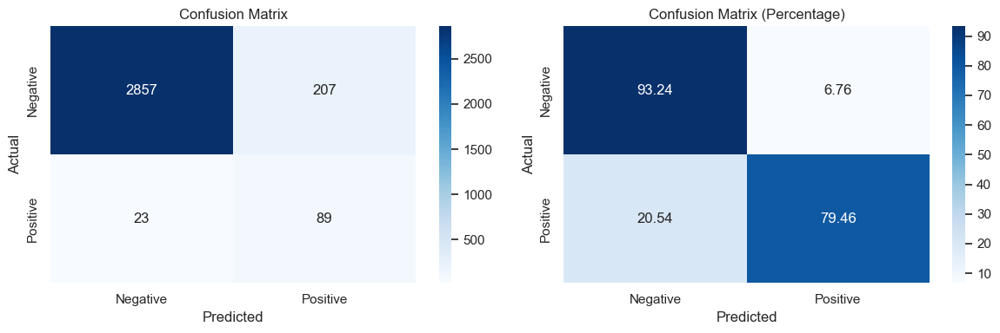

Metrics       | Testing Set
---------------------------------
Precision     | 0.3007
Recall        | 0.7946
Accuracy      | 0.9276
F1 Score      | 0.4363


In [1171]:
evaluate_metrics_test(y_test_march, predictions)

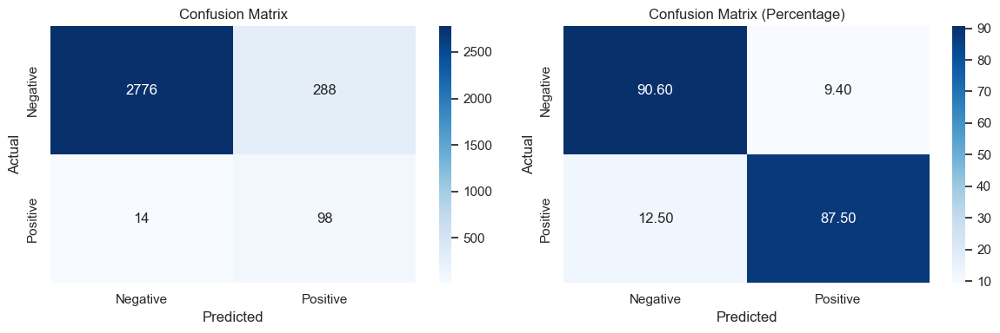

Metrics       | Testing Set
---------------------------------
Precision     | 0.2539
Recall        | 0.8750
Accuracy      | 0.9049
F1 Score      | 0.3936


In [1172]:
evaluate_metrics_test(y_test_march, predictions_binary)

In [1173]:
predictions = lgbm.predict(test_filtered_sr[cols])
probabilities = lgbm.predict_proba(test_filtered_sr[cols])

predictions_binary = np.where(probabilities[:, 1] >= 0.34, 1, 0)


test_filtered_sr['Prediction'] = predictions
test_filtered_sr['Binary Prediction'] = predictions_binary
test_filtered_sr['Actual Value']  = sr_df['Target (lost customer)'] 
test_filtered_sr['Probability of Churn'] = np.round(probabilities[:, 1], 4)
test_filtered_sr['Probability of Survival'] = np.round(probabilities[:, 0], 4)

test_filtered_sr = test_filtered_sr.sort_values(by='Probability of Churn', ascending=False)
test_filtered_sr = test_filtered_sr[['SFDC Account ID', 'Predicting Month', 'Previous Retention Months', 'Usage - Month 3', 'Usage - MoM(12)', 'Usage - MoM(13)', 'Usage - MoM(23)', 'Prediction','Binary Prediction', 'Actual Value', 'Probability of Churn','Probability of Survival', 'Has Web', 'Has Mobile', 'Has SY']]

In [1174]:
test_filtered_sr.head()

,SFDC Account ID,Predicting Month,Previous Retention Months,Usage - Month 3,Usage - MoM(12),Usage - MoM(13),Usage - MoM(23),Prediction,Binary Prediction,Actual Value,Probability of Churn,Probability of Survival,Has Web,Has Mobile,Has SY
906,00100000001g8sGAAQ,2021-12-01,1,46,-100.0,-99.829,0.0,1,1,1,0.9993,0.0007,0,0,1
932,00100000001g8sGAAQ,2024-02-01,1,14,-100.0,-99.985,0.0,1,1,1,0.9993,0.0007,0,0,1
72598,0017000000b31jTAAQ,2021-07-01,1,94425,0.0,0.000,0.0,1,1,1,0.9992,0.0008,0,0,1
34262,0010g00001kXCInAAO,2021-06-01,1,9,-100.0,-99.789,0.0,1,1,1,0.9992,0.0008,0,0,1
74116,0017000000b31pGAAQ,2022-02-01,1,5,0.0,0.000,0.0,1,1,1,0.9992,0.0008,0,0,1


In [1175]:
test_filtered_sr.to_csv('Models/SRTestFiltered.csv', index=False)

## PLOTS

In [1176]:
y_pred_proba_xgb = xgboost.predict_proba(X_test)[::,1]
y_pred_proba_lgbm = lgbm.predict_proba(X_test)[::,1]
y_pred_proba_rf = rf.predict_proba(X_test)[::,1]

ROC CURVE

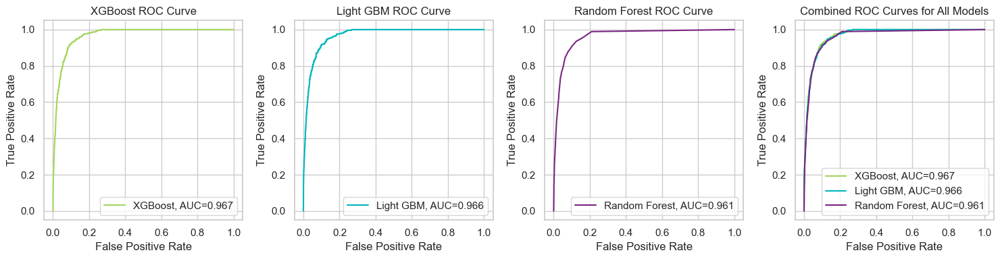

In [1177]:
fpr_dt, tpr_dt, _ = metrics.roc_curve(y_test, y_pred_proba_xgb)
auc_dt = round(metrics.roc_auc_score(y_test, y_pred_proba_xgb), 3)

fpr_lgbm, tpr_lgbm, _ = metrics.roc_curve(y_test, y_pred_proba_lgbm)
auc_lgbm = round(metrics.roc_auc_score(y_test, y_pred_proba_lgbm), 3)

fpr_rf, tpr_rf, _ = metrics.roc_curve(y_test, y_pred_proba_rf)
auc_rf = round(metrics.roc_auc_score(y_test, y_pred_proba_rf), 3)

fig, axs = plt.subplots(1, 4, figsize=(15, 4))

# Decision Tree ROC curve
axs[0].plot(fpr_dt, tpr_dt, label=f'XGBoost, AUC={auc_dt}', color='#a4d65e')  
axs[0].set_xlabel('False Positive Rate')
axs[0].set_ylabel('True Positive Rate')
axs[0].set_title('XGBoost ROC Curve')
axs[0].legend()
axs[0].grid(True)

# Light GBM ROC curve
axs[1].plot(fpr_lgbm, tpr_lgbm, label=f'Light GBM, AUC={auc_lgbm}', color='#00b7bd') 
axs[1].set_xlabel('False Positive Rate')
axs[1].set_ylabel('True Positive Rate')
axs[1].set_title('Light GBM ROC Curve')
axs[1].legend()
axs[1].grid(True)

# Random Forest ROC curve
axs[2].plot(fpr_rf, tpr_rf, label=f'Random Forest, AUC={auc_rf}', color='#7a2583') 
axs[2].set_xlabel('False Positive Rate')
axs[2].set_ylabel('True Positive Rate')
axs[2].set_title('Random Forest ROC Curve')
axs[2].legend()
axs[2].grid(True)

# Combined ROC curve for all models
axs[3].plot(fpr_dt, tpr_dt, label=f'XGBoost, AUC={auc_dt}', color='#a4d65e')  
axs[3].plot(fpr_lgbm, tpr_lgbm, label=f'Light GBM, AUC={auc_lgbm}', color='#00b7bd') 
axs[3].plot(fpr_rf, tpr_rf, label=f'Random Forest, AUC={auc_rf}', color='#7a2583') 
axs[3].set_xlabel('False Positive Rate')
axs[3].set_ylabel('True Positive Rate')
axs[3].set_title('Combined ROC Curves for All Models')
axs[3].legend()
axs[3].grid(True)

plt.tight_layout()
plt.show()

FEATURE IMPORTANCE

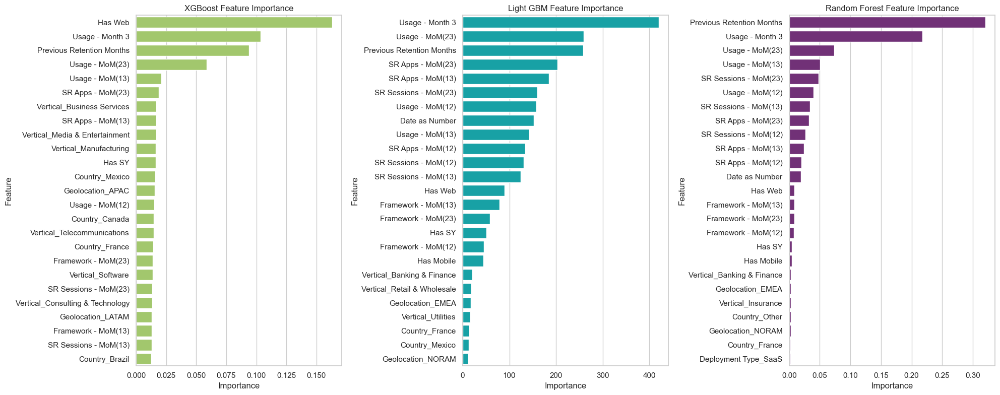

In [1178]:
feature_importances_xgboost = pd.DataFrame({'Feature': cols, 'Importance': xgboost.feature_importances_})
feature_importances_xgboost = feature_importances_xgboost.sort_values(by='Importance', ascending=False).head(25)

feature_importances_lgbm = pd.DataFrame({'Feature': cols, 'Importance': lgbm.feature_importances_})
feature_importances_lgbm = feature_importances_lgbm.sort_values(by='Importance', ascending=False).head(25)

feature_importances_rf = pd.DataFrame({'Feature': cols, 'Importance': rf.feature_importances_})
feature_importances_rf = feature_importances_rf.sort_values(by='Importance', ascending=False).head(25)


fig, axs = plt.subplots(1, 3, figsize=(20, 8))

# Plot for Decision Tree
sns.barplot(data=feature_importances_xgboost, x='Importance', y='Feature', color='#a4d65e', ax=axs[0])
axs[0].set_title('XGBoost Feature Importance')
axs[0].set_xlabel('Importance')
axs[0].set_ylabel('Feature')

# Plot for Light GBM
sns.barplot(data=feature_importances_lgbm, x='Importance', y='Feature', color='#00b7bd', ax=axs[1])
axs[1].set_title('Light GBM Feature Importance')
axs[1].set_xlabel('Importance')
axs[1].set_ylabel('Feature')

# Plot for Random Forest
sns.barplot(data=feature_importances_rf, x='Importance', y='Feature', color='#7a2583', ax=axs[2])
axs[2].set_title('Random Forest Feature Importance')
axs[2].set_xlabel('Importance')
axs[2].set_ylabel('Feature')

plt.tight_layout()
plt.show()

PRECISSION-RECALL CURVE

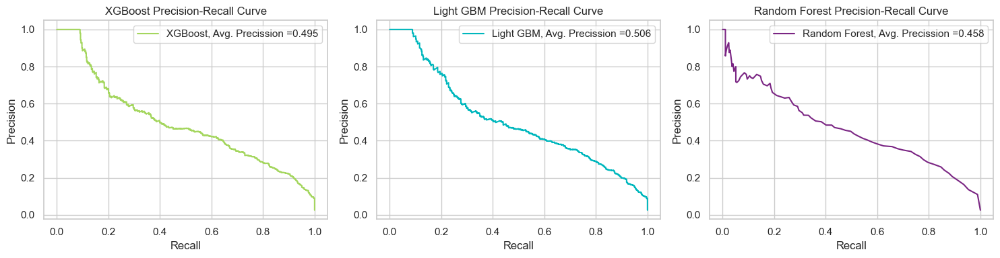

In [1179]:
precision_dt, recall_dt, _ = precision_recall_curve(y_test, y_pred_proba_xgb)
average_precision_dt = round(average_precision_score(y_test, y_pred_proba_xgb),3)

precision_lgbm, recall_lgbm, _ = precision_recall_curve(y_test, y_pred_proba_lgbm)
average_precision_lgbm = round(average_precision_score(y_test, y_pred_proba_lgbm),3)

precision_rf, recall_rf, _ = precision_recall_curve(y_test, y_pred_proba_rf)
average_precision_rf = round(average_precision_score(y_test, y_pred_proba_rf),3)

fig, axs = plt.subplots(1, 3, figsize=(15, 4))

# Decision Tree Precision-Recall curve
axs[0].plot(recall_dt, precision_dt, label=f'XGBoost, Avg. Precission ={average_precision_dt}', color='#a4d65e')  
axs[0].set_xlabel('Recall')
axs[0].set_ylabel('Precision')
axs[0].set_title('XGBoost Precision-Recall Curve')
axs[0].legend()
axs[0].grid(True)

# Light GBM Precision-Recall curve
axs[1].plot(recall_lgbm, precision_lgbm, label=f'Light GBM, Avg. Precission ={average_precision_lgbm}', color='#00b7bd') 
axs[1].set_xlabel('Recall')
axs[1].set_ylabel('Precision')
axs[1].set_title('Light GBM Precision-Recall Curve')
axs[1].legend()
axs[1].grid(True)

# Random Forest Precision-Recall curve
axs[2].plot(recall_rf, precision_rf, label=f'Random Forest, Avg. Precission ={average_precision_rf}', color='#7a2583') 
axs[2].set_xlabel('Recall')
axs[2].set_ylabel('Precision')
axs[2].set_title('Random Forest Precision-Recall Curve')
axs[2].legend()
axs[2].grid(True)

plt.tight_layout()
plt.show()

## EXPLAINABILITY FOR LGBM

In [1180]:
import shap
shap.initjs()

In [1181]:
explainer = shap.Explainer(lgbm)
shap_values = explainer(X_test)

In [1182]:
print("Shape of shap_values:", shap_values.shape)
print("Shape of X_test:", X_test.shape)

Shape of shap_values: (21262, 50)
Shape of X_test: (21262, 50)


Let us see which variables have an impact on our model's performance:

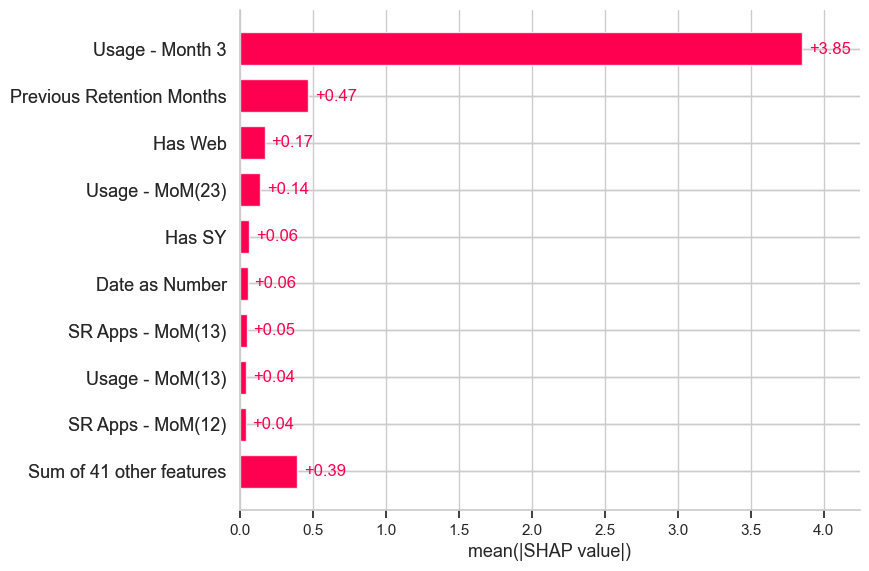

In [1183]:
shap.plots.bar(shap_values)

As we can see *Retention Months* is the variable with highest impact in our model, significantly surpassing other variables. It is then followed by *Usage - MoM (2,3)*, representing the Month-over-Month change between Month 2 and Month 3. This is logical since Usage - MoM (2,3) reflects the usage pattern immediately preceding the determination of account status.

Let us plot a summary plot of the overall model:

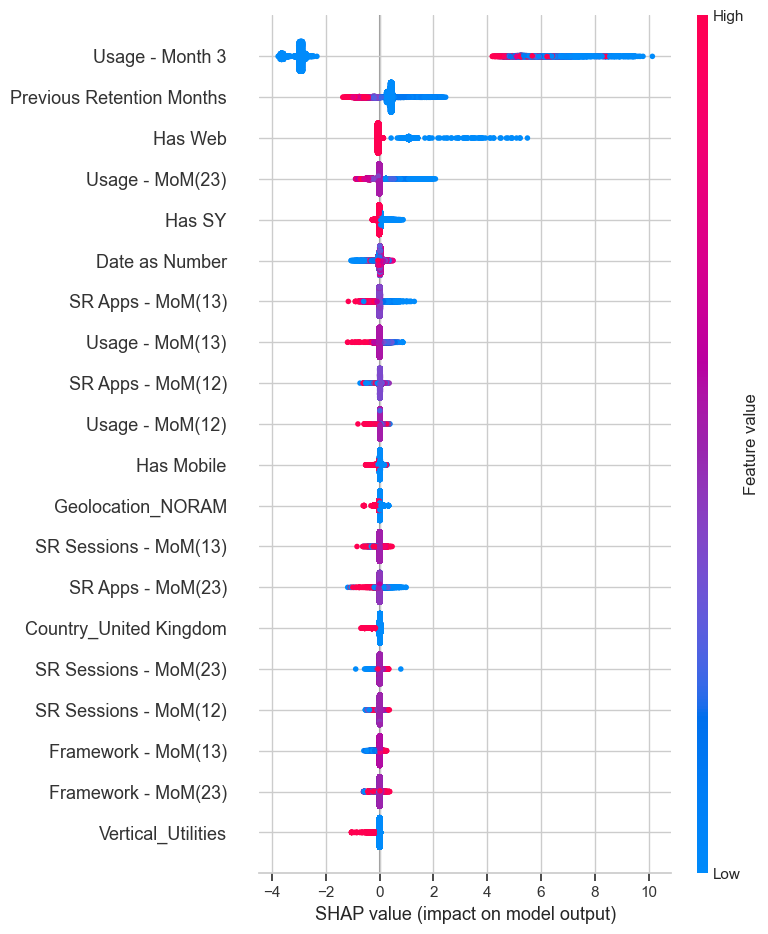

In [1184]:
shap.summary_plot(shap_values, X_test)

Each point on the chart is one SHAP value for a prediction and feature. 

**Red** color means **higher** value of a feature. 

**Blue** means **lower** value of a feature. We can get the general sense of features’ directionality impact based on the distribution of the red and blue dots.

In the chart above, we can conclude the following insights:
- Higher value of *Retention Months* leads to lower probability of churn. On the other hand, a lower value of Retention Months is linked to a higher likelihood of churn, indicating challenges in retaining customers with shorter retention periods. This observation suggests that Dynatrace may face difficulties retaining customers with initial exposure to the product, but performs well in retaining longer-standing customers once they have become familiar and engaged.


Let us perform a deeper analysis by examining the impact separately for Churn and Non-Churn accounts

**Account that did not churn:**

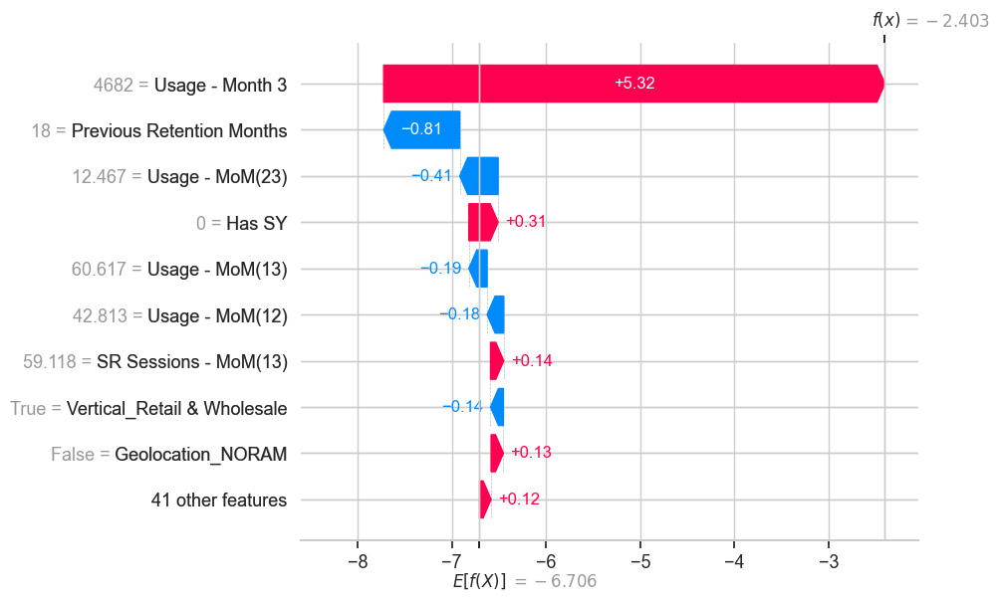

In [1185]:
shap.plots.waterfall(shap_values[0])

**Churned Account:**

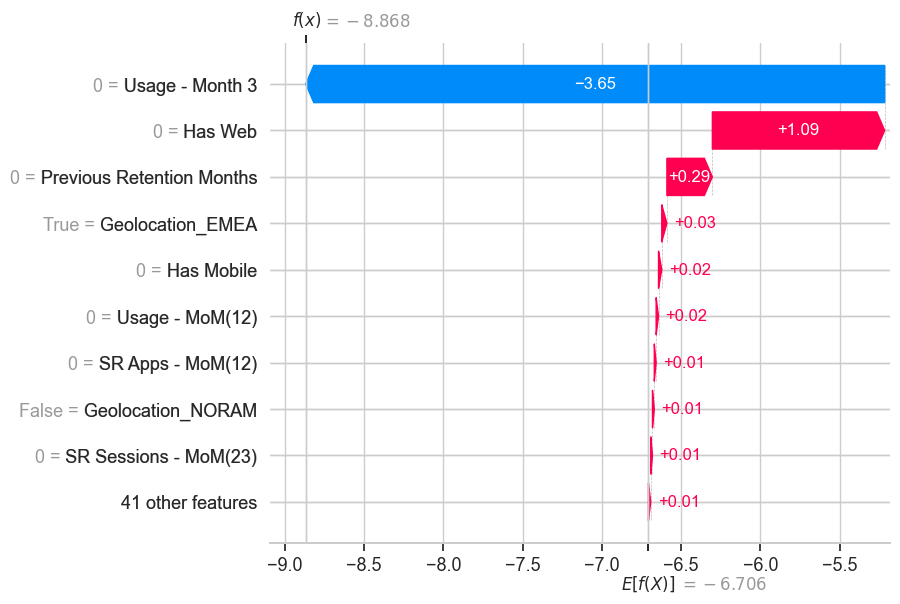

In [1186]:
shap.plots.waterfall(shap_values[1])

## SURVIVAL ANALYSIS

- Time-to-event data: we are going to use the consecutive retention months before a customer churns.

- Event indicator: A binary column indicating whether the churn event has occurred (1) or not (0) for each customer.

In [1187]:
df_SR.fillna(0, inplace=True)
df_SR.replace([np.inf, -np.inf], 0, inplace=True)
df_SR = df_SR[df_SR['Date as Number'] != max_date]

### **KALPLAN-MEIER SURVIVAL CUVE**

The Kaplan-Meier survival curve shows the estimated probability of customers not churning over time (in terms of retention months).

In [1188]:
dff_ID = df_SR.groupby('SFDC Account ID')

agg_retention_months = dff_ID['Previous Retention Months Has SR'].last()
date = dff_ID['Consumption Date (Monthly)'].last()
churn_status = dff_ID['Lost Account Has SR'].any()
vertical = dff_ID['Vertical'].last()
deployment = dff_ID['Deployment Type'].last()
arr = dff_ID['ARR Band'].last()
geolocation = dff_ID['Geolocation'].last()
country = dff_ID['Country'].last()
rum = dff_ID['UEM_ENABLED'].last()
se = dff_ID['SESSION_REPLAY_ENABLED'].last()
usage = dff_ID['DEM Units - Session Replay Total (Monthly)'].mean()
prev_usage = dff_ID['DEM Units - Session Replay Total (Monthly - Previous Month)'].mean()
apps = dff_ID['APPS_MOBILE'].mean() + dff_ID['WEB_APPS'].mean()
has_mob = dff_ID['Has Web'].last()
has_sr = dff_ID['Has Mobile'].last()
has_sy = dff_ID['Has SY'].last()



kaplain_df = pd.DataFrame({
    'SFDC Account ID': agg_retention_months.index,
    'Previous Retention Months Has SR': agg_retention_months.values,
    'Date': date.values,
    'Lost Account SR': churn_status.values,
    'Vertical': vertical.values,
    'Deployment Type': deployment.values,
    'ARR Band': arr.values,
    'Geolocation': geolocation.values,
    'Country': country.values,
    'Avg Usage': usage.values,
    'Avg Prev Usage': prev_usage.values,
    'Avg Apps': apps.values,
    'RUM Enabled': rum.values,
    'SR Enabled': se.values,
    'Has Web': has_mob.values,
    'Has Mobile': has_sr.values,
    'Has SY': has_sy.values

})

SR_embeding = kaplain_df.copy()


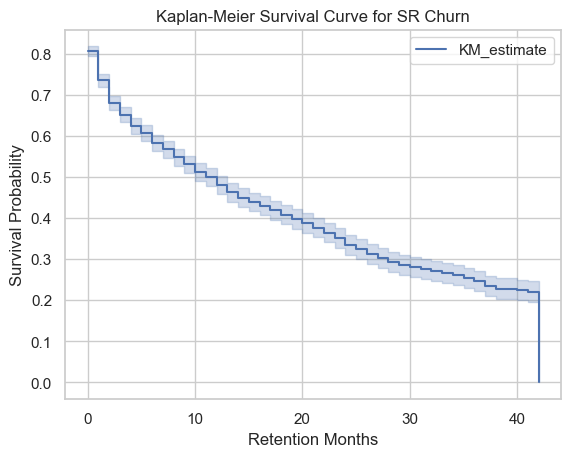

In [1189]:
durations = kaplain_df['Previous Retention Months Has SR']
event_observed = kaplain_df['Lost Account SR']

kmf = KaplanMeierFitter()

kmf.fit(durations, event_observed)

kmf.plot()
plt.title('Kaplan-Meier Survival Curve for SR Churn')
plt.xlabel('Retention Months')
plt.ylabel('Survival Probability')
plt.show()

Let us compute a confidence interval

In [1190]:
ci = kmf.confidence_interval_survival_function_
ci.head()

,KM_estimate_lower_0.95,KM_estimate_upper_0.95
0.0,0.795436,0.817506
1.0,0.719094,0.749827
2.0,0.662298,0.697471
3.0,0.632600,0.669658
4.0,0.605152,0.643765


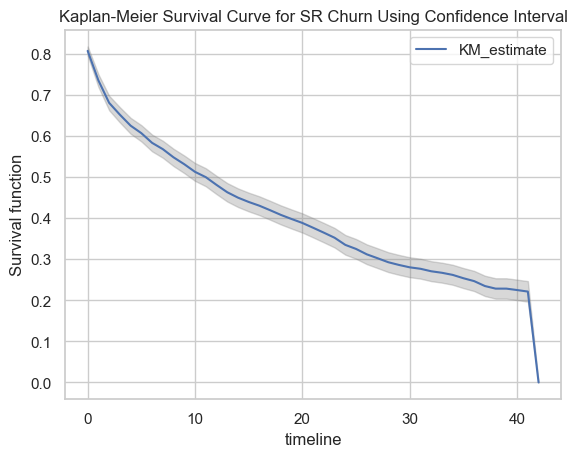

In [1191]:
ts = ci.index
low, high = np.transpose(ci.values)

plt.fill_between(ts, low, high, color='gray', alpha=0.3)
kmf.survival_function_.plot(ax=plt.gca(), label='Deployment Type_SaaS')  # Adding label for SaaS
plt.title('Kaplan-Meier Survival Curve for SR Churn Using Confidence Interval')
plt.ylabel('Survival function')
plt.legend()


Let us now add additional attributes that will help us predict.

In [1192]:
kaplain_df.head()

,SFDC Account ID,Previous Retention Months Has SR,Date,Lost Account SR,Vertical,Deployment Type,ARR Band,Geolocation,Country,Avg Usage,Avg Prev Usage,Avg Apps,RUM Enabled,SR Enabled,Has Web,Has Mobile,Has SY
0,00100000001VLvGAAW,0,2024-05-01,True,Consulting & Technology,SaaS,50-100k,NORAM,United States,11.309524,11.309524,4084.095238,True,False,1,0,0
1,00100000001VLvZAAW,0,2024-05-01,True,Business Services,SaaS,250-500k,NORAM,United States,0.066667,0.066667,822.866667,True,False,1,0,1
2,00100000001VSZLAA4,23,2024-05-01,True,Manufacturing,Managed,100-250k,NORAM,United States,20461.787879,20260.909091,650.272727,True,False,1,0,0
3,00100000001XytIAAS,0,2024-05-01,False,Insurance,Managed,500-1M,NORAM,United States,0.000000,0.000000,51927.333333,True,False,1,0,1
4,00100000001Y6vqAAC,0,2024-05-01,False,Banking & Finance,SaaS,250-500k,NORAM,United States,0.000000,0.000000,17.095238,True,True,0,0,1


### **TRAINING MODELS USING SURVIVAL ANALYSIS:**

In [1193]:
columns_to_encode = ['Deployment Type', 'Vertical', 'Country', 'Geolocation', 'ARR Band', 'RUM Enabled', 'SR Enabled']

label_encoder = LabelEncoder()


for column in columns_to_encode:
    kaplain_df[column] = label_encoder.fit_transform(kaplain_df[column].astype(str))

    original_values = label_encoder.classes_
    encoded_values = label_encoder.transform(original_values)
    

    print(f"\nConversions for {column}:")
    for original, encoded in zip(original_values, encoded_values):
        print(f"{original} = {encoded}")


Conversions for Deployment Type:
Managed = 0
SaaS = 1

Conversions for Vertical:
Banking & Finance = 0
Business Services = 1
Consulting & Technology = 2
Consumer Goods & Services = 3
Government = 4
Healthcare = 5
Insurance = 6
Logistics & Transportation = 7
Manufacturing = 8
Media & Entertainment = 9
Other = 10
Retail & Wholesale = 11
Software = 12
Telecommunications = 13
Utilities = 14

Conversions for Country:
Australia = 0
Brazil = 1
Canada = 2
France = 3
Germany = 4
Italy = 5
Mexico = 6
Other = 7
Spain = 8
United Kingdom = 9
United States = 10

Conversions for Geolocation:
0 = 0
APAC = 1
EMEA = 2
LATAM = 3
NORAM = 4

Conversions for ARR Band:
0-10k = 0
1.5-2M = 1
10-20k = 2
100-250k = 3
1M-1.5M = 4
20-50k = 5
250-500k = 6
2M-3M = 7
3-5M = 8
50-100k = 9
500-1M = 10
>5M = 11

Conversions for RUM Enabled:
0 = 0
False = 1
True = 2

Conversions for SR Enabled:
0 = 0
False = 1
True = 2


In [1194]:
cols = [i for i in kaplain_df.columns if i not in ('Lost Account SR', 'SFDC Account ID', ' Previous Retention Months Has SR', 'Date')]

X_train, X_test, y_train, y_test = train_test_split(kaplain_df[cols], kaplain_df[['Lost Account SR', 'Previous Retention Months Has SR']], test_size=0.2, random_state=1)

In [1195]:
print("Lenght X_train:",len(X_train))
print("Length y_train:", len(y_train))
print("Lenght X_test:",len(X_test))
print("Length y_test:", len(y_test))

Lenght X_train: 3936
Length y_train: 3936
Lenght X_test: 985
Length y_test: 985


In [1196]:
event_indicator = (y_train['Lost Account SR']).astype(bool)  
survival_times = y_train['Previous Retention Months Has SR'].astype(int)  

event_field_name = 'event_indicator'  
time_field_name = 'survival_months'  

# Strucured array
y_structured = np.array(list(zip(event_indicator, survival_times)), 
                        dtype=[(event_field_name, bool), (time_field_name, float)])


#### RANDOM SURVIVAL FOREST:

In [1197]:
rsf = RandomSurvivalForest(
    n_estimators=1000, min_samples_split=10, min_samples_leaf=15, n_jobs=-1, random_state=20
)
rsf.fit(X_train, y_structured)

RandomSurvivalForest(min_samples_leaf=15, min_samples_split=10,
                     n_estimators=1000, n_jobs=-1, random_state=20)

We can check how well the model performs by evaluating it on the test data:

In [1198]:
event_indicator_test = (y_test['Lost Account SR']).astype(bool)  
survival_times_test = y_test['Previous Retention Months Has SR'].astype(int)  

event_field_name = 'event_indicator'  
time_field_name = 'survival_months'  

y_structured_test= np.array(list(zip(event_indicator_test, survival_times_test)), 
                        dtype=[(event_field_name, bool), (time_field_name, float)])

In [1199]:
print('Score:', rsf.score(X_test, y_structured_test))

Score: 0.9214957846070166


Let us now select some customers of Abril 24, and apply a survival analysis on them:

In [1200]:
data_abril = df_W[df_W['Consumption Date (Monthly)'] == '2024-04-01']

abril_sfdc_ids = data_abril['SFDC Account ID'].unique()

filtered_kaplain_df = kaplain_df[kaplain_df['SFDC Account ID'].isin(abril_sfdc_ids)]

X_testing = filtered_kaplain_df[cols]

In [1201]:
surv_rf = rsf.predict_survival_function(X_testing, return_array=True)

#### GRADIENT BOOSTING SURVIVAL:

In [1202]:
gboosts = GradientBoostingSurvivalAnalysis()
gboosts.fit(X_train, y_structured)

GradientBoostingSurvivalAnalysis()

In [1203]:
print('Score:', gboosts.score(X_test, y_structured_test))

Score: 0.9955833559967364


In [1204]:
surv_gboost = gboosts.predict_survival_function(X_testing, return_array=True)

#### SURVIVAL TREE:

In [1205]:
st = SurvivalTree()
st.fit(X_train, y_structured)

SurvivalTree()

In [1206]:
print('Score:', st.score(X_test, y_structured_test))

Score: 0.9527304868098994


In [1207]:
surv_st = st.predict_survival_function(X_testing, return_array=True)

### PLOTS OF SURVIVAL CURVE 

In [1208]:
sfdc_account_ids = filtered_kaplain_df['SFDC Account ID']
sfdc_account_ids_to_plot = '00100000001VSZLAA4'

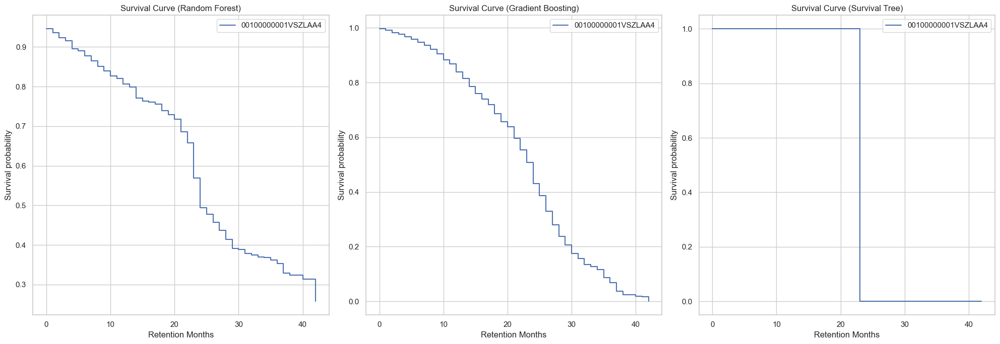

In [1209]:
unique_times_rsf = rsf.unique_times_
unique_times_gb = gboosts.unique_times_
unique_times_st = st.unique_times_

fig, axes = plt.subplots(1, 3, figsize=(20, 7))  

# Random Forest
ax1 = axes[0]  
ax1.set_title('Survival Curve (Random Forest)')
ax1.set_ylabel("Survival probability")
ax1.set_xlabel("Retention Months")

for sfdc_account_id, s in zip(sfdc_account_ids, surv_rf):
    if sfdc_account_id in sfdc_account_ids_to_plot:
        ax1.step(unique_times_rsf, s, where="post", label=f"{sfdc_account_id}")

ax1.legend()
ax1.grid(True)

# Gradient Boosting
ax2 = axes[1] 
ax2.set_title('Survival Curve (Gradient Boosting)')
ax2.set_ylabel("Survival probability")
ax2.set_xlabel("Retention Months")

for sfdc_account_id, s in zip(sfdc_account_ids, surv_gboost):
    if sfdc_account_id in sfdc_account_ids_to_plot:
        ax2.step(unique_times_gb, s, where="post", label=f"{sfdc_account_id}")

ax2.legend()
ax2.grid(True)

# Survival Tree
ax3 = axes[2] 
ax3.set_title('Survival Curve (Survival Tree)')
ax3.set_ylabel("Survival probability")
ax3.set_xlabel("Retention Months")

for sfdc_account_id, s in zip(sfdc_account_ids, surv_st):
    if sfdc_account_id in sfdc_account_ids_to_plot:
        ax3.step(unique_times_st, s, where="post", label=f"{sfdc_account_id}")

ax3.legend()
ax3.grid(True)

# Displaying the plot
plt.tight_layout()
plt.show()


#### Survival Table:

Let's create a table with the survival probability for each model.

RANDOM FOREST SURVIVAL:

In [1210]:
survival_table_rf = pd.DataFrame(index=rsf.unique_times_, columns=sfdc_account_ids)

for i, (sfdc_account_id, s) in enumerate(zip(sfdc_account_ids, surv_rf)):
    survival_table_rf[sfdc_account_id] = s


survival_table_transposed_rf = survival_table_rf.T.reset_index()
survival_table_transposed_rf.rename(columns={'index': 'SFDC Account ID'}, inplace=True)

In [1211]:
survival_table_transposed_rf.head()

,SFDC Account ID,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,...,33.0,34.0,35.0,36.0,37.0,38.0,39.0,40.0,41.0,42.0
0,00100000001VLvGAAW,0.091815,0.058032,0.040405,0.034095,0.027406,0.022458,0.019356,0.018169,0.017674,...,0.012102,0.012102,0.012102,0.011826,0.011743,0.011743,0.011743,0.011720,0.011720,0.011720
1,00100000001VLvZAAW,0.108561,0.060481,0.048228,0.045437,0.042446,0.040247,0.039410,0.038905,0.038562,...,0.035643,0.035643,0.035643,0.035643,0.035402,0.035402,0.035402,0.035402,0.035402,0.035402
2,00100000001VSZLAA4,0.945731,0.936240,0.922858,0.915273,0.895670,0.890437,0.877152,0.864767,0.851204,...,0.369311,0.368667,0.361476,0.353148,0.328427,0.324082,0.324082,0.314148,0.313105,0.257593
3,00100000001XytIAAS,0.984380,0.743832,0.742448,0.741357,0.739935,0.739808,0.739808,0.739509,0.739160,...,0.738221,0.738221,0.738132,0.738132,0.738043,0.738043,0.738043,0.738043,0.738043,0.738043
4,00100000001Y6vqAAC,0.983277,0.741709,0.719686,0.715133,0.714629,0.705110,0.704010,0.704010,0.704010,...,0.694446,0.694446,0.694446,0.694446,0.694446,0.694446,0.694446,0.694446,0.694446,0.694446


In [1212]:
survival_long_format_sr = pd.melt(
    survival_table_transposed_rf,
    id_vars=['SFDC Account ID'],
    var_name='Session Replay - Retention Months',
    value_name='Session Replay- Probability of Survival'
)
survival_long_format_sr.head()

survival_long_format_sr.to_csv('Survival/SRSurvivalTable.csv', index=False)

GRADIENT BOOSING SURVIVAL:

In [1213]:
survival_table_gb = pd.DataFrame(index=gboosts.unique_times_, columns=sfdc_account_ids)

for i, (sfdc_account_id, s) in enumerate(zip(sfdc_account_ids, surv_gboost)):
    survival_table_gb[sfdc_account_id] = s


survival_table_transposed_gb = survival_table_gb.T.reset_index()
survival_table_transposed_gb.rename(columns={'index': 'SFDC Account ID'}, inplace=True)

In [1214]:
survival_table_transposed_gb.head()

,SFDC Account ID,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,...,33.0,34.0,35.0,36.0,37.0,38.0,39.0,40.0,41.0,42.0
0,00100000001VLvGAAW,0.429265,0.129246,0.022286,0.004871,0.000555,0.000086,0.000005,4.647696e-07,1.102462e-08,...,3.842336e-199,1.676281e-208,1.438411e-235,5.060303e-260,2.991266e-318,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
1,00100000001VLvZAAW,0.429265,0.129246,0.022286,0.004871,0.000555,0.000086,0.000005,4.647696e-07,1.102462e-08,...,3.842336e-199,1.676281e-208,1.438411e-235,5.060303e-260,2.991266e-318,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
2,00100000001VSZLAA4,0.996199,0.990829,0.983018,0.976310,0.966810,0.958725,0.946908,9.364493e-01,9.208049e-01,...,1.278077e-01,1.159868e-01,8.760549e-02,6.798591e-02,3.717261e-02,2.470938e-02,2.470938e-02,1.900258e-02,1.638912e-02,3.550345e-09
3,00100000001XytIAAS,0.981125,0.954943,0.917859,0.886944,0.844589,0.809830,0.761101,7.199533e-01,6.617457e-01,...,3.381577e-05,2.080681e-05,5.108798e-06,1.436498e-06,7.002455e-08,9.072284e-09,9.072284e-09,2.437826e-09,1.162665e-09,5.208248e-43
4,00100000001Y6vqAAC,0.981125,0.954943,0.917859,0.886944,0.844589,0.809830,0.761101,7.199533e-01,6.617457e-01,...,3.381577e-05,2.080681e-05,5.108798e-06,1.436498e-06,7.002455e-08,9.072284e-09,9.072284e-09,2.437826e-09,1.162665e-09,5.208248e-43


In [1215]:
test_filtered_last.head()

,SFDC Account ID,Predicting Month,Date as Number,Previous Retention Months,Usage - Month 3,Usage - MoM(12),Usage - MoM(13),Usage - MoM(23),SR Apps - MoM(12),SR Apps - MoM(13),...,Vertical_Telecommunications,Vertical_Utilities,Has Web,Has Mobile,Has SY,Prediction,Binary Prediction,Actual Value,Probability of Churn,Probability of Survival
38,00100000001VLvGAAW,2024-05-01,42,0,0,0.00,0.000,0.000,0.000,400.000,...,False,False,1,0,0,0,0,0,0.0001,0.9999
66,00100000001VLvZAAW,2024-05-01,42,0,0,0.00,0.000,0.000,0.000,0.000,...,False,False,1,0,1,0,0,0,0.0001,0.9999
97,00100000001VSZLAA4,2024-05-01,42,23,10775,23.41,-10.425,-27.417,6.897,3.448,...,False,False,1,0,0,0,1,0,0.4533,0.5467
137,00100000001XytIAAS,2024-05-01,42,0,0,0.00,0.000,0.000,0.000,0.000,...,False,False,1,0,1,0,0,0,0.0001,0.9999
177,00100000001Y6vqAAC,2024-05-01,42,0,0,0.00,0.000,0.000,0.000,0.000,...,False,False,0,0,1,0,0,0,0.0001,0.9999


In [1216]:
survival_df = pd.DataFrame(columns=['SFDC Account ID', 'Predicting Month', 'Previous Retention Months', 'Prediction', 'Actual Value', 'Probability of Churn', 'Probability of Survival','Survival Probability RF', 'Survival Probability GB'])

for index, row in test_filtered_last.iterrows():
    sfdc_account_id = row['SFDC Account ID']
    month = row['Predicting Month']
    prev_retention_months = row['Previous Retention Months']
    predicted_value = row['Prediction']
    actual_value = row['Actual Value']
    churn_prob = row['Probability of Churn']
    surv_prob = row['Probability of Survival']
    
    if sfdc_account_id in survival_table_transposed_rf['SFDC Account ID'].values:
        survival_row_rf = survival_table_transposed_rf[survival_table_transposed_rf['SFDC Account ID'] == sfdc_account_id]
        try:
            survival_prob_rf = survival_row_rf.at[survival_row_rf.index[0], prev_retention_months]
        except KeyError:
            survival_prob_rf = 0

    if sfdc_account_id in survival_table_transposed_gb['SFDC Account ID'].values:
        survival_row_gb = survival_table_transposed_gb[survival_table_transposed_gb['SFDC Account ID'] == sfdc_account_id]
        try:
            survival_prob_gb = survival_row_gb.at[survival_row_gb.index[0], prev_retention_months]
        except KeyError:
            survival_prob_gb = 0

            

    survival_df = survival_df._append({'SFDC Account ID': sfdc_account_id,
                            'Predicting Month': month,
                            'Previous Retention Months': prev_retention_months,
                            'Actual Value': actual_value,
                            'Prediction': predicted_value,
                            'Probability of Churn': churn_prob,
                            'Probability of Survival': surv_prob,
                            'Survival Probability RF': survival_prob_rf,
                            'Survival Probability GB': survival_prob_gb}, ignore_index=True)

C:\Users\martina.tarres\AppData\Local\Temp\ipykernel_25572\576253458.py:28: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  survival_df = survival_df._append({'SFDC Account ID': sfdc_account_id,


CHANGE TRESHOLD TO FIND BEST PARAMETER

In [1217]:
survival_df['Probability of Churn RF'] = 1 - survival_df['Survival Probability RF']
survival_df['Probability of Churn GB'] = 1 - survival_df['Survival Probability GB']
survival_df.head()

,SFDC Account ID,Predicting Month,Previous Retention Months,Prediction,Actual Value,Probability of Churn,Probability of Survival,Survival Probability RF,Survival Probability GB,Probability of Churn RF,Probability of Churn GB
0,00100000001VLvGAAW,2024-05-01,0,0,0,0.0001,0.9999,0.091815,0.429265,0.908185,0.570735
1,00100000001VLvZAAW,2024-05-01,0,0,0,0.0001,0.9999,0.108561,0.429265,0.891439,0.570735
2,00100000001VSZLAA4,2024-05-01,23,0,0,0.4533,0.5467,0.569106,0.508270,0.430894,0.491730
3,00100000001XytIAAS,2024-05-01,0,0,0,0.0001,0.9999,0.984380,0.981125,0.015620,0.018875
4,00100000001Y6vqAAC,2024-05-01,0,0,0,0.0001,0.9999,0.983277,0.981125,0.016723,0.018875


#### RANDOM FOREST:

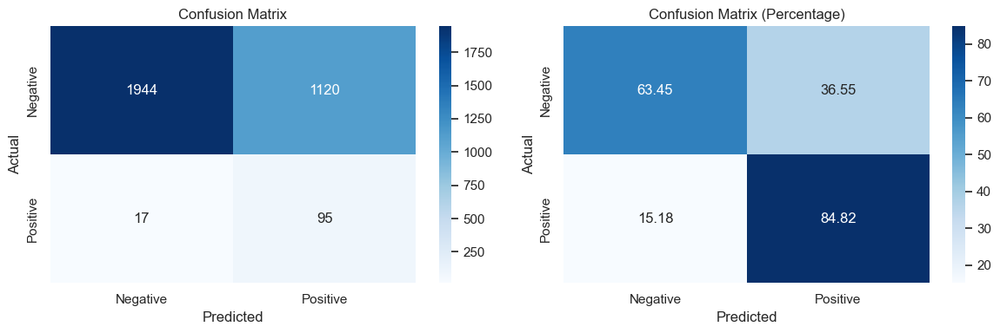

Metrics       | Testing Set
---------------------------------
Precision     | 0.0782
Recall        | 0.8482
Accuracy      | 0.6420
F1 Score      | 0.1432


In [1218]:
threshold_rf = 0.45

survival_df['Prediction RF'] = np.where(survival_df['Probability of Churn RF'] >= threshold_rf, 1, 0)

true_labels = survival_df['Actual Value'].astype(int)
predicted_labels_rf = survival_df['Prediction RF'].astype(int)

evaluate_metrics_test(true_labels, predicted_labels_rf)


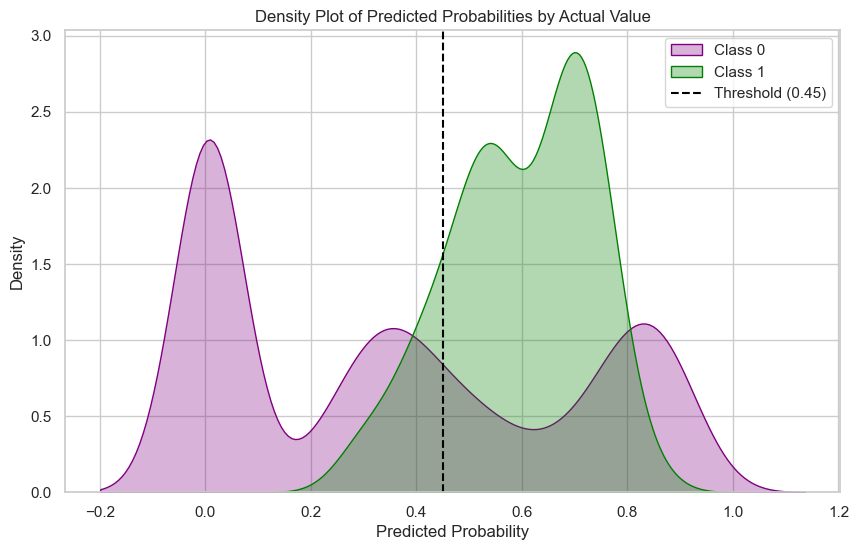

In [1219]:
sns.set(style="whitegrid")
colors = ['purple', 'green']
plt.figure(figsize=(10, 6))

for class_value, color in zip([0, 1], colors):
    sns.kdeplot( data=survival_df[survival_df["Actual Value"] == class_value], x="Probability of Churn RF", fill=True, common_norm=False, alpha=0.3, linewidth=1, color=color, label=f'Class {class_value}')

plt.axvline(x=threshold_rf, linestyle='--', color='black', label=f'Threshold ({threshold_rf})')

plt.title("Density Plot of Predicted Probabilities by Actual Value")
plt.xlabel("Predicted Probability")
plt.ylabel("Density")
plt.legend()

plt.show()

#### GRADIENT BOOSTING:

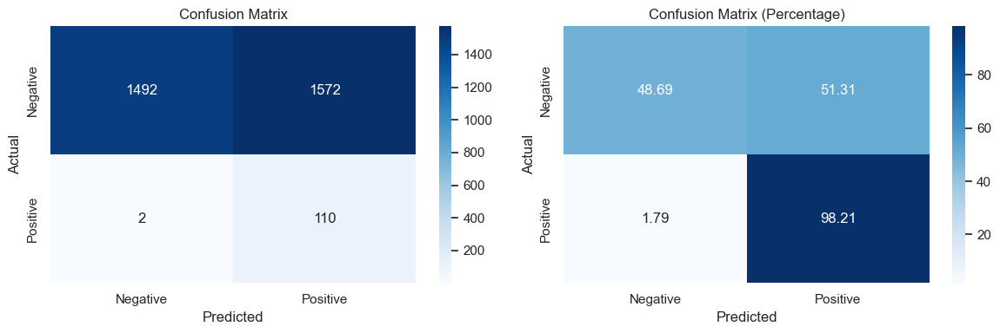

Metrics       | Testing Set
---------------------------------
Precision     | 0.0654
Recall        | 0.9821
Accuracy      | 0.5044
F1 Score      | 0.1226


In [1220]:
threshold_gb = 0.38

survival_df['Prediction GB'] = np.where(survival_df['Probability of Churn GB'] >= threshold_gb, 1, 0)

predicted_labels_gb = survival_df['Prediction GB'].astype(int)

evaluate_metrics_test(true_labels, predicted_labels_gb)

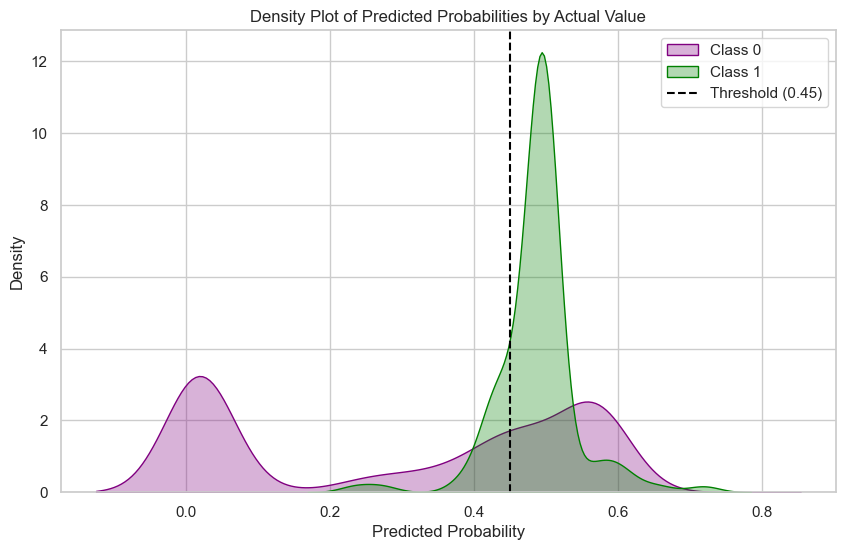

In [1221]:
sns.set(style="whitegrid")
colors = ['purple', 'green']
plt.figure(figsize=(10, 6))

for class_value, color in zip([0, 1], colors):
    sns.kdeplot( data=survival_df[survival_df["Actual Value"] == class_value], x="Probability of Churn GB", fill=True, common_norm=False, alpha=0.3, linewidth=1, color=color, label=f'Class {class_value}')

plt.axvline(x=threshold_rf, linestyle='--', color='black', label=f'Threshold ({threshold_rf})')

plt.title("Density Plot of Predicted Probabilities by Actual Value")
plt.xlabel("Predicted Probability")
plt.ylabel("Density")
plt.legend()

plt.show()

In [1222]:
a = survival_df[survival_df['SFDC Account ID'] == '00100000001VSZLAA4']
a

,SFDC Account ID,Predicting Month,Previous Retention Months,Prediction,Actual Value,Probability of Churn,Probability of Survival,Survival Probability RF,Survival Probability GB,Probability of Churn RF,Probability of Churn GB,Prediction RF,Prediction GB
2,00100000001VSZLAA4,2024-05-01,23,0,0,0.4533,0.5467,0.569106,0.50827,0.430894,0.49173,0,1


## EMBDING MODEL

We will now use a embeding model, where we will transform text or attributes into a dense vector of a fixed size.

Sentence Transformers are models designed to convert sentences or texts into numerical representations (vectors or embeddings) in such a way that semantically similar texts have similar embeddings.

In [1223]:
SR_embeding.head()

,SFDC Account ID,Previous Retention Months Has SR,Date,Lost Account SR,Vertical,Deployment Type,ARR Band,Geolocation,Country,Avg Usage,Avg Prev Usage,Avg Apps,RUM Enabled,SR Enabled,Has Web,Has Mobile,Has SY
0,00100000001VLvGAAW,0,2024-05-01,True,Consulting & Technology,SaaS,50-100k,NORAM,United States,11.309524,11.309524,4084.095238,True,False,1,0,0
1,00100000001VLvZAAW,0,2024-05-01,True,Business Services,SaaS,250-500k,NORAM,United States,0.066667,0.066667,822.866667,True,False,1,0,1
2,00100000001VSZLAA4,23,2024-05-01,True,Manufacturing,Managed,100-250k,NORAM,United States,20461.787879,20260.909091,650.272727,True,False,1,0,0
3,00100000001XytIAAS,0,2024-05-01,False,Insurance,Managed,500-1M,NORAM,United States,0.000000,0.000000,51927.333333,True,False,1,0,1
4,00100000001Y6vqAAC,0,2024-05-01,False,Banking & Finance,SaaS,250-500k,NORAM,United States,0.000000,0.000000,17.095238,True,True,0,0,1


Let us first convert our data into tokens, so the text is first split into smaller units called tokens:

In [1224]:
def compile_text(x):
    text = f"""SFDC Account ID: {x['SFDC Account ID']}, Previous Retention Months Has SR: {x['Previous Retention Months Has SR']}, Vertical: {x['Vertical']}, Deployment Type: {x['Deployment Type']}, ARR Band: {x['ARR Band']}, Geolocation: {x['Geolocation']}, Country: {x['Country']}, Avg Usage: {x['Avg Usage']}, Avg Prev Usage: {x['Avg Prev Usage']}, Avg Apps: {x['Avg Apps']}, RUM Enabled: {x['RUM Enabled']}, SR Enabled: {x['SR Enabled']}, Has Web: {x['Has Web']}, Has Mobile: {x['Has Mobile']}, Has SY: {x['Has SY']}"""
    return text


sentences = SR_embeding.apply(lambda x: compile_text(x), axis=1).tolist()

Let us now encode each token into a numerical representation:

In [1225]:
model = SentenceTransformer(r"sentence-transformers/paraphrase-MiniLM-L6-v2") 
output = model.encode(sentences=sentences, show_progress_bar=True, normalize_embeddings=True) 
df_embedding = pd.DataFrame(output) 
df_embedding

c:\Users\martina.tarres\AppData\Local\Programs\Python\Python39\lib\site-packages\huggingface_hub\file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


Batches:   0%|          | 0/154 [00:00<?, ?it/s]

,0,1,2,3,4,5,6,7,8,9,...,374,375,376,377,378,379,380,381,382,383
0,-0.022568,-0.034382,-0.021362,-0.013423,-0.029652,-0.008354,-0.062284,0.048498,0.023145,-0.007822,...,0.013457,-0.031206,0.014587,-0.014444,-0.003807,0.008080,-0.009131,-0.045818,-0.047860,0.038531
1,-0.024445,-0.031228,-0.046851,-0.018350,-0.050538,0.005693,-0.046052,0.037357,0.015040,-0.003776,...,0.037649,-0.036693,-0.001916,0.000125,0.008769,0.035131,-0.011284,-0.026869,-0.042485,0.024305
2,-0.033118,-0.037421,0.013540,-0.010821,-0.033722,-0.042777,-0.058587,0.029831,-0.009007,0.000884,...,0.029828,-0.065801,-0.001948,0.002018,-0.006147,0.018877,-0.032879,-0.042564,-0.052947,0.011431
3,0.004251,-0.025105,-0.002370,-0.041198,-0.004167,-0.007314,-0.043486,0.053976,0.044320,-0.007024,...,-0.005555,-0.026335,-0.004042,0.002815,0.027329,0.001422,-0.034731,-0.035092,-0.005469,0.007425
4,-0.016581,-0.038093,-0.028538,-0.020816,-0.028252,-0.008329,-0.053366,0.051217,0.032167,-0.009758,...,0.029624,-0.039675,-0.010823,-0.005547,0.031799,-0.021726,-0.023780,-0.033268,-0.014637,-0.012054
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4916,0.007938,-0.034180,-0.017338,-0.048309,-0.026299,-0.033257,-0.056547,0.020268,0.039969,-0.014747,...,0.020412,-0.016980,0.011935,-0.008592,0.027609,0.021570,-0.055211,-0.020935,0.000024,-0.004071
4917,0.011086,-0.021500,-0.013943,-0.055638,-0.019214,-0.043090,-0.058022,0.029191,0.034670,-0.019728,...,0.021324,-0.018068,0.004247,0.019771,0.029568,0.021350,-0.062041,-0.021738,-0.011409,-0.015000
4918,0.031047,-0.046308,-0.017351,-0.039452,-0.003390,-0.025609,-0.039869,0.047947,0.056928,-0.018165,...,0.021034,-0.026692,-0.005818,-0.010531,0.018550,0.007198,-0.051802,-0.010380,-0.011995,0.003325
4919,-0.035037,-0.034553,-0.013979,-0.007322,-0.018140,-0.020810,-0.070479,0.065950,0.017563,-0.011252,...,0.012035,-0.067354,0.000886,-0.026509,0.004555,-0.001954,-0.011690,-0.061233,-0.038728,0.000382


Let us prepare the data:

In [1226]:
X = df_embedding  
y = SR_embeding['Lost Account SR'] 

Split the data into train and test:

In [1227]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Inicialize and train the model:

In [1228]:
lgb_classifier = lgb.LGBMClassifier()
lgb_classifier.fit(X_train, y_train)
y_pred = lgb_classifier.predict(X_test)

[LightGBM] [Info] Number of positive: 1420, number of negative: 2516
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014021 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 97920
[LightGBM] [Info] Number of data points in the train set: 3936, number of used features: 384
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.360772 -> initscore=-0.572013
[LightGBM] [Info] Start training from score -0.572013


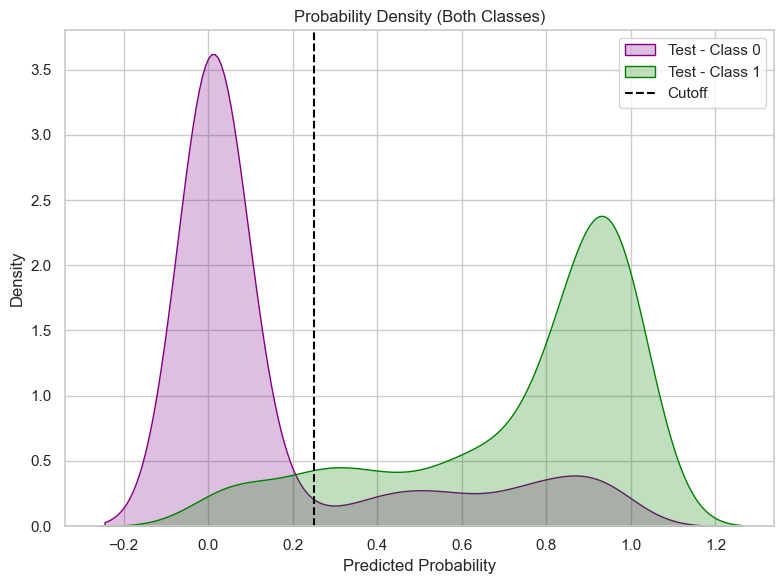

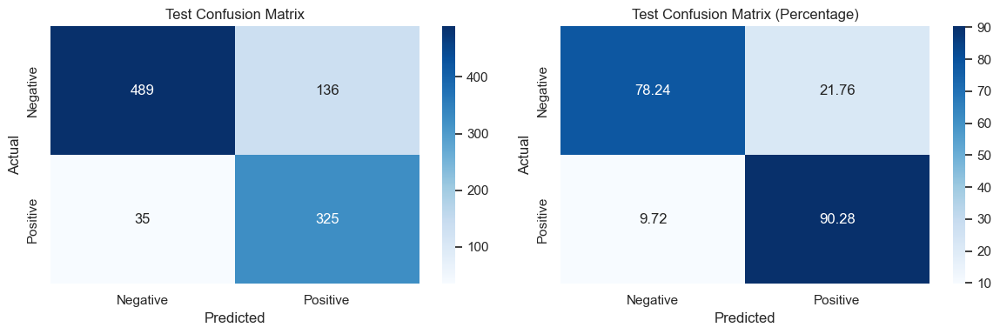

Model Evaluation Metrics:

Metrics       | Training Set | Testing Set
---------------------------------------------
Precision     | 1.0000       | 0.7050
Recall        | 1.0000       | 0.9028
Accuracy      | 1.0000       | 0.8264
F1 Score      | 1.0000       | 0.7917


In [1229]:
train_model_and_performance_eval(lgb_classifier, X_train, X_test, y_train, y_test, X, cutoff=0.25)

# SYNTHETICS

## 3 MONTHS WINDOW

In [1230]:
def create_window_df(df):
    window_df = []
    
    data = df.groupby('SFDC Account ID')

    for group_name, group_df in data:
        group_df = group_df.sort_values(by='Consumption Date (Monthly)')
        
        for idx in range(len(group_df) - 3):
            row_data = group_df.iloc[idx:idx+4]

            # DEM Units Synthetics (monthly):
            usage_month_1, usage_month_2, usage_month_3, usage_month_4 = row_data['DEM Units - Synthetics Total (Monthly)']
            usage_mom_1_2 = round(((usage_month_2 - usage_month_1) / usage_month_1) * 100, 3) if usage_month_1 != 0 else 0
            usage_mom_1_3 = round(((usage_month_3 - usage_month_1) / usage_month_1) * 100, 3) if usage_month_1 != 0 else 0
            usage_mom_2_3 = round(((usage_month_3 - usage_month_2) / usage_month_2) * 100, 3) if usage_month_2 != 0 else 0

            # Synthetic Tests:
            M_st_month_1, M_st_month_2, M_st_month_3, M_st_month_4 = row_data['SYNTHETIC_TESTS']
            M_st_mom_1_2 = round(((M_st_month_2 - M_st_month_1) / M_st_month_1) * 100, 3) if M_st_month_1 != 0 else 0
            M_st_mom_1_3 = round(((M_st_month_3 - M_st_month_1) / M_st_month_1) * 100, 3) if M_st_month_1 != 0 else 0
            M_st_mom_2_3 = round(((M_st_month_3 - M_st_month_2) / M_st_month_2) * 100, 3) if M_st_month_2 != 0 else 0

            # HTTP Checks:
            M_http_month_1, M_http_month_2, M_http_month_3, M_http_month_4 = row_data['HTTP_CHECK']
            M_http_mom_1_2 = round(((M_http_month_2 - M_http_month_1) / M_http_month_1) * 100, 3) if M_http_month_1 != 0 else 0
            M_http_mom_1_3 = round(((M_http_month_3 - M_http_month_1) / M_http_month_1) * 100, 3) if M_http_month_1 != 0 else 0
            M_http_mom_2_3 = round(((M_http_month_3 - M_http_month_2) / M_http_month_2) * 100, 3) if M_http_month_2 != 0 else 0
    
             # Competitor framework:
            frame_month_1, frame_month_2, frame_month_3, frame_month_4 = row_data['FRAMEWORK']
            frame_mom_1_2 = round(((frame_month_2 - frame_month_1) / frame_month_1) * 100, 3) if frame_month_1 != 0 else 0
            frame_mom_1_3 = round(((frame_month_3 - frame_month_1) / frame_month_1) * 100, 3) if frame_month_1 != 0 else 0
            frame_mom_2_3 = round(((frame_month_3 - frame_month_2) / frame_month_2) * 100, 3) if frame_month_2 != 0 else 0
    
            web = row_data.iloc[3]['Has Web']
            sr = row_data.iloc[3]['Has Mobile']
            sy = row_data.iloc[3]['Has SR']
            month = row_data.iloc[3]['Consumption Date (Monthly)']
            target = row_data.iloc[3]['Lost Account Has SY']
            number = row_data.iloc[3]['Date as Number']
            prev_retention = row_data.iloc[3]['Previous Retention Months Has SY']

            # Extracting encoded columns dynamically
            encoded_cols = [col for col in row_data.columns if col.startswith(tuple(categorical))]
            encoded_data = row_data[encoded_cols].values.flatten()

            window_df.append({
                'SFDC Account ID': group_name,
                'Predicting Month': month,
                'Date as Number': number,
                'Previous Retention Months' : prev_retention,

                'Usage - Month 3': usage_month_3,
                'Usage - MoM(12)': usage_mom_1_2,
                'Usage - MoM(13)': usage_mom_1_3,
                'Usage - MoM(23)': usage_mom_2_3,
                
                'Tests- MoM(12)': M_st_mom_1_2,
                'Tests - MoM(13)': M_st_mom_1_3,
                'Tests - MoM(23)': M_st_mom_2_3,

                'HTTP - MoM(12)': M_http_mom_1_2,
                'HTTP - MoM(13)': M_http_mom_1_3,
                'HTTP - MoM(23)': M_http_mom_2_3,

                'Framework - MoM(12)': frame_mom_1_2,
                'Framework - MoM(13)': frame_mom_1_3,
                'Framework - MoM(23)': frame_mom_2_3,

                **{col: val for col, val in zip(encoded_cols, encoded_data)},
                
                'Has Web': web,
                'Has Mobile': sr,
                'Has SR': sy,
                'Target (lost customer)': target
            })
    
    return pd.DataFrame(window_df)

sy_df = create_window_df(encoded_data_SY)
sy_df['Target (lost customer)'] = sy_df['Target (lost customer)'].astype(int)

## PYCARET

We are going to use the last month for testing the model. Hence, let us remove the last completed month (March 2024 for now), and proceed to develop the model without this month. Later we will use it for testing, and compare its accuracy. 

In [1231]:
train_val_filtered = sy_df[(sy_df['Date as Number'] != max_date) & (sy_df['Date as Number'] != (max_date -1))]

In [1232]:
cols = [i for i in train_val_filtered.columns if i not in ('Target (lost customer)', 'SFDC Account ID', 'Predicting Month')]

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(train_val_filtered[cols], train_val_filtered['Target (lost customer)'], test_size=0.2, random_state=1)

In [1233]:
print(train_val_filtered['Predicting Month'].max())

2024-05-01 00:00:00


In [1234]:
print("Lenght X_train:",len(X_train))
print("Length y_train:", len(y_train))
print("Lenght X_test:",len(X_test))
print("Length y_test:", len(y_test))

Lenght X_train: 85592
Length y_train: 85592
Lenght X_test: 21398
Length y_test: 21398


### RANDOM FOREST CLASSIFIER

In [1235]:
# MODEL TRAINING

rf = RandomForestClassifier(class_weight='balanced')
rf.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced')

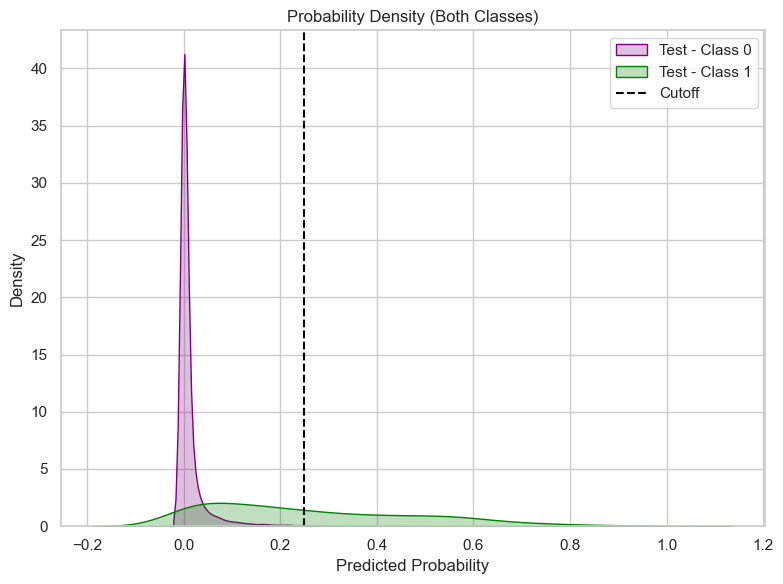

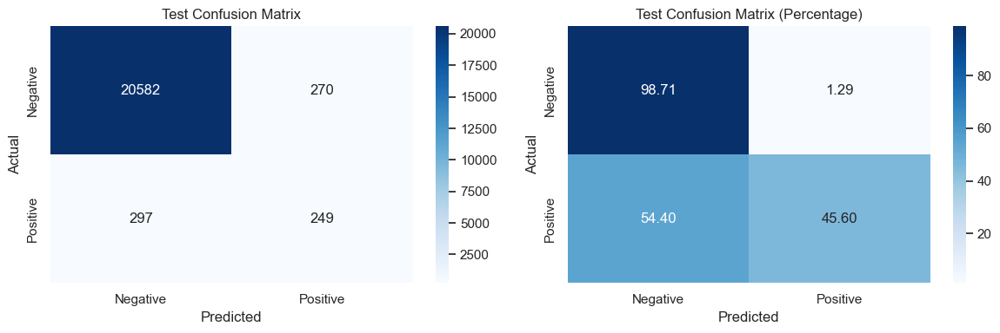

Model Evaluation Metrics:

Metrics       | Training Set | Testing Set
---------------------------------------------
Precision     | 0.9754       | 0.4798
Recall        | 1.0000       | 0.4560
Accuracy      | 0.9994       | 0.9735
F1 Score      | 0.9876       | 0.4676


In [1236]:
train_model_and_performance_eval(rf, X_train, X_test, y_train, y_test, cols, cutoff=0.25)

### EXTREME GRADIENT BOOSTING:

In [1237]:
# MODEL TRAINING
xgboost = xgb.XGBClassifier()
xgboost.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

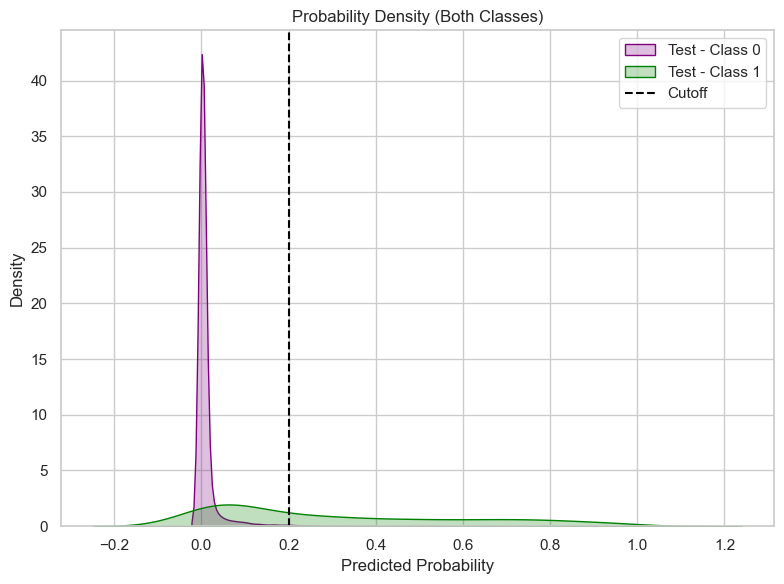

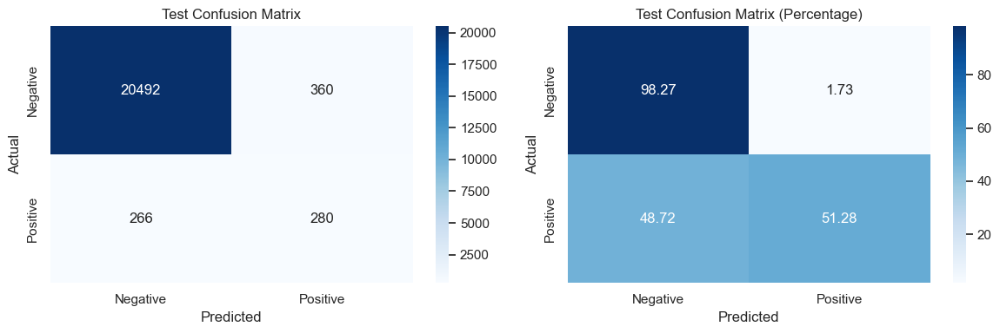

Model Evaluation Metrics:

Metrics       | Training Set | Testing Set
---------------------------------------------
Precision     | 0.6519       | 0.4375
Recall        | 0.8487       | 0.5128
Accuracy      | 0.9857       | 0.9707
F1 Score      | 0.7374       | 0.4722


In [1238]:
train_model_and_performance_eval(xgboost, X_train, X_test, y_train, y_test, cols, cutoff=0.2)

### LIGHT GBM CLASSIFIER:

In [1239]:
# MODEL TRAINING
lgbm = LGBMClassifier(class_weight='balanced')
lgbm.fit(X_train, y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 2023, number of negative: 83569
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018369 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3142
[LightGBM] [Info] Number of data points in the train set: 85592, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000


LGBMClassifier(class_weight='balanced')

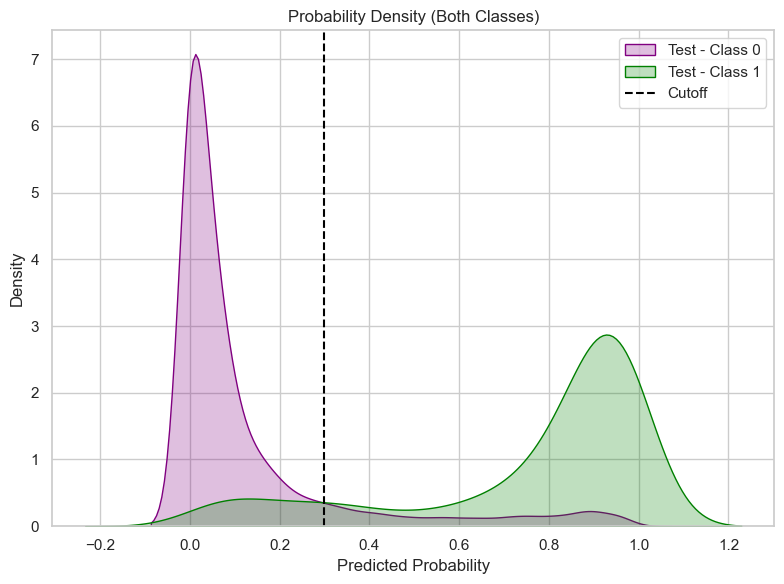

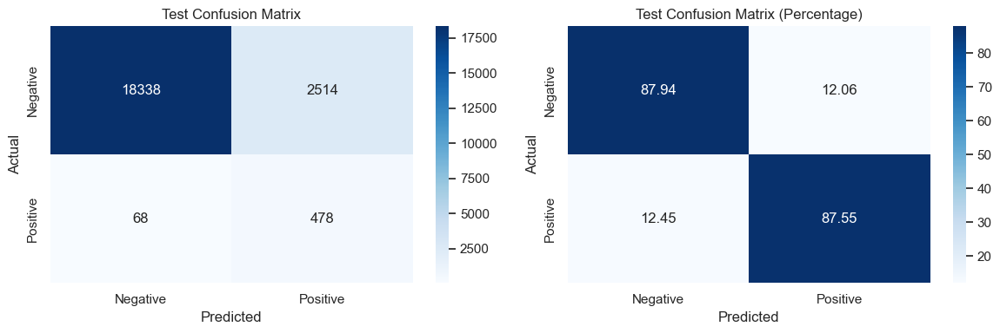

Model Evaluation Metrics:

Metrics       | Training Set | Testing Set
---------------------------------------------
Precision     | 0.1718       | 0.1598
Recall        | 0.9960       | 0.8755
Accuracy      | 0.8864       | 0.8793
F1 Score      | 0.2930       | 0.2702


In [1240]:
train_model_and_performance_eval(lgbm, X_train, X_test, y_train, y_test, cols, cutoff=0.3)

Precision --> XGBoost classifier has the highest precision on the training and testing set, with 0.9982 and 0.9610 respectively.

Recall --> LightGBM classifier has the highest recall on both the training and testing sets, with 0.9970 and 0.9882 respectively.

Accuray --> Random Forest and XGBoost classifiers has the highest accuracy, with 0.9995 and 0.9978 respectively.

F1 score --> Random Forest has the highest F1 score, with 0.9897 and 0.9523 respectively.

Based on these metrics:

> LightGBM generally performs the best among the three classifiers

## PREDICTIONS

To rigorously test the accuracy of our model, we will use the most recent complete month of data (March 24) as our test set. Applying our trained model to this dataset, we will then compare the predicted values with the actual values to assess the model's performance. By examining the performance metrics derived from this evaluation, we can gain insights into what areas we can improve and test if the model performs well.

Let us then, use March to predict what will our custoemrs do in that month:

In [1241]:
test_filtered_last = sy_df[sy_df['Date as Number'] == max_date -1][['SFDC Account ID', 'Predicting Month'] + cols]

In [1242]:
test_filtered_sy = sy_df[['SFDC Account ID', 'Predicting Month'] + cols]

In [1243]:
predictions = lgbm.predict(test_filtered_last[cols])
probabilities = lgbm.predict_proba(test_filtered_last[cols])

predictions_binary = np.where(probabilities[:, 1] >= 0.3, 1, 0)

In [1244]:
test_filtered_last['Prediction'] = predictions
test_filtered_last['Binary Prediction'] = predictions_binary
test_filtered_last['Actual Value']  = sy_df[sy_df['Date as Number'] == max_date -1]['Target (lost customer)'] 
test_filtered_last['Probability of Churn'] = np.round(probabilities[:, 1], 4)
test_filtered_last['Probability of Survival'] = np.round(probabilities[:, 0], 4)

In [1245]:
test_filtered_last.head()

,SFDC Account ID,Predicting Month,Date as Number,Previous Retention Months,Usage - Month 3,Usage - MoM(12),Usage - MoM(13),Usage - MoM(23),Tests- MoM(12),Tests - MoM(13),...,Vertical_Telecommunications,Vertical_Utilities,Has Web,Has Mobile,Has SR,Prediction,Binary Prediction,Actual Value,Probability of Churn,Probability of Survival
38,00100000001VLvGAAW,2024-05-01,42,0,0,0.000,0.000,0.000,0.000,0.000,...,False,False,1,0,0,0,0,0,0.0006,0.9994
66,00100000001VLvZAAW,2024-05-01,42,29,503560,17.087,94.388,66.020,66.667,66.667,...,False,False,1,0,0,0,0,0,0.0349,0.9651
95,00100000001VSZLAA4,2024-05-01,42,0,0,0.000,0.000,0.000,0.000,0.000,...,False,False,1,0,1,0,0,0,0.0004,0.9996
135,00100000001XytIAAS,2024-05-01,42,41,61327,2.872,-0.985,-3.749,-12.500,-12.500,...,False,False,1,0,0,0,0,0,0.1608,0.8392
175,00100000001Y6vqAAC,2024-05-01,42,41,3905818,-8.225,-6.715,1.645,-17.178,-19.018,...,False,False,0,0,0,0,0,0,0.0423,0.9577


In [1246]:
y_test_march = sy_df[sy_df['Date as Number'] == max_date -1]['Target (lost customer)'] 

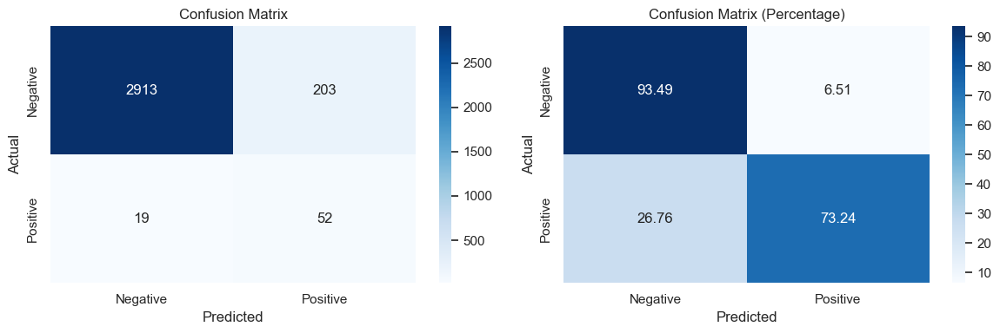

Metrics       | Testing Set
---------------------------------
Precision     | 0.2039
Recall        | 0.7324
Accuracy      | 0.9303
F1 Score      | 0.3190


In [1247]:
evaluate_metrics_test(y_test_march, predictions)

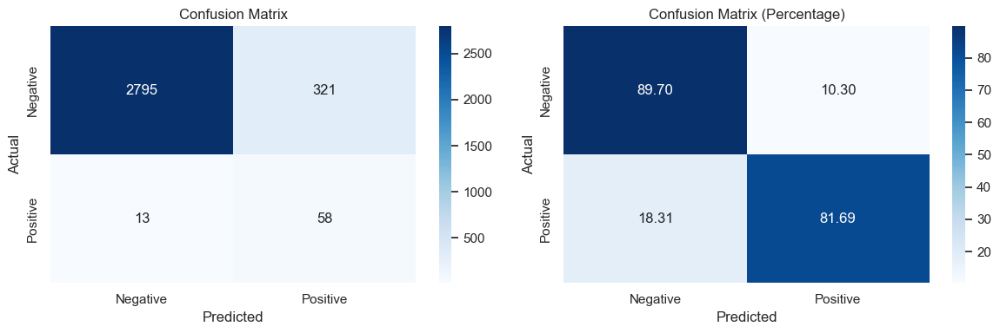

Metrics       | Testing Set
---------------------------------
Precision     | 0.1530
Recall        | 0.8169
Accuracy      | 0.8952
F1 Score      | 0.2578


In [1248]:
evaluate_metrics_test(y_test_march, predictions_binary)

In [1249]:
predictions = lgbm.predict(test_filtered_sy[cols])
probabilities = lgbm.predict_proba(test_filtered_sy[cols])

predictions_binary = np.where(probabilities[:, 1] >= 0.34, 1, 0)


test_filtered_sy['Prediction'] = predictions
test_filtered_sy['Binary Prediction'] = predictions_binary
test_filtered_sy['Actual Value']  = sy_df['Target (lost customer)'] 
test_filtered_sy['Probability of Churn'] = np.round(probabilities[:, 1], 4)
test_filtered_sy['Probability of Survival'] = np.round(probabilities[:, 0], 4)

test_filtered_sy = test_filtered_sy.sort_values(by='Probability of Churn', ascending=False)
test_filtered_sy = test_filtered_sy[['SFDC Account ID', 'Predicting Month', 'Previous Retention Months', 'Usage - Month 3', 'Usage - MoM(12)', 'Usage - MoM(13)', 'Usage - MoM(23)', 'Prediction','Binary Prediction', 'Actual Value', 'Probability of Churn','Probability of Survival', 'Has Web', 'Has Mobile', 'Has SR']]

In [1250]:
test_filtered_sy.head()

,SFDC Account ID,Predicting Month,Previous Retention Months,Usage - Month 3,Usage - MoM(12),Usage - MoM(13),Usage - MoM(23),Prediction,Binary Prediction,Actual Value,Probability of Churn,Probability of Survival,Has Web,Has Mobile,Has SR
100707,00170000018a1elAAA,2023-07-01,0,2,0.000,0.000,0.000,1,1,1,0.9939,0.0061,1,0,1
47163,0014u00001w1v0EAAQ,2023-08-01,0,1,0.000,0.000,0.000,1,1,1,0.9932,0.0068,0,0,0
79677,0017000000ehlTqAAI,2022-09-01,0,20,0.000,0.000,0.000,1,1,1,0.9919,0.0081,1,0,1
19318,0010g00001bC6hYAAS,2024-01-01,0,40,0.000,0.000,0.000,1,1,1,0.9913,0.0087,0,0,0
34747,0010g00001mZfZ9AAK,2021-03-01,2,16808,-0.006,-80.183,-80.182,1,1,1,0.9903,0.0097,0,0,0


In [1251]:
test_filtered_sy.to_csv('Models/SYTestFiltered.csv', index=False)

## PLOTS

In [1252]:
y_pred_proba_xgb = xgboost.predict_proba(X_test)[::,1]
y_pred_proba_lgbm = lgbm.predict_proba(X_test)[::,1]
y_pred_proba_rf = rf.predict_proba(X_test)[::,1]

ROC CURVE

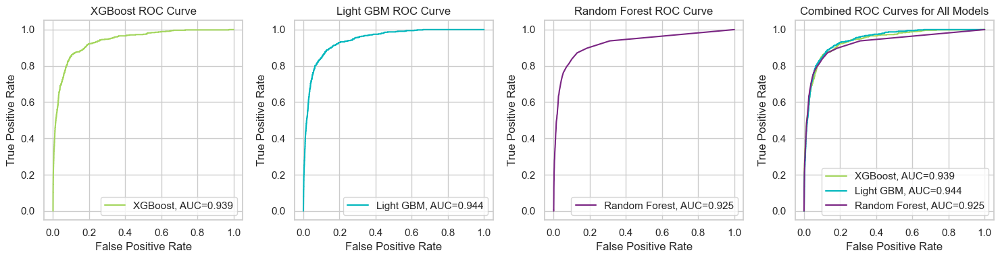

In [1253]:
fpr_dt, tpr_dt, _ = metrics.roc_curve(y_test, y_pred_proba_xgb)
auc_dt = round(metrics.roc_auc_score(y_test, y_pred_proba_xgb), 3)

fpr_lgbm, tpr_lgbm, _ = metrics.roc_curve(y_test, y_pred_proba_lgbm)
auc_lgbm = round(metrics.roc_auc_score(y_test, y_pred_proba_lgbm), 3)

fpr_rf, tpr_rf, _ = metrics.roc_curve(y_test, y_pred_proba_rf)
auc_rf = round(metrics.roc_auc_score(y_test, y_pred_proba_rf), 3)

fig, axs = plt.subplots(1, 4, figsize=(15, 4))

# Decision Tree ROC curve
axs[0].plot(fpr_dt, tpr_dt, label=f'XGBoost, AUC={auc_dt}', color='#a4d65e')  
axs[0].set_xlabel('False Positive Rate')
axs[0].set_ylabel('True Positive Rate')
axs[0].set_title('XGBoost ROC Curve')
axs[0].legend()
axs[0].grid(True)

# Light GBM ROC curve
axs[1].plot(fpr_lgbm, tpr_lgbm, label=f'Light GBM, AUC={auc_lgbm}', color='#00b7bd') 
axs[1].set_xlabel('False Positive Rate')
axs[1].set_ylabel('True Positive Rate')
axs[1].set_title('Light GBM ROC Curve')
axs[1].legend()
axs[1].grid(True)

# Random Forest ROC curve
axs[2].plot(fpr_rf, tpr_rf, label=f'Random Forest, AUC={auc_rf}', color='#7a2583') 
axs[2].set_xlabel('False Positive Rate')
axs[2].set_ylabel('True Positive Rate')
axs[2].set_title('Random Forest ROC Curve')
axs[2].legend()
axs[2].grid(True)

# Combined ROC curve for all models
axs[3].plot(fpr_dt, tpr_dt, label=f'XGBoost, AUC={auc_dt}', color='#a4d65e')  
axs[3].plot(fpr_lgbm, tpr_lgbm, label=f'Light GBM, AUC={auc_lgbm}', color='#00b7bd') 
axs[3].plot(fpr_rf, tpr_rf, label=f'Random Forest, AUC={auc_rf}', color='#7a2583') 
axs[3].set_xlabel('False Positive Rate')
axs[3].set_ylabel('True Positive Rate')
axs[3].set_title('Combined ROC Curves for All Models')
axs[3].legend()
axs[3].grid(True)

plt.tight_layout()
plt.show()

FEATURE IMPORTANCE

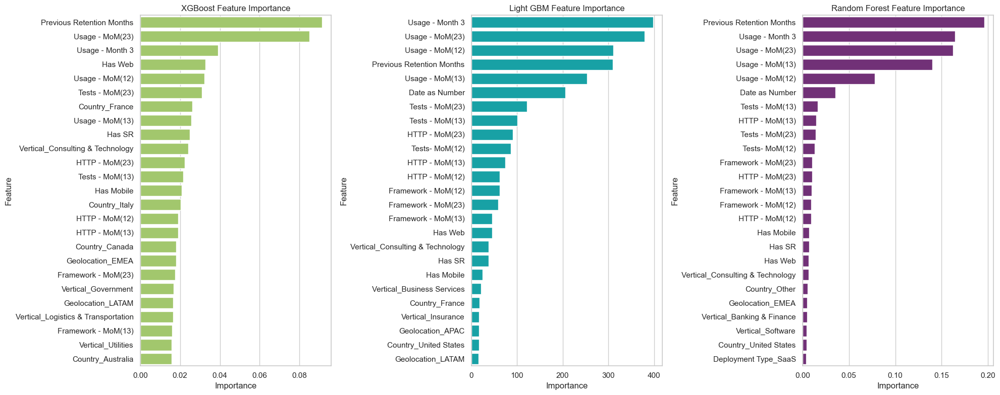

In [1254]:
feature_importances_xgboost = pd.DataFrame({'Feature': cols, 'Importance': xgboost.feature_importances_})
feature_importances_xgboost = feature_importances_xgboost.sort_values(by='Importance', ascending=False).head(25)

feature_importances_lgbm = pd.DataFrame({'Feature': cols, 'Importance': lgbm.feature_importances_})
feature_importances_lgbm = feature_importances_lgbm.sort_values(by='Importance', ascending=False).head(25)

feature_importances_rf = pd.DataFrame({'Feature': cols, 'Importance': rf.feature_importances_})
feature_importances_rf = feature_importances_rf.sort_values(by='Importance', ascending=False).head(25)


fig, axs = plt.subplots(1, 3, figsize=(20, 8))

# Plot for Decision Tree
sns.barplot(data=feature_importances_xgboost, x='Importance', y='Feature', color='#a4d65e', ax=axs[0])
axs[0].set_title('XGBoost Feature Importance')
axs[0].set_xlabel('Importance')
axs[0].set_ylabel('Feature')

# Plot for Light GBM
sns.barplot(data=feature_importances_lgbm, x='Importance', y='Feature', color='#00b7bd', ax=axs[1])
axs[1].set_title('Light GBM Feature Importance')
axs[1].set_xlabel('Importance')
axs[1].set_ylabel('Feature')

# Plot for Random Forest
sns.barplot(data=feature_importances_rf, x='Importance', y='Feature', color='#7a2583', ax=axs[2])
axs[2].set_title('Random Forest Feature Importance')
axs[2].set_xlabel('Importance')
axs[2].set_ylabel('Feature')

plt.tight_layout()
plt.show()

PRECISSION-RECALL CURVE

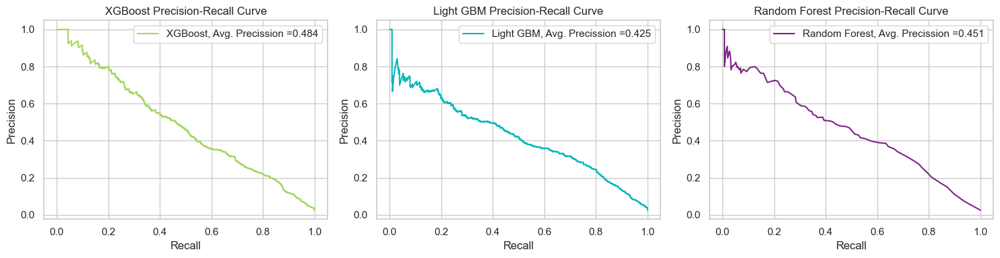

In [1255]:
precision_dt, recall_dt, _ = precision_recall_curve(y_test, y_pred_proba_xgb)
average_precision_dt = round(average_precision_score(y_test, y_pred_proba_xgb),3)

precision_lgbm, recall_lgbm, _ = precision_recall_curve(y_test, y_pred_proba_lgbm)
average_precision_lgbm = round(average_precision_score(y_test, y_pred_proba_lgbm),3)

precision_rf, recall_rf, _ = precision_recall_curve(y_test, y_pred_proba_rf)
average_precision_rf = round(average_precision_score(y_test, y_pred_proba_rf),3)

fig, axs = plt.subplots(1, 3, figsize=(15, 4))

# Decision Tree Precision-Recall curve
axs[0].plot(recall_dt, precision_dt, label=f'XGBoost, Avg. Precission ={average_precision_dt}', color='#a4d65e')  
axs[0].set_xlabel('Recall')
axs[0].set_ylabel('Precision')
axs[0].set_title('XGBoost Precision-Recall Curve')
axs[0].legend()
axs[0].grid(True)

# Light GBM Precision-Recall curve
axs[1].plot(recall_lgbm, precision_lgbm, label=f'Light GBM, Avg. Precission ={average_precision_lgbm}', color='#00b7bd') 
axs[1].set_xlabel('Recall')
axs[1].set_ylabel('Precision')
axs[1].set_title('Light GBM Precision-Recall Curve')
axs[1].legend()
axs[1].grid(True)

# Random Forest Precision-Recall curve
axs[2].plot(recall_rf, precision_rf, label=f'Random Forest, Avg. Precission ={average_precision_rf}', color='#7a2583') 
axs[2].set_xlabel('Recall')
axs[2].set_ylabel('Precision')
axs[2].set_title('Random Forest Precision-Recall Curve')
axs[2].legend()
axs[2].grid(True)

plt.tight_layout()
plt.show()

## EXPLAINABILITY FOR LGBM

In [1256]:
import shap
shap.initjs()

In [1257]:
explainer = shap.Explainer(lgbm)
shap_values = explainer(X_test)

In [1258]:
print("Shape of shap_values:", shap_values.shape)
print("Shape of X_test:", X_test.shape)

Shape of shap_values: (21398, 50)
Shape of X_test: (21398, 50)


Let us see which variables have an impact on our model's performance:

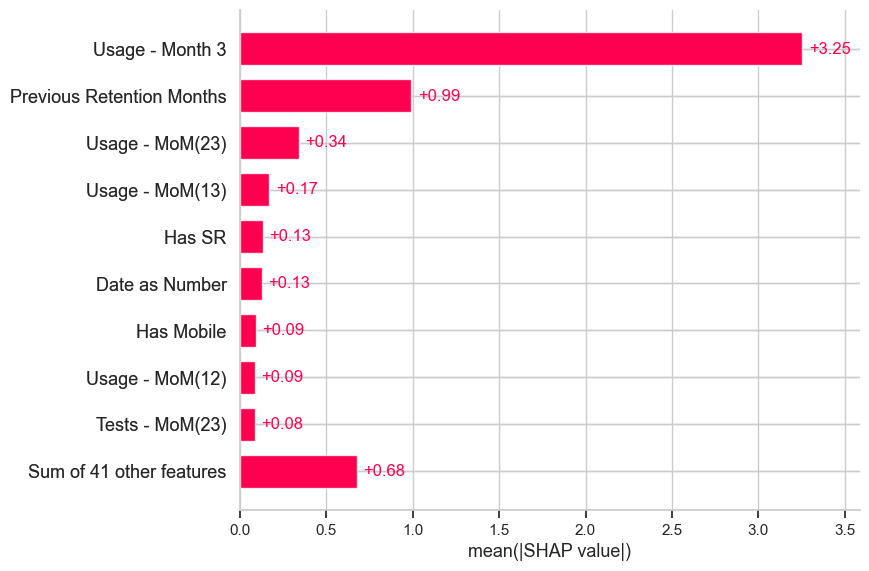

In [1259]:
shap.plots.bar(shap_values)

As we can see *Retention Months* is the variable with highest impact in our model, significantly surpassing other variables. It is then followed by *Usage - MoM (2,3)*, representing the Month-over-Month change between Month 2 and Month 3. This is logical since Usage - MoM (2,3) reflects the usage pattern immediately preceding the determination of account status.

Let us plot a summary plot of the overall model:

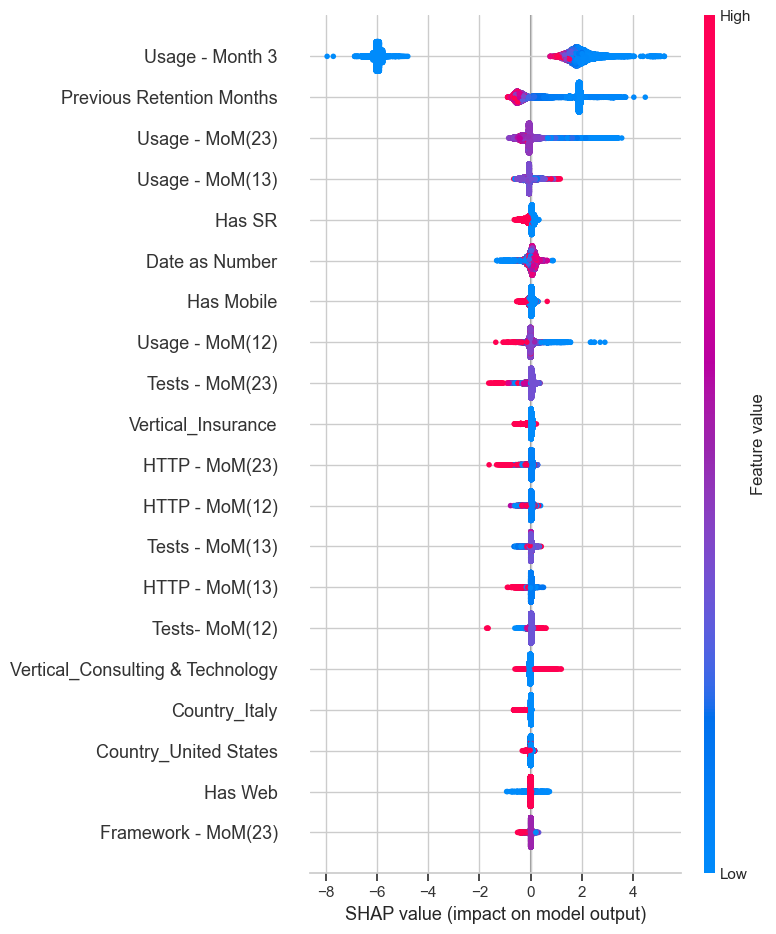

In [1260]:
shap.summary_plot(shap_values, X_test)

Each point on the chart is one SHAP value for a prediction and feature. 

**Red** color means **higher** value of a feature. 

**Blue** means **lower** value of a feature. We can get the general sense of features’ directionality impact based on the distribution of the red and blue dots.

In the chart above, we can conclude the following insights:
- Higher value of *Retention Months* leads to lower probability of churn. On the other hand, a lower value of Retention Months is linked to a higher likelihood of churn, indicating challenges in retaining customers with shorter retention periods. This observation suggests that Dynatrace may face difficulties retaining customers with initial exposure to the product, but performs well in retaining longer-standing customers once they have become familiar and engaged.


Let us perform a deeper analysis by examining the impact separately for Churn and Non-Churn accounts

**Account that did not churn:**

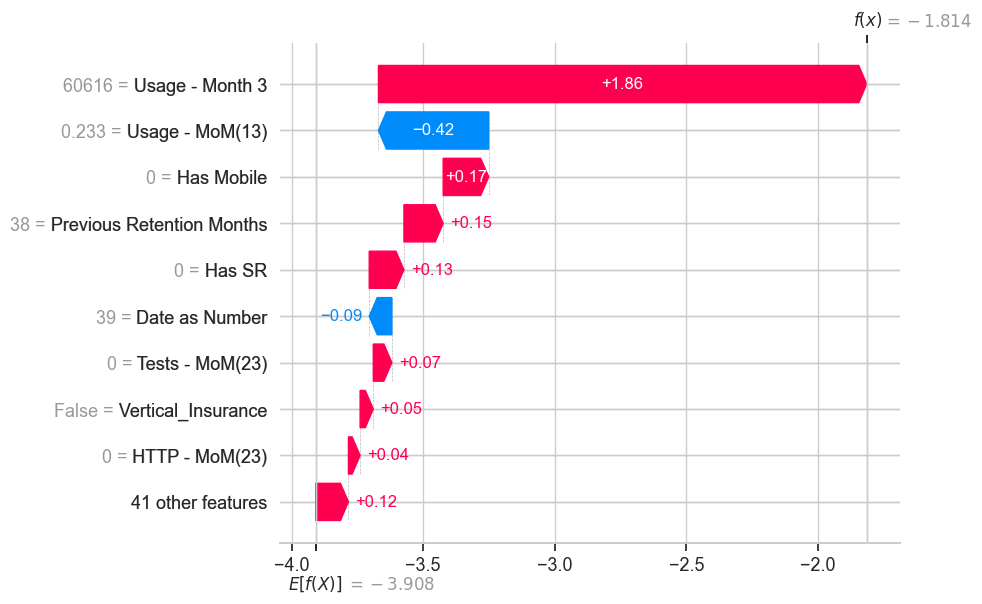

In [1261]:
shap.plots.waterfall(shap_values[0])

**Churned Account:**

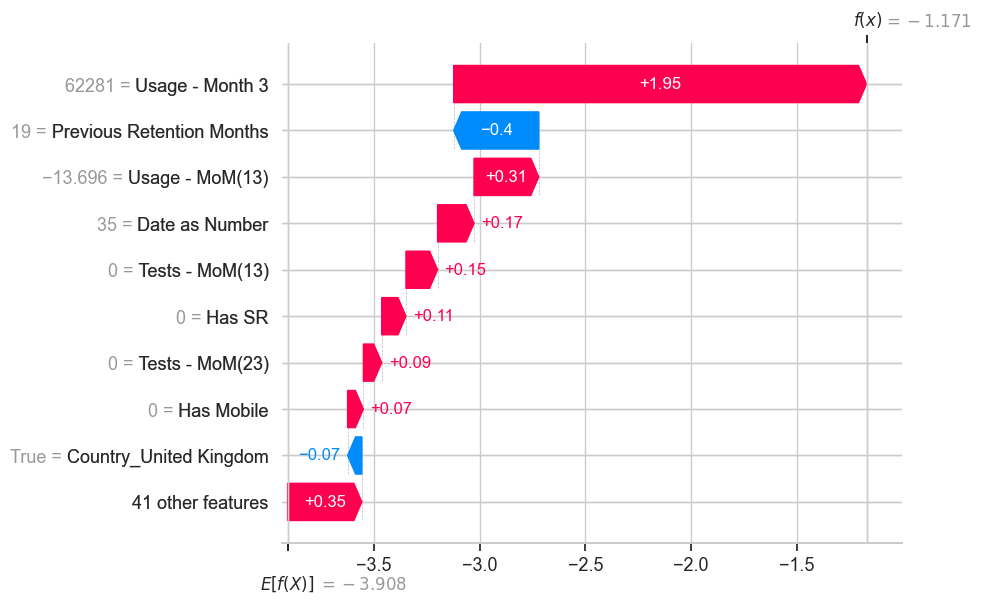

In [1262]:
shap.plots.waterfall(shap_values[1])

## SURVIVAL ANALYSIS

- Time-to-event data: we are going to use the consecutive retention months before a customer churns.

- Event indicator: A binary column indicating whether the churn event has occurred (1) or not (0) for each customer.

In [1263]:
df_SY.fillna(0, inplace=True)
df_SY.replace([np.inf, -np.inf], 0, inplace=True)
df_SY = df_SY[df_SY['Date as Number'] != max_date]

### **KALPLAN-MEIER SURVIVAL CUVE**

The Kaplan-Meier survival curve shows the estimated probability of customers not churning over time (in terms of retention months).

In [1264]:
dff_ID = df_SY.groupby('SFDC Account ID')

agg_retention_months = dff_ID['Previous Retention Months Has SY'].last()
date = dff_ID['Consumption Date (Monthly)'].last()
churn_status = dff_ID['Lost Account Has SY'].any()
vertical = dff_ID['Vertical'].last()
deployment = dff_ID['Deployment Type'].last()
arr = dff_ID['ARR Band'].last()
geolocation = dff_ID['Geolocation'].last()
country = dff_ID['Country'].last()
rum = dff_ID['UEM_ENABLED'].last()
se = dff_ID['SESSION_REPLAY_ENABLED'].last()
usage = dff_ID['DEM Units - Synthetics Total (Monthly)'].mean()
prev_usage = dff_ID['DEM Units - Synthetics Total (Monthly - Previous Month)'].mean()
apps = dff_ID['APPS_MOBILE'].mean() + dff_ID['WEB_APPS'].mean()
has_mob = dff_ID['Has Web'].last()
has_sr = dff_ID['Has Mobile'].last()
has_sy = dff_ID['Has SR'].last()



kaplain_df = pd.DataFrame({
    'SFDC Account ID': agg_retention_months.index,
    'Previous Retention Months Has SY': agg_retention_months.values,
    'Date': date.values,
    'Lost Account SY': churn_status.values,
    'Vertical': vertical.values,
    'Deployment Type': deployment.values,
    'ARR Band': arr.values,
    'Geolocation': geolocation.values,
    'Country': country.values,
    'Avg Usage': usage.values,
    'Avg Prev Usage': prev_usage.values,
    'Avg Apps': apps.values,
    'RUM Enabled': rum.values,
    'SR Enabled': se.values,
    'Has Web': has_mob.values,
    'Has Mobile': has_sr.values,
    'Has SR': has_sy.values

})

SY_embeding = kaplain_df.copy()


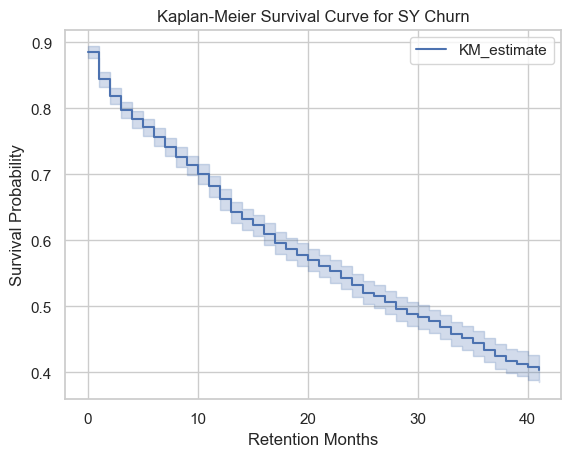

In [1265]:
durations = kaplain_df['Previous Retention Months Has SY']
event_observed = kaplain_df['Lost Account SY']

kmf = KaplanMeierFitter()

kmf.fit(durations, event_observed)

kmf.plot()
plt.title('Kaplan-Meier Survival Curve for SY Churn')
plt.xlabel('Retention Months')
plt.ylabel('Survival Probability')
plt.show()

Let us compute a confidence interval

In [1266]:
ci = kmf.confidence_interval_survival_function_
ci.head()

,KM_estimate_lower_0.95,KM_estimate_upper_0.95
0.0,0.876160,0.893973
1.0,0.833053,0.854671
2.0,0.806833,0.830350
3.0,0.785321,0.810235
4.0,0.770958,0.796733


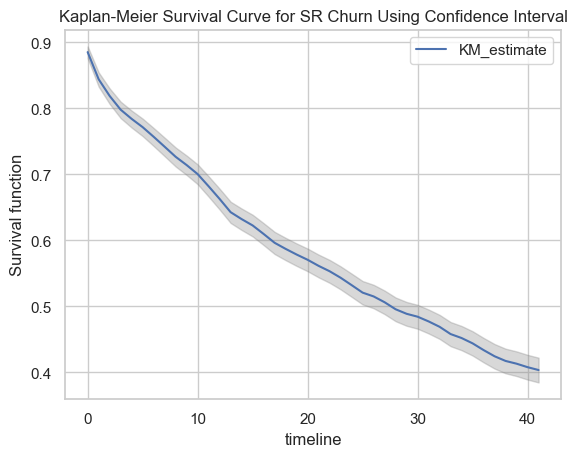

In [1267]:
ts = ci.index
low, high = np.transpose(ci.values)

plt.fill_between(ts, low, high, color='gray', alpha=0.3)
kmf.survival_function_.plot(ax=plt.gca(), label='Deployment Type_SaaS')  # Adding label for SaaS
plt.title('Kaplan-Meier Survival Curve for SR Churn Using Confidence Interval')
plt.ylabel('Survival function')
plt.legend()


Let us now add additional attributes that will help us predict.

In [1268]:
kaplain_df.head()

,SFDC Account ID,Previous Retention Months Has SY,Date,Lost Account SY,Vertical,Deployment Type,ARR Band,Geolocation,Country,Avg Usage,Avg Prev Usage,Avg Apps,RUM Enabled,SR Enabled,Has Web,Has Mobile,Has SR
0,00100000001VLvGAAW,0,2024-05-01,False,Consulting & Technology,SaaS,50-100k,NORAM,United States,0.000000e+00,0.000000e+00,4084.095238,True,False,1,0,0
1,00100000001VLvZAAW,29,2024-05-01,False,Business Services,SaaS,250-500k,NORAM,United States,2.475546e+05,2.328282e+05,822.866667,True,False,1,0,0
2,00100000001VSZLAA4,0,2024-05-01,False,Manufacturing,Managed,100-250k,NORAM,United States,0.000000e+00,0.000000e+00,673.838710,True,False,1,0,1
3,00100000001XytIAAS,41,2024-05-01,False,Insurance,Managed,500-1M,NORAM,United States,7.271231e+04,7.122638e+04,51927.333333,True,False,1,0,0
4,00100000001Y6vqAAC,41,2024-05-01,False,Banking & Finance,SaaS,250-500k,NORAM,United States,5.701470e+06,5.597699e+06,17.095238,True,True,0,0,0


### **TRAINING MODELS USING SURVIVAL ANALYSIS:**

In [1269]:
columns_to_encode = ['Deployment Type', 'Vertical', 'Country', 'Geolocation', 'ARR Band', 'RUM Enabled', 'SR Enabled']

label_encoder = LabelEncoder()


for column in columns_to_encode:
    kaplain_df[column] = label_encoder.fit_transform(kaplain_df[column].astype(str))

    original_values = label_encoder.classes_
    encoded_values = label_encoder.transform(original_values)
    

    print(f"\nConversions for {column}:")
    for original, encoded in zip(original_values, encoded_values):
        print(f"{original} = {encoded}")


Conversions for Deployment Type:
Managed = 0
SaaS = 1

Conversions for Vertical:
Banking & Finance = 0
Business Services = 1
Consulting & Technology = 2
Consumer Goods & Services = 3
Government = 4
Healthcare = 5
Insurance = 6
Logistics & Transportation = 7
Manufacturing = 8
Media & Entertainment = 9
Other = 10
Retail & Wholesale = 11
Software = 12
Telecommunications = 13
Utilities = 14

Conversions for Country:
Australia = 0
Brazil = 1
Canada = 2
France = 3
Germany = 4
Italy = 5
Mexico = 6
Other = 7
Spain = 8
United Kingdom = 9
United States = 10

Conversions for Geolocation:
0 = 0
APAC = 1
EMEA = 2
LATAM = 3
NORAM = 4

Conversions for ARR Band:
0-10k = 0
1.5-2M = 1
10-20k = 2
100-250k = 3
1M-1.5M = 4
20-50k = 5
250-500k = 6
2M-3M = 7
3-5M = 8
50-100k = 9
500-1M = 10
>5M = 11

Conversions for RUM Enabled:
0 = 0
False = 1
True = 2

Conversions for SR Enabled:
0 = 0
False = 1
True = 2


In [1270]:
cols = [i for i in kaplain_df.columns if i not in ('Lost Account SY', 'SFDC Account ID', ' Previous Retention Months Has SY', 'Date')]

X_train, X_test, y_train, y_test = train_test_split(kaplain_df[cols], kaplain_df[['Lost Account SY', 'Previous Retention Months Has SY']], test_size=0.2, random_state=1)

In [1271]:
print("Lenght X_train:",len(X_train))
print("Length y_train:", len(y_train))
print("Lenght X_test:",len(X_test))
print("Length y_test:", len(y_test))

Lenght X_train: 3936
Length y_train: 3936
Lenght X_test: 985
Length y_test: 985


In [1272]:
event_indicator = (y_train['Lost Account SY']).astype(bool)  
survival_times = y_train['Previous Retention Months Has SY'].astype(int)  

event_field_name = 'event_indicator'  
time_field_name = 'survival_months'  

# Strucured array
y_structured = np.array(list(zip(event_indicator, survival_times)), 
                        dtype=[(event_field_name, bool), (time_field_name, float)])


#### RANDOM SURVIVAL FOREST:

In [1273]:
rsf = RandomSurvivalForest(
    n_estimators=1000, min_samples_split=10, min_samples_leaf=15, n_jobs=-1, random_state=20
)
rsf.fit(X_train, y_structured)

RandomSurvivalForest(min_samples_leaf=15, min_samples_split=10,
                     n_estimators=1000, n_jobs=-1, random_state=20)

We can check how well the model performs by evaluating it on the test data:

In [1274]:
event_indicator_test = (y_test['Lost Account SY']).astype(bool)  
survival_times_test = y_test['Previous Retention Months Has SY'].astype(int)  

event_field_name = 'event_indicator'  
time_field_name = 'survival_months'  

y_structured_test= np.array(list(zip(event_indicator_test, survival_times_test)), 
                        dtype=[(event_field_name, bool), (time_field_name, float)])

In [1275]:
print('Score:', rsf.score(X_test, y_structured_test))

Score: 0.9121734323784403


Let us now select some customers of Abril 24, and apply a survival analysis on them:

In [1276]:
data_abril = df_W[df_W['Consumption Date (Monthly)'] == '2024-04-01']

abril_sfdc_ids = data_abril['SFDC Account ID'].unique()

filtered_kaplain_df = kaplain_df[kaplain_df['SFDC Account ID'].isin(abril_sfdc_ids)]

X_testing = filtered_kaplain_df[cols]

In [1277]:
surv_rf = rsf.predict_survival_function(X_testing, return_array=True)

#### GRADIENT BOOSTING SURVIVAL:

In [1278]:
gboosts = GradientBoostingSurvivalAnalysis()
gboosts.fit(X_train, y_structured)

GradientBoostingSurvivalAnalysis()

In [1279]:
print('Score:', gboosts.score(X_test, y_structured_test))

Score: 0.9884089101805699


In [1280]:
surv_gboost = gboosts.predict_survival_function(X_testing, return_array=True)

#### SURVIVAL TREE:

In [1281]:
st = SurvivalTree()
st.fit(X_train, y_structured)

SurvivalTree()

In [1282]:
print('Score:', st.score(X_test, y_structured_test))

Score: 0.9104060396826936


In [1283]:
surv_st = st.predict_survival_function(X_testing, return_array=True)

### PLOTS OF SURVIVAL CURVE 

In [1284]:
sfdc_account_ids = filtered_kaplain_df['SFDC Account ID']
sfdc_account_ids_to_plot = '00100000001VSZLAA4'

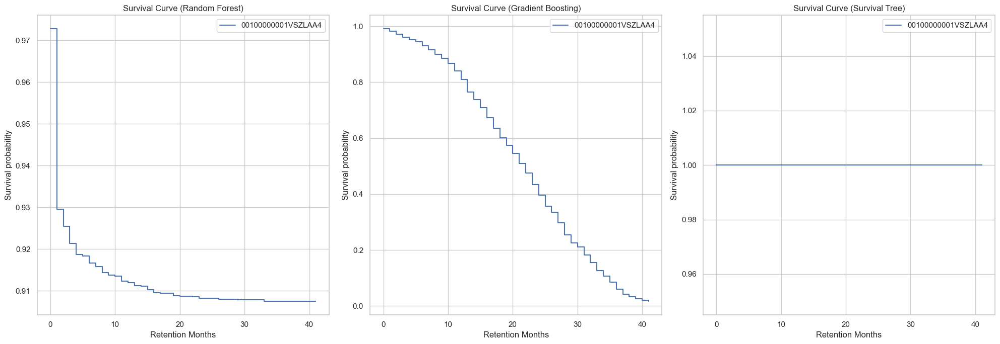

In [1285]:
unique_times_rsf = rsf.unique_times_
unique_times_gb = gboosts.unique_times_
unique_times_st = st.unique_times_

fig, axes = plt.subplots(1, 3, figsize=(20, 7))  

# Random Forest
ax1 = axes[0]  
ax1.set_title('Survival Curve (Random Forest)')
ax1.set_ylabel("Survival probability")
ax1.set_xlabel("Retention Months")

for sfdc_account_id, s in zip(sfdc_account_ids, surv_rf):
    if sfdc_account_id in sfdc_account_ids_to_plot:
        ax1.step(unique_times_rsf, s, where="post", label=f"{sfdc_account_id}")

ax1.legend()
ax1.grid(True)

# Gradient Boosting
ax2 = axes[1] 
ax2.set_title('Survival Curve (Gradient Boosting)')
ax2.set_ylabel("Survival probability")
ax2.set_xlabel("Retention Months")

for sfdc_account_id, s in zip(sfdc_account_ids, surv_gboost):
    if sfdc_account_id in sfdc_account_ids_to_plot:
        ax2.step(unique_times_gb, s, where="post", label=f"{sfdc_account_id}")

ax2.legend()
ax2.grid(True)

# Survival Tree
ax3 = axes[2] 
ax3.set_title('Survival Curve (Survival Tree)')
ax3.set_ylabel("Survival probability")
ax3.set_xlabel("Retention Months")

for sfdc_account_id, s in zip(sfdc_account_ids, surv_st):
    if sfdc_account_id in sfdc_account_ids_to_plot:
        ax3.step(unique_times_st, s, where="post", label=f"{sfdc_account_id}")

ax3.legend()
ax3.grid(True)

# Displaying the plot
plt.tight_layout()
plt.show()


#### Survival Table:

Let's create a table with the survival probability for each model.

RANDOM FOREST SURVIVAL:

In [1286]:
survival_table_rf = pd.DataFrame(index=rsf.unique_times_, columns=sfdc_account_ids)

for i, (sfdc_account_id, s) in enumerate(zip(sfdc_account_ids, surv_rf)):
    survival_table_rf[sfdc_account_id] = s


survival_table_transposed_rf = survival_table_rf.T.reset_index()
survival_table_transposed_rf.rename(columns={'index': 'SFDC Account ID'}, inplace=True)

In [1287]:
survival_table_transposed_rf.head()

,SFDC Account ID,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,...,32.0,33.0,34.0,35.0,36.0,37.0,38.0,39.0,40.0,41.0
0,00100000001VLvGAAW,0.974392,0.890863,0.887556,0.883394,0.879230,0.875475,0.874002,0.872243,0.868240,...,0.856767,0.856767,0.856767,0.856695,0.856695,0.856556,0.856473,0.855460,0.855460,0.855373
1,00100000001VLvZAAW,0.994275,0.992612,0.991689,0.990009,0.988973,0.988646,0.987803,0.986774,0.985604,...,0.813660,0.790781,0.774633,0.744535,0.710081,0.702193,0.698996,0.675212,0.673881,0.671543
2,00100000001VSZLAA4,0.972716,0.929575,0.925419,0.921403,0.918738,0.918370,0.916688,0.915814,0.914424,...,0.907912,0.907480,0.907480,0.907480,0.907480,0.907480,0.907480,0.907480,0.907480,0.907480
3,00100000001XytIAAS,0.988755,0.981315,0.980074,0.978008,0.975978,0.975292,0.969746,0.968070,0.965373,...,0.856094,0.851897,0.844792,0.832402,0.809724,0.800974,0.781933,0.778296,0.763385,0.738517
4,00100000001Y6vqAAC,0.997091,0.993500,0.992518,0.986292,0.984606,0.983253,0.982124,0.980558,0.979345,...,0.896781,0.891401,0.890103,0.886442,0.880464,0.875305,0.870494,0.867488,0.865558,0.865385


GRADIENT BOOSING SURVIVAL:

In [1288]:
survival_table_gb = pd.DataFrame(index=gboosts.unique_times_, columns=sfdc_account_ids)

for i, (sfdc_account_id, s) in enumerate(zip(sfdc_account_ids, surv_gboost)):
    survival_table_gb[sfdc_account_id] = s


survival_table_transposed_gb = survival_table_gb.T.reset_index()
survival_table_transposed_gb.rename(columns={'index': 'SFDC Account ID'}, inplace=True)

In [1289]:
survival_table_transposed_gb.head()

,SFDC Account ID,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,...,32.0,33.0,34.0,35.0,36.0,37.0,38.0,39.0,40.0,41.0
0,00100000001VLvGAAW,0.990356,0.981417,0.971786,0.961506,0.952513,0.943630,0.930501,0.916627,0.899730,...,0.155487,0.126805,0.106564,0.085102,0.060185,0.042658,0.032380,0.025829,0.020837,0.016483
1,00100000001VLvZAAW,0.997670,0.995495,0.993135,0.990595,0.988357,0.986130,0.982810,0.979263,0.974887,...,0.638894,0.608291,0.583353,0.552612,0.508400,0.467972,0.437926,0.414734,0.393841,0.372234
2,00100000001VSZLAA4,0.990356,0.981417,0.971786,0.961506,0.952513,0.943630,0.930501,0.916627,0.899730,...,0.155487,0.126805,0.106564,0.085102,0.060185,0.042658,0.032380,0.025829,0.020837,0.016483
3,00100000001XytIAAS,0.999534,0.999098,0.998624,0.998114,0.997662,0.997213,0.996541,0.995821,0.994930,...,0.914361,0.905436,0.897894,0.888232,0.873554,0.859208,0.847890,0.838720,0.830101,0.820794
4,00100000001Y6vqAAC,0.999534,0.999098,0.998624,0.998114,0.997662,0.997213,0.996541,0.995821,0.994930,...,0.914361,0.905436,0.897894,0.888232,0.873554,0.859208,0.847890,0.838720,0.830101,0.820794


In [1290]:
survival_long_format_sy = pd.melt(
    survival_table_transposed_rf,
    id_vars=['SFDC Account ID'],
    var_name='Synthetics - Retention Months',
    value_name='Synthetics- Probability of Survival'
)
survival_long_format_sy.head()

survival_long_format_sy.to_csv('Survival/SYSurvivalTable.csv', index=False)

In [1291]:
test_filtered_last.head()

,SFDC Account ID,Predicting Month,Date as Number,Previous Retention Months,Usage - Month 3,Usage - MoM(12),Usage - MoM(13),Usage - MoM(23),Tests- MoM(12),Tests - MoM(13),...,Vertical_Telecommunications,Vertical_Utilities,Has Web,Has Mobile,Has SR,Prediction,Binary Prediction,Actual Value,Probability of Churn,Probability of Survival
38,00100000001VLvGAAW,2024-05-01,42,0,0,0.000,0.000,0.000,0.000,0.000,...,False,False,1,0,0,0,0,0,0.0006,0.9994
66,00100000001VLvZAAW,2024-05-01,42,29,503560,17.087,94.388,66.020,66.667,66.667,...,False,False,1,0,0,0,0,0,0.0349,0.9651
95,00100000001VSZLAA4,2024-05-01,42,0,0,0.000,0.000,0.000,0.000,0.000,...,False,False,1,0,1,0,0,0,0.0004,0.9996
135,00100000001XytIAAS,2024-05-01,42,41,61327,2.872,-0.985,-3.749,-12.500,-12.500,...,False,False,1,0,0,0,0,0,0.1608,0.8392
175,00100000001Y6vqAAC,2024-05-01,42,41,3905818,-8.225,-6.715,1.645,-17.178,-19.018,...,False,False,0,0,0,0,0,0,0.0423,0.9577


In [1292]:
survival_df = pd.DataFrame(columns=['SFDC Account ID', 'Predicting Month', 'Previous Retention Months', 'Prediction', 'Actual Value', 'Probability of Churn', 'Probability of Survival','Survival Probability RF', 'Survival Probability GB'])

for index, row in test_filtered_last.iterrows():
    sfdc_account_id = row['SFDC Account ID']
    month = row['Predicting Month']
    prev_retention_months = row['Previous Retention Months']
    predicted_value = row['Prediction']
    actual_value = row['Actual Value']
    churn_prob = row['Probability of Churn']
    surv_prob = row['Probability of Survival']
    
    if sfdc_account_id in survival_table_transposed_rf['SFDC Account ID'].values:
        survival_row_rf = survival_table_transposed_rf[survival_table_transposed_rf['SFDC Account ID'] == sfdc_account_id]
        try:
            survival_prob_rf = survival_row_rf.at[survival_row_rf.index[0], prev_retention_months]
        except KeyError:
            survival_prob_rf = 0

    if sfdc_account_id in survival_table_transposed_gb['SFDC Account ID'].values:
        survival_row_gb = survival_table_transposed_gb[survival_table_transposed_gb['SFDC Account ID'] == sfdc_account_id]
        try:
            survival_prob_gb = survival_row_gb.at[survival_row_gb.index[0], prev_retention_months]
        except KeyError:
            survival_prob_gb = 0

            

    survival_df = survival_df._append({'SFDC Account ID': sfdc_account_id,
                            'Predicting Month': month,
                            'Previous Retention Months': prev_retention_months,
                            'Actual Value': actual_value,
                            'Prediction': predicted_value,
                            'Probability of Churn': churn_prob,
                            'Probability of Survival': surv_prob,
                            'Survival Probability RF': survival_prob_rf,
                            'Survival Probability GB': survival_prob_gb}, ignore_index=True)

C:\Users\martina.tarres\AppData\Local\Temp\ipykernel_25572\576253458.py:28: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  survival_df = survival_df._append({'SFDC Account ID': sfdc_account_id,


CHANGE TRESHOLD TO FIND BEST PARAMETER

In [1293]:
survival_df['Probability of Churn RF'] = 1 - survival_df['Survival Probability RF']
survival_df['Probability of Churn GB'] = 1 - survival_df['Survival Probability GB']
survival_df.head()

,SFDC Account ID,Predicting Month,Previous Retention Months,Prediction,Actual Value,Probability of Churn,Probability of Survival,Survival Probability RF,Survival Probability GB,Probability of Churn RF,Probability of Churn GB
0,00100000001VLvGAAW,2024-05-01,0,0,0,0.0006,0.9994,0.974392,0.990356,0.025608,0.009644
1,00100000001VLvZAAW,2024-05-01,29,0,0,0.0349,0.9651,0.858874,0.698942,0.141126,0.301058
2,00100000001VSZLAA4,2024-05-01,0,0,0,0.0004,0.9996,0.972716,0.990356,0.027284,0.009644
3,00100000001XytIAAS,2024-05-01,41,0,0,0.1608,0.8392,0.738517,0.820794,0.261483,0.179206
4,00100000001Y6vqAAC,2024-05-01,41,0,0,0.0423,0.9577,0.865385,0.820794,0.134615,0.179206


#### RANDOM FOREST:

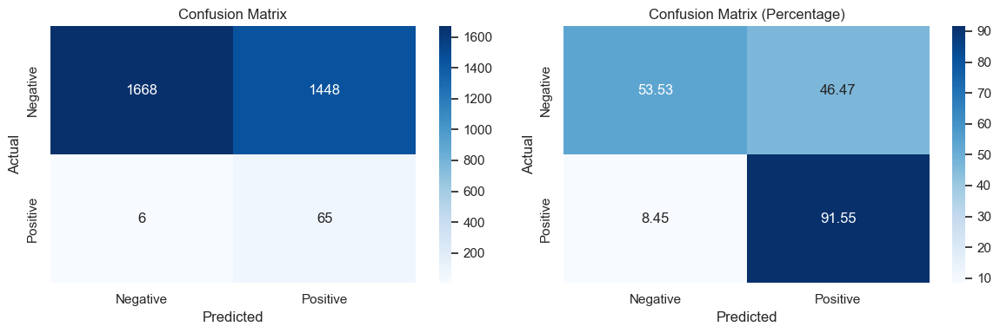

Metrics       | Testing Set
---------------------------------
Precision     | 0.0430
Recall        | 0.9155
Accuracy      | 0.5438
F1 Score      | 0.0821


In [1311]:
threshold_rf = 0.27

survival_df['Prediction RF'] = np.where(survival_df['Probability of Churn RF'] >= threshold_rf, 1, 0)

true_labels = survival_df['Actual Value'].astype(int)
predicted_labels_rf = survival_df['Prediction RF'].astype(int)

evaluate_metrics_test(true_labels, predicted_labels_rf)


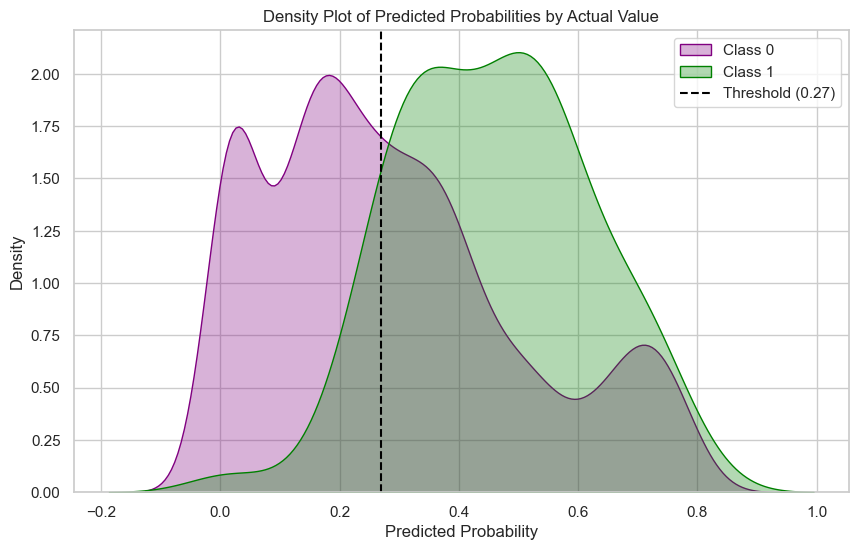

In [1312]:
sns.set(style="whitegrid")
colors = ['purple', 'green']
plt.figure(figsize=(10, 6))

for class_value, color in zip([0, 1], colors):
    sns.kdeplot( data=survival_df[survival_df["Actual Value"] == class_value], x="Probability of Churn RF", fill=True, common_norm=False, alpha=0.3, linewidth=1, color=color, label=f'Class {class_value}')

plt.axvline(x=threshold_rf, linestyle='--', color='black', label=f'Threshold ({threshold_rf})')

plt.title("Density Plot of Predicted Probabilities by Actual Value")
plt.xlabel("Predicted Probability")
plt.ylabel("Density")
plt.legend()

plt.show()

#### GRADIENT BOOSTING:

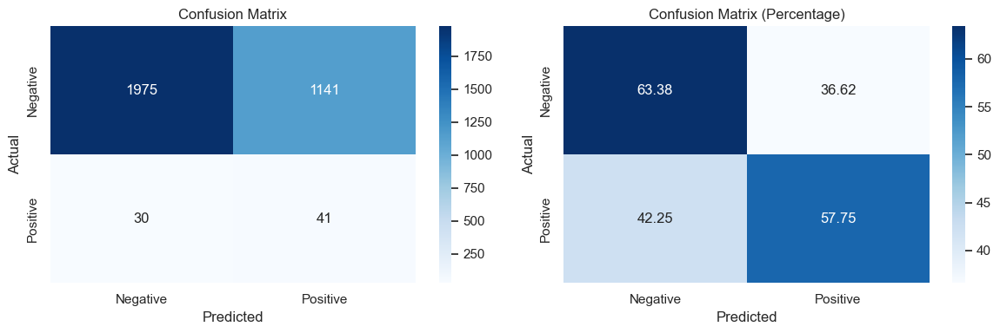

Metrics       | Testing Set
---------------------------------
Precision     | 0.0347
Recall        | 0.5775
Accuracy      | 0.6326
F1 Score      | 0.0654


In [1296]:
threshold_gb = 0.38

survival_df['Prediction GB'] = np.where(survival_df['Probability of Churn GB'] >= threshold_gb, 1, 0)

predicted_labels_gb = survival_df['Prediction GB'].astype(int)

evaluate_metrics_test(true_labels, predicted_labels_gb)

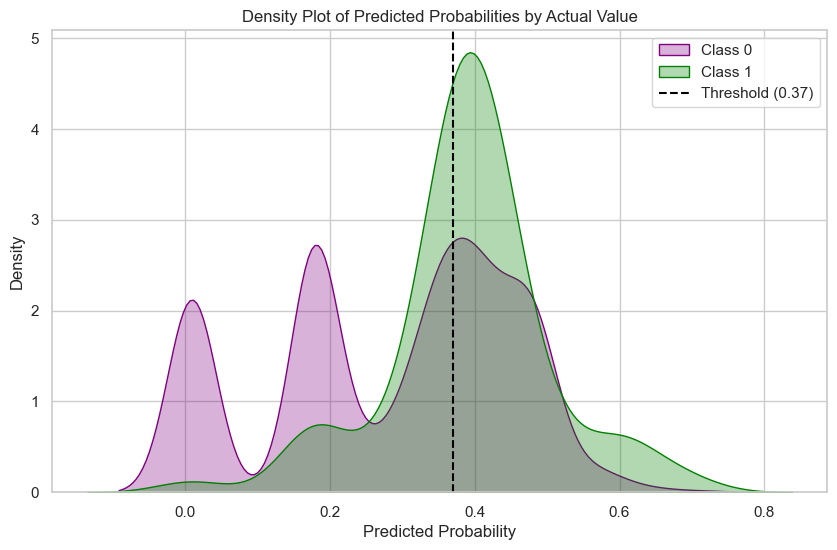

In [1297]:
sns.set(style="whitegrid")
colors = ['purple', 'green']
plt.figure(figsize=(10, 6))

for class_value, color in zip([0, 1], colors):
    sns.kdeplot( data=survival_df[survival_df["Actual Value"] == class_value], x="Probability of Churn GB", fill=True, common_norm=False, alpha=0.3, linewidth=1, color=color, label=f'Class {class_value}')

plt.axvline(x=threshold_rf, linestyle='--', color='black', label=f'Threshold ({threshold_rf})')

plt.title("Density Plot of Predicted Probabilities by Actual Value")
plt.xlabel("Predicted Probability")
plt.ylabel("Density")
plt.legend()

plt.show()

In [1298]:
a = survival_df[survival_df['SFDC Account ID'] == '00100000001VSZLAA4']
a

,SFDC Account ID,Predicting Month,Previous Retention Months,Prediction,Actual Value,Probability of Churn,Probability of Survival,Survival Probability RF,Survival Probability GB,Probability of Churn RF,Probability of Churn GB,Prediction RF,Prediction GB
2,00100000001VSZLAA4,2024-05-01,0,0,0,0.0004,0.9996,0.972716,0.990356,0.027284,0.009644,0,0


## EMBEDING MODEL:

We will now use a embeding model, where we will transform text or attributes into a dense vector of a fixed size.

Sentence Transformers are models designed to convert sentences or texts into numerical representations (vectors or embeddings) in such a way that semantically similar texts have similar embeddings.

In [1299]:
SY_embeding.head()

,SFDC Account ID,Previous Retention Months Has SY,Date,Lost Account SY,Vertical,Deployment Type,ARR Band,Geolocation,Country,Avg Usage,Avg Prev Usage,Avg Apps,RUM Enabled,SR Enabled,Has Web,Has Mobile,Has SR
0,00100000001VLvGAAW,0,2024-05-01,False,Consulting & Technology,SaaS,50-100k,NORAM,United States,0.000000e+00,0.000000e+00,4084.095238,True,False,1,0,0
1,00100000001VLvZAAW,29,2024-05-01,False,Business Services,SaaS,250-500k,NORAM,United States,2.475546e+05,2.328282e+05,822.866667,True,False,1,0,0
2,00100000001VSZLAA4,0,2024-05-01,False,Manufacturing,Managed,100-250k,NORAM,United States,0.000000e+00,0.000000e+00,673.838710,True,False,1,0,1
3,00100000001XytIAAS,41,2024-05-01,False,Insurance,Managed,500-1M,NORAM,United States,7.271231e+04,7.122638e+04,51927.333333,True,False,1,0,0
4,00100000001Y6vqAAC,41,2024-05-01,False,Banking & Finance,SaaS,250-500k,NORAM,United States,5.701470e+06,5.597699e+06,17.095238,True,True,0,0,0


Let us first convert our data into tokens, so the text is first split into smaller units called tokens:

In [1300]:
def compile_text(x):
    text = f"""SFDC Account ID: {x['SFDC Account ID']}, Previous Retention Months Has SY: {x['Previous Retention Months Has SY']}, Vertical: {x['Vertical']}, Deployment Type: {x['Deployment Type']}, ARR Band: {x['ARR Band']}, Geolocation: {x['Geolocation']}, Country: {x['Country']}, Avg Usage: {x['Avg Usage']}, Avg Prev Usage: {x['Avg Prev Usage']}, Avg Apps: {x['Avg Apps']}, RUM Enabled: {x['RUM Enabled']}, SR Enabled: {x['SR Enabled']}, Has Web: {x['Has Web']}, Has Mobile: {x['Has Mobile']}, Has SR: {x['Has SR']}"""
    return text


sentences = SY_embeding.apply(lambda x: compile_text(x), axis=1).tolist()

Let us now encode each token into a numerical representation:

In [1301]:
model = SentenceTransformer(r"sentence-transformers/paraphrase-MiniLM-L6-v2") 
output = model.encode(sentences=sentences, show_progress_bar=True, normalize_embeddings=True) 
df_embedding = pd.DataFrame(output) 
df_embedding

c:\Users\martina.tarres\AppData\Local\Programs\Python\Python39\lib\site-packages\huggingface_hub\file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


Batches:   0%|          | 0/154 [00:00<?, ?it/s]

,0,1,2,3,4,5,6,7,8,9,...,374,375,376,377,378,379,380,381,382,383
0,-0.011244,-0.044378,-0.020652,-0.025039,-0.034170,-0.013340,-0.051612,0.038592,0.039150,-0.013557,...,0.004205,-0.030498,0.007250,0.006709,0.010750,0.002898,-0.029232,-0.022407,-0.027353,0.018506
1,-0.011341,-0.051946,-0.053363,-0.035079,-0.055789,0.010950,-0.029578,0.025571,0.036917,-0.007298,...,0.009528,-0.037195,-0.009139,0.009956,0.008841,0.016421,-0.023242,-0.017400,-0.037891,-0.011506
2,-0.002106,-0.041081,0.005009,-0.027277,-0.027489,-0.041923,-0.048625,0.030726,0.011286,0.003697,...,0.013037,-0.042087,0.001892,0.004479,0.024174,0.012324,-0.045445,-0.022161,-0.019292,0.005483
3,-0.018123,-0.028563,-0.001875,-0.030845,-0.000134,-0.010076,-0.064176,0.061732,0.027633,0.007294,...,-0.005431,-0.032106,0.005930,0.008021,0.014831,0.003818,-0.016423,-0.065415,-0.025482,0.015042
4,-0.024309,-0.029613,-0.045951,-0.001935,-0.027547,-0.005180,-0.057149,0.057897,0.032142,-0.008635,...,0.045809,-0.054046,-0.006602,-0.014285,0.022301,-0.019932,-0.006240,-0.048042,-0.048546,0.007876
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4916,0.008742,-0.037548,-0.015028,-0.046614,-0.022137,-0.032321,-0.057938,0.021698,0.038092,-0.012718,...,0.022587,-0.017434,0.015806,-0.008877,0.027473,0.021977,-0.056205,-0.022787,0.003439,-0.005019
4917,0.020739,-0.015650,-0.018748,-0.054099,-0.017703,-0.040067,-0.059959,0.022656,0.044661,-0.018326,...,0.025624,-0.023732,0.010667,0.024509,0.028314,0.018871,-0.069574,-0.020968,-0.020169,-0.023031
4918,0.034004,-0.046586,-0.013394,-0.038660,-0.000144,-0.025339,-0.039132,0.046414,0.057850,-0.017081,...,0.022227,-0.027533,-0.002576,-0.008954,0.020694,0.008492,-0.054558,-0.010242,-0.011145,0.002588
4919,-0.037523,-0.038726,-0.003767,-0.008224,-0.015965,-0.018270,-0.067252,0.071667,0.021669,-0.009988,...,0.007127,-0.074437,0.005011,-0.016170,0.006657,-0.012961,-0.007699,-0.060760,-0.029552,0.001326


Let us prepare the data:

In [1302]:
X = df_embedding  
y = SY_embeding['Lost Account SY'] 

Split the data into train and test:

In [1303]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Inicialize and train the model:

In [1304]:
lgb_classifier = lgb.LGBMClassifier()
lgb_classifier.fit(X_train, y_train)
y_pred = lgb_classifier.predict(X_test)

[LightGBM] [Info] Number of positive: 1543, number of negative: 2393
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015116 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 97920
[LightGBM] [Info] Number of data points in the train set: 3936, number of used features: 384
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.392022 -> initscore=-0.438819
[LightGBM] [Info] Start training from score -0.438819


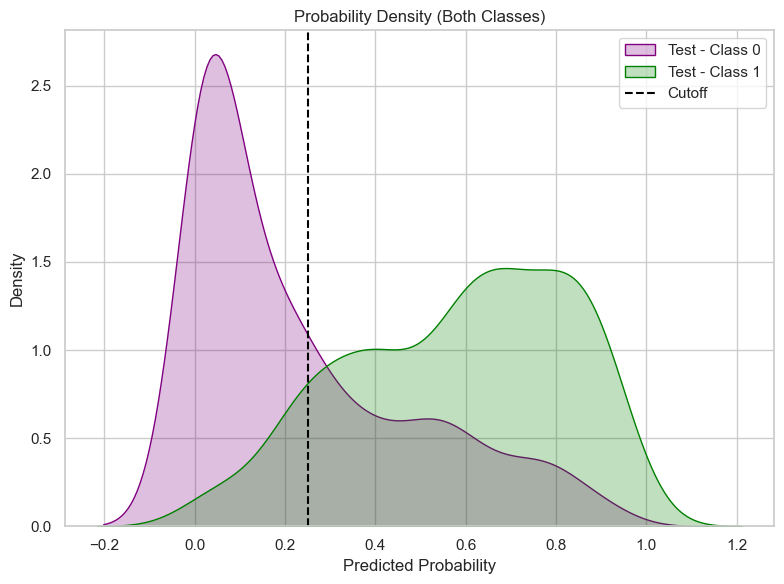

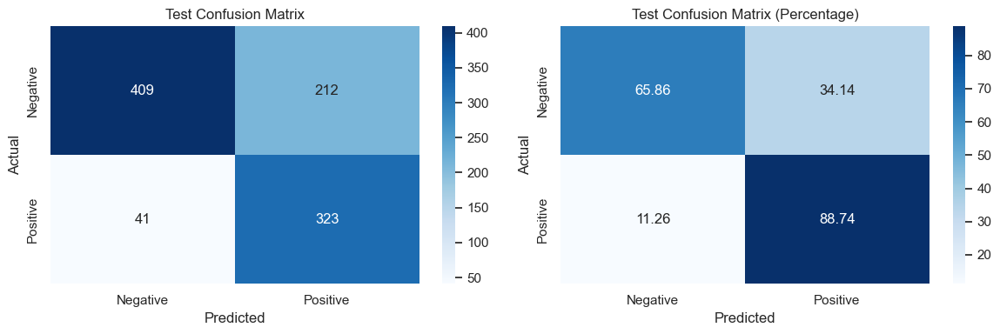

Model Evaluation Metrics:

Metrics       | Training Set | Testing Set
---------------------------------------------
Precision     | 0.9904       | 0.6037
Recall        | 1.0000       | 0.8874
Accuracy      | 0.9962       | 0.7431
F1 Score      | 0.9952       | 0.7186


In [1305]:
train_model_and_performance_eval(lgb_classifier, X_train, X_test, y_train, y_test, X, cutoff=0.25)